# Function Definitions

In [1]:
class LSTM:
    def __init__(self, input_size=340, output_size=101, n_h=100, seq_len=25, epochs=3, alpha=0.004, beta1=0.9,
                 beta2=0.999):
        self.input_size = input_size  # no. of unique characters in the training data
        self.output_size = output_size  # no. of RUL values in the dataset
        self.n_h = n_h  # no. of units in the hidden layer
        self.seq_len = seq_len  # no. of time steps, also size of mini batch
        self.epochs = epochs  # no. of training iterations
        self.alpha = alpha  # learning rate
        self.beta1 = beta1  # 1st momentum parameter
        self.beta2 = beta2  # 2nd momentum parameter

        # ----initialise weighs and biases----- #
        self.params = {}
        std = (1.0 / np.sqrt(self.input_size + self.n_h))  # Xavier initialisation

        # forget gate
        self.params["Wf"] = np.random.randn(self.n_h, self.n_h + self.input_size) * std
        self.params["bf"] = np.ones((self.n_h, 1))

        # input gate
        self.params["Wi"] = np.random.randn(self.n_h, self.n_h + self.input_size) * std
        self.params["bi"] = np.ones((self.n_h, 1))

        # cell gate
        self.params["Wc"] = np.random.randn(self.n_h, self.n_h + self.input_size) * std
        self.params["bc"] = np.ones((self.n_h, 1))

        # output gate
        self.params["Wo"] = np.random.randn(self.n_h, self.n_h + self.input_size) * std
        self.params["bo"] = np.ones((self.n_h, 1))

        # output
        self.params["Wv"] = np.random.randn(self.output_size, self.n_h) * (1.0 / np.sqrt(self.output_size))
        self.params["bv"] = np.ones((self.output_size, 1))

        # -----initialise gradients and Adam parameters-----#
        self.grads = {}
        self.adam_params = {}

        for key in self.params:
            self.grads["d" + key] = np.zeros_like(self.params[key])
            self.adam_params["m" + key] = np.zeros_like(self.params[key])
            self.adam_params["v" + key] = np.zeros_like(self.params[key])

        self.smooth_loss = -np.log(1.0 / self.output_size) * self.seq_len

        return

    def init_random_params(self):
        # ----initialise weighs and biases----- #
        self.params = {}
        std = (1.0 / np.sqrt(self.input_size + self.n_h))  # Xavier initialisation

        # forget gate
        self.params["Wf"] = np.random.randn(self.n_h, self.n_h + self.input_size) * std
        self.params["bf"] = np.ones((self.n_h, 1))

        # input gate
        self.params["Wi"] = np.random.randn(self.n_h, self.n_h + self.input_size) * std
        self.params["bi"] = np.ones((self.n_h, 1))

        # cell gate
        self.params["Wc"] = np.random.randn(self.n_h, self.n_h + self.input_size) * std
        self.params["bc"] = np.ones((self.n_h, 1))

        # output gate
        self.params["Wo"] = np.random.randn(self.n_h, self.n_h + self.input_size) * std
        self.params["bo"] = np.ones((self.n_h, 1))

        # output
        self.params["Wv"] = np.random.randn(self.output_size, self.n_h) * (1.0 / np.sqrt(self.output_size))
        self.params["bv"] = np.ones((self.output_size, 1))

        return self.params

    # Firstly, we will compute the sigmoid activation used at the forget, input and output gate layers, and the softmax
    # activation used at the output layer. Tanh activation is also needed but numpy.tanh is used instead.

    def sigmoid(self, x):
        """
        Smoothes out values in the range of [0,1]
        """
        return 1 / (1 + np.exp(-x))

    def softmax(self, x):
        """
        Normalizes output into a probability distribution
        """
        e_x = np.exp(x - np.max(x))  # max(x) subtracted for numerical stability
        # e_x = np.exp(x) # Normal softmax activation function
        return e_x / np.sum(e_x, axis=0)

    # Although exploding gradients is not as prevalent for LSTMs as for RNNs, we will limit the gradients to a
    # conservative value using clip_grads. After back propagating through all LSTM cells, we will reset the
    # gradients using reset_grads.

    def clip_grads(self):
        """
        Limits the magnitude of gradients to avoid exploding gradients
        """
        for key in self.grads:
            np.clip(self.grads[key], -5, 5, out=self.grads[key])
        return

    def reset_grads(self):
        """
        Resets gradients to zero before each backpropagation
        """
        for key in self.grads:
            self.grads[key].fill(0)
        return

    # The last utility function that we will create is for updating the weights using Adam. Note that the weights are
    # updated using the accumulated gradients for all time steps.

    def update_params(self, batch_num):
        """
        Updates parameters with Adam
        """
        for key in self.params:
            self.adam_params["m" + key] = self.adam_params["m" + key] * self.beta1 + \
                                          (1 - self.beta1) * self.grads["d" + key]
            self.adam_params["v" + key] = self.adam_params["v" + key] * self.beta2 + \
                                          (1 - self.beta2) * self.grads["d" + key] ** 2

            m_correlated = self.adam_params["m" + key] / (1 - self.beta1 ** batch_num)
            v_correlated = self.adam_params["v" + key] / (1 - self.beta2 ** batch_num)
            self.params[key] -= self.alpha * m_correlated / (np.sqrt(v_correlated) + 1e-8)
        return

    # Forward propagation for a time-step
    # We will propagate forwards through each LSTM cell using forward_step
    # A LSTM cell depends on the previous cell’s state (like Neural Networks). forward_step therefore takes as input
    # the previous hidden state (h_prev) and previous cell state (c_prev). At the beginning of every training iteration,
    # the previous hidden states are initialised to zero (i.e. at t = -1), but for subsequent time-steps, they
    # correspond to the hidden states at t-1, where t is the current time-step.

    def forward_step(self, x, h_prev, c_prev):
        """
        Implements the forward propagation for one time step
        """
        z = np.row_stack((h_prev, x))  # row_stack can also be used

        f = self.sigmoid(np.dot(self.params["Wf"], z) + self.params["bf"])  # [n_h, 1]
        i = self.sigmoid(np.dot(self.params["Wi"], z) + self.params["bi"])  # [n_h, 1]
        c_bar = np.tanh(np.dot(self.params["Wc"], z) + self.params["bc"])  # [n_h, 1]

        c = f * c_prev + i * c_bar  # [n_h, 1]
        o = self.sigmoid(np.dot(self.params["Wo"], z) + self.params["bo"])  # [n_h, 1]
        h = o * np.tanh(c)  # [n_h, 1]

        v = np.dot(self.params["Wv"], h) + self.params["bv"]  # [output_size, n_h] @ [n_h, 1] + [
        # output_size, 1] = [output_size, 1]
        y_hat = self.softmax(v)  # [output_size, 1]
        # print("y_hat from softmax function in forward step", y_hat)

        return y_hat, v, h, o, c, c_bar, i, f, z

    # Backward propagation for a time-step
    # After forward propagation, we will pass the updated values of the last LSTM cell to backward_step and propagate
    # the gradients backwards to the first LSTM cell.
    # dh_next and dc_next are initialised to zero at t = -1, but take the values of dh_prev and dc_prev that
    # backward_step returns in subsequent time steps.
    # In addition, it is worth clarifying:

    # 1. As weights are shared by all time steps, the weight gradients are accumulated.
    # 2. We are adding dh_next to dh, because as Figure 1 shows, h is branched in forward propagation in the softmax
    # output layer and the next LSTM cell, where it is concatenated with x. Therefore, there are two gradients flowing
    # back. This applies to dc as well.
    # 3. There are four gradients flowing towards the input layer from the gates, therefore dz is the summation of
    # those gradients.

    def backward_step(self, y, y_hat, dh_next, dc_next, c_prev, z, f, i, c_bar, c, o, h):
        dv = np.copy(y_hat)
        dv[y] -= 1  # dJ/dv = y_hat - y

        # print("-------------------------------------------------------------------------------------------------------")
        # print("y in back propagation:", y)
        # print("dv[y] from backward_step", dv)

        # Output bach propagation
        self.grads["dWv"] += np.dot(dv, h.T)
        self.grads["dbv"] += dv

        # Hidden state back propagation
        dh = np.dot(self.params["Wv"].T, dv)
        dh += dh_next

        do = dh * np.tanh(c)
        da_o = do * o * (1 - o)
        self.grads["dWo"] += np.dot(da_o, z.T)
        self.grads["dbo"] += da_o

        # Cell states back propagation
        dc = dh * o * (1 - np.tanh(c) ** 2)
        dc += dc_next

        dc_bar = dc * i
        da_c = dc_bar * (1 - c_bar ** 2)
        self.grads["dWc"] += np.dot(da_c, z.T)
        self.grads["dbc"] += da_c

        # Input gate back propagation
        di = dc * c_bar
        da_i = di * i * (1 - i)
        self.grads["dWi"] += np.dot(da_i, z.T)
        self.grads["dbi"] += da_i

        # Forget gate back propagation
        df = dc * c_prev
        da_f = df * f * (1 - f)
        self.grads["dWf"] += np.dot(da_f, z.T)
        self.grads["dbf"] += da_f

        # Input back propagation
        dz = (np.dot(self.params["Wf"].T, da_f)\
             + np.dot(self.params["Wi"].T, da_i)\
             + np.dot(self.params["Wo"].T, da_o) \
             + np.dot(self.params["Wc"].T, da_c))

        dh_prev = dz[:self.n_h, :]
        dc_prev = f * dc

        return dh_prev, dc_prev

    # Forward and backward propagation for all time-steps
    # The forward and backward propagation steps will be executed within the forward_backward function. Here, we iterate
    # over all time steps and store the results for each time step in dictionaries. In the forward propagation loop,
    # we also accumulate the cross entropy loss.

    # forward_backward exports the cross entropy loss of the training batch, in addition to the hidden and cell states
    # of the last layer which are fed to the first LSTM cell as hprev and prev of the next training batch.

    def forward_backward(self, x_batch, y_batch, h_prev, c_prev):
        x, z = {}, {}
        f, i, c_bar, c, o = {}, {}, {}, {}, {}
        y_hat, v, h = {}, {}, {}

        # Values at t= - 1
        h[-1] = h_prev
        c[-1] = c_prev

        loss = 0
        for t in range(self.seq_len):
            x[t] = x_batch[t].reshape(-1, 1)

            y_hat[t], v[t], h[t], o[t], c[t], c_bar[t], i[t], f[t], z[t] = \
                self.forward_step(x[t], h[t - 1], c[t - 1])

            loss += -np.log(y_hat[t][y_batch[t], 0])

        self.reset_grads()

        dh_next = np.zeros_like(h[0])
        dc_next = np.zeros_like(c[0])

        for t in reversed(range(self.seq_len)):
            dh_next, dc_next = self.backward_step(y_batch[t], y_hat[t], dh_next, dc_next, c[t - 1], z[t], f[t], i[t],
                                                  c_bar[t], c[t], o[t], h[t])

        return loss, h[self.seq_len - 1], c[self.seq_len - 1]


    def predict(self, x_batch, h_prev, c_prev):
        x, z = {}, {}
        f, i, c_bar, c, o = {}, {}, {}, {}, {}
        y_hat, v, h = {}, {}, {}
        y_hat_pred = np.zeros((self.seq_len, 1))


        # Values at t= - 1
        h[-1] = h_prev
        c[-1] = c_prev

        loss = 0
        for t in range(self.seq_len):
            x[t] = x_batch[t].reshape(-1, 1)

            y_hat[t], v[t], h[t], o[t], c[t], c_bar[t], i[t], f[t], z[t] = \
                self.forward_step(x[t], h[t - 1], c[t - 1])

            y_hat_pred[t, :] = np.argmax(y_hat[t])

            loss += -np.log(y_hat_pred[t, :])

        return y_hat_pred, loss, h[self.seq_len - 1], c[self.seq_len - 1]

    # Gradient checking: To check the backpropagation calculation, we can numerically approximate the gradient at a
    # point and compare it to the model’s back propagation gradient.

    def gradient_check(self, x, y, h_prev, c_prev, num_checks=10, delta=1e-6):
        """
        Checks the magnitude of gradients against expected approximate values
        """
        print("**********************************")
        print("Gradient check...\n")

        _, _, _ = self.forward_backward(x, y, h_prev, c_prev)
        grads_numerical = self.grads

        for key in self.params:
            print("---------", key, "---------")
            test = True

            dims = self.params[key].shape
            grad_numerical = 0
            grad_analytical = 0

            for _ in range(num_checks):  # sample 10 neurons

                idx = int(uniform(0, self.params[key].size))
                old_val = self.params[key].flat[idx]

                self.params[key].flat[idx] = old_val + delta
                J_plus, _, _ = self.forward_backward(x, y, h_prev, c_prev)

                self.params[key].flat[idx] = old_val - delta
                J_minus, _, _ = self.forward_backward(x, y, h_prev, c_prev)

                self.params[key].flat[idx] = old_val

                grad_numerical += (J_plus - J_minus) / (2 * delta)
                grad_analytical += grads_numerical["d" + key].flat[idx]

            grad_numerical /= num_checks
            grad_analytical /= num_checks

            rel_error = abs(grad_analytical - grad_numerical) / abs(grad_analytical + grad_numerical)

            if rel_error > 1e-2:
                if not (grad_analytical < 1e-6 and grad_numerical < 1e-6):
                    test = False
                    assert (test)

            print('Approximate: \t%e, Exact: \t%e =>  Error: \t%e' % (grad_numerical, grad_analytical, rel_error))
        print("\nTest successful!")
        print("**********************************\n")
        return

    # we define the function to train the model. train takes as input a sequence of input image data and outputs a list
    # of losses for each training batch (J) as well as the trained parameters.
    # In order to speed up training, we will train our data in batches. The number of batches (num_batches) is given by
    # the total number of inputs data for each agent (len(X[i])) divided by the seq_len, which is user-defined.
    # The input text goes through the following processing steps:

    # 1. Firstly, we trim the input data that don’t form a full sequence
    # 2. When we iterate over each training batch, we slice the input data in batches of size seq_len
    # 3.

    def train(self, X, Y, params ,verbose=True):
        """
        Main method of the LSTM class where training takes place
        """
        self.params = params
        J = []  # to store losses

        num_batches = len(X) // self.seq_len
        X_trimmed = X[: num_batches * self.seq_len]  # trim input to have full sequences
        Y_trimmed = Y[: num_batches * self.seq_len]  # trim output to have full sequences

        for epoch in range(self.epochs):
            h_prev = np.zeros((self.n_h, 1))
            c_prev = np.zeros((self.n_h, 1))

            for j in range(0, len(X_trimmed), self.seq_len):
                # prepare batches
                x_batch = X_trimmed[j: j + self.seq_len]
                y_batch = Y_trimmed[j: j + self.seq_len]

                loss, h_prev, c_prev = self.forward_backward(x_batch, y_batch, h_prev, c_prev)

                # smooth out loss and store in list
                self.smooth_loss = self.smooth_loss * 0.999 + loss * 0.001
                J.append(self.smooth_loss)

                # check gradients
            #    if epoch == 0 and j == 0:
            #        self.gradient_check(x_batch, y_batch, h_prev, c_prev, num_checks=10, delta=1e-7)

                self.clip_grads()

                batch_num = epoch * self.epochs + j / self.seq_len + 1
                self.update_params(batch_num)

                # print out loss
                if verbose and j == len(X_trimmed) - 2 * self.seq_len:
                    print('Epoch', epoch, '\tBatch:', j, "-", j + self.seq_len, '\tLoss:',
                          np.round(self.smooth_loss, 2))

        return J, self.params

    def test_pred(self, X_test, params):
        """
        Calculate the accuracy of the model with test data
        """
        self.params = params
        Y_hat_pred = np.ones(shape=(len(X_test), 1))

        num_batches = len(X_test) // self.seq_len
        X_trimmed = X_test[: num_batches * self.seq_len]  # trim input to have full sequences

        h_prev = np.zeros((self.n_h, 1))
        c_prev = np.zeros((self.n_h, 1))

        for j in range(0, len(X_trimmed), self.seq_len):
            # prepare batches
            x_batch = X_trimmed[j: j + self.seq_len]

            y_hat_pred, loss, h_prev, c_prev = self.predict(x_batch, h_prev, c_prev)

            Y_hat_pred[j: j + self.seq_len, :] = y_hat_pred

        return Y_hat_pred

    def test_loss(self, X_test, params, verbose=True):
        """
        Calculate the accuracy of the model with test data
        """
        self.params = params
        J_test = []  # to store losses
        Y_hat_pred = np.ones(shape=(len(X_test), 1))

        num_batches = len(X_test) // self.seq_len
        X_trimmed = X_test[: num_batches * self.seq_len]  # trim input to have full sequences

        for epoch in range(self.epochs):
            h_prev = np.zeros((self.n_h, 1))
            c_prev = np.zeros((self.n_h, 1))
            print('Epoch', epoch)
            for j in range(0, len(X_trimmed), self.seq_len):
                # prepare batches
                x_batch = X_trimmed[j: j + self.seq_len]

                y_hat_pred, loss, h_prev, c_prev = self.predict(x_batch, h_prev, c_prev)

                # smooth out loss and store in list
                self.smooth_loss = self.smooth_loss * 0.999 + loss * 0.001
                J_test.append(self.smooth_loss)

                Y_hat_pred[j: j + self.seq_len, :] = y_hat_pred

                # print out train loss
                if verbose and j == len(X_trimmed) - 2 * self.seq_len:
                    print('Epoch', epoch, '\tBatch:', j, "-", j + self.seq_len, '\tTrain_Loss:',
                          np.round(self.smooth_loss, 2))

        return J_test


In [2]:
# function to reshape features into (samples, time steps, features)
def gen_sequence(id_df, seq_length, seq_cols):
    #Only sequences that meet the window-length are considered, no padding is used. This means for testing
    #we need to drop those which are below the window-length. An alternative would be to pad sequences so that
    #we can use shorter ones """
    data_array = id_df[seq_cols].values
    num_elements = data_array.shape[0]
    for start, stop in zip(range(0, num_elements-seq_length), range(seq_length, num_elements)):
        yield data_array[start:stop, :]

In [3]:
# function to generate labels
def gen_labels(id_df, seq_length, label):
    data_array = id_df[label].values
    num_elements = data_array.shape[0]
    return data_array[seq_length:num_elements, :]

In [4]:
# function to reshape features into (samples, time steps, features)
def gen_sequence_reshape(id_df, seq_length, seq_cols):
    """ Only sequences that meet the window-length are considered, no padding is used. This means for testing
    we need to drop those which are below the window-length. An alternative would be to pad sequences so that
    we can use shorter ones """
    data_array = id_df[seq_cols].values
    num_elements = data_array.shape[0]
    for start, stop in zip(range(0, num_elements-seq_length), range(seq_length, num_elements)):
        yield data_array[start:stop, :].reshape(-1)

In [5]:
# function to reshape features into (samples, time steps, features)
def gen_sequence_reshape_append1(id_df, seq_length, seq_cols):
    """ Only sequences that meet the window-length are considered, no padding is used. This means for testing
    we need to drop those which are below the window-length. An alternative would be to pad sequences so that
    we can use shorter ones """
    data_array = id_df[seq_cols].values
    num_elements = data_array.shape[0]
    for start, stop in zip(range(0, num_elements-seq_length), range(seq_length, num_elements)):
        yield np.append(data_array[start:stop, :].reshape(-1), 1)

# Main

In [6]:

# input_size = 35 * 17 + 1 = 596 The input ton the LSTM, Z, has dimensions [input_size + n_h, 1]. Since the LSTM
# layer want to output n_h neurons, each weight should be of size [n_h, input_size + n_h] and each bias of size
# [n_h, 1]. Exception is the weight and bias at the output softmax layer (Wv, bv). The resulting output will be a
# probability distribution over all possible RUL in the dataset, therefore of size [output_size, 1], hence Wv should be
# of size [output_size, n_h] and bv of size [output_size, 1]
import numpy as np
import pickle
import os
# from model import *

# Import libraries
from random import uniform
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

import time
import math
import sys
import random

# the "resource" library is not available on windows.
# if it can be imported, we can use it! For example, while running on google colab
try:
    import resource

    print("Succesfully imported 'resource' package")
except:
    print("Failed on importing 'resource' package, continuing wihtout it!")


Failed on importing 'resource' package, continuing wihtout it!


# Read training data

In [7]:
# read training data
train_df = pd.read_csv('train_FD004.txt', sep=" ", header=None)
train_df.drop(train_df.columns[[26, 27]], axis=1, inplace=True)
train_df.columns = ['id', 'cycle', 'setting1', 'setting2', 'setting3', 's1', 's2', 's3',
                    's4', 's5', 's6', 's7', 's8', 's9', 's10', 's11', 's12', 's13', 's14',
                    's15', 's16', 's17', 's18', 's19', 's20', 's21']

### Remove the features which has low prognosability
### This part has been calculated by Matlab and the signals was selected

In [8]:
# remove the features which has low prognosability
# this part has been calculated by Matlab and the signals was selected
train_df.drop(labels=['setting3', 's1', 's5', 's6', 's10', 's16', 's18', 's19'], axis=1, inplace=True)
train_df.head()

,id,cycle,setting1,setting2,s2,s3,s4,s7,s8,s9,s11,s12,s13,s14,s15,s17,s20,s21
0,1,1,42.0049,0.8400,549.68,1343.43,1112.93,137.36,2211.86,8311.32,41.69,129.78,2387.99,8074.83,9.3335,330,10.62,6.3670
1,1,2,20.0020,0.7002,606.07,1477.61,1237.50,332.10,2323.66,8713.60,43.94,312.59,2387.73,8046.13,9.1913,361,24.37,14.6552
2,1,3,42.0038,0.8409,548.95,1343.12,1117.05,138.18,2211.92,8306.69,41.66,129.62,2387.97,8066.62,9.4007,329,10.48,6.4213
3,1,4,42.0000,0.8400,548.70,1341.24,1118.03,137.98,2211.88,8312.35,41.68,129.80,2388.02,8076.05,9.3369,328,10.54,6.4176
4,1,5,25.0063,0.6207,536.10,1255.23,1033.59,174.82,1915.22,7994.94,36.48,164.11,2028.08,7865.80,10.8366,305,14.03,8.6754


### Data Preprocessing
### Data Labeling - generate column RUL

In [9]:
# Data Preprocessing
# Data Labeling - generate column RUL
rul = pd.DataFrame(train_df.groupby('id')['cycle'].max()).reset_index()
rul.columns = ['id', 'max']
train_df = train_df.merge(rul, on=['id'], how='left')
train_df['RUL'] = train_df['max'] - train_df['cycle']
train_df.drop('max', axis=1, inplace=True)
train_df.head()

,id,cycle,setting1,setting2,s2,s3,s4,s7,s8,s9,s11,s12,s13,s14,s15,s17,s20,s21,RUL
0,1,1,42.0049,0.8400,549.68,1343.43,1112.93,137.36,2211.86,8311.32,41.69,129.78,2387.99,8074.83,9.3335,330,10.62,6.3670,320
1,1,2,20.0020,0.7002,606.07,1477.61,1237.50,332.10,2323.66,8713.60,43.94,312.59,2387.73,8046.13,9.1913,361,24.37,14.6552,319
2,1,3,42.0038,0.8409,548.95,1343.12,1117.05,138.18,2211.92,8306.69,41.66,129.62,2387.97,8066.62,9.4007,329,10.48,6.4213,318
3,1,4,42.0000,0.8400,548.70,1341.24,1118.03,137.98,2211.88,8312.35,41.68,129.80,2388.02,8076.05,9.3369,328,10.54,6.4176,317
4,1,5,25.0063,0.6207,536.10,1255.23,1033.59,174.82,1915.22,7994.94,36.48,164.11,2028.08,7865.80,10.8366,305,14.03,8.6754,316


### Generate label columns for training data

In [10]:
# generate label columns for training data
w1 = 30
w0 = 15
train_df['label1'] = np.where(train_df['RUL'] <= w1, 1, -1)
train_df['label2'] = train_df['label1']
train_df.loc[train_df['RUL'] <= w0, 'label2'] = 2
train_df.head()


,id,cycle,setting1,setting2,s2,s3,s4,s7,s8,s9,...,s12,s13,s14,s15,s17,s20,s21,RUL,label1,label2
0,1,1,42.0049,0.8400,549.68,1343.43,1112.93,137.36,2211.86,8311.32,...,129.78,2387.99,8074.83,9.3335,330,10.62,6.3670,320,-1,-1
1,1,2,20.0020,0.7002,606.07,1477.61,1237.50,332.10,2323.66,8713.60,...,312.59,2387.73,8046.13,9.1913,361,24.37,14.6552,319,-1,-1
2,1,3,42.0038,0.8409,548.95,1343.12,1117.05,138.18,2211.92,8306.69,...,129.62,2387.97,8066.62,9.4007,329,10.48,6.4213,318,-1,-1
3,1,4,42.0000,0.8400,548.70,1341.24,1118.03,137.98,2211.88,8312.35,...,129.80,2388.02,8076.05,9.3369,328,10.54,6.4176,317,-1,-1
4,1,5,25.0063,0.6207,536.10,1255.23,1033.59,174.82,1915.22,7994.94,...,164.11,2028.08,7865.80,10.8366,305,14.03,8.6754,316,-1,-1


### MinMax normalization. In the Predictive Maintenance Template , cycle column is also used for training so I will also include the cycle column. Here, I normalize the columns in the training data

In [11]:
# MinMax normalization
# In the Predictive Maintenance Template , cycle column is also used for training so we will also include the cycle
# column.
# Here, we normalize the columns in the training data.
train_df['cycle_norm'] = train_df['cycle']
cols_normalize = train_df.columns.difference(['id', 'cycle', 'RUL', 'label1', 'label2'])
min_max_scaler = MinMaxScaler()
norm_train_df = pd.DataFrame(min_max_scaler.fit_transform(train_df[cols_normalize]),
                             columns=cols_normalize,
                             index=train_df.index)
join_df = train_df[train_df.columns.difference(cols_normalize)].join(norm_train_df)
train_df = join_df.reindex(columns=train_df.columns)
train_df.head()

,id,cycle,setting1,setting2,s2,s3,s4,s7,s8,s9,...,s13,s14,s15,s17,s20,s21,RUL,label1,label2,cycle_norm
0,1,1,0.999926,0.997625,0.130347,0.272082,0.212586,0.002738,0.626983,0.269578,...,0.993111,0.550773,0.400540,0.288660,0.015473,0.015881,320,-1,-1,0.000000
1,1,2,0.476147,0.831591,0.647971,0.634407,0.511781,0.450787,0.862888,0.601411,...,0.992395,0.481761,0.351346,0.608247,0.477968,0.481487,319,-1,-1,0.001845
2,1,3,0.999900,0.998694,0.123646,0.271245,0.222481,0.004625,0.627110,0.265759,...,0.993056,0.531031,0.423787,0.278351,0.010764,0.018932,318,-1,-1,0.003690
3,1,4,0.999810,0.997625,0.121351,0.266168,0.224835,0.004164,0.627026,0.270428,...,0.993194,0.553707,0.401716,0.268041,0.012782,0.018724,317,-1,-1,0.005535
4,1,5,0.595275,0.737173,0.005691,0.033916,0.022025,0.088924,0.001055,0.008603,...,0.001405,0.048140,0.920536,0.030928,0.130172,0.145560,316,-1,-1,0.007380


### Clip Response. This step is optional. In order for network to focus on the part of the data where engines are more likely to fail (end of the engine's life), clip the responses at the threshold of 150. This makes the network treat instances with higher RUL values as equal.

In [12]:
# Clip Response
# This step is optional. In order for network to focus on the part of the data where engines are more likely to fail
# (end of the engine's life), clip the responses at the threshold of 150. This makes the network treat instances with
# higher RUL values as equal.
clipResponse = True
if clipResponse:
    rulThreshold = 100
    for i in range(len(train_df['RUL'])):
        train_df.loc[i, 'RUL'] = min(train_df.loc[i, 'RUL'], rulThreshold)
train_df.head()

train_df = train_df.sort_values(['id', 'cycle'])
train_df.head()
train_df.shape

(61249, 22)

# Read test data

In [13]:
# read test data
test_df = pd.read_csv('test_FD004.txt', sep=" ", header=None)
test_df.drop(test_df.columns[[26, 27]], axis=1, inplace=True)
test_df.columns = ['id', 'cycle', 'setting1', 'setting2', 'setting3', 's1', 's2', 's3',
                   's4', 's5', 's6', 's7', 's8', 's9', 's10', 's11', 's12', 's13', 's14',
                   's15', 's16', 's17', 's18', 's19', 's20', 's21']
test_df.head()

,id,cycle,setting1,setting2,setting3,s1,s2,s3,s4,s5,...,s12,s13,s14,s15,s16,s17,s18,s19,s20,s21
0,1,1,20.0072,0.7000,100.0,491.19,606.67,1481.04,1227.81,9.35,...,313.03,2387.78,8048.98,9.2229,0.02,362,2324,100.00,24.31,14.7007
1,1,2,24.9984,0.6200,60.0,462.54,536.22,1256.17,1031.48,7.05,...,163.61,2028.09,7863.46,10.8632,0.02,306,1915,84.93,14.36,8.5748
2,1,3,42.0000,0.8420,100.0,445.00,549.23,1340.13,1105.88,3.91,...,129.98,2387.95,8071.13,9.3960,0.02,328,2212,100.00,10.39,6.4365
3,1,4,42.0035,0.8402,100.0,445.00,549.19,1339.70,1107.26,3.91,...,129.48,2387.90,8078.89,9.3594,0.02,328,2212,100.00,10.56,6.2367
4,1,5,35.0079,0.8400,100.0,449.44,555.10,1353.04,1117.80,5.48,...,181.82,2387.87,8057.83,9.3030,0.02,333,2223,100.00,14.85,8.9326


### Remove the features which has low prognosability like train_df dataset. this part has been calculated by Matlab and the signals was selected

In [14]:
# remove the features which has low prognosability like train_df dataset
# this part has been calculated by Matlab and the signals was selected
test_df.drop(labels=['setting3', 's1', 's5', 's6', 's10', 's16', 's18', 's19'], axis=1, inplace=True)
test_df.head()

,id,cycle,setting1,setting2,s2,s3,s4,s7,s8,s9,s11,s12,s13,s14,s15,s17,s20,s21
0,1,1,20.0072,0.7000,606.67,1481.04,1227.81,332.52,2323.67,8704.98,43.83,313.03,2387.78,8048.98,9.2229,362,24.31,14.7007
1,1,2,24.9984,0.6200,536.22,1256.17,1031.48,174.46,1915.21,7999.94,36.11,163.61,2028.09,7863.46,10.8632,306,14.36,8.5748
2,1,3,42.0000,0.8420,549.23,1340.13,1105.88,137.34,2211.93,8305.38,41.52,129.98,2387.95,8071.13,9.3960,328,10.39,6.4365
3,1,4,42.0035,0.8402,549.19,1339.70,1107.26,137.23,2211.89,8301.00,41.73,129.48,2387.90,8078.89,9.3594,328,10.56,6.2367
4,1,5,35.0079,0.8400,555.10,1353.04,1117.80,192.94,2222.71,8331.05,41.32,181.82,2387.87,8057.83,9.3030,333,14.85,8.9326


### Read ground truth data

In [15]:
truth_df = pd.read_csv('RUL_FD004.txt', sep=" ", header=None)
truth_df.drop(truth_df.columns[[1]], axis=1, inplace=True)
truth_df.head()

,0
0,22
1,39
2,107
3,75
4,149


### Next, I prepare the test data. I first normalize the test data using the parameters from the MinMax normalization applied on the training data.

In [16]:
# Next, we prepare the test data. We first normalize the test data using the parameters from the MinMax normalization
# applied on the training data.
test_df['cycle_norm'] = test_df['cycle']
norm_test_df = pd.DataFrame(min_max_scaler.transform(test_df[cols_normalize]),
                            columns=cols_normalize,
                            index=test_df.index)
test_join_df = test_df[test_df.columns.difference(cols_normalize)].join(norm_test_df)
test_df = test_join_df.reindex(columns=test_df.columns)
test_df = test_df.reset_index(drop=True)
test_df.head()

,id,cycle,setting1,setting2,s2,s3,s4,s7,s8,s9,s11,s12,s13,s14,s15,s17,s20,s21,cycle_norm
0,1,1,0.476271,0.831354,0.653479,0.643669,0.488507,0.451753,0.862909,0.594300,0.632305,0.451439,0.992533,0.488614,0.362278,0.618557,0.475950,0.484043,0.000000
1,1,2,0.595087,0.736342,0.006793,0.036454,0.016957,0.088096,0.001034,0.012728,0.005682,0.086270,0.001433,0.042513,0.929738,0.041237,0.141271,0.139909,0.001845
2,1,3,0.999810,1.000000,0.126216,0.263171,0.195653,0.002692,0.627131,0.264679,0.444805,0.004081,0.993001,0.541876,0.422161,0.268041,0.007736,0.019786,0.003690
3,1,4,0.999893,0.997862,0.125849,0.262010,0.198967,0.002439,0.627047,0.261066,0.461851,0.002859,0.992863,0.560536,0.409500,0.268041,0.013454,0.008561,0.005535
4,1,5,0.833363,0.997625,0.180099,0.298031,0.224282,0.130614,0.649878,0.285853,0.428571,0.130774,0.992781,0.509895,0.389988,0.319588,0.157753,0.160009,0.007380


### Next, I use the ground truth dataset to generate labels for the test data.
### Generate column max for test data

In [17]:
# Next, we use the ground truth dataset to generate labels for the test data.
# generate column max for test data
rul = pd.DataFrame(test_df.groupby('id')['cycle'].max()).reset_index()
rul.columns = ['id', 'max']
truth_df.columns = ['more']
truth_df['id'] = truth_df.index + 1
truth_df['max'] = rul['max'] + truth_df['more']
truth_df.drop('more', axis=1, inplace=True)

### Generate RUL for test data

In [18]:
test_df = test_df.merge(truth_df, on=['id'], how='left')
test_df['RUL'] = test_df['max'] - test_df['cycle']
test_df.drop('max', axis=1, inplace=True)
test_df.head()

,id,cycle,setting1,setting2,s2,s3,s4,s7,s8,s9,s11,s12,s13,s14,s15,s17,s20,s21,cycle_norm,RUL
0,1,1,0.476271,0.831354,0.653479,0.643669,0.488507,0.451753,0.862909,0.594300,0.632305,0.451439,0.992533,0.488614,0.362278,0.618557,0.475950,0.484043,0.000000,251
1,1,2,0.595087,0.736342,0.006793,0.036454,0.016957,0.088096,0.001034,0.012728,0.005682,0.086270,0.001433,0.042513,0.929738,0.041237,0.141271,0.139909,0.001845,250
2,1,3,0.999810,1.000000,0.126216,0.263171,0.195653,0.002692,0.627131,0.264679,0.444805,0.004081,0.993001,0.541876,0.422161,0.268041,0.007736,0.019786,0.003690,249
3,1,4,0.999893,0.997862,0.125849,0.262010,0.198967,0.002439,0.627047,0.261066,0.461851,0.002859,0.992863,0.560536,0.409500,0.268041,0.013454,0.008561,0.005535,248
4,1,5,0.833363,0.997625,0.180099,0.298031,0.224282,0.130614,0.649878,0.285853,0.428571,0.130774,0.992781,0.509895,0.389988,0.319588,0.157753,0.160009,0.007380,247


### Clip Response on test dataset

In [19]:
# Clip Response on test dataset This step is optional. In order for network to focus on the part of the data
# where engines are more likely to fail (end of the engine's life), clip the responses at the threshold of 150.
# This makes the network treat instances with higher RUL values as equal.
clipResponse_dataset = True
if clipResponse_dataset:
    rulThreshold = 100
    for i in range(len(test_df['RUL'])):
        test_df.loc[i, 'RUL'] = min(test_df.loc[i, 'RUL'], rulThreshold)
test_df.head()

,id,cycle,setting1,setting2,s2,s3,s4,s7,s8,s9,s11,s12,s13,s14,s15,s17,s20,s21,cycle_norm,RUL
0,1,1,0.476271,0.831354,0.653479,0.643669,0.488507,0.451753,0.862909,0.594300,0.632305,0.451439,0.992533,0.488614,0.362278,0.618557,0.475950,0.484043,0.000000,100
1,1,2,0.595087,0.736342,0.006793,0.036454,0.016957,0.088096,0.001034,0.012728,0.005682,0.086270,0.001433,0.042513,0.929738,0.041237,0.141271,0.139909,0.001845,100
2,1,3,0.999810,1.000000,0.126216,0.263171,0.195653,0.002692,0.627131,0.264679,0.444805,0.004081,0.993001,0.541876,0.422161,0.268041,0.007736,0.019786,0.003690,100
3,1,4,0.999893,0.997862,0.125849,0.262010,0.198967,0.002439,0.627047,0.261066,0.461851,0.002859,0.992863,0.560536,0.409500,0.268041,0.013454,0.008561,0.005535,100
4,1,5,0.833363,0.997625,0.180099,0.298031,0.224282,0.130614,0.649878,0.285853,0.428571,0.130774,0.992781,0.509895,0.389988,0.319588,0.157753,0.160009,0.007380,100


### Generate label columns w0 and w1 for test data

In [20]:
test_df['label1'] = np.where(test_df['RUL'] <= w1, 1, -1)
test_df['label2'] = test_df['label1']
test_df.loc[test_df['RUL'] <= w0, 'label2'] = 2
test_df.head()
test_df.shape

(41214, 22)

In [21]:
column_order = ['id', 'cycle', 'setting1', 'setting2', 's2', 's3', 's4', 's7', 's8', 's9', 's11', 's12', 's13',
            's14', 's15', 's17', 's20', 's21', 'RUL', 'label1', 'label2', 'cycle_norm']

test_df = test_df.reindex(columns = column_order)

### Sliding window over the input data

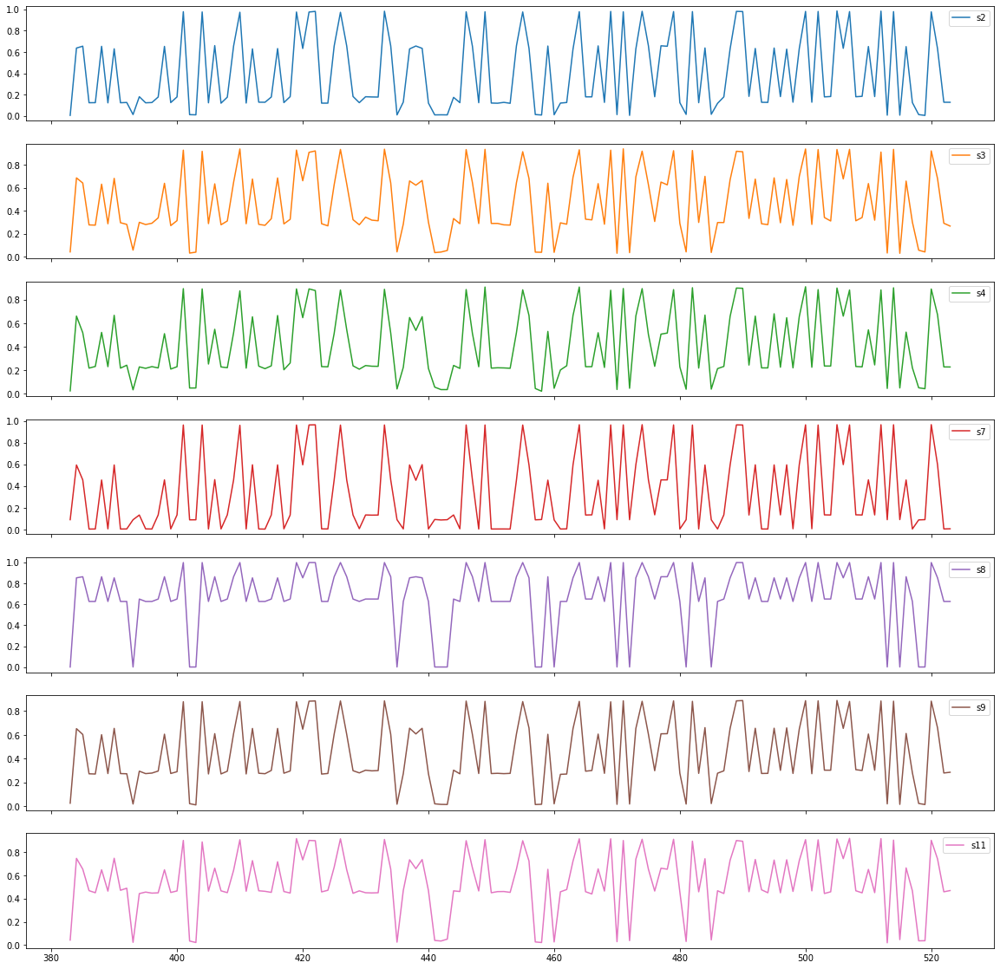

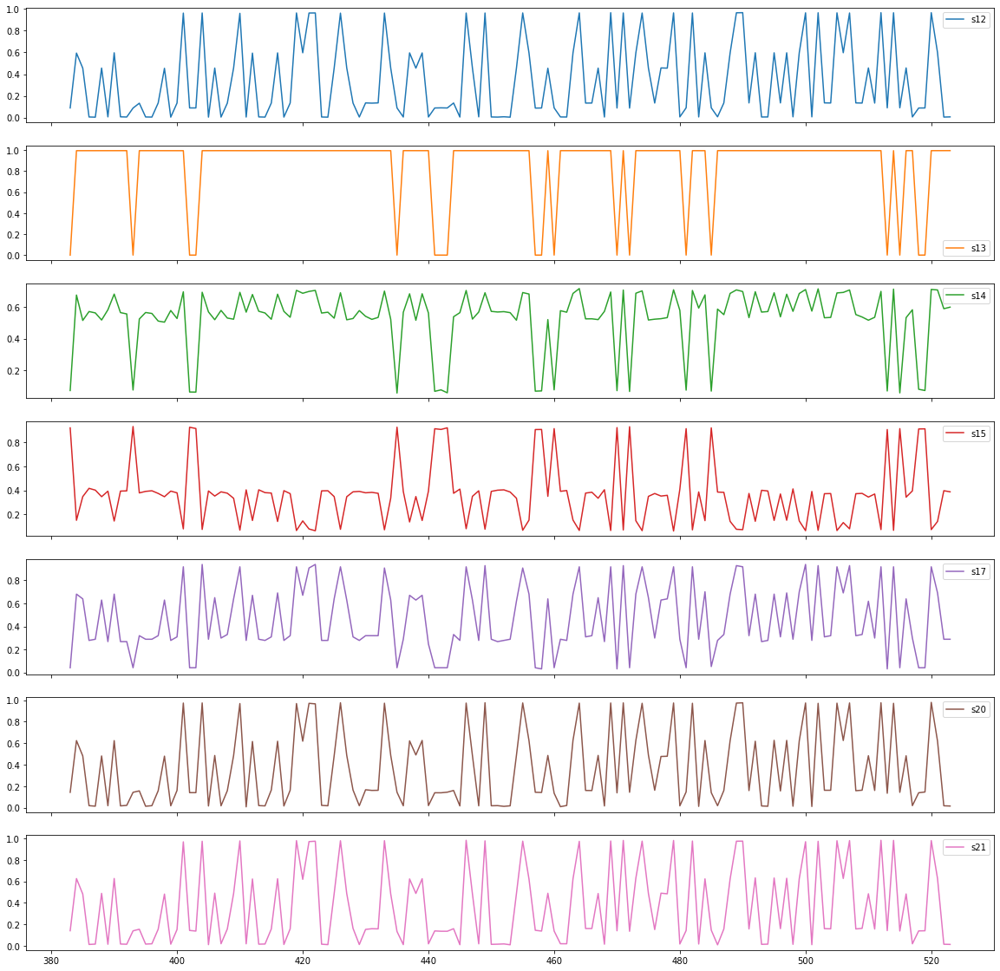

In [22]:
sequence_length = 35
sequence_length_ = 20  # length of sequence for each agent distraction
engine_id3 = test_df[test_df['id'] == 3]
engine_id3_50cycleWindow = engine_id3[engine_id3['RUL'] <= engine_id3['RUL'].min() + 50]
cols1 = ['s2', 's3', 's4', 's7', 's8', 's9', 's11']
engine_id3_50cycleWindow1 = engine_id3_50cycleWindow[cols1]
cols2 = ['s12', 's13', 's14', 's15', 's17', 's20', 's21']
engine_id3_50cycleWindow2 = engine_id3_50cycleWindow[cols2]

# plotting sensor data for engine ID 3 prior to a failure point - sensors 2, 3, 4, 7, 8, 9, 11
ax1 = engine_id3_50cycleWindow1.plot(subplots=True, sharex=True, figsize=(20,20))

# plotting sensor data for engine ID 3 prior to a failure point - sensors 12, 13, 14, 15, 17, 20, 21
ax2 = engine_id3_50cycleWindow2.plot(subplots=True, sharex=True, figsize=(20,20))

## Generate Train Data

In [23]:
# pick the feature columns
sensor_cols = ['s2', 's3', 's4', 's7', 's8', 's9', 's11', 's12', 's13', 's14', 's15', 's17', 's20', 's21']
sequence_cols = ['setting1', 'setting2', 'cycle_norm']
sequence_cols.extend(sensor_cols)

### generator train data for the sequences for each agent and save in a list

In [24]:
# Train data
# generator train data for the sequences for each agent and save in a list
data_array_ = {}
for i in train_df['id'].unique():
    seq_gen_ = (list(gen_sequence(train_df[train_df['id'] == id], sequence_length_, sequence_cols)) for id in [i])
    data_array_[i] = np.concatenate(list(seq_gen_)).astype(np.float32)

### generate train labels for each agent and save in a list

In [25]:
label_array_ = {}
# generate train labels for each agent and save in a list
for i in train_df['id'].unique():
    label_gen_ = (gen_labels(train_df[train_df['id'] == id], sequence_length_, ['label1']) for id in [i])
    label_array_[i] = np.concatenate(list(label_gen_)).astype(np.float32)

### Generate train labels based on RUL for each agent and save in a list

In [26]:
label_array_rul_ = {}
# Generate train labels based on RUL for each agent and save in a list
for i in train_df['id'].unique():
    label_gen_rul_ = (gen_labels(train_df[train_df['id'] == id], sequence_length_, ['RUL']) for id in [i])
    label_array_rul_[i] = np.concatenate(list(label_gen_rul_)).astype(np.int)

C:\Users\alibei\AppData\Local\Temp/ipykernel_8068/1920039281.py:5: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  label_array_rul_[i] = np.concatenate(list(label_gen_rul_)).astype(np.int)


In [27]:
# Find the minimum length of dataset for each agent
min_length = label_array_rul_[1].shape[0]
for i in train_df['id'].unique():
    if min_length > label_array_rul_[i].shape[0]:
        min_length = label_array_rul_[i].shape[0]

In [28]:
# set all length of lists to the minimum length of arrays
for i in train_df['id'].unique():
    label_array_rul_[i] = label_array_rul_[i][len(label_array_rul_[i]) - min_length:, :]
    label_array_[i] = label_array_[i][len(label_array_[i]) - min_length:, :]
    data_array_[i] = data_array_[i][len(data_array_[i]) - min_length:, :, :]
    
print(len(data_array_))
print(len(label_array_))
print(len(label_array_rul_))

print(data_array_[1].shape)
print(label_array_[1].shape)
print(label_array_rul_[1].shape)

249
249
249
(108, 20, 17)
(108, 1)
(108, 1)


### generator test data for the sequences for each agent and save in a list

In [29]:
# Test Data
# generator test data for the sequences for each agent and save in a list
seq_array_test_ = {}
for i in test_df['id'].unique():
    seq_gen_test_ = (list(gen_sequence(test_df[test_df['id'] == id], sequence_length_, sequence_cols)) for id in
                     [i])
    seq_array_test_[i] = np.concatenate(list(seq_gen_test_)).astype(np.float32)

### generate test labels for each agent and save in a list

In [30]:
label_array_test_ = {}
# generatAe test labels for each agent and save in a list
for i in test_df['id'].unique():
    label_gen_test_ = (gen_labels(test_df[test_df['id'] == id], sequence_length_, ['label1']) for id in [i])
    label_array_test_[i] = np.concatenate(list(label_gen_test_)).astype(np.float32)

### Generate test labels based on RUL for each agent and save in a list

In [31]:
label_array_test_rul_ = {}
# Generate test labels based on RUL for each agent and save in a list
for i in test_df['id'].unique():
    label_gen_test_rul_ = (gen_labels(test_df[test_df['id'] == id], sequence_length_, ['RUL']) for id in [i])
    label_array_test_rul_[i] = np.concatenate(list(label_gen_test_rul_)).astype(np.int)

C:\Users\alibei\AppData\Local\Temp/ipykernel_8068/500274830.py:5: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  label_array_test_rul_[i] = np.concatenate(list(label_gen_test_rul_)).astype(np.int)


### Select part of the train set which has the length longer than min_length

In [32]:
seq_array_test_tmp = {}
label_array_test_tmp = {}
label_array_test_rul_tmp = {}
for i in test_df['id'].unique():
    tmp = seq_array_test_[i].shape[0]
    if tmp >= min_length:
        seq_array_test_tmp[i] = seq_array_test_[i]
        label_array_test_tmp[i] = label_array_test_[i]
        label_array_test_rul_tmp[i] = label_array_test_rul_[i]

###  change the key of dictionary and indexing it based on increasing number from 1

In [33]:
# change the key of dictionary and indexing it based on increasing number from 1
seq_array_test_ = {}
label_array_test_ = {}
label_array_test_rul_ = {}
j = 1
for i in seq_array_test_tmp.keys():
    seq_array_test_[j] = seq_array_test_tmp[i]
    label_array_test_[j] = label_array_test_tmp[i]
    label_array_test_rul_[j] = label_array_test_rul_tmp[i]
    j += 1

del seq_array_test_tmp
del label_array_test_tmp
del label_array_test_rul_tmp

# set all length of test lists to the minimum length of arrays (min_length)
for i in seq_array_test_.keys():
    label_array_test_rul_[i] = label_array_test_rul_[i][len(label_array_test_rul_[i]) - min_length:, :]
    label_array_test_[i] = label_array_test_[i][len(label_array_test_[i]) - min_length:, :]
    seq_array_test_[i] = seq_array_test_[i][len(seq_array_test_[i]) - min_length:, :, :]

print(len(seq_array_test_))
print(len(label_array_test_))
print(len(label_array_test_rul_))

print(seq_array_test_[1].shape)
print(label_array_test_[1].shape)
print(label_array_test_rul_[1].shape)

X = {}
Y = {}
for i in data_array_.keys():
    X[i - 1] = data_array_[i].reshape(min_length, -1)
    Y[i - 1] = label_array_rul_[i]

X_test = {}
Y_test = {}
for i in seq_array_test_.keys():
    X_test[i - 1] = seq_array_test_[i].reshape(min_length, -1)
    Y_test[i - 1] = label_array_test_rul_[i]

151
151
151
(108, 20, 17)
(108, 1)
(108, 1)


## The main distributed LSTM model for 10 worker, in case of master and workers

In [34]:
num_workers = 10
array_params = [dict() for i in range(num_workers)]
J = [list() for i in range(num_workers)]

worker_model = {}
for worker_i in range(num_workers):
    worker_model[worker_i] = LSTM()
    array_params[worker_i] = worker_model[worker_i].init_random_params()

iteration_epoch = 3000
for i in range(iteration_epoch):
    print("Number of iteration:", i, "/from", iteration_epoch)
    for worker_i in range(num_workers):
        cost, array_params[worker_i] = worker_model[worker_i].train(X[worker_i], Y[worker_i],
                                                                    array_params[worker_i])
        J[worker_i].append(cost)

    for key in array_params[0]:  # Fed average
        tmp = array_params[0][key]
        for worker_i in range(1, num_workers):
            tmp = tmp + array_params[worker_i][key]
        for worker_i in range(num_workers):
            array_params[worker_i][key] = (1 / num_workers) * tmp  # Distribute aggregate parameters to all workers

Number of iteration: 0 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [115.41]
Epoch 1 	Batch: 50 - 75 	Loss: [115.41]
Epoch 2 	Batch: 50 - 75 	Loss: [115.39]
Epoch 0 	Batch: 50 - 75 	Loss: [115.4]
Epoch 1 	Batch: 50 - 75 	Loss: [115.4]
Epoch 2 	Batch: 50 - 75 	Loss: [115.38]
Epoch 0 	Batch: 50 - 75 	Loss: [115.41]
Epoch 1 	Batch: 50 - 75 	Loss: [115.4]
Epoch 2 	Batch: 50 - 75 	Loss: [115.38]
Epoch 0 	Batch: 50 - 75 	Loss: [115.41]
Epoch 1 	Batch: 50 - 75 	Loss: [115.41]
Epoch 2 	Batch: 50 - 75 	Loss: [115.39]
Epoch 0 	Batch: 50 - 75 	Loss: [115.41]
Epoch 1 	Batch: 50 - 75 	Loss: [115.4]
Epoch 2 	Batch: 50 - 75 	Loss: [115.38]
Epoch 0 	Batch: 50 - 75 	Loss: [115.4]
Epoch 1 	Batch: 50 - 75 	Loss: [115.4]
Epoch 2 	Batch: 50 - 75 	Loss: [115.39]
Epoch 0 	Batch: 50 - 75 	Loss: [115.41]
Epoch 1 	Batch: 50 - 75 	Loss: [115.41]
Epoch 2 	Batch: 50 - 75 	Loss: [115.39]
Epoch 0 	Batch: 50 - 75 	Loss: [115.41]
Epoch 1 	Batch: 50 - 75 	Loss: [115.41]
Epoch 2 	Batch: 50 - 75 	Loss: [115.39]
Epoch 0 	Bat

Epoch 0 	Batch: 50 - 75 	Loss: [115.12]
Epoch 1 	Batch: 50 - 75 	Loss: [115.1]
Epoch 2 	Batch: 50 - 75 	Loss: [115.08]
Epoch 0 	Batch: 50 - 75 	Loss: [115.12]
Epoch 1 	Batch: 50 - 75 	Loss: [115.1]
Epoch 2 	Batch: 50 - 75 	Loss: [115.07]
Epoch 0 	Batch: 50 - 75 	Loss: [115.11]
Epoch 1 	Batch: 50 - 75 	Loss: [115.08]
Epoch 2 	Batch: 50 - 75 	Loss: [115.06]
Number of iteration: 7 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [115.05]
Epoch 1 	Batch: 50 - 75 	Loss: [115.02]
Epoch 2 	Batch: 50 - 75 	Loss: [115.]
Epoch 0 	Batch: 50 - 75 	Loss: [115.04]
Epoch 1 	Batch: 50 - 75 	Loss: [115.02]
Epoch 2 	Batch: 50 - 75 	Loss: [114.99]
Epoch 0 	Batch: 50 - 75 	Loss: [115.01]
Epoch 1 	Batch: 50 - 75 	Loss: [114.99]
Epoch 2 	Batch: 50 - 75 	Loss: [114.95]
Epoch 0 	Batch: 50 - 75 	Loss: [115.06]
Epoch 1 	Batch: 50 - 75 	Loss: [115.04]
Epoch 2 	Batch: 50 - 75 	Loss: [115.01]
Epoch 0 	Batch: 50 - 75 	Loss: [115.03]
Epoch 1 	Batch: 50 - 75 	Loss: [115.]
Epoch 2 	Batch: 50 - 75 	Loss: [114.97]
Epoch 0 	Bat

Epoch 0 	Batch: 50 - 75 	Loss: [114.44]
Epoch 1 	Batch: 50 - 75 	Loss: [114.4]
Epoch 2 	Batch: 50 - 75 	Loss: [114.35]
Epoch 0 	Batch: 50 - 75 	Loss: [114.67]
Epoch 1 	Batch: 50 - 75 	Loss: [114.65]
Epoch 2 	Batch: 50 - 75 	Loss: [114.62]
Epoch 0 	Batch: 50 - 75 	Loss: [114.51]
Epoch 1 	Batch: 50 - 75 	Loss: [114.48]
Epoch 2 	Batch: 50 - 75 	Loss: [114.43]
Epoch 0 	Batch: 50 - 75 	Loss: [114.42]
Epoch 1 	Batch: 50 - 75 	Loss: [114.38]
Epoch 2 	Batch: 50 - 75 	Loss: [114.33]
Epoch 0 	Batch: 50 - 75 	Loss: [114.43]
Epoch 1 	Batch: 50 - 75 	Loss: [114.39]
Epoch 2 	Batch: 50 - 75 	Loss: [114.34]
Number of iteration: 14 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [114.4]
Epoch 1 	Batch: 50 - 75 	Loss: [114.36]
Epoch 2 	Batch: 50 - 75 	Loss: [114.31]
Epoch 0 	Batch: 50 - 75 	Loss: [114.36]
Epoch 1 	Batch: 50 - 75 	Loss: [114.33]
Epoch 2 	Batch: 50 - 75 	Loss: [114.28]
Epoch 0 	Batch: 50 - 75 	Loss: [114.24]
Epoch 1 	Batch: 50 - 75 	Loss: [114.2]
Epoch 2 	Batch: 50 - 75 	Loss: [114.14]
Epoch 0 

Epoch 0 	Batch: 50 - 75 	Loss: [113.15]
Epoch 1 	Batch: 50 - 75 	Loss: [113.07]
Epoch 2 	Batch: 50 - 75 	Loss: [112.97]
Epoch 0 	Batch: 50 - 75 	Loss: [113.37]
Epoch 1 	Batch: 50 - 75 	Loss: [113.3]
Epoch 2 	Batch: 50 - 75 	Loss: [113.23]
Epoch 0 	Batch: 50 - 75 	Loss: [113.11]
Epoch 1 	Batch: 50 - 75 	Loss: [113.02]
Epoch 2 	Batch: 50 - 75 	Loss: [112.93]
Epoch 0 	Batch: 50 - 75 	Loss: [113.27]
Epoch 1 	Batch: 50 - 75 	Loss: [113.19]
Epoch 2 	Batch: 50 - 75 	Loss: [113.12]
Epoch 0 	Batch: 50 - 75 	Loss: [114.07]
Epoch 1 	Batch: 50 - 75 	Loss: [114.04]
Epoch 2 	Batch: 50 - 75 	Loss: [114.02]
Epoch 0 	Batch: 50 - 75 	Loss: [113.45]
Epoch 1 	Batch: 50 - 75 	Loss: [113.38]
Epoch 2 	Batch: 50 - 75 	Loss: [113.32]
Epoch 0 	Batch: 50 - 75 	Loss: [113.15]
Epoch 1 	Batch: 50 - 75 	Loss: [113.08]
Epoch 2 	Batch: 50 - 75 	Loss: [113.]
Epoch 0 	Batch: 50 - 75 	Loss: [113.3]
Epoch 1 	Batch: 50 - 75 	Loss: [113.22]
Epoch 2 	Batch: 50 - 75 	Loss: [113.14]
Number of iteration: 21 /from 3000
Epoch 0 	

Epoch 1 	Batch: 50 - 75 	Loss: [111.72]
Epoch 2 	Batch: 50 - 75 	Loss: [111.62]
Number of iteration: 27 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [112.2]
Epoch 1 	Batch: 50 - 75 	Loss: [112.11]
Epoch 2 	Batch: 50 - 75 	Loss: [112.02]
Epoch 0 	Batch: 50 - 75 	Loss: [112.08]
Epoch 1 	Batch: 50 - 75 	Loss: [111.98]
Epoch 2 	Batch: 50 - 75 	Loss: [111.88]
Epoch 0 	Batch: 50 - 75 	Loss: [111.55]
Epoch 1 	Batch: 50 - 75 	Loss: [111.48]
Epoch 2 	Batch: 50 - 75 	Loss: [111.37]
Epoch 0 	Batch: 50 - 75 	Loss: [111.76]
Epoch 1 	Batch: 50 - 75 	Loss: [111.67]
Epoch 2 	Batch: 50 - 75 	Loss: [111.57]
Epoch 0 	Batch: 50 - 75 	Loss: [111.33]
Epoch 1 	Batch: 50 - 75 	Loss: [111.23]
Epoch 2 	Batch: 50 - 75 	Loss: [111.12]
Epoch 0 	Batch: 50 - 75 	Loss: [111.77]
Epoch 1 	Batch: 50 - 75 	Loss: [111.68]
Epoch 2 	Batch: 50 - 75 	Loss: [111.59]
Epoch 0 	Batch: 50 - 75 	Loss: [113.25]
Epoch 1 	Batch: 50 - 75 	Loss: [113.23]
Epoch 2 	Batch: 50 - 75 	Loss: [113.17]
Epoch 0 	Batch: 50 - 75 	Loss: [111.9]
Epoch 1

Epoch 0 	Batch: 50 - 75 	Loss: [110.12]
Epoch 1 	Batch: 50 - 75 	Loss: [110.02]
Epoch 2 	Batch: 50 - 75 	Loss: [109.91]
Epoch 0 	Batch: 50 - 75 	Loss: [109.61]
Epoch 1 	Batch: 50 - 75 	Loss: [109.49]
Epoch 2 	Batch: 50 - 75 	Loss: [109.38]
Epoch 0 	Batch: 50 - 75 	Loss: [109.55]
Epoch 1 	Batch: 50 - 75 	Loss: [109.43]
Epoch 2 	Batch: 50 - 75 	Loss: [109.31]
Number of iteration: 34 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [110.15]
Epoch 1 	Batch: 50 - 75 	Loss: [110.06]
Epoch 2 	Batch: 50 - 75 	Loss: [109.98]
Epoch 0 	Batch: 50 - 75 	Loss: [110.]
Epoch 1 	Batch: 50 - 75 	Loss: [109.89]
Epoch 2 	Batch: 50 - 75 	Loss: [109.79]
Epoch 0 	Batch: 50 - 75 	Loss: [109.25]
Epoch 1 	Batch: 50 - 75 	Loss: [109.19]
Epoch 2 	Batch: 50 - 75 	Loss: [109.16]
Epoch 0 	Batch: 50 - 75 	Loss: [109.74]
Epoch 1 	Batch: 50 - 75 	Loss: [109.64]
Epoch 2 	Batch: 50 - 75 	Loss: [109.52]
Epoch 0 	Batch: 50 - 75 	Loss: [109.1]
Epoch 1 	Batch: 50 - 75 	Loss: [109.]
Epoch 2 	Batch: 50 - 75 	Loss: [108.88]
Epoch 0 	B

Epoch 0 	Batch: 50 - 75 	Loss: [107.05]
Epoch 1 	Batch: 50 - 75 	Loss: [106.96]
Epoch 2 	Batch: 50 - 75 	Loss: [106.85]
Epoch 0 	Batch: 50 - 75 	Loss: [107.87]
Epoch 1 	Batch: 50 - 75 	Loss: [107.74]
Epoch 2 	Batch: 50 - 75 	Loss: [107.62]
Epoch 0 	Batch: 50 - 75 	Loss: [110.65]
Epoch 1 	Batch: 50 - 75 	Loss: [110.63]
Epoch 2 	Batch: 50 - 75 	Loss: [110.59]
Epoch 0 	Batch: 50 - 75 	Loss: [107.78]
Epoch 1 	Batch: 50 - 75 	Loss: [107.7]
Epoch 2 	Batch: 50 - 75 	Loss: [107.58]
Epoch 0 	Batch: 50 - 75 	Loss: [107.35]
Epoch 1 	Batch: 50 - 75 	Loss: [107.24]
Epoch 2 	Batch: 50 - 75 	Loss: [107.15]
Epoch 0 	Batch: 50 - 75 	Loss: [107.56]
Epoch 1 	Batch: 50 - 75 	Loss: [107.44]
Epoch 2 	Batch: 50 - 75 	Loss: [107.31]
Number of iteration: 41 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [108.07]
Epoch 1 	Batch: 50 - 75 	Loss: [107.95]
Epoch 2 	Batch: 50 - 75 	Loss: [107.82]
Epoch 0 	Batch: 50 - 75 	Loss: [107.83]
Epoch 1 	Batch: 50 - 75 	Loss: [107.74]
Epoch 2 	Batch: 50 - 75 	Loss: [107.63]
Epoch 

Epoch 0 	Batch: 50 - 75 	Loss: [105.33]
Epoch 1 	Batch: 50 - 75 	Loss: [105.19]
Epoch 2 	Batch: 50 - 75 	Loss: [105.05]
Epoch 0 	Batch: 50 - 75 	Loss: [105.6]
Epoch 1 	Batch: 50 - 75 	Loss: [105.49]
Epoch 2 	Batch: 50 - 75 	Loss: [105.38]
Epoch 0 	Batch: 50 - 75 	Loss: [104.57]
Epoch 1 	Batch: 50 - 75 	Loss: [104.45]
Epoch 2 	Batch: 50 - 75 	Loss: [104.31]
Epoch 0 	Batch: 50 - 75 	Loss: [105.38]
Epoch 1 	Batch: 50 - 75 	Loss: [105.25]
Epoch 2 	Batch: 50 - 75 	Loss: [105.13]
Epoch 0 	Batch: 50 - 75 	Loss: [108.99]
Epoch 1 	Batch: 50 - 75 	Loss: [108.88]
Epoch 2 	Batch: 50 - 75 	Loss: [108.76]
Epoch 0 	Batch: 50 - 75 	Loss: [105.36]
Epoch 1 	Batch: 50 - 75 	Loss: [105.27]
Epoch 2 	Batch: 50 - 75 	Loss: [105.13]
Epoch 0 	Batch: 50 - 75 	Loss: [104.77]
Epoch 1 	Batch: 50 - 75 	Loss: [104.63]
Epoch 2 	Batch: 50 - 75 	Loss: [104.49]
Epoch 0 	Batch: 50 - 75 	Loss: [104.97]
Epoch 1 	Batch: 50 - 75 	Loss: [104.85]
Epoch 2 	Batch: 50 - 75 	Loss: [104.72]
Number of iteration: 48 /from 3000
Epoch 

Epoch 2 	Batch: 50 - 75 	Loss: [102.19]
Number of iteration: 54 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [103.28]
Epoch 1 	Batch: 50 - 75 	Loss: [103.16]
Epoch 2 	Batch: 50 - 75 	Loss: [103.05]
Epoch 0 	Batch: 50 - 75 	Loss: [103.44]
Epoch 1 	Batch: 50 - 75 	Loss: [103.31]
Epoch 2 	Batch: 50 - 75 	Loss: [103.18]
Epoch 0 	Batch: 50 - 75 	Loss: [102.42]
Epoch 1 	Batch: 50 - 75 	Loss: [102.28]
Epoch 2 	Batch: 50 - 75 	Loss: [102.15]
Epoch 0 	Batch: 50 - 75 	Loss: [103.07]
Epoch 1 	Batch: 50 - 75 	Loss: [102.95]
Epoch 2 	Batch: 50 - 75 	Loss: [102.82]
Epoch 0 	Batch: 50 - 75 	Loss: [101.88]
Epoch 1 	Batch: 50 - 75 	Loss: [101.78]
Epoch 2 	Batch: 50 - 75 	Loss: [101.64]
Epoch 0 	Batch: 50 - 75 	Loss: [102.62]
Epoch 1 	Batch: 50 - 75 	Loss: [102.48]
Epoch 2 	Batch: 50 - 75 	Loss: [102.33]
Epoch 0 	Batch: 50 - 75 	Loss: [107.02]
Epoch 1 	Batch: 50 - 75 	Loss: [106.93]
Epoch 2 	Batch: 50 - 75 	Loss: [106.81]
Epoch 0 	Batch: 50 - 75 	Loss: [102.79]
Epoch 1 	Batch: 50 - 75 	Loss: [102.67]
Epoch

Epoch 0 	Batch: 50 - 75 	Loss: [105.11]
Epoch 1 	Batch: 50 - 75 	Loss: [105.]
Epoch 2 	Batch: 50 - 75 	Loss: [104.89]
Epoch 0 	Batch: 50 - 75 	Loss: [100.51]
Epoch 1 	Batch: 50 - 75 	Loss: [100.39]
Epoch 2 	Batch: 50 - 75 	Loss: [100.25]
Epoch 0 	Batch: 50 - 75 	Loss: [99.44]
Epoch 1 	Batch: 50 - 75 	Loss: [99.28]
Epoch 2 	Batch: 50 - 75 	Loss: [99.13]
Epoch 0 	Batch: 50 - 75 	Loss: [99.44]
Epoch 1 	Batch: 50 - 75 	Loss: [99.29]
Epoch 2 	Batch: 50 - 75 	Loss: [99.13]
Number of iteration: 61 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [100.61]
Epoch 1 	Batch: 50 - 75 	Loss: [100.47]
Epoch 2 	Batch: 50 - 75 	Loss: [100.32]
Epoch 0 	Batch: 50 - 75 	Loss: [100.85]
Epoch 1 	Batch: 50 - 75 	Loss: [100.72]
Epoch 2 	Batch: 50 - 75 	Loss: [100.58]
Epoch 0 	Batch: 50 - 75 	Loss: [99.4]
Epoch 1 	Batch: 50 - 75 	Loss: [99.25]
Epoch 2 	Batch: 50 - 75 	Loss: [99.09]
Epoch 0 	Batch: 50 - 75 	Loss: [100.4]
Epoch 1 	Batch: 50 - 75 	Loss: [100.27]
Epoch 2 	Batch: 50 - 75 	Loss: [100.13]
Epoch 0 	Batch: 50

Epoch 2 	Batch: 50 - 75 	Loss: [96.32]
Epoch 0 	Batch: 50 - 75 	Loss: [97.11]
Epoch 1 	Batch: 50 - 75 	Loss: [96.96]
Epoch 2 	Batch: 50 - 75 	Loss: [96.8]
Epoch 0 	Batch: 50 - 75 	Loss: [102.95]
Epoch 1 	Batch: 50 - 75 	Loss: [102.87]
Epoch 2 	Batch: 50 - 75 	Loss: [102.79]
Epoch 0 	Batch: 50 - 75 	Loss: [97.74]
Epoch 1 	Batch: 50 - 75 	Loss: [97.61]
Epoch 2 	Batch: 50 - 75 	Loss: [97.47]
Epoch 0 	Batch: 50 - 75 	Loss: [96.19]
Epoch 1 	Batch: 50 - 75 	Loss: [96.04]
Epoch 2 	Batch: 50 - 75 	Loss: [95.87]
Epoch 0 	Batch: 50 - 75 	Loss: [96.25]
Epoch 1 	Batch: 50 - 75 	Loss: [96.09]
Epoch 2 	Batch: 50 - 75 	Loss: [95.93]
Number of iteration: 68 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [97.62]
Epoch 1 	Batch: 50 - 75 	Loss: [97.47]
Epoch 2 	Batch: 50 - 75 	Loss: [97.32]
Epoch 0 	Batch: 50 - 75 	Loss: [98.13]
Epoch 1 	Batch: 50 - 75 	Loss: [97.99]
Epoch 2 	Batch: 50 - 75 	Loss: [97.85]
Epoch 0 	Batch: 50 - 75 	Loss: [96.22]
Epoch 1 	Batch: 50 - 75 	Loss: [96.06]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [95.05]
Epoch 1 	Batch: 50 - 75 	Loss: [94.91]
Epoch 2 	Batch: 50 - 75 	Loss: [94.77]
Epoch 0 	Batch: 50 - 75 	Loss: [93.64]
Epoch 1 	Batch: 50 - 75 	Loss: [93.49]
Epoch 2 	Batch: 50 - 75 	Loss: [93.35]
Epoch 0 	Batch: 50 - 75 	Loss: [94.07]
Epoch 1 	Batch: 50 - 75 	Loss: [93.91]
Epoch 2 	Batch: 50 - 75 	Loss: [93.77]
Epoch 0 	Batch: 50 - 75 	Loss: [100.89]
Epoch 1 	Batch: 50 - 75 	Loss: [100.82]
Epoch 2 	Batch: 50 - 75 	Loss: [100.69]
Epoch 0 	Batch: 50 - 75 	Loss: [94.92]
Epoch 1 	Batch: 50 - 75 	Loss: [94.79]
Epoch 2 	Batch: 50 - 75 	Loss: [94.66]
Epoch 0 	Batch: 50 - 75 	Loss: [92.94]
Epoch 1 	Batch: 50 - 75 	Loss: [92.78]
Epoch 2 	Batch: 50 - 75 	Loss: [92.64]
Epoch 0 	Batch: 50 - 75 	Loss: [93.12]
Epoch 1 	Batch: 50 - 75 	Loss: [92.96]
Epoch 2 	Batch: 50 - 75 	Loss: [92.81]
Number of iteration: 75 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [94.59]
Epoch 1 	Batch: 50 - 75 	Loss: [94.44]
Epoch 2 	Batch: 50 - 75 	Loss: [94.3]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [93.12]
Epoch 1 	Batch: 50 - 75 	Loss: [92.98]
Epoch 2 	Batch: 50 - 75 	Loss: [92.84]
Epoch 0 	Batch: 50 - 75 	Loss: [90.2]
Epoch 1 	Batch: 50 - 75 	Loss: [90.07]
Epoch 2 	Batch: 50 - 75 	Loss: [89.94]
Epoch 0 	Batch: 50 - 75 	Loss: [92.16]
Epoch 1 	Batch: 50 - 75 	Loss: [92.02]
Epoch 2 	Batch: 50 - 75 	Loss: [91.88]
Epoch 0 	Batch: 50 - 75 	Loss: [90.81]
Epoch 1 	Batch: 50 - 75 	Loss: [90.71]
Epoch 2 	Batch: 50 - 75 	Loss: [90.57]
Epoch 0 	Batch: 50 - 75 	Loss: [91.04]
Epoch 1 	Batch: 50 - 75 	Loss: [90.92]
Epoch 2 	Batch: 50 - 75 	Loss: [90.77]
Epoch 0 	Batch: 50 - 75 	Loss: [98.77]
Epoch 1 	Batch: 50 - 75 	Loss: [98.68]
Epoch 2 	Batch: 50 - 75 	Loss: [98.6]
Epoch 0 	Batch: 50 - 75 	Loss: [92.34]
Epoch 1 	Batch: 50 - 75 	Loss: [92.23]
Epoch 2 	Batch: 50 - 75 	Loss: [92.1]
Epoch 0 	Batch: 50 - 75 	Loss: [89.71]
Epoch 1 	Batch: 50 - 75 	Loss: [89.55]
Epoch 2 	Batch: 50 - 75 	Loss: [89.38]
Epoch 0 	Batch: 50 - 75 	Loss: [89.97]
Epoch 1 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [88.87]
Epoch 0 	Batch: 50 - 75 	Loss: [90.39]
Epoch 1 	Batch: 50 - 75 	Loss: [90.27]
Epoch 2 	Batch: 50 - 75 	Loss: [90.13]
Epoch 0 	Batch: 50 - 75 	Loss: [86.99]
Epoch 1 	Batch: 50 - 75 	Loss: [86.83]
Epoch 2 	Batch: 50 - 75 	Loss: [86.67]
Epoch 0 	Batch: 50 - 75 	Loss: [89.3]
Epoch 1 	Batch: 50 - 75 	Loss: [89.18]
Epoch 2 	Batch: 50 - 75 	Loss: [89.05]
Epoch 0 	Batch: 50 - 75 	Loss: [88.05]
Epoch 1 	Batch: 50 - 75 	Loss: [87.9]
Epoch 2 	Batch: 50 - 75 	Loss: [87.77]
Epoch 0 	Batch: 50 - 75 	Loss: [87.95]
Epoch 1 	Batch: 50 - 75 	Loss: [87.8]
Epoch 2 	Batch: 50 - 75 	Loss: [87.64]
Epoch 0 	Batch: 50 - 75 	Loss: [96.57]
Epoch 1 	Batch: 50 - 75 	Loss: [96.46]
Epoch 2 	Batch: 50 - 75 	Loss: [96.33]
Epoch 0 	Batch: 50 - 75 	Loss: [89.6]
Epoch 1 	Batch: 50 - 75 	Loss: [89.47]
Epoch 2 	Batch: 50 - 75 	Loss: [89.32]
Epoch 0 	Batch: 50 - 75 	Loss: [86.34]
Epoch 1 	Batch: 50 - 75 	Loss: [86.17]
Epoch 2 	Batch: 50 - 75 	Loss: [86.]
Epoch 0 	Batch: 50 - 75 	Loss: 

Epoch 0 	Batch: 50 - 75 	Loss: [86.31]
Epoch 1 	Batch: 50 - 75 	Loss: [86.19]
Epoch 2 	Batch: 50 - 75 	Loss: [86.04]
Epoch 0 	Batch: 50 - 75 	Loss: [87.63]
Epoch 1 	Batch: 50 - 75 	Loss: [87.51]
Epoch 2 	Batch: 50 - 75 	Loss: [87.36]
Epoch 0 	Batch: 50 - 75 	Loss: [83.71]
Epoch 1 	Batch: 50 - 75 	Loss: [83.56]
Epoch 2 	Batch: 50 - 75 	Loss: [83.39]
Epoch 0 	Batch: 50 - 75 	Loss: [86.47]
Epoch 1 	Batch: 50 - 75 	Loss: [86.34]
Epoch 2 	Batch: 50 - 75 	Loss: [86.2]
Epoch 0 	Batch: 50 - 75 	Loss: [85.29]
Epoch 1 	Batch: 50 - 75 	Loss: [85.17]
Epoch 2 	Batch: 50 - 75 	Loss: [85.03]
Epoch 0 	Batch: 50 - 75 	Loss: [84.78]
Epoch 1 	Batch: 50 - 75 	Loss: [84.64]
Epoch 2 	Batch: 50 - 75 	Loss: [84.48]
Epoch 0 	Batch: 50 - 75 	Loss: [94.25]
Epoch 1 	Batch: 50 - 75 	Loss: [94.15]
Epoch 2 	Batch: 50 - 75 	Loss: [94.05]
Epoch 0 	Batch: 50 - 75 	Loss: [86.85]
Epoch 1 	Batch: 50 - 75 	Loss: [86.73]
Epoch 2 	Batch: 50 - 75 	Loss: [86.59]
Epoch 0 	Batch: 50 - 75 	Loss: [82.91]
Epoch 1 	Batch: 50 - 75 	L

Epoch 2 	Batch: 50 - 75 	Loss: [79.62]
Epoch 0 	Batch: 50 - 75 	Loss: [81.03]
Epoch 1 	Batch: 50 - 75 	Loss: [80.88]
Epoch 2 	Batch: 50 - 75 	Loss: [80.72]
Number of iteration: 102 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [83.52]
Epoch 1 	Batch: 50 - 75 	Loss: [83.38]
Epoch 2 	Batch: 50 - 75 	Loss: [83.24]
Epoch 0 	Batch: 50 - 75 	Loss: [84.89]
Epoch 1 	Batch: 50 - 75 	Loss: [84.76]
Epoch 2 	Batch: 50 - 75 	Loss: [84.62]
Epoch 0 	Batch: 50 - 75 	Loss: [80.54]
Epoch 1 	Batch: 50 - 75 	Loss: [80.39]
Epoch 2 	Batch: 50 - 75 	Loss: [80.24]
Epoch 0 	Batch: 50 - 75 	Loss: [83.65]
Epoch 1 	Batch: 50 - 75 	Loss: [83.51]
Epoch 2 	Batch: 50 - 75 	Loss: [83.37]
Epoch 0 	Batch: 50 - 75 	Loss: [82.55]
Epoch 1 	Batch: 50 - 75 	Loss: [82.41]
Epoch 2 	Batch: 50 - 75 	Loss: [82.27]
Epoch 0 	Batch: 50 - 75 	Loss: [81.61]
Epoch 1 	Batch: 50 - 75 	Loss: [81.46]
Epoch 2 	Batch: 50 - 75 	Loss: [81.3]
Epoch 0 	Batch: 50 - 75 	Loss: [91.97]
Epoch 1 	Batch: 50 - 75 	Loss: [91.85]
Epoch 2 	Batch: 50 - 75 	Loss

Epoch 0 	Batch: 50 - 75 	Loss: [81.81]
Epoch 1 	Batch: 50 - 75 	Loss: [81.71]
Epoch 2 	Batch: 50 - 75 	Loss: [81.57]
Epoch 0 	Batch: 50 - 75 	Loss: [76.55]
Epoch 1 	Batch: 50 - 75 	Loss: [76.39]
Epoch 2 	Batch: 50 - 75 	Loss: [76.22]
Epoch 0 	Batch: 50 - 75 	Loss: [77.98]
Epoch 1 	Batch: 50 - 75 	Loss: [77.83]
Epoch 2 	Batch: 50 - 75 	Loss: [77.68]
Number of iteration: 109 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [80.78]
Epoch 1 	Batch: 50 - 75 	Loss: [80.66]
Epoch 2 	Batch: 50 - 75 	Loss: [80.52]
Epoch 0 	Batch: 50 - 75 	Loss: [82.19]
Epoch 1 	Batch: 50 - 75 	Loss: [82.07]
Epoch 2 	Batch: 50 - 75 	Loss: [81.94]
Epoch 0 	Batch: 50 - 75 	Loss: [77.37]
Epoch 1 	Batch: 50 - 75 	Loss: [77.22]
Epoch 2 	Batch: 50 - 75 	Loss: [77.06]
Epoch 0 	Batch: 50 - 75 	Loss: [80.91]
Epoch 1 	Batch: 50 - 75 	Loss: [80.8]
Epoch 2 	Batch: 50 - 75 	Loss: [80.66]
Epoch 0 	Batch: 50 - 75 	Loss: [79.86]
Epoch 1 	Batch: 50 - 75 	Loss: [79.74]
Epoch 2 	Batch: 50 - 75 	Loss: [79.6]
Epoch 0 	Batch: 50 - 75 	Loss:

Epoch 2 	Batch: 50 - 75 	Loss: [87.37]
Epoch 0 	Batch: 50 - 75 	Loss: [79.27]
Epoch 1 	Batch: 50 - 75 	Loss: [79.14]
Epoch 2 	Batch: 50 - 75 	Loss: [79.01]
Epoch 0 	Batch: 50 - 75 	Loss: [73.19]
Epoch 1 	Batch: 50 - 75 	Loss: [73.03]
Epoch 2 	Batch: 50 - 75 	Loss: [72.86]
Epoch 0 	Batch: 50 - 75 	Loss: [74.98]
Epoch 1 	Batch: 50 - 75 	Loss: [74.82]
Epoch 2 	Batch: 50 - 75 	Loss: [74.66]
Number of iteration: 116 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [78.02]
Epoch 1 	Batch: 50 - 75 	Loss: [77.88]
Epoch 2 	Batch: 50 - 75 	Loss: [77.74]
Epoch 0 	Batch: 50 - 75 	Loss: [79.5]
Epoch 1 	Batch: 50 - 75 	Loss: [79.37]
Epoch 2 	Batch: 50 - 75 	Loss: [79.24]
Epoch 0 	Batch: 50 - 75 	Loss: [74.28]
Epoch 1 	Batch: 50 - 75 	Loss: [74.13]
Epoch 2 	Batch: 50 - 75 	Loss: [73.98]
Epoch 0 	Batch: 50 - 75 	Loss: [78.18]
Epoch 1 	Batch: 50 - 75 	Loss: [78.05]
Epoch 2 	Batch: 50 - 75 	Loss: [77.91]
Epoch 0 	Batch: 50 - 75 	Loss: [77.16]
Epoch 1 	Batch: 50 - 75 	Loss: [77.02]
Epoch 2 	Batch: 50 - 75 	Loss

Epoch 2 	Batch: 50 - 75 	Loss: [72.52]
Epoch 0 	Batch: 50 - 75 	Loss: [85.24]
Epoch 1 	Batch: 50 - 75 	Loss: [85.12]
Epoch 2 	Batch: 50 - 75 	Loss: [85.]
Epoch 0 	Batch: 50 - 75 	Loss: [76.79]
Epoch 1 	Batch: 50 - 75 	Loss: [76.68]
Epoch 2 	Batch: 50 - 75 	Loss: [76.54]
Epoch 0 	Batch: 50 - 75 	Loss: [69.89]
Epoch 1 	Batch: 50 - 75 	Loss: [69.73]
Epoch 2 	Batch: 50 - 75 	Loss: [69.57]
Epoch 0 	Batch: 50 - 75 	Loss: [71.87]
Epoch 1 	Batch: 50 - 75 	Loss: [71.72]
Epoch 2 	Batch: 50 - 75 	Loss: [71.56]
Number of iteration: 123 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [75.21]
Epoch 1 	Batch: 50 - 75 	Loss: [75.07]
Epoch 2 	Batch: 50 - 75 	Loss: [74.93]
Epoch 0 	Batch: 50 - 75 	Loss: [76.84]
Epoch 1 	Batch: 50 - 75 	Loss: [76.72]
Epoch 2 	Batch: 50 - 75 	Loss: [76.58]
Epoch 0 	Batch: 50 - 75 	Loss: [71.2]
Epoch 1 	Batch: 50 - 75 	Loss: [71.05]
Epoch 2 	Batch: 50 - 75 	Loss: [70.9]
Epoch 0 	Batch: 50 - 75 	Loss: [75.47]
Epoch 1 	Batch: 50 - 75 	Loss: [75.34]
Epoch 2 	Batch: 50 - 75 	Loss: [

Epoch 0 	Batch: 50 - 75 	Loss: [72.06]
Epoch 1 	Batch: 50 - 75 	Loss: [71.93]
Epoch 2 	Batch: 50 - 75 	Loss: [71.78]
Epoch 0 	Batch: 50 - 75 	Loss: [69.83]
Epoch 1 	Batch: 50 - 75 	Loss: [69.69]
Epoch 2 	Batch: 50 - 75 	Loss: [69.55]
Epoch 0 	Batch: 50 - 75 	Loss: [82.86]
Epoch 1 	Batch: 50 - 75 	Loss: [82.77]
Epoch 2 	Batch: 50 - 75 	Loss: [82.68]
Epoch 0 	Batch: 50 - 75 	Loss: [74.12]
Epoch 1 	Batch: 50 - 75 	Loss: [74.]
Epoch 2 	Batch: 50 - 75 	Loss: [73.85]
Epoch 0 	Batch: 50 - 75 	Loss: [66.67]
Epoch 1 	Batch: 50 - 75 	Loss: [66.52]
Epoch 2 	Batch: 50 - 75 	Loss: [66.36]
Epoch 0 	Batch: 50 - 75 	Loss: [68.9]
Epoch 1 	Batch: 50 - 75 	Loss: [68.75]
Epoch 2 	Batch: 50 - 75 	Loss: [68.59]
Number of iteration: 130 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [72.6]
Epoch 1 	Batch: 50 - 75 	Loss: [72.46]
Epoch 2 	Batch: 50 - 75 	Loss: [72.33]
Epoch 0 	Batch: 50 - 75 	Loss: [74.19]
Epoch 1 	Batch: 50 - 75 	Loss: [74.07]
Epoch 2 	Batch: 50 - 75 	Loss: [73.93]
Epoch 0 	Batch: 50 - 75 	Loss: [

Epoch 1 	Batch: 50 - 75 	Loss: [65.56]
Epoch 2 	Batch: 50 - 75 	Loss: [65.41]
Epoch 0 	Batch: 50 - 75 	Loss: [70.39]
Epoch 1 	Batch: 50 - 75 	Loss: [70.26]
Epoch 2 	Batch: 50 - 75 	Loss: [70.13]
Epoch 0 	Batch: 50 - 75 	Loss: [69.23]
Epoch 1 	Batch: 50 - 75 	Loss: [69.12]
Epoch 2 	Batch: 50 - 75 	Loss: [68.96]
Epoch 0 	Batch: 50 - 75 	Loss: [66.94]
Epoch 1 	Batch: 50 - 75 	Loss: [66.8]
Epoch 2 	Batch: 50 - 75 	Loss: [66.66]
Epoch 0 	Batch: 50 - 75 	Loss: [80.55]
Epoch 1 	Batch: 50 - 75 	Loss: [80.43]
Epoch 2 	Batch: 50 - 75 	Loss: [80.3]
Epoch 0 	Batch: 50 - 75 	Loss: [71.45]
Epoch 1 	Batch: 50 - 75 	Loss: [71.32]
Epoch 2 	Batch: 50 - 75 	Loss: [71.19]
Epoch 0 	Batch: 50 - 75 	Loss: [63.51]
Epoch 1 	Batch: 50 - 75 	Loss: [63.36]
Epoch 2 	Batch: 50 - 75 	Loss: [63.21]
Epoch 0 	Batch: 50 - 75 	Loss: [65.97]
Epoch 1 	Batch: 50 - 75 	Loss: [65.82]
Epoch 2 	Batch: 50 - 75 	Loss: [65.68]
Number of iteration: 137 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [69.99]
Epoch 1 	Batch: 50 - 75 	Loss:

Epoch 1 	Batch: 50 - 75 	Loss: [69.15]
Epoch 2 	Batch: 50 - 75 	Loss: [69.02]
Epoch 0 	Batch: 50 - 75 	Loss: [62.87]
Epoch 1 	Batch: 50 - 75 	Loss: [62.74]
Epoch 2 	Batch: 50 - 75 	Loss: [62.61]
Epoch 0 	Batch: 50 - 75 	Loss: [67.7]
Epoch 1 	Batch: 50 - 75 	Loss: [67.58]
Epoch 2 	Batch: 50 - 75 	Loss: [67.44]
Epoch 0 	Batch: 50 - 75 	Loss: [66.43]
Epoch 1 	Batch: 50 - 75 	Loss: [66.31]
Epoch 2 	Batch: 50 - 75 	Loss: [66.16]
Epoch 0 	Batch: 50 - 75 	Loss: [64.07]
Epoch 1 	Batch: 50 - 75 	Loss: [63.93]
Epoch 2 	Batch: 50 - 75 	Loss: [63.79]
Epoch 0 	Batch: 50 - 75 	Loss: [78.09]
Epoch 1 	Batch: 50 - 75 	Loss: [77.99]
Epoch 2 	Batch: 50 - 75 	Loss: [77.88]
Epoch 0 	Batch: 50 - 75 	Loss: [68.85]
Epoch 1 	Batch: 50 - 75 	Loss: [68.74]
Epoch 2 	Batch: 50 - 75 	Loss: [68.6]
Epoch 0 	Batch: 50 - 75 	Loss: [60.42]
Epoch 1 	Batch: 50 - 75 	Loss: [60.27]
Epoch 2 	Batch: 50 - 75 	Loss: [60.12]
Epoch 0 	Batch: 50 - 75 	Loss: [63.09]
Epoch 1 	Batch: 50 - 75 	Loss: [62.95]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [60.37]
Number of iteration: 150 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [65.06]
Epoch 1 	Batch: 50 - 75 	Loss: [64.92]
Epoch 2 	Batch: 50 - 75 	Loss: [64.77]
Epoch 0 	Batch: 50 - 75 	Loss: [66.62]
Epoch 1 	Batch: 50 - 75 	Loss: [66.49]
Epoch 2 	Batch: 50 - 75 	Loss: [66.35]
Epoch 0 	Batch: 50 - 75 	Loss: [60.11]
Epoch 1 	Batch: 50 - 75 	Loss: [59.98]
Epoch 2 	Batch: 50 - 75 	Loss: [59.84]
Epoch 0 	Batch: 50 - 75 	Loss: [65.06]
Epoch 1 	Batch: 50 - 75 	Loss: [64.94]
Epoch 2 	Batch: 50 - 75 	Loss: [64.8]
Epoch 0 	Batch: 50 - 75 	Loss: [63.64]
Epoch 1 	Batch: 50 - 75 	Loss: [63.54]
Epoch 2 	Batch: 50 - 75 	Loss: [63.4]
Epoch 0 	Batch: 50 - 75 	Loss: [61.3]
Epoch 1 	Batch: 50 - 75 	Loss: [61.16]
Epoch 2 	Batch: 50 - 75 	Loss: [61.02]
Epoch 0 	Batch: 50 - 75 	Loss: [75.66]
Epoch 1 	Batch: 50 - 75 	Loss: [75.54]
Epoch 2 	Batch: 50 - 75 	Loss: [75.41]
Epoch 0 	Batch: 50 - 75 	Loss: [66.36]
Epoch 1 	Batch: 50 - 75 	Loss: [66.24]
Epoch 2 	Batch: 50 - 75 	Loss: 

Epoch 2 	Batch: 50 - 75 	Loss: [54.61]
Epoch 0 	Batch: 50 - 75 	Loss: [57.88]
Epoch 1 	Batch: 50 - 75 	Loss: [57.74]
Epoch 2 	Batch: 50 - 75 	Loss: [57.6]
Number of iteration: 157 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [62.37]
Epoch 1 	Batch: 50 - 75 	Loss: [62.24]
Epoch 2 	Batch: 50 - 75 	Loss: [62.1]
Epoch 0 	Batch: 50 - 75 	Loss: [63.96]
Epoch 1 	Batch: 50 - 75 	Loss: [63.84]
Epoch 2 	Batch: 50 - 75 	Loss: [63.7]
Epoch 0 	Batch: 50 - 75 	Loss: [57.43]
Epoch 1 	Batch: 50 - 75 	Loss: [57.3]
Epoch 2 	Batch: 50 - 75 	Loss: [57.17]
Epoch 0 	Batch: 50 - 75 	Loss: [62.45]
Epoch 1 	Batch: 50 - 75 	Loss: [62.33]
Epoch 2 	Batch: 50 - 75 	Loss: [62.2]
Epoch 0 	Batch: 50 - 75 	Loss: [60.86]
Epoch 1 	Batch: 50 - 75 	Loss: [60.74]
Epoch 2 	Batch: 50 - 75 	Loss: [60.59]
Epoch 0 	Batch: 50 - 75 	Loss: [58.55]
Epoch 1 	Batch: 50 - 75 	Loss: [58.43]
Epoch 2 	Batch: 50 - 75 	Loss: [58.29]
Epoch 0 	Batch: 50 - 75 	Loss: [73.2]
Epoch 1 	Batch: 50 - 75 	Loss: [73.1]
Epoch 2 	Batch: 50 - 75 	Loss: [72.

Epoch 1 	Batch: 50 - 75 	Loss: [51.91]
Epoch 2 	Batch: 50 - 75 	Loss: [51.77]
Epoch 0 	Batch: 50 - 75 	Loss: [55.23]
Epoch 1 	Batch: 50 - 75 	Loss: [55.11]
Epoch 2 	Batch: 50 - 75 	Loss: [54.97]
Number of iteration: 164 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [59.71]
Epoch 1 	Batch: 50 - 75 	Loss: [59.59]
Epoch 2 	Batch: 50 - 75 	Loss: [59.45]
Epoch 0 	Batch: 50 - 75 	Loss: [61.27]
Epoch 1 	Batch: 50 - 75 	Loss: [61.14]
Epoch 2 	Batch: 50 - 75 	Loss: [61.]
Epoch 0 	Batch: 50 - 75 	Loss: [54.76]
Epoch 1 	Batch: 50 - 75 	Loss: [54.64]
Epoch 2 	Batch: 50 - 75 	Loss: [54.52]
Epoch 0 	Batch: 50 - 75 	Loss: [59.97]
Epoch 1 	Batch: 50 - 75 	Loss: [59.86]
Epoch 2 	Batch: 50 - 75 	Loss: [59.73]
Epoch 0 	Batch: 50 - 75 	Loss: [58.11]
Epoch 1 	Batch: 50 - 75 	Loss: [57.99]
Epoch 2 	Batch: 50 - 75 	Loss: [57.85]
Epoch 0 	Batch: 50 - 75 	Loss: [55.92]
Epoch 1 	Batch: 50 - 75 	Loss: [55.79]
Epoch 2 	Batch: 50 - 75 	Loss: [55.66]
Epoch 0 	Batch: 50 - 75 	Loss: [70.75]
Epoch 1 	Batch: 50 - 75 	Loss:

Epoch 0 	Batch: 50 - 75 	Loss: [59.39]
Epoch 1 	Batch: 50 - 75 	Loss: [59.26]
Epoch 2 	Batch: 50 - 75 	Loss: [59.14]
Epoch 0 	Batch: 50 - 75 	Loss: [49.29]
Epoch 1 	Batch: 50 - 75 	Loss: [49.16]
Epoch 2 	Batch: 50 - 75 	Loss: [49.03]
Epoch 0 	Batch: 50 - 75 	Loss: [52.68]
Epoch 1 	Batch: 50 - 75 	Loss: [52.54]
Epoch 2 	Batch: 50 - 75 	Loss: [52.42]
Number of iteration: 171 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [57.06]
Epoch 1 	Batch: 50 - 75 	Loss: [56.93]
Epoch 2 	Batch: 50 - 75 	Loss: [56.8]
Epoch 0 	Batch: 50 - 75 	Loss: [58.57]
Epoch 1 	Batch: 50 - 75 	Loss: [58.44]
Epoch 2 	Batch: 50 - 75 	Loss: [58.3]
Epoch 0 	Batch: 50 - 75 	Loss: [52.19]
Epoch 1 	Batch: 50 - 75 	Loss: [52.07]
Epoch 2 	Batch: 50 - 75 	Loss: [51.94]
Epoch 0 	Batch: 50 - 75 	Loss: [57.56]
Epoch 1 	Batch: 50 - 75 	Loss: [57.46]
Epoch 2 	Batch: 50 - 75 	Loss: [57.34]
Epoch 0 	Batch: 50 - 75 	Loss: [55.39]
Epoch 1 	Batch: 50 - 75 	Loss: [55.27]
Epoch 2 	Batch: 50 - 75 	Loss: [55.12]
Epoch 0 	Batch: 50 - 75 	Loss:

Epoch 1 	Batch: 50 - 75 	Loss: [50.99]
Epoch 2 	Batch: 50 - 75 	Loss: [50.86]
Epoch 0 	Batch: 50 - 75 	Loss: [66.07]
Epoch 1 	Batch: 50 - 75 	Loss: [65.98]
Epoch 2 	Batch: 50 - 75 	Loss: [65.86]
Epoch 0 	Batch: 50 - 75 	Loss: [57.]
Epoch 1 	Batch: 50 - 75 	Loss: [56.92]
Epoch 2 	Batch: 50 - 75 	Loss: [56.81]
Epoch 0 	Batch: 50 - 75 	Loss: [46.65]
Epoch 1 	Batch: 50 - 75 	Loss: [46.53]
Epoch 2 	Batch: 50 - 75 	Loss: [46.4]
Epoch 0 	Batch: 50 - 75 	Loss: [50.12]
Epoch 1 	Batch: 50 - 75 	Loss: [49.99]
Epoch 2 	Batch: 50 - 75 	Loss: [49.86]
Number of iteration: 178 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [54.47]
Epoch 1 	Batch: 50 - 75 	Loss: [54.35]
Epoch 2 	Batch: 50 - 75 	Loss: [54.22]
Epoch 0 	Batch: 50 - 75 	Loss: [55.94]
Epoch 1 	Batch: 50 - 75 	Loss: [55.83]
Epoch 2 	Batch: 50 - 75 	Loss: [55.7]
Epoch 0 	Batch: 50 - 75 	Loss: [49.61]
Epoch 1 	Batch: 50 - 75 	Loss: [49.49]
Epoch 2 	Batch: 50 - 75 	Loss: [49.37]
Epoch 0 	Batch: 50 - 75 	Loss: [55.21]
Epoch 1 	Batch: 50 - 75 	Loss: [

Epoch 2 	Batch: 50 - 75 	Loss: [50.25]
Epoch 0 	Batch: 50 - 75 	Loss: [48.6]
Epoch 1 	Batch: 50 - 75 	Loss: [48.48]
Epoch 2 	Batch: 50 - 75 	Loss: [48.36]
Epoch 0 	Batch: 50 - 75 	Loss: [63.64]
Epoch 1 	Batch: 50 - 75 	Loss: [63.53]
Epoch 2 	Batch: 50 - 75 	Loss: [63.41]
Epoch 0 	Batch: 50 - 75 	Loss: [54.7]
Epoch 1 	Batch: 50 - 75 	Loss: [54.58]
Epoch 2 	Batch: 50 - 75 	Loss: [54.46]
Epoch 0 	Batch: 50 - 75 	Loss: [44.1]
Epoch 1 	Batch: 50 - 75 	Loss: [43.98]
Epoch 2 	Batch: 50 - 75 	Loss: [43.86]
Epoch 0 	Batch: 50 - 75 	Loss: [47.56]
Epoch 1 	Batch: 50 - 75 	Loss: [47.47]
Epoch 2 	Batch: 50 - 75 	Loss: [47.35]
Number of iteration: 185 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [51.93]
Epoch 1 	Batch: 50 - 75 	Loss: [51.81]
Epoch 2 	Batch: 50 - 75 	Loss: [51.69]
Epoch 0 	Batch: 50 - 75 	Loss: [53.46]
Epoch 1 	Batch: 50 - 75 	Loss: [53.34]
Epoch 2 	Batch: 50 - 75 	Loss: [53.21]
Epoch 0 	Batch: 50 - 75 	Loss: [47.25]
Epoch 1 	Batch: 50 - 75 	Loss: [47.14]
Epoch 2 	Batch: 50 - 75 	Loss: 

Epoch 2 	Batch: 50 - 75 	Loss: [50.73]
Epoch 0 	Batch: 50 - 75 	Loss: [47.94]
Epoch 1 	Batch: 50 - 75 	Loss: [47.82]
Epoch 2 	Batch: 50 - 75 	Loss: [47.7]
Epoch 0 	Batch: 50 - 75 	Loss: [46.23]
Epoch 1 	Batch: 50 - 75 	Loss: [46.12]
Epoch 2 	Batch: 50 - 75 	Loss: [46.]
Epoch 0 	Batch: 50 - 75 	Loss: [61.13]
Epoch 1 	Batch: 50 - 75 	Loss: [61.03]
Epoch 2 	Batch: 50 - 75 	Loss: [60.91]
Epoch 0 	Batch: 50 - 75 	Loss: [52.27]
Epoch 1 	Batch: 50 - 75 	Loss: [52.16]
Epoch 2 	Batch: 50 - 75 	Loss: [52.03]
Epoch 0 	Batch: 50 - 75 	Loss: [41.68]
Epoch 1 	Batch: 50 - 75 	Loss: [41.56]
Epoch 2 	Batch: 50 - 75 	Loss: [41.44]
Epoch 0 	Batch: 50 - 75 	Loss: [45.18]
Epoch 1 	Batch: 50 - 75 	Loss: [45.09]
Epoch 2 	Batch: 50 - 75 	Loss: [44.97]
Number of iteration: 192 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [49.52]
Epoch 1 	Batch: 50 - 75 	Loss: [49.42]
Epoch 2 	Batch: 50 - 75 	Loss: [49.3]
Epoch 0 	Batch: 50 - 75 	Loss: [51.16]
Epoch 1 	Batch: 50 - 75 	Loss: [51.04]
Epoch 2 	Batch: 50 - 75 	Loss: [

Epoch 1 	Batch: 50 - 75 	Loss: [48.57]
Epoch 2 	Batch: 50 - 75 	Loss: [48.46]
Epoch 0 	Batch: 50 - 75 	Loss: [45.44]
Epoch 1 	Batch: 50 - 75 	Loss: [45.33]
Epoch 2 	Batch: 50 - 75 	Loss: [45.2]
Epoch 0 	Batch: 50 - 75 	Loss: [43.9]
Epoch 1 	Batch: 50 - 75 	Loss: [43.78]
Epoch 2 	Batch: 50 - 75 	Loss: [43.67]
Epoch 0 	Batch: 50 - 75 	Loss: [58.84]
Epoch 1 	Batch: 50 - 75 	Loss: [58.72]
Epoch 2 	Batch: 50 - 75 	Loss: [58.6]
Epoch 0 	Batch: 50 - 75 	Loss: [49.91]
Epoch 1 	Batch: 50 - 75 	Loss: [49.81]
Epoch 2 	Batch: 50 - 75 	Loss: [49.69]
Epoch 0 	Batch: 50 - 75 	Loss: [39.33]
Epoch 1 	Batch: 50 - 75 	Loss: [39.22]
Epoch 2 	Batch: 50 - 75 	Loss: [39.1]
Epoch 0 	Batch: 50 - 75 	Loss: [42.81]
Epoch 1 	Batch: 50 - 75 	Loss: [42.7]
Epoch 2 	Batch: 50 - 75 	Loss: [42.58]
Number of iteration: 199 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [47.09]
Epoch 1 	Batch: 50 - 75 	Loss: [46.97]
Epoch 2 	Batch: 50 - 75 	Loss: [46.85]
Epoch 0 	Batch: 50 - 75 	Loss: [48.56]
Epoch 1 	Batch: 50 - 75 	Loss: [4

Epoch 0 	Batch: 50 - 75 	Loss: [40.6]
Epoch 1 	Batch: 50 - 75 	Loss: [40.5]
Epoch 2 	Batch: 50 - 75 	Loss: [40.39]
Epoch 0 	Batch: 50 - 75 	Loss: [46.47]
Epoch 1 	Batch: 50 - 75 	Loss: [46.37]
Epoch 2 	Batch: 50 - 75 	Loss: [46.26]
Epoch 0 	Batch: 50 - 75 	Loss: [43.03]
Epoch 1 	Batch: 50 - 75 	Loss: [42.94]
Epoch 2 	Batch: 50 - 75 	Loss: [42.82]
Epoch 0 	Batch: 50 - 75 	Loss: [41.65]
Epoch 1 	Batch: 50 - 75 	Loss: [41.54]
Epoch 2 	Batch: 50 - 75 	Loss: [41.43]
Epoch 0 	Batch: 50 - 75 	Loss: [56.62]
Epoch 1 	Batch: 50 - 75 	Loss: [56.56]
Epoch 2 	Batch: 50 - 75 	Loss: [56.45]
Epoch 0 	Batch: 50 - 75 	Loss: [47.61]
Epoch 1 	Batch: 50 - 75 	Loss: [47.5]
Epoch 2 	Batch: 50 - 75 	Loss: [47.38]
Epoch 0 	Batch: 50 - 75 	Loss: [37.08]
Epoch 1 	Batch: 50 - 75 	Loss: [36.98]
Epoch 2 	Batch: 50 - 75 	Loss: [36.87]
Epoch 0 	Batch: 50 - 75 	Loss: [40.48]
Epoch 1 	Batch: 50 - 75 	Loss: [40.37]
Epoch 2 	Batch: 50 - 75 	Loss: [40.26]
Number of iteration: 206 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: 

Epoch 2 	Batch: 50 - 75 	Loss: [42.5]
Epoch 0 	Batch: 50 - 75 	Loss: [43.94]
Epoch 1 	Batch: 50 - 75 	Loss: [43.84]
Epoch 2 	Batch: 50 - 75 	Loss: [43.72]
Epoch 0 	Batch: 50 - 75 	Loss: [38.43]
Epoch 1 	Batch: 50 - 75 	Loss: [38.34]
Epoch 2 	Batch: 50 - 75 	Loss: [38.23]
Epoch 0 	Batch: 50 - 75 	Loss: [44.35]
Epoch 1 	Batch: 50 - 75 	Loss: [44.25]
Epoch 2 	Batch: 50 - 75 	Loss: [44.14]
Epoch 0 	Batch: 50 - 75 	Loss: [40.69]
Epoch 1 	Batch: 50 - 75 	Loss: [40.58]
Epoch 2 	Batch: 50 - 75 	Loss: [40.46]
Epoch 0 	Batch: 50 - 75 	Loss: [39.49]
Epoch 1 	Batch: 50 - 75 	Loss: [39.39]
Epoch 2 	Batch: 50 - 75 	Loss: [39.28]
Epoch 0 	Batch: 50 - 75 	Loss: [54.36]
Epoch 1 	Batch: 50 - 75 	Loss: [54.24]
Epoch 2 	Batch: 50 - 75 	Loss: [54.12]
Epoch 0 	Batch: 50 - 75 	Loss: [45.36]
Epoch 1 	Batch: 50 - 75 	Loss: [45.25]
Epoch 2 	Batch: 50 - 75 	Loss: [45.14]
Epoch 0 	Batch: 50 - 75 	Loss: [34.94]
Epoch 1 	Batch: 50 - 75 	Loss: [34.84]
Epoch 2 	Batch: 50 - 75 	Loss: [34.74]
Epoch 0 	Batch: 50 - 75 	L

Epoch 1 	Batch: 50 - 75 	Loss: [40.38]
Epoch 2 	Batch: 50 - 75 	Loss: [40.26]
Epoch 0 	Batch: 50 - 75 	Loss: [41.63]
Epoch 1 	Batch: 50 - 75 	Loss: [41.52]
Epoch 2 	Batch: 50 - 75 	Loss: [41.41]
Epoch 0 	Batch: 50 - 75 	Loss: [36.35]
Epoch 1 	Batch: 50 - 75 	Loss: [36.26]
Epoch 2 	Batch: 50 - 75 	Loss: [36.16]
Epoch 0 	Batch: 50 - 75 	Loss: [42.28]
Epoch 1 	Batch: 50 - 75 	Loss: [42.18]
Epoch 2 	Batch: 50 - 75 	Loss: [42.08]
Epoch 0 	Batch: 50 - 75 	Loss: [38.45]
Epoch 1 	Batch: 50 - 75 	Loss: [38.35]
Epoch 2 	Batch: 50 - 75 	Loss: [38.24]
Epoch 0 	Batch: 50 - 75 	Loss: [37.43]
Epoch 1 	Batch: 50 - 75 	Loss: [37.33]
Epoch 2 	Batch: 50 - 75 	Loss: [37.23]
Epoch 0 	Batch: 50 - 75 	Loss: [52.03]
Epoch 1 	Batch: 50 - 75 	Loss: [51.96]
Epoch 2 	Batch: 50 - 75 	Loss: [51.86]
Epoch 0 	Batch: 50 - 75 	Loss: [43.19]
Epoch 1 	Batch: 50 - 75 	Loss: [43.09]
Epoch 2 	Batch: 50 - 75 	Loss: [42.98]
Epoch 0 	Batch: 50 - 75 	Loss: [32.91]
Epoch 1 	Batch: 50 - 75 	Loss: [32.81]
Epoch 2 	Batch: 50 - 75 	

Epoch 1 	Batch: 50 - 75 	Loss: [34.21]
Epoch 2 	Batch: 50 - 75 	Loss: [34.11]
Number of iteration: 226 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [38.31]
Epoch 1 	Batch: 50 - 75 	Loss: [38.21]
Epoch 2 	Batch: 50 - 75 	Loss: [38.1]
Epoch 0 	Batch: 50 - 75 	Loss: [39.43]
Epoch 1 	Batch: 50 - 75 	Loss: [39.33]
Epoch 2 	Batch: 50 - 75 	Loss: [39.22]
Epoch 0 	Batch: 50 - 75 	Loss: [34.36]
Epoch 1 	Batch: 50 - 75 	Loss: [34.27]
Epoch 2 	Batch: 50 - 75 	Loss: [34.18]
Epoch 0 	Batch: 50 - 75 	Loss: [40.27]
Epoch 1 	Batch: 50 - 75 	Loss: [40.18]
Epoch 2 	Batch: 50 - 75 	Loss: [40.08]
Epoch 0 	Batch: 50 - 75 	Loss: [36.3]
Epoch 1 	Batch: 50 - 75 	Loss: [36.2]
Epoch 2 	Batch: 50 - 75 	Loss: [36.1]
Epoch 0 	Batch: 50 - 75 	Loss: [35.46]
Epoch 1 	Batch: 50 - 75 	Loss: [35.37]
Epoch 2 	Batch: 50 - 75 	Loss: [35.27]
Epoch 0 	Batch: 50 - 75 	Loss: [49.81]
Epoch 1 	Batch: 50 - 75 	Loss: [49.7]
Epoch 2 	Batch: 50 - 75 	Loss: [49.58]
Epoch 0 	Batch: 50 - 75 	Loss: [41.09]
Epoch 1 	Batch: 50 - 75 	Loss: [4

Epoch 0 	Batch: 50 - 75 	Loss: [29.38]
Epoch 1 	Batch: 50 - 75 	Loss: [29.3]
Epoch 2 	Batch: 50 - 75 	Loss: [29.21]
Epoch 0 	Batch: 50 - 75 	Loss: [32.35]
Epoch 1 	Batch: 50 - 75 	Loss: [32.27]
Epoch 2 	Batch: 50 - 75 	Loss: [32.17]
Number of iteration: 233 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [36.23]
Epoch 1 	Batch: 50 - 75 	Loss: [36.14]
Epoch 2 	Batch: 50 - 75 	Loss: [36.04]
Epoch 0 	Batch: 50 - 75 	Loss: [37.27]
Epoch 1 	Batch: 50 - 75 	Loss: [37.17]
Epoch 2 	Batch: 50 - 75 	Loss: [37.07]
Epoch 0 	Batch: 50 - 75 	Loss: [32.46]
Epoch 1 	Batch: 50 - 75 	Loss: [32.37]
Epoch 2 	Batch: 50 - 75 	Loss: [32.28]
Epoch 0 	Batch: 50 - 75 	Loss: [38.33]
Epoch 1 	Batch: 50 - 75 	Loss: [38.24]
Epoch 2 	Batch: 50 - 75 	Loss: [38.14]
Epoch 0 	Batch: 50 - 75 	Loss: [34.27]
Epoch 1 	Batch: 50 - 75 	Loss: [34.19]
Epoch 2 	Batch: 50 - 75 	Loss: [34.09]
Epoch 0 	Batch: 50 - 75 	Loss: [33.59]
Epoch 1 	Batch: 50 - 75 	Loss: [33.51]
Epoch 2 	Batch: 50 - 75 	Loss: [33.42]
Epoch 0 	Batch: 50 - 75 	Loss

Epoch 2 	Batch: 50 - 75 	Loss: [37.24]
Epoch 0 	Batch: 50 - 75 	Loss: [27.62]
Epoch 1 	Batch: 50 - 75 	Loss: [27.54]
Epoch 2 	Batch: 50 - 75 	Loss: [27.46]
Epoch 0 	Batch: 50 - 75 	Loss: [30.49]
Epoch 1 	Batch: 50 - 75 	Loss: [30.4]
Epoch 2 	Batch: 50 - 75 	Loss: [30.31]
Number of iteration: 240 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [34.25]
Epoch 1 	Batch: 50 - 75 	Loss: [34.16]
Epoch 2 	Batch: 50 - 75 	Loss: [34.06]
Epoch 0 	Batch: 50 - 75 	Loss: [35.19]
Epoch 1 	Batch: 50 - 75 	Loss: [35.09]
Epoch 2 	Batch: 50 - 75 	Loss: [34.99]
Epoch 0 	Batch: 50 - 75 	Loss: [30.64]
Epoch 1 	Batch: 50 - 75 	Loss: [30.55]
Epoch 2 	Batch: 50 - 75 	Loss: [30.47]
Epoch 0 	Batch: 50 - 75 	Loss: [36.47]
Epoch 1 	Batch: 50 - 75 	Loss: [36.39]
Epoch 2 	Batch: 50 - 75 	Loss: [36.3]
Epoch 0 	Batch: 50 - 75 	Loss: [32.33]
Epoch 1 	Batch: 50 - 75 	Loss: [32.24]
Epoch 2 	Batch: 50 - 75 	Loss: [32.14]
Epoch 0 	Batch: 50 - 75 	Loss: [31.8]
Epoch 1 	Batch: 50 - 75 	Loss: [31.71]
Epoch 2 	Batch: 50 - 75 	Loss: 

Epoch 1 	Batch: 50 - 75 	Loss: [35.48]
Epoch 2 	Batch: 50 - 75 	Loss: [35.38]
Epoch 0 	Batch: 50 - 75 	Loss: [25.95]
Epoch 1 	Batch: 50 - 75 	Loss: [25.88]
Epoch 2 	Batch: 50 - 75 	Loss: [25.8]
Epoch 0 	Batch: 50 - 75 	Loss: [28.69]
Epoch 1 	Batch: 50 - 75 	Loss: [28.61]
Epoch 2 	Batch: 50 - 75 	Loss: [28.52]
Number of iteration: 247 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [32.35]
Epoch 1 	Batch: 50 - 75 	Loss: [32.26]
Epoch 2 	Batch: 50 - 75 	Loss: [32.16]
Epoch 0 	Batch: 50 - 75 	Loss: [33.21]
Epoch 1 	Batch: 50 - 75 	Loss: [33.12]
Epoch 2 	Batch: 50 - 75 	Loss: [33.02]
Epoch 0 	Batch: 50 - 75 	Loss: [28.9]
Epoch 1 	Batch: 50 - 75 	Loss: [28.82]
Epoch 2 	Batch: 50 - 75 	Loss: [28.74]
Epoch 0 	Batch: 50 - 75 	Loss: [34.71]
Epoch 1 	Batch: 50 - 75 	Loss: [34.63]
Epoch 2 	Batch: 50 - 75 	Loss: [34.54]
Epoch 0 	Batch: 50 - 75 	Loss: [30.49]
Epoch 1 	Batch: 50 - 75 	Loss: [30.41]
Epoch 2 	Batch: 50 - 75 	Loss: [30.32]
Epoch 0 	Batch: 50 - 75 	Loss: [30.09]
Epoch 1 	Batch: 50 - 75 	Loss:

Epoch 1 	Batch: 50 - 75 	Loss: [41.27]
Epoch 2 	Batch: 50 - 75 	Loss: [41.17]
Epoch 0 	Batch: 50 - 75 	Loss: [33.78]
Epoch 1 	Batch: 50 - 75 	Loss: [33.7]
Epoch 2 	Batch: 50 - 75 	Loss: [33.61]
Epoch 0 	Batch: 50 - 75 	Loss: [24.38]
Epoch 1 	Batch: 50 - 75 	Loss: [24.3]
Epoch 2 	Batch: 50 - 75 	Loss: [24.23]
Epoch 0 	Batch: 50 - 75 	Loss: [26.97]
Epoch 1 	Batch: 50 - 75 	Loss: [26.89]
Epoch 2 	Batch: 50 - 75 	Loss: [26.81]
Number of iteration: 254 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [30.51]
Epoch 1 	Batch: 50 - 75 	Loss: [30.43]
Epoch 2 	Batch: 50 - 75 	Loss: [30.34]
Epoch 0 	Batch: 50 - 75 	Loss: [31.32]
Epoch 1 	Batch: 50 - 75 	Loss: [31.23]
Epoch 2 	Batch: 50 - 75 	Loss: [31.14]
Epoch 0 	Batch: 50 - 75 	Loss: [27.25]
Epoch 1 	Batch: 50 - 75 	Loss: [27.17]
Epoch 2 	Batch: 50 - 75 	Loss: [27.1]
Epoch 0 	Batch: 50 - 75 	Loss: [33.02]
Epoch 1 	Batch: 50 - 75 	Loss: [32.95]
Epoch 2 	Batch: 50 - 75 	Loss: [32.86]
Epoch 0 	Batch: 50 - 75 	Loss: [28.71]
Epoch 1 	Batch: 50 - 75 	Loss: 

Epoch 2 	Batch: 50 - 75 	Loss: [26.98]
Epoch 0 	Batch: 50 - 75 	Loss: [39.35]
Epoch 1 	Batch: 50 - 75 	Loss: [39.27]
Epoch 2 	Batch: 50 - 75 	Loss: [39.17]
Epoch 0 	Batch: 50 - 75 	Loss: [32.07]
Epoch 1 	Batch: 50 - 75 	Loss: [31.99]
Epoch 2 	Batch: 50 - 75 	Loss: [31.91]
Epoch 0 	Batch: 50 - 75 	Loss: [22.89]
Epoch 1 	Batch: 50 - 75 	Loss: [22.82]
Epoch 2 	Batch: 50 - 75 	Loss: [22.75]
Epoch 0 	Batch: 50 - 75 	Loss: [25.33]
Epoch 1 	Batch: 50 - 75 	Loss: [25.26]
Epoch 2 	Batch: 50 - 75 	Loss: [25.18]
Number of iteration: 261 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [28.76]
Epoch 1 	Batch: 50 - 75 	Loss: [28.68]
Epoch 2 	Batch: 50 - 75 	Loss: [28.59]
Epoch 0 	Batch: 50 - 75 	Loss: [29.52]
Epoch 1 	Batch: 50 - 75 	Loss: [29.44]
Epoch 2 	Batch: 50 - 75 	Loss: [29.36]
Epoch 0 	Batch: 50 - 75 	Loss: [25.68]
Epoch 1 	Batch: 50 - 75 	Loss: [25.61]
Epoch 2 	Batch: 50 - 75 	Loss: [25.53]
Epoch 0 	Batch: 50 - 75 	Loss: [31.41]
Epoch 1 	Batch: 50 - 75 	Loss: [31.34]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 0 	Batch: 50 - 75 	Loss: [25.65]
Epoch 1 	Batch: 50 - 75 	Loss: [25.57]
Epoch 2 	Batch: 50 - 75 	Loss: [25.5]
Epoch 0 	Batch: 50 - 75 	Loss: [37.41]
Epoch 1 	Batch: 50 - 75 	Loss: [37.33]
Epoch 2 	Batch: 50 - 75 	Loss: [37.23]
Epoch 0 	Batch: 50 - 75 	Loss: [30.45]
Epoch 1 	Batch: 50 - 75 	Loss: [30.37]
Epoch 2 	Batch: 50 - 75 	Loss: [30.29]
Epoch 0 	Batch: 50 - 75 	Loss: [21.49]
Epoch 1 	Batch: 50 - 75 	Loss: [21.42]
Epoch 2 	Batch: 50 - 75 	Loss: [21.36]
Epoch 0 	Batch: 50 - 75 	Loss: [23.78]
Epoch 1 	Batch: 50 - 75 	Loss: [23.71]
Epoch 2 	Batch: 50 - 75 	Loss: [23.64]
Number of iteration: 268 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [27.1]
Epoch 1 	Batch: 50 - 75 	Loss: [27.02]
Epoch 2 	Batch: 50 - 75 	Loss: [26.94]
Epoch 0 	Batch: 50 - 75 	Loss: [27.82]
Epoch 1 	Batch: 50 - 75 	Loss: [27.74]
Epoch 2 	Batch: 50 - 75 	Loss: [27.66]
Epoch 0 	Batch: 50 - 75 	Loss: [24.18]
Epoch 1 	Batch: 50 - 75 	Loss: [24.12]
Epoch 2 	Batch: 50 - 75 	Loss: [24.05]
Epoch 0 	Batch: 50 - 75 	Loss:

Epoch 0 	Batch: 50 - 75 	Loss: [28.58]
Epoch 1 	Batch: 50 - 75 	Loss: [28.51]
Epoch 2 	Batch: 50 - 75 	Loss: [28.44]
Epoch 0 	Batch: 50 - 75 	Loss: [24.02]
Epoch 1 	Batch: 50 - 75 	Loss: [23.95]
Epoch 2 	Batch: 50 - 75 	Loss: [23.87]
Epoch 0 	Batch: 50 - 75 	Loss: [24.23]
Epoch 1 	Batch: 50 - 75 	Loss: [24.17]
Epoch 2 	Batch: 50 - 75 	Loss: [24.1]
Epoch 0 	Batch: 50 - 75 	Loss: [35.53]
Epoch 1 	Batch: 50 - 75 	Loss: [35.45]
Epoch 2 	Batch: 50 - 75 	Loss: [35.36]
Epoch 0 	Batch: 50 - 75 	Loss: [28.88]
Epoch 1 	Batch: 50 - 75 	Loss: [28.81]
Epoch 2 	Batch: 50 - 75 	Loss: [28.73]
Epoch 0 	Batch: 50 - 75 	Loss: [20.17]
Epoch 1 	Batch: 50 - 75 	Loss: [20.11]
Epoch 2 	Batch: 50 - 75 	Loss: [20.05]
Epoch 0 	Batch: 50 - 75 	Loss: [22.32]
Epoch 1 	Batch: 50 - 75 	Loss: [22.25]
Epoch 2 	Batch: 50 - 75 	Loss: [22.18]
Number of iteration: 275 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [25.53]
Epoch 1 	Batch: 50 - 75 	Loss: [25.46]
Epoch 2 	Batch: 50 - 75 	Loss: [25.39]
Epoch 0 	Batch: 50 - 75 	Loss

Epoch 2 	Batch: 50 - 75 	Loss: [21.49]
Epoch 0 	Batch: 50 - 75 	Loss: [27.15]
Epoch 1 	Batch: 50 - 75 	Loss: [27.08]
Epoch 2 	Batch: 50 - 75 	Loss: [27.01]
Epoch 0 	Batch: 50 - 75 	Loss: [22.54]
Epoch 1 	Batch: 50 - 75 	Loss: [22.48]
Epoch 2 	Batch: 50 - 75 	Loss: [22.4]
Epoch 0 	Batch: 50 - 75 	Loss: [22.89]
Epoch 1 	Batch: 50 - 75 	Loss: [22.83]
Epoch 2 	Batch: 50 - 75 	Loss: [22.76]
Epoch 0 	Batch: 50 - 75 	Loss: [33.7]
Epoch 1 	Batch: 50 - 75 	Loss: [33.62]
Epoch 2 	Batch: 50 - 75 	Loss: [33.53]
Epoch 0 	Batch: 50 - 75 	Loss: [27.39]
Epoch 1 	Batch: 50 - 75 	Loss: [27.32]
Epoch 2 	Batch: 50 - 75 	Loss: [27.25]
Epoch 0 	Batch: 50 - 75 	Loss: [18.93]
Epoch 1 	Batch: 50 - 75 	Loss: [18.87]
Epoch 2 	Batch: 50 - 75 	Loss: [18.81]
Epoch 0 	Batch: 50 - 75 	Loss: [20.94]
Epoch 1 	Batch: 50 - 75 	Loss: [20.87]
Epoch 2 	Batch: 50 - 75 	Loss: [20.81]
Number of iteration: 282 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [24.06]
Epoch 1 	Batch: 50 - 75 	Loss: [23.99]
Epoch 2 	Batch: 50 - 75 	Loss:

Epoch 0 	Batch: 50 - 75 	Loss: [20.33]
Epoch 1 	Batch: 50 - 75 	Loss: [20.27]
Epoch 2 	Batch: 50 - 75 	Loss: [20.21]
Epoch 0 	Batch: 50 - 75 	Loss: [25.77]
Epoch 1 	Batch: 50 - 75 	Loss: [25.71]
Epoch 2 	Batch: 50 - 75 	Loss: [25.64]
Epoch 0 	Batch: 50 - 75 	Loss: [21.15]
Epoch 1 	Batch: 50 - 75 	Loss: [21.08]
Epoch 2 	Batch: 50 - 75 	Loss: [21.01]
Epoch 0 	Batch: 50 - 75 	Loss: [21.62]
Epoch 1 	Batch: 50 - 75 	Loss: [21.56]
Epoch 2 	Batch: 50 - 75 	Loss: [21.49]
Epoch 0 	Batch: 50 - 75 	Loss: [31.94]
Epoch 1 	Batch: 50 - 75 	Loss: [31.86]
Epoch 2 	Batch: 50 - 75 	Loss: [31.78]
Epoch 0 	Batch: 50 - 75 	Loss: [25.97]
Epoch 1 	Batch: 50 - 75 	Loss: [25.9]
Epoch 2 	Batch: 50 - 75 	Loss: [25.83]
Epoch 0 	Batch: 50 - 75 	Loss: [17.75]
Epoch 1 	Batch: 50 - 75 	Loss: [17.7]
Epoch 2 	Batch: 50 - 75 	Loss: [17.64]
Epoch 0 	Batch: 50 - 75 	Loss: [19.63]
Epoch 1 	Batch: 50 - 75 	Loss: [19.57]
Epoch 2 	Batch: 50 - 75 	Loss: [19.51]
Number of iteration: 289 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss:

Epoch 2 	Batch: 50 - 75 	Loss: [21.51]
Epoch 0 	Batch: 50 - 75 	Loss: [22.05]
Epoch 1 	Batch: 50 - 75 	Loss: [21.98]
Epoch 2 	Batch: 50 - 75 	Loss: [21.92]
Epoch 0 	Batch: 50 - 75 	Loss: [19.12]
Epoch 1 	Batch: 50 - 75 	Loss: [19.07]
Epoch 2 	Batch: 50 - 75 	Loss: [19.01]
Epoch 0 	Batch: 50 - 75 	Loss: [24.47]
Epoch 1 	Batch: 50 - 75 	Loss: [24.41]
Epoch 2 	Batch: 50 - 75 	Loss: [24.34]
Epoch 0 	Batch: 50 - 75 	Loss: [19.82]
Epoch 1 	Batch: 50 - 75 	Loss: [19.76]
Epoch 2 	Batch: 50 - 75 	Loss: [19.7]
Epoch 0 	Batch: 50 - 75 	Loss: [20.41]
Epoch 1 	Batch: 50 - 75 	Loss: [20.35]
Epoch 2 	Batch: 50 - 75 	Loss: [20.29]
Epoch 0 	Batch: 50 - 75 	Loss: [30.26]
Epoch 1 	Batch: 50 - 75 	Loss: [30.18]
Epoch 2 	Batch: 50 - 75 	Loss: [30.1]
Epoch 0 	Batch: 50 - 75 	Loss: [24.61]
Epoch 1 	Batch: 50 - 75 	Loss: [24.55]
Epoch 2 	Batch: 50 - 75 	Loss: [24.48]
Epoch 0 	Batch: 50 - 75 	Loss: [16.65]
Epoch 1 	Batch: 50 - 75 	Loss: [16.6]
Epoch 2 	Batch: 50 - 75 	Loss: [16.55]
Epoch 0 	Batch: 50 - 75 	Los

Epoch 1 	Batch: 50 - 75 	Loss: [20.31]
Epoch 2 	Batch: 50 - 75 	Loss: [20.25]
Epoch 0 	Batch: 50 - 75 	Loss: [20.75]
Epoch 1 	Batch: 50 - 75 	Loss: [20.69]
Epoch 2 	Batch: 50 - 75 	Loss: [20.62]
Epoch 0 	Batch: 50 - 75 	Loss: [17.98]
Epoch 1 	Batch: 50 - 75 	Loss: [17.93]
Epoch 2 	Batch: 50 - 75 	Loss: [17.88]
Epoch 0 	Batch: 50 - 75 	Loss: [23.21]
Epoch 1 	Batch: 50 - 75 	Loss: [23.15]
Epoch 2 	Batch: 50 - 75 	Loss: [23.09]
Epoch 0 	Batch: 50 - 75 	Loss: [18.61]
Epoch 1 	Batch: 50 - 75 	Loss: [18.55]
Epoch 2 	Batch: 50 - 75 	Loss: [18.49]
Epoch 0 	Batch: 50 - 75 	Loss: [19.27]
Epoch 1 	Batch: 50 - 75 	Loss: [19.21]
Epoch 2 	Batch: 50 - 75 	Loss: [19.16]
Epoch 0 	Batch: 50 - 75 	Loss: [28.66]
Epoch 1 	Batch: 50 - 75 	Loss: [28.58]
Epoch 2 	Batch: 50 - 75 	Loss: [28.51]
Epoch 0 	Batch: 50 - 75 	Loss: [23.31]
Epoch 1 	Batch: 50 - 75 	Loss: [23.25]
Epoch 2 	Batch: 50 - 75 	Loss: [23.19]
Epoch 0 	Batch: 50 - 75 	Loss: [15.61]
Epoch 1 	Batch: 50 - 75 	Loss: [15.56]
Epoch 2 	Batch: 50 - 75 	

Epoch 2 	Batch: 50 - 75 	Loss: [14.68]
Epoch 0 	Batch: 50 - 75 	Loss: [16.31]
Epoch 1 	Batch: 50 - 75 	Loss: [16.26]
Epoch 2 	Batch: 50 - 75 	Loss: [16.21]
Number of iteration: 309 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [19.21]
Epoch 1 	Batch: 50 - 75 	Loss: [19.16]
Epoch 2 	Batch: 50 - 75 	Loss: [19.1]
Epoch 0 	Batch: 50 - 75 	Loss: [19.52]
Epoch 1 	Batch: 50 - 75 	Loss: [19.46]
Epoch 2 	Batch: 50 - 75 	Loss: [19.41]
Epoch 0 	Batch: 50 - 75 	Loss: [16.9]
Epoch 1 	Batch: 50 - 75 	Loss: [16.85]
Epoch 2 	Batch: 50 - 75 	Loss: [16.8]
Epoch 0 	Batch: 50 - 75 	Loss: [22.]
Epoch 1 	Batch: 50 - 75 	Loss: [21.95]
Epoch 2 	Batch: 50 - 75 	Loss: [21.89]
Epoch 0 	Batch: 50 - 75 	Loss: [17.47]
Epoch 1 	Batch: 50 - 75 	Loss: [17.43]
Epoch 2 	Batch: 50 - 75 	Loss: [17.43]
Epoch 0 	Batch: 50 - 75 	Loss: [18.19]
Epoch 1 	Batch: 50 - 75 	Loss: [18.13]
Epoch 2 	Batch: 50 - 75 	Loss: [18.08]
Epoch 0 	Batch: 50 - 75 	Loss: [27.12]
Epoch 1 	Batch: 50 - 75 	Loss: [27.05]
Epoch 2 	Batch: 50 - 75 	Loss: [2

Epoch 0 	Batch: 50 - 75 	Loss: [13.84]
Epoch 1 	Batch: 50 - 75 	Loss: [13.8]
Epoch 2 	Batch: 50 - 75 	Loss: [13.76]
Epoch 0 	Batch: 50 - 75 	Loss: [15.29]
Epoch 1 	Batch: 50 - 75 	Loss: [15.24]
Epoch 2 	Batch: 50 - 75 	Loss: [15.19]
Number of iteration: 316 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [18.16]
Epoch 1 	Batch: 50 - 75 	Loss: [18.11]
Epoch 2 	Batch: 50 - 75 	Loss: [18.05]
Epoch 0 	Batch: 50 - 75 	Loss: [18.37]
Epoch 1 	Batch: 50 - 75 	Loss: [18.31]
Epoch 2 	Batch: 50 - 75 	Loss: [18.26]
Epoch 0 	Batch: 50 - 75 	Loss: [15.89]
Epoch 1 	Batch: 50 - 75 	Loss: [15.84]
Epoch 2 	Batch: 50 - 75 	Loss: [15.8]
Epoch 0 	Batch: 50 - 75 	Loss: [20.88]
Epoch 1 	Batch: 50 - 75 	Loss: [20.82]
Epoch 2 	Batch: 50 - 75 	Loss: [20.77]
Epoch 0 	Batch: 50 - 75 	Loss: [16.69]
Epoch 1 	Batch: 50 - 75 	Loss: [16.64]
Epoch 2 	Batch: 50 - 75 	Loss: [16.58]
Epoch 0 	Batch: 50 - 75 	Loss: [17.17]
Epoch 1 	Batch: 50 - 75 	Loss: [17.12]
Epoch 2 	Batch: 50 - 75 	Loss: [17.07]
Epoch 0 	Batch: 50 - 75 	Loss:

Epoch 2 	Batch: 50 - 75 	Loss: [24.34]
Epoch 0 	Batch: 50 - 75 	Loss: [19.94]
Epoch 1 	Batch: 50 - 75 	Loss: [19.89]
Epoch 2 	Batch: 50 - 75 	Loss: [19.83]
Epoch 0 	Batch: 50 - 75 	Loss: [12.97]
Epoch 1 	Batch: 50 - 75 	Loss: [12.93]
Epoch 2 	Batch: 50 - 75 	Loss: [12.89]
Epoch 0 	Batch: 50 - 75 	Loss: [14.31]
Epoch 1 	Batch: 50 - 75 	Loss: [14.27]
Epoch 2 	Batch: 50 - 75 	Loss: [14.22]
Number of iteration: 323 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [17.07]
Epoch 1 	Batch: 50 - 75 	Loss: [17.02]
Epoch 2 	Batch: 50 - 75 	Loss: [16.97]
Epoch 0 	Batch: 50 - 75 	Loss: [17.27]
Epoch 1 	Batch: 50 - 75 	Loss: [17.22]
Epoch 2 	Batch: 50 - 75 	Loss: [17.17]
Epoch 0 	Batch: 50 - 75 	Loss: [14.93]
Epoch 1 	Batch: 50 - 75 	Loss: [14.89]
Epoch 2 	Batch: 50 - 75 	Loss: [14.84]
Epoch 0 	Batch: 50 - 75 	Loss: [19.77]
Epoch 1 	Batch: 50 - 75 	Loss: [19.72]
Epoch 2 	Batch: 50 - 75 	Loss: [19.67]
Epoch 0 	Batch: 50 - 75 	Loss: [15.62]
Epoch 1 	Batch: 50 - 75 	Loss: [15.57]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [15.32]
Epoch 0 	Batch: 50 - 75 	Loss: [23.13]
Epoch 1 	Batch: 50 - 75 	Loss: [23.06]
Epoch 2 	Batch: 50 - 75 	Loss: [23.]
Epoch 0 	Batch: 50 - 75 	Loss: [18.87]
Epoch 1 	Batch: 50 - 75 	Loss: [18.82]
Epoch 2 	Batch: 50 - 75 	Loss: [18.77]
Epoch 0 	Batch: 50 - 75 	Loss: [12.15]
Epoch 1 	Batch: 50 - 75 	Loss: [12.12]
Epoch 2 	Batch: 50 - 75 	Loss: [12.08]
Epoch 0 	Batch: 50 - 75 	Loss: [13.4]
Epoch 1 	Batch: 50 - 75 	Loss: [13.36]
Epoch 2 	Batch: 50 - 75 	Loss: [13.32]
Number of iteration: 330 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [16.04]
Epoch 1 	Batch: 50 - 75 	Loss: [16.]
Epoch 2 	Batch: 50 - 75 	Loss: [15.95]
Epoch 0 	Batch: 50 - 75 	Loss: [16.25]
Epoch 1 	Batch: 50 - 75 	Loss: [16.2]
Epoch 2 	Batch: 50 - 75 	Loss: [16.15]
Epoch 0 	Batch: 50 - 75 	Loss: [14.02]
Epoch 1 	Batch: 50 - 75 	Loss: [13.98]
Epoch 2 	Batch: 50 - 75 	Loss: [13.94]
Epoch 0 	Batch: 50 - 75 	Loss: [18.72]
Epoch 1 	Batch: 50 - 75 	Loss: [18.67]
Epoch 2 	Batch: 50 - 75 	Loss: [18

Epoch 1 	Batch: 50 - 75 	Loss: [13.77]
Epoch 2 	Batch: 50 - 75 	Loss: [13.73]
Epoch 0 	Batch: 50 - 75 	Loss: [14.53]
Epoch 1 	Batch: 50 - 75 	Loss: [14.49]
Epoch 2 	Batch: 50 - 75 	Loss: [14.45]
Epoch 0 	Batch: 50 - 75 	Loss: [21.84]
Epoch 1 	Batch: 50 - 75 	Loss: [21.79]
Epoch 2 	Batch: 50 - 75 	Loss: [21.72]
Epoch 0 	Batch: 50 - 75 	Loss: [17.85]
Epoch 1 	Batch: 50 - 75 	Loss: [17.8]
Epoch 2 	Batch: 50 - 75 	Loss: [17.75]
Epoch 0 	Batch: 50 - 75 	Loss: [11.39]
Epoch 1 	Batch: 50 - 75 	Loss: [11.35]
Epoch 2 	Batch: 50 - 75 	Loss: [11.31]
Epoch 0 	Batch: 50 - 75 	Loss: [12.55]
Epoch 1 	Batch: 50 - 75 	Loss: [12.51]
Epoch 2 	Batch: 50 - 75 	Loss: [12.47]
Number of iteration: 337 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [15.07]
Epoch 1 	Batch: 50 - 75 	Loss: [15.03]
Epoch 2 	Batch: 50 - 75 	Loss: [14.98]
Epoch 0 	Batch: 50 - 75 	Loss: [15.28]
Epoch 1 	Batch: 50 - 75 	Loss: [15.23]
Epoch 2 	Batch: 50 - 75 	Loss: [15.18]
Epoch 0 	Batch: 50 - 75 	Loss: [13.17]
Epoch 1 	Batch: 50 - 75 	Loss

Epoch 0 	Batch: 50 - 75 	Loss: [16.91]
Epoch 1 	Batch: 50 - 75 	Loss: [16.86]
Epoch 2 	Batch: 50 - 75 	Loss: [16.81]
Epoch 0 	Batch: 50 - 75 	Loss: [12.93]
Epoch 1 	Batch: 50 - 75 	Loss: [12.89]
Epoch 2 	Batch: 50 - 75 	Loss: [12.85]
Epoch 0 	Batch: 50 - 75 	Loss: [13.7]
Epoch 1 	Batch: 50 - 75 	Loss: [13.67]
Epoch 2 	Batch: 50 - 75 	Loss: [13.63]
Epoch 0 	Batch: 50 - 75 	Loss: [20.62]
Epoch 1 	Batch: 50 - 75 	Loss: [20.57]
Epoch 2 	Batch: 50 - 75 	Loss: [20.51]
Epoch 0 	Batch: 50 - 75 	Loss: [16.89]
Epoch 1 	Batch: 50 - 75 	Loss: [16.84]
Epoch 2 	Batch: 50 - 75 	Loss: [16.79]
Epoch 0 	Batch: 50 - 75 	Loss: [10.67]
Epoch 1 	Batch: 50 - 75 	Loss: [10.63]
Epoch 2 	Batch: 50 - 75 	Loss: [10.6]
Epoch 0 	Batch: 50 - 75 	Loss: [11.75]
Epoch 1 	Batch: 50 - 75 	Loss: [11.71]
Epoch 2 	Batch: 50 - 75 	Loss: [11.67]
Number of iteration: 344 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [14.15]
Epoch 1 	Batch: 50 - 75 	Loss: [14.11]
Epoch 2 	Batch: 50 - 75 	Loss: [14.07]
Epoch 0 	Batch: 50 - 75 	Loss:

Epoch 1 	Batch: 50 - 75 	Loss: [11.67]
Epoch 2 	Batch: 50 - 75 	Loss: [11.64]
Epoch 0 	Batch: 50 - 75 	Loss: [16.]
Epoch 1 	Batch: 50 - 75 	Loss: [15.96]
Epoch 2 	Batch: 50 - 75 	Loss: [15.91]
Epoch 0 	Batch: 50 - 75 	Loss: [12.11]
Epoch 1 	Batch: 50 - 75 	Loss: [12.07]
Epoch 2 	Batch: 50 - 75 	Loss: [12.03]
Epoch 0 	Batch: 50 - 75 	Loss: [12.92]
Epoch 1 	Batch: 50 - 75 	Loss: [12.89]
Epoch 2 	Batch: 50 - 75 	Loss: [12.85]
Epoch 0 	Batch: 50 - 75 	Loss: [19.46]
Epoch 1 	Batch: 50 - 75 	Loss: [19.41]
Epoch 2 	Batch: 50 - 75 	Loss: [19.35]
Epoch 0 	Batch: 50 - 75 	Loss: [15.97]
Epoch 1 	Batch: 50 - 75 	Loss: [15.93]
Epoch 2 	Batch: 50 - 75 	Loss: [15.88]
Epoch 0 	Batch: 50 - 75 	Loss: [9.99]
Epoch 1 	Batch: 50 - 75 	Loss: [9.96]
Epoch 2 	Batch: 50 - 75 	Loss: [9.93]
Epoch 0 	Batch: 50 - 75 	Loss: [11.]
Epoch 1 	Batch: 50 - 75 	Loss: [10.96]
Epoch 2 	Batch: 50 - 75 	Loss: [10.93]
Number of iteration: 351 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [13.29]
Epoch 1 	Batch: 50 - 75 	Loss: [13.

Epoch 0 	Batch: 50 - 75 	Loss: [10.98]
Epoch 1 	Batch: 50 - 75 	Loss: [10.95]
Epoch 2 	Batch: 50 - 75 	Loss: [10.92]
Epoch 0 	Batch: 50 - 75 	Loss: [15.14]
Epoch 1 	Batch: 50 - 75 	Loss: [15.1]
Epoch 2 	Batch: 50 - 75 	Loss: [15.05]
Epoch 0 	Batch: 50 - 75 	Loss: [11.33]
Epoch 1 	Batch: 50 - 75 	Loss: [11.3]
Epoch 2 	Batch: 50 - 75 	Loss: [11.26]
Epoch 0 	Batch: 50 - 75 	Loss: [12.18]
Epoch 1 	Batch: 50 - 75 	Loss: [12.15]
Epoch 2 	Batch: 50 - 75 	Loss: [12.11]
Epoch 0 	Batch: 50 - 75 	Loss: [18.36]
Epoch 1 	Batch: 50 - 75 	Loss: [18.31]
Epoch 2 	Batch: 50 - 75 	Loss: [18.26]
Epoch 0 	Batch: 50 - 75 	Loss: [15.1]
Epoch 1 	Batch: 50 - 75 	Loss: [15.06]
Epoch 2 	Batch: 50 - 75 	Loss: [15.02]
Epoch 0 	Batch: 50 - 75 	Loss: [9.36]
Epoch 1 	Batch: 50 - 75 	Loss: [9.33]
Epoch 2 	Batch: 50 - 75 	Loss: [9.3]
Epoch 0 	Batch: 50 - 75 	Loss: [10.29]
Epoch 1 	Batch: 50 - 75 	Loss: [10.26]
Epoch 2 	Batch: 50 - 75 	Loss: [10.23]
Number of iteration: 358 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [12.

Epoch 2 	Batch: 50 - 75 	Loss: [11.75]
Epoch 0 	Batch: 50 - 75 	Loss: [12.03]
Epoch 1 	Batch: 50 - 75 	Loss: [12.]
Epoch 2 	Batch: 50 - 75 	Loss: [11.96]
Epoch 0 	Batch: 50 - 75 	Loss: [10.31]
Epoch 1 	Batch: 50 - 75 	Loss: [10.28]
Epoch 2 	Batch: 50 - 75 	Loss: [10.24]
Epoch 0 	Batch: 50 - 75 	Loss: [14.32]
Epoch 1 	Batch: 50 - 75 	Loss: [14.28]
Epoch 2 	Batch: 50 - 75 	Loss: [14.24]
Epoch 0 	Batch: 50 - 75 	Loss: [10.61]
Epoch 1 	Batch: 50 - 75 	Loss: [10.58]
Epoch 2 	Batch: 50 - 75 	Loss: [10.55]
Epoch 0 	Batch: 50 - 75 	Loss: [11.49]
Epoch 1 	Batch: 50 - 75 	Loss: [11.45]
Epoch 2 	Batch: 50 - 75 	Loss: [11.42]
Epoch 0 	Batch: 50 - 75 	Loss: [17.32]
Epoch 1 	Batch: 50 - 75 	Loss: [17.28]
Epoch 2 	Batch: 50 - 75 	Loss: [17.23]
Epoch 0 	Batch: 50 - 75 	Loss: [14.28]
Epoch 1 	Batch: 50 - 75 	Loss: [14.24]
Epoch 2 	Batch: 50 - 75 	Loss: [14.2]
Epoch 0 	Batch: 50 - 75 	Loss: [8.77]
Epoch 1 	Batch: 50 - 75 	Loss: [8.74]
Epoch 2 	Batch: 50 - 75 	Loss: [8.71]
Epoch 0 	Batch: 50 - 75 	Loss: 

Epoch 0 	Batch: 50 - 75 	Loss: [11.1]
Epoch 1 	Batch: 50 - 75 	Loss: [11.06]
Epoch 2 	Batch: 50 - 75 	Loss: [11.03]
Epoch 0 	Batch: 50 - 75 	Loss: [11.31]
Epoch 1 	Batch: 50 - 75 	Loss: [11.28]
Epoch 2 	Batch: 50 - 75 	Loss: [11.24]
Epoch 0 	Batch: 50 - 75 	Loss: [9.67]
Epoch 1 	Batch: 50 - 75 	Loss: [9.64]
Epoch 2 	Batch: 50 - 75 	Loss: [9.61]
Epoch 0 	Batch: 50 - 75 	Loss: [13.54]
Epoch 1 	Batch: 50 - 75 	Loss: [13.5]
Epoch 2 	Batch: 50 - 75 	Loss: [13.47]
Epoch 0 	Batch: 50 - 75 	Loss: [9.94]
Epoch 1 	Batch: 50 - 75 	Loss: [9.91]
Epoch 2 	Batch: 50 - 75 	Loss: [9.88]
Epoch 0 	Batch: 50 - 75 	Loss: [10.83]
Epoch 1 	Batch: 50 - 75 	Loss: [10.8]
Epoch 2 	Batch: 50 - 75 	Loss: [10.77]
Epoch 0 	Batch: 50 - 75 	Loss: [16.34]
Epoch 1 	Batch: 50 - 75 	Loss: [16.3]
Epoch 2 	Batch: 50 - 75 	Loss: [16.25]
Epoch 0 	Batch: 50 - 75 	Loss: [13.5]
Epoch 1 	Batch: 50 - 75 	Loss: [13.46]
Epoch 2 	Batch: 50 - 75 	Loss: [13.42]
Epoch 0 	Batch: 50 - 75 	Loss: [8.21]
Epoch 1 	Batch: 50 - 75 	Loss: [8.18]

Epoch 2 	Batch: 50 - 75 	Loss: [10.35]
Epoch 0 	Batch: 50 - 75 	Loss: [10.63]
Epoch 1 	Batch: 50 - 75 	Loss: [10.6]
Epoch 2 	Batch: 50 - 75 	Loss: [10.57]
Epoch 0 	Batch: 50 - 75 	Loss: [9.07]
Epoch 1 	Batch: 50 - 75 	Loss: [9.04]
Epoch 2 	Batch: 50 - 75 	Loss: [9.02]
Epoch 0 	Batch: 50 - 75 	Loss: [12.8]
Epoch 1 	Batch: 50 - 75 	Loss: [12.77]
Epoch 2 	Batch: 50 - 75 	Loss: [12.73]
Epoch 0 	Batch: 50 - 75 	Loss: [9.31]
Epoch 1 	Batch: 50 - 75 	Loss: [9.28]
Epoch 2 	Batch: 50 - 75 	Loss: [9.25]
Epoch 0 	Batch: 50 - 75 	Loss: [10.21]
Epoch 1 	Batch: 50 - 75 	Loss: [10.18]
Epoch 2 	Batch: 50 - 75 	Loss: [10.15]
Epoch 0 	Batch: 50 - 75 	Loss: [15.42]
Epoch 1 	Batch: 50 - 75 	Loss: [15.37]
Epoch 2 	Batch: 50 - 75 	Loss: [15.33]
Epoch 0 	Batch: 50 - 75 	Loss: [12.76]
Epoch 1 	Batch: 50 - 75 	Loss: [12.72]
Epoch 2 	Batch: 50 - 75 	Loss: [12.69]
Epoch 0 	Batch: 50 - 75 	Loss: [7.69]
Epoch 1 	Batch: 50 - 75 	Loss: [7.67]
Epoch 2 	Batch: 50 - 75 	Loss: [7.64]
Epoch 0 	Batch: 50 - 75 	Loss: [8.44

Number of iteration: 385 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [9.78]
Epoch 1 	Batch: 50 - 75 	Loss: [9.75]
Epoch 2 	Batch: 50 - 75 	Loss: [9.72]
Epoch 0 	Batch: 50 - 75 	Loss: [9.99]
Epoch 1 	Batch: 50 - 75 	Loss: [9.96]
Epoch 2 	Batch: 50 - 75 	Loss: [9.93]
Epoch 0 	Batch: 50 - 75 	Loss: [8.51]
Epoch 1 	Batch: 50 - 75 	Loss: [8.48]
Epoch 2 	Batch: 50 - 75 	Loss: [8.46]
Epoch 0 	Batch: 50 - 75 	Loss: [12.1]
Epoch 1 	Batch: 50 - 75 	Loss: [12.07]
Epoch 2 	Batch: 50 - 75 	Loss: [12.04]
Epoch 0 	Batch: 50 - 75 	Loss: [8.72]
Epoch 1 	Batch: 50 - 75 	Loss: [8.69]
Epoch 2 	Batch: 50 - 75 	Loss: [8.66]
Epoch 0 	Batch: 50 - 75 	Loss: [9.62]
Epoch 1 	Batch: 50 - 75 	Loss: [9.59]
Epoch 2 	Batch: 50 - 75 	Loss: [9.57]
Epoch 0 	Batch: 50 - 75 	Loss: [14.54]
Epoch 1 	Batch: 50 - 75 	Loss: [14.5]
Epoch 2 	Batch: 50 - 75 	Loss: [14.46]
Epoch 0 	Batch: 50 - 75 	Loss: [12.06]
Epoch 1 	Batch: 50 - 75 	Loss: [12.03]
Epoch 2 	Batch: 50 - 75 	Loss: [11.99]
Epoch 0 	Batch: 50 - 75 	Loss: [7.2]
Epoch 1 

Epoch 2 	Batch: 50 - 75 	Loss: [7.42]
Number of iteration: 392 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [9.18]
Epoch 1 	Batch: 50 - 75 	Loss: [9.15]
Epoch 2 	Batch: 50 - 75 	Loss: [9.13]
Epoch 0 	Batch: 50 - 75 	Loss: [9.39]
Epoch 1 	Batch: 50 - 75 	Loss: [9.36]
Epoch 2 	Batch: 50 - 75 	Loss: [9.33]
Epoch 0 	Batch: 50 - 75 	Loss: [7.98]
Epoch 1 	Batch: 50 - 75 	Loss: [7.96]
Epoch 2 	Batch: 50 - 75 	Loss: [7.93]
Epoch 0 	Batch: 50 - 75 	Loss: [11.44]
Epoch 1 	Batch: 50 - 75 	Loss: [11.41]
Epoch 2 	Batch: 50 - 75 	Loss: [11.38]
Epoch 0 	Batch: 50 - 75 	Loss: [8.17]
Epoch 1 	Batch: 50 - 75 	Loss: [8.14]
Epoch 2 	Batch: 50 - 75 	Loss: [8.12]
Epoch 0 	Batch: 50 - 75 	Loss: [9.07]
Epoch 1 	Batch: 50 - 75 	Loss: [9.04]
Epoch 2 	Batch: 50 - 75 	Loss: [9.02]
Epoch 0 	Batch: 50 - 75 	Loss: [13.71]
Epoch 1 	Batch: 50 - 75 	Loss: [13.68]
Epoch 2 	Batch: 50 - 75 	Loss: [13.64]
Epoch 0 	Batch: 50 - 75 	Loss: [11.4]
Epoch 1 	Batch: 50 - 75 	Loss: [11.37]
Epoch 2 	Batch: 50 - 75 	Loss: [11.33]
Epoch 

Number of iteration: 399 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [8.62]
Epoch 1 	Batch: 50 - 75 	Loss: [8.6]
Epoch 2 	Batch: 50 - 75 	Loss: [8.57]
Epoch 0 	Batch: 50 - 75 	Loss: [8.82]
Epoch 1 	Batch: 50 - 75 	Loss: [8.8]
Epoch 2 	Batch: 50 - 75 	Loss: [8.77]
Epoch 0 	Batch: 50 - 75 	Loss: [7.49]
Epoch 1 	Batch: 50 - 75 	Loss: [7.46]
Epoch 2 	Batch: 50 - 75 	Loss: [7.44]
Epoch 0 	Batch: 50 - 75 	Loss: [10.82]
Epoch 1 	Batch: 50 - 75 	Loss: [10.79]
Epoch 2 	Batch: 50 - 75 	Loss: [10.76]
Epoch 0 	Batch: 50 - 75 	Loss: [7.65]
Epoch 1 	Batch: 50 - 75 	Loss: [7.63]
Epoch 2 	Batch: 50 - 75 	Loss: [7.61]
Epoch 0 	Batch: 50 - 75 	Loss: [8.55]
Epoch 1 	Batch: 50 - 75 	Loss: [8.53]
Epoch 2 	Batch: 50 - 75 	Loss: [8.5]
Epoch 0 	Batch: 50 - 75 	Loss: [12.94]
Epoch 1 	Batch: 50 - 75 	Loss: [12.9]
Epoch 2 	Batch: 50 - 75 	Loss: [12.86]
Epoch 0 	Batch: 50 - 75 	Loss: [10.77]
Epoch 1 	Batch: 50 - 75 	Loss: [10.74]
Epoch 2 	Batch: 50 - 75 	Loss: [10.71]
Epoch 0 	Batch: 50 - 75 	Loss: [6.32]
Epoch 1 	

Epoch 1 	Batch: 50 - 75 	Loss: [8.07]
Epoch 2 	Batch: 50 - 75 	Loss: [8.04]
Epoch 0 	Batch: 50 - 75 	Loss: [8.29]
Epoch 1 	Batch: 50 - 75 	Loss: [8.27]
Epoch 2 	Batch: 50 - 75 	Loss: [8.24]
Epoch 0 	Batch: 50 - 75 	Loss: [7.02]
Epoch 1 	Batch: 50 - 75 	Loss: [7.]
Epoch 2 	Batch: 50 - 75 	Loss: [6.98]
Epoch 0 	Batch: 50 - 75 	Loss: [10.22]
Epoch 1 	Batch: 50 - 75 	Loss: [10.2]
Epoch 2 	Batch: 50 - 75 	Loss: [10.17]
Epoch 0 	Batch: 50 - 75 	Loss: [7.17]
Epoch 1 	Batch: 50 - 75 	Loss: [7.15]
Epoch 2 	Batch: 50 - 75 	Loss: [7.13]
Epoch 0 	Batch: 50 - 75 	Loss: [8.06]
Epoch 1 	Batch: 50 - 75 	Loss: [8.04]
Epoch 2 	Batch: 50 - 75 	Loss: [8.01]
Epoch 0 	Batch: 50 - 75 	Loss: [12.2]
Epoch 1 	Batch: 50 - 75 	Loss: [12.17]
Epoch 2 	Batch: 50 - 75 	Loss: [12.13]
Epoch 0 	Batch: 50 - 75 	Loss: [10.18]
Epoch 1 	Batch: 50 - 75 	Loss: [10.15]
Epoch 2 	Batch: 50 - 75 	Loss: [10.12]
Epoch 0 	Batch: 50 - 75 	Loss: [5.92]
Epoch 1 	Batch: 50 - 75 	Loss: [5.9]
Epoch 2 	Batch: 50 - 75 	Loss: [5.88]
Epoch 0 

Epoch 2 	Batch: 50 - 75 	Loss: [7.55]
Epoch 0 	Batch: 50 - 75 	Loss: [7.8]
Epoch 1 	Batch: 50 - 75 	Loss: [7.77]
Epoch 2 	Batch: 50 - 75 	Loss: [7.75]
Epoch 0 	Batch: 50 - 75 	Loss: [6.58]
Epoch 1 	Batch: 50 - 75 	Loss: [6.57]
Epoch 2 	Batch: 50 - 75 	Loss: [6.54]
Epoch 0 	Batch: 50 - 75 	Loss: [9.66]
Epoch 1 	Batch: 50 - 75 	Loss: [9.64]
Epoch 2 	Batch: 50 - 75 	Loss: [9.61]
Epoch 0 	Batch: 50 - 75 	Loss: [6.72]
Epoch 1 	Batch: 50 - 75 	Loss: [6.7]
Epoch 2 	Batch: 50 - 75 	Loss: [6.68]
Epoch 0 	Batch: 50 - 75 	Loss: [7.6]
Epoch 1 	Batch: 50 - 75 	Loss: [7.58]
Epoch 2 	Batch: 50 - 75 	Loss: [7.56]
Epoch 0 	Batch: 50 - 75 	Loss: [11.5]
Epoch 1 	Batch: 50 - 75 	Loss: [11.47]
Epoch 2 	Batch: 50 - 75 	Loss: [11.44]
Epoch 0 	Batch: 50 - 75 	Loss: [9.62]
Epoch 1 	Batch: 50 - 75 	Loss: [9.59]
Epoch 2 	Batch: 50 - 75 	Loss: [9.56]
Epoch 0 	Batch: 50 - 75 	Loss: [5.54]
Epoch 1 	Batch: 50 - 75 	Loss: [5.53]
Epoch 2 	Batch: 50 - 75 	Loss: [5.51]
Epoch 0 	Batch: 50 - 75 	Loss: [6.08]
Epoch 1 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [7.33]
Epoch 1 	Batch: 50 - 75 	Loss: [7.31]
Epoch 2 	Batch: 50 - 75 	Loss: [7.28]
Epoch 0 	Batch: 50 - 75 	Loss: [6.18]
Epoch 1 	Batch: 50 - 75 	Loss: [6.16]
Epoch 2 	Batch: 50 - 75 	Loss: [6.14]
Epoch 0 	Batch: 50 - 75 	Loss: [9.13]
Epoch 1 	Batch: 50 - 75 	Loss: [9.1]
Epoch 2 	Batch: 50 - 75 	Loss: [9.08]
Epoch 0 	Batch: 50 - 75 	Loss: [6.3]
Epoch 1 	Batch: 50 - 75 	Loss: [6.28]
Epoch 2 	Batch: 50 - 75 	Loss: [6.26]
Epoch 0 	Batch: 50 - 75 	Loss: [7.16]
Epoch 1 	Batch: 50 - 75 	Loss: [7.14]
Epoch 2 	Batch: 50 - 75 	Loss: [7.12]
Epoch 0 	Batch: 50 - 75 	Loss: [10.85]
Epoch 1 	Batch: 50 - 75 	Loss: [10.82]
Epoch 2 	Batch: 50 - 75 	Loss: [10.79]
Epoch 0 	Batch: 50 - 75 	Loss: [9.09]
Epoch 1 	Batch: 50 - 75 	Loss: [9.06]
Epoch 2 	Batch: 50 - 75 	Loss: [9.04]
Epoch 0 	Batch: 50 - 75 	Loss: [5.19]
Epoch 1 	Batch: 50 - 75 	Loss: [5.18]
Epoch 2 	Batch: 50 - 75 	Loss: [5.16]
Epoch 0 	Batch: 50 - 75 	Loss: [5.69]
Epoch 1 	Batch: 50 - 75 	Loss: [5.67]
Epoch 2 	Ba

Epoch 0 	Batch: 50 - 75 	Loss: [5.79]
Epoch 1 	Batch: 50 - 75 	Loss: [5.77]
Epoch 2 	Batch: 50 - 75 	Loss: [5.76]
Epoch 0 	Batch: 50 - 75 	Loss: [8.63]
Epoch 1 	Batch: 50 - 75 	Loss: [8.6]
Epoch 2 	Batch: 50 - 75 	Loss: [8.58]
Epoch 0 	Batch: 50 - 75 	Loss: [5.91]
Epoch 1 	Batch: 50 - 75 	Loss: [5.89]
Epoch 2 	Batch: 50 - 75 	Loss: [5.87]
Epoch 0 	Batch: 50 - 75 	Loss: [6.76]
Epoch 1 	Batch: 50 - 75 	Loss: [6.74]
Epoch 2 	Batch: 50 - 75 	Loss: [6.72]
Epoch 0 	Batch: 50 - 75 	Loss: [10.23]
Epoch 1 	Batch: 50 - 75 	Loss: [10.2]
Epoch 2 	Batch: 50 - 75 	Loss: [10.17]
Epoch 0 	Batch: 50 - 75 	Loss: [8.59]
Epoch 1 	Batch: 50 - 75 	Loss: [8.56]
Epoch 2 	Batch: 50 - 75 	Loss: [8.54]
Epoch 0 	Batch: 50 - 75 	Loss: [4.87]
Epoch 1 	Batch: 50 - 75 	Loss: [4.85]
Epoch 2 	Batch: 50 - 75 	Loss: [4.84]
Epoch 0 	Batch: 50 - 75 	Loss: [5.33]
Epoch 1 	Batch: 50 - 75 	Loss: [5.31]
Epoch 2 	Batch: 50 - 75 	Loss: [5.3]
Number of iteration: 428 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [6.64]
Epoch 1 	Batch

Epoch 2 	Batch: 50 - 75 	Loss: [6.44]
Epoch 0 	Batch: 50 - 75 	Loss: [5.43]
Epoch 1 	Batch: 50 - 75 	Loss: [5.41]
Epoch 2 	Batch: 50 - 75 	Loss: [5.39]
Epoch 0 	Batch: 50 - 75 	Loss: [8.15]
Epoch 1 	Batch: 50 - 75 	Loss: [8.13]
Epoch 2 	Batch: 50 - 75 	Loss: [8.1]
Epoch 0 	Batch: 50 - 75 	Loss: [5.54]
Epoch 1 	Batch: 50 - 75 	Loss: [5.52]
Epoch 2 	Batch: 50 - 75 	Loss: [5.5]
Epoch 0 	Batch: 50 - 75 	Loss: [6.37]
Epoch 1 	Batch: 50 - 75 	Loss: [6.35]
Epoch 2 	Batch: 50 - 75 	Loss: [6.33]
Epoch 0 	Batch: 50 - 75 	Loss: [9.65]
Epoch 1 	Batch: 50 - 75 	Loss: [9.63]
Epoch 2 	Batch: 50 - 75 	Loss: [9.6]
Epoch 0 	Batch: 50 - 75 	Loss: [8.11]
Epoch 1 	Batch: 50 - 75 	Loss: [8.09]
Epoch 2 	Batch: 50 - 75 	Loss: [8.07]
Epoch 0 	Batch: 50 - 75 	Loss: [4.56]
Epoch 1 	Batch: 50 - 75 	Loss: [4.54]
Epoch 2 	Batch: 50 - 75 	Loss: [4.53]
Epoch 0 	Batch: 50 - 75 	Loss: [4.99]
Epoch 1 	Batch: 50 - 75 	Loss: [4.98]
Epoch 2 	Batch: 50 - 75 	Loss: [4.96]
Number of iteration: 435 /from 3000
Epoch 0 	Batch: 5

Epoch 0 	Batch: 50 - 75 	Loss: [7.7]
Epoch 1 	Batch: 50 - 75 	Loss: [7.67]
Epoch 2 	Batch: 50 - 75 	Loss: [7.65]
Epoch 0 	Batch: 50 - 75 	Loss: [5.19]
Epoch 1 	Batch: 50 - 75 	Loss: [5.18]
Epoch 2 	Batch: 50 - 75 	Loss: [5.16]
Epoch 0 	Batch: 50 - 75 	Loss: [6.01]
Epoch 1 	Batch: 50 - 75 	Loss: [5.99]
Epoch 2 	Batch: 50 - 75 	Loss: [5.97]
Epoch 0 	Batch: 50 - 75 	Loss: [9.1]
Epoch 1 	Batch: 50 - 75 	Loss: [9.08]
Epoch 2 	Batch: 50 - 75 	Loss: [9.05]
Epoch 0 	Batch: 50 - 75 	Loss: [7.66]
Epoch 1 	Batch: 50 - 75 	Loss: [7.64]
Epoch 2 	Batch: 50 - 75 	Loss: [7.62]
Epoch 0 	Batch: 50 - 75 	Loss: [4.27]
Epoch 1 	Batch: 50 - 75 	Loss: [4.26]
Epoch 2 	Batch: 50 - 75 	Loss: [4.24]
Epoch 0 	Batch: 50 - 75 	Loss: [4.68]
Epoch 1 	Batch: 50 - 75 	Loss: [4.66]
Epoch 2 	Batch: 50 - 75 	Loss: [4.65]
Number of iteration: 442 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [5.86]
Epoch 1 	Batch: 50 - 75 	Loss: [5.84]
Epoch 2 	Batch: 50 - 75 	Loss: [5.82]
Epoch 0 	Batch: 50 - 75 	Loss: [6.03]
Epoch 1 	Batch: 

Epoch 1 	Batch: 50 - 75 	Loss: [7.25]
Epoch 2 	Batch: 50 - 75 	Loss: [7.23]
Epoch 0 	Batch: 50 - 75 	Loss: [4.87]
Epoch 1 	Batch: 50 - 75 	Loss: [4.85]
Epoch 2 	Batch: 50 - 75 	Loss: [4.84]
Epoch 0 	Batch: 50 - 75 	Loss: [5.66]
Epoch 1 	Batch: 50 - 75 	Loss: [5.65]
Epoch 2 	Batch: 50 - 75 	Loss: [5.63]
Epoch 0 	Batch: 50 - 75 	Loss: [8.58]
Epoch 1 	Batch: 50 - 75 	Loss: [8.56]
Epoch 2 	Batch: 50 - 75 	Loss: [8.53]
Epoch 0 	Batch: 50 - 75 	Loss: [7.24]
Epoch 1 	Batch: 50 - 75 	Loss: [7.22]
Epoch 2 	Batch: 50 - 75 	Loss: [7.2]
Epoch 0 	Batch: 50 - 75 	Loss: [4.]
Epoch 1 	Batch: 50 - 75 	Loss: [3.99]
Epoch 2 	Batch: 50 - 75 	Loss: [3.98]
Epoch 0 	Batch: 50 - 75 	Loss: [4.38]
Epoch 1 	Batch: 50 - 75 	Loss: [4.37]
Epoch 2 	Batch: 50 - 75 	Loss: [4.36]
Number of iteration: 449 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [5.5]
Epoch 1 	Batch: 50 - 75 	Loss: [5.48]
Epoch 2 	Batch: 50 - 75 	Loss: [5.47]
Epoch 0 	Batch: 50 - 75 	Loss: [5.67]
Epoch 1 	Batch: 50 - 75 	Loss: [5.65]
Epoch 2 	Batch: 50

Epoch 1 	Batch: 50 - 75 	Loss: [4.55]
Epoch 2 	Batch: 50 - 75 	Loss: [4.54]
Epoch 0 	Batch: 50 - 75 	Loss: [5.34]
Epoch 1 	Batch: 50 - 75 	Loss: [5.33]
Epoch 2 	Batch: 50 - 75 	Loss: [5.31]
Epoch 0 	Batch: 50 - 75 	Loss: [8.1]
Epoch 1 	Batch: 50 - 75 	Loss: [8.07]
Epoch 2 	Batch: 50 - 75 	Loss: [8.05]
Epoch 0 	Batch: 50 - 75 	Loss: [6.83]
Epoch 1 	Batch: 50 - 75 	Loss: [6.82]
Epoch 2 	Batch: 50 - 75 	Loss: [6.8]
Epoch 0 	Batch: 50 - 75 	Loss: [3.75]
Epoch 1 	Batch: 50 - 75 	Loss: [3.74]
Epoch 2 	Batch: 50 - 75 	Loss: [3.73]
Epoch 0 	Batch: 50 - 75 	Loss: [4.11]
Epoch 1 	Batch: 50 - 75 	Loss: [4.09]
Epoch 2 	Batch: 50 - 75 	Loss: [4.08]
Number of iteration: 456 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [5.17]
Epoch 1 	Batch: 50 - 75 	Loss: [5.15]
Epoch 2 	Batch: 50 - 75 	Loss: [5.13]
Epoch 0 	Batch: 50 - 75 	Loss: [5.33]
Epoch 1 	Batch: 50 - 75 	Loss: [5.31]
Epoch 2 	Batch: 50 - 75 	Loss: [5.3]
Epoch 0 	Batch: 50 - 75 	Loss: [4.42]
Epoch 1 	Batch: 50 - 75 	Loss: [4.41]
Epoch 2 	Batch: 5

Epoch 0 	Batch: 50 - 75 	Loss: [5.04]
Epoch 1 	Batch: 50 - 75 	Loss: [5.03]
Epoch 2 	Batch: 50 - 75 	Loss: [5.01]
Epoch 0 	Batch: 50 - 75 	Loss: [7.63]
Epoch 1 	Batch: 50 - 75 	Loss: [7.61]
Epoch 2 	Batch: 50 - 75 	Loss: [7.59]
Epoch 0 	Batch: 50 - 75 	Loss: [6.45]
Epoch 1 	Batch: 50 - 75 	Loss: [6.44]
Epoch 2 	Batch: 50 - 75 	Loss: [6.42]
Epoch 0 	Batch: 50 - 75 	Loss: [3.51]
Epoch 1 	Batch: 50 - 75 	Loss: [3.5]
Epoch 2 	Batch: 50 - 75 	Loss: [3.49]
Epoch 0 	Batch: 50 - 75 	Loss: [3.85]
Epoch 1 	Batch: 50 - 75 	Loss: [3.84]
Epoch 2 	Batch: 50 - 75 	Loss: [3.82]
Number of iteration: 463 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [4.85]
Epoch 1 	Batch: 50 - 75 	Loss: [4.84]
Epoch 2 	Batch: 50 - 75 	Loss: [4.82]
Epoch 0 	Batch: 50 - 75 	Loss: [5.01]
Epoch 1 	Batch: 50 - 75 	Loss: [5.]
Epoch 2 	Batch: 50 - 75 	Loss: [4.98]
Epoch 0 	Batch: 50 - 75 	Loss: [4.14]
Epoch 1 	Batch: 50 - 75 	Loss: [4.13]
Epoch 2 	Batch: 50 - 75 	Loss: [4.12]
Epoch 0 	Batch: 50 - 75 	Loss: [6.43]
Epoch 1 	Batch: 5

Epoch 0 	Batch: 50 - 75 	Loss: [7.2]
Epoch 1 	Batch: 50 - 75 	Loss: [7.18]
Epoch 2 	Batch: 50 - 75 	Loss: [7.16]
Epoch 0 	Batch: 50 - 75 	Loss: [6.1]
Epoch 1 	Batch: 50 - 75 	Loss: [6.08]
Epoch 2 	Batch: 50 - 75 	Loss: [6.06]
Epoch 0 	Batch: 50 - 75 	Loss: [3.29]
Epoch 1 	Batch: 50 - 75 	Loss: [3.28]
Epoch 2 	Batch: 50 - 75 	Loss: [3.27]
Epoch 0 	Batch: 50 - 75 	Loss: [3.61]
Epoch 1 	Batch: 50 - 75 	Loss: [3.59]
Epoch 2 	Batch: 50 - 75 	Loss: [3.58]
Number of iteration: 470 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [4.56]
Epoch 1 	Batch: 50 - 75 	Loss: [4.54]
Epoch 2 	Batch: 50 - 75 	Loss: [4.53]
Epoch 0 	Batch: 50 - 75 	Loss: [4.71]
Epoch 1 	Batch: 50 - 75 	Loss: [4.7]
Epoch 2 	Batch: 50 - 75 	Loss: [4.68]
Epoch 0 	Batch: 50 - 75 	Loss: [3.88]
Epoch 1 	Batch: 50 - 75 	Loss: [3.87]
Epoch 2 	Batch: 50 - 75 	Loss: [3.86]
Epoch 0 	Batch: 50 - 75 	Loss: [6.07]
Epoch 1 	Batch: 50 - 75 	Loss: [6.05]
Epoch 2 	Batch: 50 - 75 	Loss: [6.03]
Epoch 0 	Batch: 50 - 75 	Loss: [3.98]
Epoch 1 	Batch: 5

Epoch 0 	Batch: 50 - 75 	Loss: [6.79]
Epoch 1 	Batch: 50 - 75 	Loss: [6.77]
Epoch 2 	Batch: 50 - 75 	Loss: [6.75]
Epoch 0 	Batch: 50 - 75 	Loss: [5.76]
Epoch 1 	Batch: 50 - 75 	Loss: [5.74]
Epoch 2 	Batch: 50 - 75 	Loss: [5.72]
Epoch 0 	Batch: 50 - 75 	Loss: [3.08]
Epoch 1 	Batch: 50 - 75 	Loss: [3.07]
Epoch 2 	Batch: 50 - 75 	Loss: [3.07]
Epoch 0 	Batch: 50 - 75 	Loss: [3.38]
Epoch 1 	Batch: 50 - 75 	Loss: [3.37]
Epoch 2 	Batch: 50 - 75 	Loss: [3.36]
Number of iteration: 477 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [4.29]
Epoch 1 	Batch: 50 - 75 	Loss: [4.28]
Epoch 2 	Batch: 50 - 75 	Loss: [4.26]
Epoch 0 	Batch: 50 - 75 	Loss: [4.43]
Epoch 1 	Batch: 50 - 75 	Loss: [4.42]
Epoch 2 	Batch: 50 - 75 	Loss: [4.4]
Epoch 0 	Batch: 50 - 75 	Loss: [3.64]
Epoch 1 	Batch: 50 - 75 	Loss: [3.63]
Epoch 2 	Batch: 50 - 75 	Loss: [3.62]
Epoch 0 	Batch: 50 - 75 	Loss: [5.73]
Epoch 1 	Batch: 50 - 75 	Loss: [5.71]
Epoch 2 	Batch: 50 - 75 	Loss: [5.7]
Epoch 0 	Batch: 50 - 75 	Loss: [3.74]
Epoch 1 	Batch: 

Epoch 0 	Batch: 50 - 75 	Loss: [6.4]
Epoch 1 	Batch: 50 - 75 	Loss: [6.38]
Epoch 2 	Batch: 50 - 75 	Loss: [6.36]
Epoch 0 	Batch: 50 - 75 	Loss: [5.44]
Epoch 1 	Batch: 50 - 75 	Loss: [5.42]
Epoch 2 	Batch: 50 - 75 	Loss: [5.41]
Epoch 0 	Batch: 50 - 75 	Loss: [2.89]
Epoch 1 	Batch: 50 - 75 	Loss: [2.88]
Epoch 2 	Batch: 50 - 75 	Loss: [2.87]
Epoch 0 	Batch: 50 - 75 	Loss: [3.17]
Epoch 1 	Batch: 50 - 75 	Loss: [3.16]
Epoch 2 	Batch: 50 - 75 	Loss: [3.15]
Number of iteration: 484 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [4.03]
Epoch 1 	Batch: 50 - 75 	Loss: [4.02]
Epoch 2 	Batch: 50 - 75 	Loss: [4.01]
Epoch 0 	Batch: 50 - 75 	Loss: [4.16]
Epoch 1 	Batch: 50 - 75 	Loss: [4.15]
Epoch 2 	Batch: 50 - 75 	Loss: [4.14]
Epoch 0 	Batch: 50 - 75 	Loss: [3.41]
Epoch 1 	Batch: 50 - 75 	Loss: [3.4]
Epoch 2 	Batch: 50 - 75 	Loss: [3.39]
Epoch 0 	Batch: 50 - 75 	Loss: [5.41]
Epoch 1 	Batch: 50 - 75 	Loss: [5.39]
Epoch 2 	Batch: 50 - 75 	Loss: [5.38]
Epoch 0 	Batch: 50 - 75 	Loss: [3.52]
Epoch 1 	Batch: 

Epoch 2 	Batch: 50 - 75 	Loss: [6.]
Epoch 0 	Batch: 50 - 75 	Loss: [5.13]
Epoch 1 	Batch: 50 - 75 	Loss: [5.12]
Epoch 2 	Batch: 50 - 75 	Loss: [5.11]
Epoch 0 	Batch: 50 - 75 	Loss: [2.71]
Epoch 1 	Batch: 50 - 75 	Loss: [2.7]
Epoch 2 	Batch: 50 - 75 	Loss: [2.69]
Epoch 0 	Batch: 50 - 75 	Loss: [2.97]
Epoch 1 	Batch: 50 - 75 	Loss: [2.96]
Epoch 2 	Batch: 50 - 75 	Loss: [2.95]
Number of iteration: 491 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [3.79]
Epoch 1 	Batch: 50 - 75 	Loss: [3.77]
Epoch 2 	Batch: 50 - 75 	Loss: [3.76]
Epoch 0 	Batch: 50 - 75 	Loss: [3.92]
Epoch 1 	Batch: 50 - 75 	Loss: [3.91]
Epoch 2 	Batch: 50 - 75 	Loss: [3.89]
Epoch 0 	Batch: 50 - 75 	Loss: [3.2]
Epoch 1 	Batch: 50 - 75 	Loss: [3.19]
Epoch 2 	Batch: 50 - 75 	Loss: [3.18]
Epoch 0 	Batch: 50 - 75 	Loss: [5.11]
Epoch 1 	Batch: 50 - 75 	Loss: [5.09]
Epoch 2 	Batch: 50 - 75 	Loss: [5.08]
Epoch 0 	Batch: 50 - 75 	Loss: [3.3]
Epoch 1 	Batch: 50 - 75 	Loss: [3.29]
Epoch 2 	Batch: 50 - 75 	Loss: [3.28]
Epoch 0 	Batch: 50 

Epoch 0 	Batch: 50 - 75 	Loss: [4.85]
Epoch 1 	Batch: 50 - 75 	Loss: [4.84]
Epoch 2 	Batch: 50 - 75 	Loss: [4.82]
Epoch 0 	Batch: 50 - 75 	Loss: [2.54]
Epoch 1 	Batch: 50 - 75 	Loss: [2.53]
Epoch 2 	Batch: 50 - 75 	Loss: [2.52]
Epoch 0 	Batch: 50 - 75 	Loss: [2.78]
Epoch 1 	Batch: 50 - 75 	Loss: [2.78]
Epoch 2 	Batch: 50 - 75 	Loss: [2.77]
Number of iteration: 498 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [3.56]
Epoch 1 	Batch: 50 - 75 	Loss: [3.54]
Epoch 2 	Batch: 50 - 75 	Loss: [3.53]
Epoch 0 	Batch: 50 - 75 	Loss: [3.68]
Epoch 1 	Batch: 50 - 75 	Loss: [3.67]
Epoch 2 	Batch: 50 - 75 	Loss: [3.66]
Epoch 0 	Batch: 50 - 75 	Loss: [2.99]
Epoch 1 	Batch: 50 - 75 	Loss: [2.99]
Epoch 2 	Batch: 50 - 75 	Loss: [2.98]
Epoch 0 	Batch: 50 - 75 	Loss: [4.82]
Epoch 1 	Batch: 50 - 75 	Loss: [4.81]
Epoch 2 	Batch: 50 - 75 	Loss: [4.79]
Epoch 0 	Batch: 50 - 75 	Loss: [3.1]
Epoch 1 	Batch: 50 - 75 	Loss: [3.09]
Epoch 2 	Batch: 50 - 75 	Loss: [3.08]
Epoch 0 	Batch: 50 - 75 	Loss: [3.73]
Epoch 1 	Batch:

Epoch 0 	Batch: 50 - 75 	Loss: [2.38]
Epoch 1 	Batch: 50 - 75 	Loss: [2.37]
Epoch 2 	Batch: 50 - 75 	Loss: [2.37]
Epoch 0 	Batch: 50 - 75 	Loss: [2.61]
Epoch 1 	Batch: 50 - 75 	Loss: [2.6]
Epoch 2 	Batch: 50 - 75 	Loss: [2.6]
Number of iteration: 505 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [3.34]
Epoch 1 	Batch: 50 - 75 	Loss: [3.33]
Epoch 2 	Batch: 50 - 75 	Loss: [3.32]
Epoch 0 	Batch: 50 - 75 	Loss: [3.47]
Epoch 1 	Batch: 50 - 75 	Loss: [3.46]
Epoch 2 	Batch: 50 - 75 	Loss: [3.45]
Epoch 0 	Batch: 50 - 75 	Loss: [2.81]
Epoch 1 	Batch: 50 - 75 	Loss: [2.8]
Epoch 2 	Batch: 50 - 75 	Loss: [2.79]
Epoch 0 	Batch: 50 - 75 	Loss: [4.55]
Epoch 1 	Batch: 50 - 75 	Loss: [4.54]
Epoch 2 	Batch: 50 - 75 	Loss: [4.53]
Epoch 0 	Batch: 50 - 75 	Loss: [2.91]
Epoch 1 	Batch: 50 - 75 	Loss: [2.9]
Epoch 2 	Batch: 50 - 75 	Loss: [2.89]
Epoch 0 	Batch: 50 - 75 	Loss: [3.52]
Epoch 1 	Batch: 50 - 75 	Loss: [3.51]
Epoch 2 	Batch: 50 - 75 	Loss: [3.5]
Epoch 0 	Batch: 50 - 75 	Loss: [5.32]
Epoch 1 	Batch: 50 

Epoch 0 	Batch: 50 - 75 	Loss: [2.23]
Epoch 1 	Batch: 50 - 75 	Loss: [2.22]
Epoch 2 	Batch: 50 - 75 	Loss: [2.22]
Epoch 0 	Batch: 50 - 75 	Loss: [2.45]
Epoch 1 	Batch: 50 - 75 	Loss: [2.44]
Epoch 2 	Batch: 50 - 75 	Loss: [2.43]
Number of iteration: 512 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [3.14]
Epoch 1 	Batch: 50 - 75 	Loss: [3.13]
Epoch 2 	Batch: 50 - 75 	Loss: [3.12]
Epoch 0 	Batch: 50 - 75 	Loss: [3.26]
Epoch 1 	Batch: 50 - 75 	Loss: [3.25]
Epoch 2 	Batch: 50 - 75 	Loss: [3.24]
Epoch 0 	Batch: 50 - 75 	Loss: [2.63]
Epoch 1 	Batch: 50 - 75 	Loss: [2.62]
Epoch 2 	Batch: 50 - 75 	Loss: [2.61]
Epoch 0 	Batch: 50 - 75 	Loss: [4.3]
Epoch 1 	Batch: 50 - 75 	Loss: [4.28]
Epoch 2 	Batch: 50 - 75 	Loss: [4.27]
Epoch 0 	Batch: 50 - 75 	Loss: [2.73]
Epoch 1 	Batch: 50 - 75 	Loss: [2.73]
Epoch 2 	Batch: 50 - 75 	Loss: [2.72]
Epoch 0 	Batch: 50 - 75 	Loss: [3.32]
Epoch 1 	Batch: 50 - 75 	Loss: [3.31]
Epoch 2 	Batch: 50 - 75 	Loss: [3.3]
Epoch 0 	Batch: 50 - 75 	Loss: [5.02]
Epoch 1 	Batch: 

Epoch 0 	Batch: 50 - 75 	Loss: [2.3]
Epoch 1 	Batch: 50 - 75 	Loss: [2.29]
Epoch 2 	Batch: 50 - 75 	Loss: [2.28]
Number of iteration: 519 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.95]
Epoch 1 	Batch: 50 - 75 	Loss: [2.94]
Epoch 2 	Batch: 50 - 75 	Loss: [2.93]
Epoch 0 	Batch: 50 - 75 	Loss: [3.07]
Epoch 1 	Batch: 50 - 75 	Loss: [3.06]
Epoch 2 	Batch: 50 - 75 	Loss: [3.05]
Epoch 0 	Batch: 50 - 75 	Loss: [2.47]
Epoch 1 	Batch: 50 - 75 	Loss: [2.46]
Epoch 2 	Batch: 50 - 75 	Loss: [2.45]
Epoch 0 	Batch: 50 - 75 	Loss: [4.05]
Epoch 1 	Batch: 50 - 75 	Loss: [4.04]
Epoch 2 	Batch: 50 - 75 	Loss: [4.03]
Epoch 0 	Batch: 50 - 75 	Loss: [2.57]
Epoch 1 	Batch: 50 - 75 	Loss: [2.56]
Epoch 2 	Batch: 50 - 75 	Loss: [2.55]
Epoch 0 	Batch: 50 - 75 	Loss: [3.13]
Epoch 1 	Batch: 50 - 75 	Loss: [3.13]
Epoch 2 	Batch: 50 - 75 	Loss: [3.12]
Epoch 0 	Batch: 50 - 75 	Loss: [4.73]
Epoch 1 	Batch: 50 - 75 	Loss: [4.72]
Epoch 2 	Batch: 50 - 75 	Loss: [4.71]
Epoch 0 	Batch: 50 - 75 	Loss: [4.05]
Epoch 1 	Batch:

Epoch 1 	Batch: 50 - 75 	Loss: [2.15]
Epoch 2 	Batch: 50 - 75 	Loss: [2.14]
Number of iteration: 526 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.77]
Epoch 1 	Batch: 50 - 75 	Loss: [2.76]
Epoch 2 	Batch: 50 - 75 	Loss: [2.75]
Epoch 0 	Batch: 50 - 75 	Loss: [2.89]
Epoch 1 	Batch: 50 - 75 	Loss: [2.88]
Epoch 2 	Batch: 50 - 75 	Loss: [2.87]
Epoch 0 	Batch: 50 - 75 	Loss: [2.31]
Epoch 1 	Batch: 50 - 75 	Loss: [2.3]
Epoch 2 	Batch: 50 - 75 	Loss: [2.3]
Epoch 0 	Batch: 50 - 75 	Loss: [3.83]
Epoch 1 	Batch: 50 - 75 	Loss: [3.82]
Epoch 2 	Batch: 50 - 75 	Loss: [3.81]
Epoch 0 	Batch: 50 - 75 	Loss: [2.41]
Epoch 1 	Batch: 50 - 75 	Loss: [2.41]
Epoch 2 	Batch: 50 - 75 	Loss: [2.4]
Epoch 0 	Batch: 50 - 75 	Loss: [2.96]
Epoch 1 	Batch: 50 - 75 	Loss: [2.95]
Epoch 2 	Batch: 50 - 75 	Loss: [2.94]
Epoch 0 	Batch: 50 - 75 	Loss: [4.46]
Epoch 1 	Batch: 50 - 75 	Loss: [4.45]
Epoch 2 	Batch: 50 - 75 	Loss: [4.44]
Epoch 0 	Batch: 50 - 75 	Loss: [3.83]
Epoch 1 	Batch: 50 - 75 	Loss: [3.82]
Epoch 2 	Batch: 5

Epoch 2 	Batch: 50 - 75 	Loss: [2.59]
Epoch 0 	Batch: 50 - 75 	Loss: [2.72]
Epoch 1 	Batch: 50 - 75 	Loss: [2.71]
Epoch 2 	Batch: 50 - 75 	Loss: [2.7]
Epoch 0 	Batch: 50 - 75 	Loss: [2.17]
Epoch 1 	Batch: 50 - 75 	Loss: [2.16]
Epoch 2 	Batch: 50 - 75 	Loss: [2.15]
Epoch 0 	Batch: 50 - 75 	Loss: [3.61]
Epoch 1 	Batch: 50 - 75 	Loss: [3.6]
Epoch 2 	Batch: 50 - 75 	Loss: [3.59]
Epoch 0 	Batch: 50 - 75 	Loss: [2.27]
Epoch 1 	Batch: 50 - 75 	Loss: [2.26]
Epoch 2 	Batch: 50 - 75 	Loss: [2.25]
Epoch 0 	Batch: 50 - 75 	Loss: [2.79]
Epoch 1 	Batch: 50 - 75 	Loss: [2.78]
Epoch 2 	Batch: 50 - 75 	Loss: [2.78]
Epoch 0 	Batch: 50 - 75 	Loss: [4.21]
Epoch 1 	Batch: 50 - 75 	Loss: [4.2]
Epoch 2 	Batch: 50 - 75 	Loss: [4.19]
Epoch 0 	Batch: 50 - 75 	Loss: [3.61]
Epoch 1 	Batch: 50 - 75 	Loss: [3.6]
Epoch 2 	Batch: 50 - 75 	Loss: [3.59]
Epoch 0 	Batch: 50 - 75 	Loss: [1.82]
Epoch 1 	Batch: 50 - 75 	Loss: [1.82]
Epoch 2 	Batch: 50 - 75 	Loss: [1.81]
Epoch 0 	Batch: 50 - 75 	Loss: [2.]
Epoch 1 	Batch: 50

Epoch 0 	Batch: 50 - 75 	Loss: [2.56]
Epoch 1 	Batch: 50 - 75 	Loss: [2.55]
Epoch 2 	Batch: 50 - 75 	Loss: [2.54]
Epoch 0 	Batch: 50 - 75 	Loss: [2.03]
Epoch 1 	Batch: 50 - 75 	Loss: [2.03]
Epoch 2 	Batch: 50 - 75 	Loss: [2.02]
Epoch 0 	Batch: 50 - 75 	Loss: [3.41]
Epoch 1 	Batch: 50 - 75 	Loss: [3.4]
Epoch 2 	Batch: 50 - 75 	Loss: [3.39]
Epoch 0 	Batch: 50 - 75 	Loss: [2.13]
Epoch 1 	Batch: 50 - 75 	Loss: [2.13]
Epoch 2 	Batch: 50 - 75 	Loss: [2.12]
Epoch 0 	Batch: 50 - 75 	Loss: [2.63]
Epoch 1 	Batch: 50 - 75 	Loss: [2.63]
Epoch 2 	Batch: 50 - 75 	Loss: [2.62]
Epoch 0 	Batch: 50 - 75 	Loss: [3.97]
Epoch 1 	Batch: 50 - 75 	Loss: [3.96]
Epoch 2 	Batch: 50 - 75 	Loss: [3.95]
Epoch 0 	Batch: 50 - 75 	Loss: [3.41]
Epoch 1 	Batch: 50 - 75 	Loss: [3.4]
Epoch 2 	Batch: 50 - 75 	Loss: [3.39]
Epoch 0 	Batch: 50 - 75 	Loss: [1.71]
Epoch 1 	Batch: 50 - 75 	Loss: [1.7]
Epoch 2 	Batch: 50 - 75 	Loss: [1.7]
Epoch 0 	Batch: 50 - 75 	Loss: [1.88]
Epoch 1 	Batch: 50 - 75 	Loss: [1.87]
Epoch 2 	Batch: 

Epoch 0 	Batch: 50 - 75 	Loss: [1.9]
Epoch 1 	Batch: 50 - 75 	Loss: [1.9]
Epoch 2 	Batch: 50 - 75 	Loss: [1.89]
Epoch 0 	Batch: 50 - 75 	Loss: [3.22]
Epoch 1 	Batch: 50 - 75 	Loss: [3.21]
Epoch 2 	Batch: 50 - 75 	Loss: [3.2]
Epoch 0 	Batch: 50 - 75 	Loss: [2.]
Epoch 1 	Batch: 50 - 75 	Loss: [2.]
Epoch 2 	Batch: 50 - 75 	Loss: [1.99]
Epoch 0 	Batch: 50 - 75 	Loss: [2.49]
Epoch 1 	Batch: 50 - 75 	Loss: [2.48]
Epoch 2 	Batch: 50 - 75 	Loss: [2.47]
Epoch 0 	Batch: 50 - 75 	Loss: [3.75]
Epoch 1 	Batch: 50 - 75 	Loss: [3.74]
Epoch 2 	Batch: 50 - 75 	Loss: [3.73]
Epoch 0 	Batch: 50 - 75 	Loss: [3.22]
Epoch 1 	Batch: 50 - 75 	Loss: [3.21]
Epoch 2 	Batch: 50 - 75 	Loss: [3.2]
Epoch 0 	Batch: 50 - 75 	Loss: [1.6]
Epoch 1 	Batch: 50 - 75 	Loss: [1.6]
Epoch 2 	Batch: 50 - 75 	Loss: [1.59]
Epoch 0 	Batch: 50 - 75 	Loss: [1.76]
Epoch 1 	Batch: 50 - 75 	Loss: [1.76]
Epoch 2 	Batch: 50 - 75 	Loss: [1.75]
Number of iteration: 548 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.28]
Epoch 1 	Batch: 50 - 75 

Epoch 1 	Batch: 50 - 75 	Loss: [1.78]
Epoch 2 	Batch: 50 - 75 	Loss: [1.78]
Epoch 0 	Batch: 50 - 75 	Loss: [3.04]
Epoch 1 	Batch: 50 - 75 	Loss: [3.03]
Epoch 2 	Batch: 50 - 75 	Loss: [3.02]
Epoch 0 	Batch: 50 - 75 	Loss: [1.88]
Epoch 1 	Batch: 50 - 75 	Loss: [1.88]
Epoch 2 	Batch: 50 - 75 	Loss: [1.87]
Epoch 0 	Batch: 50 - 75 	Loss: [2.35]
Epoch 1 	Batch: 50 - 75 	Loss: [2.34]
Epoch 2 	Batch: 50 - 75 	Loss: [2.33]
Epoch 0 	Batch: 50 - 75 	Loss: [3.54]
Epoch 1 	Batch: 50 - 75 	Loss: [3.53]
Epoch 2 	Batch: 50 - 75 	Loss: [3.52]
Epoch 0 	Batch: 50 - 75 	Loss: [3.04]
Epoch 1 	Batch: 50 - 75 	Loss: [3.03]
Epoch 2 	Batch: 50 - 75 	Loss: [3.03]
Epoch 0 	Batch: 50 - 75 	Loss: [1.5]
Epoch 1 	Batch: 50 - 75 	Loss: [1.5]
Epoch 2 	Batch: 50 - 75 	Loss: [1.49]
Epoch 0 	Batch: 50 - 75 	Loss: [1.66]
Epoch 1 	Batch: 50 - 75 	Loss: [1.65]
Epoch 2 	Batch: 50 - 75 	Loss: [1.65]
Number of iteration: 555 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.15]
Epoch 1 	Batch: 50 - 75 	Loss: [2.14]
Epoch 2 	Batch: 

Epoch 2 	Batch: 50 - 75 	Loss: [1.67]
Epoch 0 	Batch: 50 - 75 	Loss: [2.87]
Epoch 1 	Batch: 50 - 75 	Loss: [2.86]
Epoch 2 	Batch: 50 - 75 	Loss: [2.85]
Epoch 0 	Batch: 50 - 75 	Loss: [1.77]
Epoch 1 	Batch: 50 - 75 	Loss: [1.77]
Epoch 2 	Batch: 50 - 75 	Loss: [1.76]
Epoch 0 	Batch: 50 - 75 	Loss: [2.22]
Epoch 1 	Batch: 50 - 75 	Loss: [2.21]
Epoch 2 	Batch: 50 - 75 	Loss: [2.2]
Epoch 0 	Batch: 50 - 75 	Loss: [3.34]
Epoch 1 	Batch: 50 - 75 	Loss: [3.33]
Epoch 2 	Batch: 50 - 75 	Loss: [3.32]
Epoch 0 	Batch: 50 - 75 	Loss: [2.87]
Epoch 1 	Batch: 50 - 75 	Loss: [2.87]
Epoch 2 	Batch: 50 - 75 	Loss: [2.86]
Epoch 0 	Batch: 50 - 75 	Loss: [1.41]
Epoch 1 	Batch: 50 - 75 	Loss: [1.41]
Epoch 2 	Batch: 50 - 75 	Loss: [1.4]
Epoch 0 	Batch: 50 - 75 	Loss: [1.55]
Epoch 1 	Batch: 50 - 75 	Loss: [1.55]
Epoch 2 	Batch: 50 - 75 	Loss: [1.54]
Number of iteration: 562 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.02]
Epoch 1 	Batch: 50 - 75 	Loss: [2.01]
Epoch 2 	Batch: 50 - 75 	Loss: [2.01]
Epoch 0 	Batch: 

Epoch 0 	Batch: 50 - 75 	Loss: [2.71]
Epoch 1 	Batch: 50 - 75 	Loss: [2.7]
Epoch 2 	Batch: 50 - 75 	Loss: [2.69]
Epoch 0 	Batch: 50 - 75 	Loss: [1.67]
Epoch 1 	Batch: 50 - 75 	Loss: [1.66]
Epoch 2 	Batch: 50 - 75 	Loss: [1.66]
Epoch 0 	Batch: 50 - 75 	Loss: [2.09]
Epoch 1 	Batch: 50 - 75 	Loss: [2.09]
Epoch 2 	Batch: 50 - 75 	Loss: [2.08]
Epoch 0 	Batch: 50 - 75 	Loss: [3.15]
Epoch 1 	Batch: 50 - 75 	Loss: [3.14]
Epoch 2 	Batch: 50 - 75 	Loss: [3.13]
Epoch 0 	Batch: 50 - 75 	Loss: [2.71]
Epoch 1 	Batch: 50 - 75 	Loss: [2.71]
Epoch 2 	Batch: 50 - 75 	Loss: [2.7]
Epoch 0 	Batch: 50 - 75 	Loss: [1.32]
Epoch 1 	Batch: 50 - 75 	Loss: [1.32]
Epoch 2 	Batch: 50 - 75 	Loss: [1.32]
Epoch 0 	Batch: 50 - 75 	Loss: [1.46]
Epoch 1 	Batch: 50 - 75 	Loss: [1.45]
Epoch 2 	Batch: 50 - 75 	Loss: [1.45]
Number of iteration: 569 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.9]
Epoch 1 	Batch: 50 - 75 	Loss: [1.89]
Epoch 2 	Batch: 50 - 75 	Loss: [1.89]
Epoch 0 	Batch: 50 - 75 	Loss: [2.]
Epoch 1 	Batch: 50 

Epoch 0 	Batch: 50 - 75 	Loss: [2.55]
Epoch 1 	Batch: 50 - 75 	Loss: [2.55]
Epoch 2 	Batch: 50 - 75 	Loss: [2.54]
Epoch 0 	Batch: 50 - 75 	Loss: [1.57]
Epoch 1 	Batch: 50 - 75 	Loss: [1.56]
Epoch 2 	Batch: 50 - 75 	Loss: [1.56]
Epoch 0 	Batch: 50 - 75 	Loss: [1.98]
Epoch 1 	Batch: 50 - 75 	Loss: [1.97]
Epoch 2 	Batch: 50 - 75 	Loss: [1.96]
Epoch 0 	Batch: 50 - 75 	Loss: [2.97]
Epoch 1 	Batch: 50 - 75 	Loss: [2.96]
Epoch 2 	Batch: 50 - 75 	Loss: [2.96]
Epoch 0 	Batch: 50 - 75 	Loss: [2.56]
Epoch 1 	Batch: 50 - 75 	Loss: [2.56]
Epoch 2 	Batch: 50 - 75 	Loss: [2.55]
Epoch 0 	Batch: 50 - 75 	Loss: [1.24]
Epoch 1 	Batch: 50 - 75 	Loss: [1.24]
Epoch 2 	Batch: 50 - 75 	Loss: [1.24]
Epoch 0 	Batch: 50 - 75 	Loss: [1.37]
Epoch 1 	Batch: 50 - 75 	Loss: [1.37]
Epoch 2 	Batch: 50 - 75 	Loss: [1.36]
Number of iteration: 576 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.79]
Epoch 1 	Batch: 50 - 75 	Loss: [1.78]
Epoch 2 	Batch: 50 - 75 	Loss: [1.77]
Epoch 0 	Batch: 50 - 75 	Loss: [1.88]
Epoch 1 	Batch

Epoch 1 	Batch: 50 - 75 	Loss: [2.4]
Epoch 2 	Batch: 50 - 75 	Loss: [2.4]
Epoch 0 	Batch: 50 - 75 	Loss: [1.47]
Epoch 1 	Batch: 50 - 75 	Loss: [1.47]
Epoch 2 	Batch: 50 - 75 	Loss: [1.47]
Epoch 0 	Batch: 50 - 75 	Loss: [1.87]
Epoch 1 	Batch: 50 - 75 	Loss: [1.86]
Epoch 2 	Batch: 50 - 75 	Loss: [1.86]
Epoch 0 	Batch: 50 - 75 	Loss: [2.8]
Epoch 1 	Batch: 50 - 75 	Loss: [2.8]
Epoch 2 	Batch: 50 - 75 	Loss: [2.79]
Epoch 0 	Batch: 50 - 75 	Loss: [2.42]
Epoch 1 	Batch: 50 - 75 	Loss: [2.42]
Epoch 2 	Batch: 50 - 75 	Loss: [2.41]
Epoch 0 	Batch: 50 - 75 	Loss: [1.17]
Epoch 1 	Batch: 50 - 75 	Loss: [1.16]
Epoch 2 	Batch: 50 - 75 	Loss: [1.16]
Epoch 0 	Batch: 50 - 75 	Loss: [1.29]
Epoch 1 	Batch: 50 - 75 	Loss: [1.28]
Epoch 2 	Batch: 50 - 75 	Loss: [1.28]
Number of iteration: 583 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.68]
Epoch 1 	Batch: 50 - 75 	Loss: [1.67]
Epoch 2 	Batch: 50 - 75 	Loss: [1.67]
Epoch 0 	Batch: 50 - 75 	Loss: [1.77]
Epoch 1 	Batch: 50 - 75 	Loss: [1.77]
Epoch 2 	Batch: 50

Epoch 2 	Batch: 50 - 75 	Loss: [1.38]
Epoch 0 	Batch: 50 - 75 	Loss: [1.76]
Epoch 1 	Batch: 50 - 75 	Loss: [1.76]
Epoch 2 	Batch: 50 - 75 	Loss: [1.75]
Epoch 0 	Batch: 50 - 75 	Loss: [2.65]
Epoch 1 	Batch: 50 - 75 	Loss: [2.64]
Epoch 2 	Batch: 50 - 75 	Loss: [2.63]
Epoch 0 	Batch: 50 - 75 	Loss: [2.29]
Epoch 1 	Batch: 50 - 75 	Loss: [2.28]
Epoch 2 	Batch: 50 - 75 	Loss: [2.28]
Epoch 0 	Batch: 50 - 75 	Loss: [1.1]
Epoch 1 	Batch: 50 - 75 	Loss: [1.09]
Epoch 2 	Batch: 50 - 75 	Loss: [1.09]
Epoch 0 	Batch: 50 - 75 	Loss: [1.21]
Epoch 1 	Batch: 50 - 75 	Loss: [1.2]
Epoch 2 	Batch: 50 - 75 	Loss: [1.2]
Number of iteration: 590 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.58]
Epoch 1 	Batch: 50 - 75 	Loss: [1.58]
Epoch 2 	Batch: 50 - 75 	Loss: [1.57]
Epoch 0 	Batch: 50 - 75 	Loss: [1.67]
Epoch 1 	Batch: 50 - 75 	Loss: [1.67]
Epoch 2 	Batch: 50 - 75 	Loss: [1.66]
Epoch 0 	Batch: 50 - 75 	Loss: [1.29]
Epoch 1 	Batch: 50 - 75 	Loss: [1.28]
Epoch 2 	Batch: 50 - 75 	Loss: [1.28]
Epoch 0 	Batch: 5

Epoch 2 	Batch: 50 - 75 	Loss: [4.31]
Epoch 0 	Batch: 50 - 75 	Loss: [6.11]
Epoch 1 	Batch: 50 - 75 	Loss: [6.47]
Epoch 2 	Batch: 50 - 75 	Loss: [6.75]
Epoch 0 	Batch: 50 - 75 	Loss: [4.86]
Epoch 1 	Batch: 50 - 75 	Loss: [5.02]
Epoch 2 	Batch: 50 - 75 	Loss: [5.15]
Epoch 0 	Batch: 50 - 75 	Loss: [4.51]
Epoch 1 	Batch: 50 - 75 	Loss: [4.68]
Epoch 2 	Batch: 50 - 75 	Loss: [4.83]
Epoch 0 	Batch: 50 - 75 	Loss: [3.79]
Epoch 1 	Batch: 50 - 75 	Loss: [4.]
Epoch 2 	Batch: 50 - 75 	Loss: [4.17]
Number of iteration: 597 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [5.57]
Epoch 1 	Batch: 50 - 75 	Loss: [5.78]
Epoch 2 	Batch: 50 - 75 	Loss: [5.9]
Epoch 0 	Batch: 50 - 75 	Loss: [5.]
Epoch 1 	Batch: 50 - 75 	Loss: [5.23]
Epoch 2 	Batch: 50 - 75 	Loss: [5.36]
Epoch 0 	Batch: 50 - 75 	Loss: [3.99]
Epoch 1 	Batch: 50 - 75 	Loss: [4.15]
Epoch 2 	Batch: 50 - 75 	Loss: [4.26]
Epoch 0 	Batch: 50 - 75 	Loss: [6.01]
Epoch 1 	Batch: 50 - 75 	Loss: [6.2]
Epoch 2 	Batch: 50 - 75 	Loss: [6.37]
Epoch 0 	Batch: 50 -

Epoch 2 	Batch: 50 - 75 	Loss: [10.72]
Epoch 0 	Batch: 50 - 75 	Loss: [6.76]
Epoch 1 	Batch: 50 - 75 	Loss: [6.8]
Epoch 2 	Batch: 50 - 75 	Loss: [6.83]
Epoch 0 	Batch: 50 - 75 	Loss: [6.]
Epoch 1 	Batch: 50 - 75 	Loss: [6.03]
Epoch 2 	Batch: 50 - 75 	Loss: [6.05]
Epoch 0 	Batch: 50 - 75 	Loss: [5.75]
Epoch 1 	Batch: 50 - 75 	Loss: [5.81]
Epoch 2 	Batch: 50 - 75 	Loss: [5.85]
Number of iteration: 604 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [7.94]
Epoch 1 	Batch: 50 - 75 	Loss: [7.99]
Epoch 2 	Batch: 50 - 75 	Loss: [8.05]
Epoch 0 	Batch: 50 - 75 	Loss: [7.]
Epoch 1 	Batch: 50 - 75 	Loss: [7.04]
Epoch 2 	Batch: 50 - 75 	Loss: [7.09]
Epoch 0 	Batch: 50 - 75 	Loss: [5.64]
Epoch 1 	Batch: 50 - 75 	Loss: [5.67]
Epoch 2 	Batch: 50 - 75 	Loss: [5.69]
Epoch 0 	Batch: 50 - 75 	Loss: [8.21]
Epoch 1 	Batch: 50 - 75 	Loss: [8.32]
Epoch 2 	Batch: 50 - 75 	Loss: [8.36]
Epoch 0 	Batch: 50 - 75 	Loss: [6.04]
Epoch 1 	Batch: 50 - 75 	Loss: [6.08]
Epoch 2 	Batch: 50 - 75 	Loss: [6.11]
Epoch 0 	Batch: 50

Epoch 1 	Batch: 50 - 75 	Loss: [7.56]
Epoch 2 	Batch: 50 - 75 	Loss: [7.56]
Epoch 0 	Batch: 50 - 75 	Loss: [6.64]
Epoch 1 	Batch: 50 - 75 	Loss: [6.65]
Epoch 2 	Batch: 50 - 75 	Loss: [6.68]
Epoch 0 	Batch: 50 - 75 	Loss: [6.5]
Epoch 1 	Batch: 50 - 75 	Loss: [6.53]
Epoch 2 	Batch: 50 - 75 	Loss: [6.53]
Number of iteration: 611 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [8.58]
Epoch 1 	Batch: 50 - 75 	Loss: [8.59]
Epoch 2 	Batch: 50 - 75 	Loss: [8.6]
Epoch 0 	Batch: 50 - 75 	Loss: [8.15]
Epoch 1 	Batch: 50 - 75 	Loss: [8.18]
Epoch 2 	Batch: 50 - 75 	Loss: [8.19]
Epoch 0 	Batch: 50 - 75 	Loss: [6.21]
Epoch 1 	Batch: 50 - 75 	Loss: [6.24]
Epoch 2 	Batch: 50 - 75 	Loss: [6.24]
Epoch 0 	Batch: 50 - 75 	Loss: [8.95]
Epoch 1 	Batch: 50 - 75 	Loss: [8.99]
Epoch 2 	Batch: 50 - 75 	Loss: [9.]
Epoch 0 	Batch: 50 - 75 	Loss: [6.98]
Epoch 1 	Batch: 50 - 75 	Loss: [7.]
Epoch 2 	Batch: 50 - 75 	Loss: [7.02]
Epoch 0 	Batch: 50 - 75 	Loss: [7.14]
Epoch 1 	Batch: 50 - 75 	Loss: [7.16]
Epoch 2 	Batch: 50 -

Epoch 2 	Batch: 50 - 75 	Loss: [7.96]
Epoch 0 	Batch: 50 - 75 	Loss: [6.87]
Epoch 1 	Batch: 50 - 75 	Loss: [6.87]
Epoch 2 	Batch: 50 - 75 	Loss: [6.88]
Epoch 0 	Batch: 50 - 75 	Loss: [6.86]
Epoch 1 	Batch: 50 - 75 	Loss: [6.86]
Epoch 2 	Batch: 50 - 75 	Loss: [6.86]
Number of iteration: 618 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [8.6]
Epoch 1 	Batch: 50 - 75 	Loss: [8.59]
Epoch 2 	Batch: 50 - 75 	Loss: [8.57]
Epoch 0 	Batch: 50 - 75 	Loss: [8.25]
Epoch 1 	Batch: 50 - 75 	Loss: [8.24]
Epoch 2 	Batch: 50 - 75 	Loss: [8.23]
Epoch 0 	Batch: 50 - 75 	Loss: [6.28]
Epoch 1 	Batch: 50 - 75 	Loss: [6.29]
Epoch 2 	Batch: 50 - 75 	Loss: [6.29]
Epoch 0 	Batch: 50 - 75 	Loss: [9.25]
Epoch 1 	Batch: 50 - 75 	Loss: [9.27]
Epoch 2 	Batch: 50 - 75 	Loss: [9.27]
Epoch 0 	Batch: 50 - 75 	Loss: [7.48]
Epoch 1 	Batch: 50 - 75 	Loss: [7.49]
Epoch 2 	Batch: 50 - 75 	Loss: [7.51]
Epoch 0 	Batch: 50 - 75 	Loss: [7.78]
Epoch 1 	Batch: 50 - 75 	Loss: [7.81]
Epoch 2 	Batch: 50 - 75 	Loss: [7.81]
Epoch 0 	Batch:

Epoch 2 	Batch: 50 - 75 	Loss: [6.76]
Epoch 0 	Batch: 50 - 75 	Loss: [6.86]
Epoch 1 	Batch: 50 - 75 	Loss: [6.85]
Epoch 2 	Batch: 50 - 75 	Loss: [6.84]
Number of iteration: 625 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [8.33]
Epoch 1 	Batch: 50 - 75 	Loss: [8.31]
Epoch 2 	Batch: 50 - 75 	Loss: [8.29]
Epoch 0 	Batch: 50 - 75 	Loss: [8.1]
Epoch 1 	Batch: 50 - 75 	Loss: [8.09]
Epoch 2 	Batch: 50 - 75 	Loss: [8.07]
Epoch 0 	Batch: 50 - 75 	Loss: [6.11]
Epoch 1 	Batch: 50 - 75 	Loss: [6.1]
Epoch 2 	Batch: 50 - 75 	Loss: [6.09]
Epoch 0 	Batch: 50 - 75 	Loss: [9.14]
Epoch 1 	Batch: 50 - 75 	Loss: [9.12]
Epoch 2 	Batch: 50 - 75 	Loss: [9.11]
Epoch 0 	Batch: 50 - 75 	Loss: [7.73]
Epoch 1 	Batch: 50 - 75 	Loss: [7.73]
Epoch 2 	Batch: 50 - 75 	Loss: [7.72]
Epoch 0 	Batch: 50 - 75 	Loss: [7.94]
Epoch 1 	Batch: 50 - 75 	Loss: [7.93]
Epoch 2 	Batch: 50 - 75 	Loss: [7.92]
Epoch 0 	Batch: 50 - 75 	Loss: [14.73]
Epoch 1 	Batch: 50 - 75 	Loss: [14.77]
Epoch 2 	Batch: 50 - 75 	Loss: [14.76]
Epoch 0 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [6.65]
Number of iteration: 632 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [7.95]
Epoch 1 	Batch: 50 - 75 	Loss: [7.93]
Epoch 2 	Batch: 50 - 75 	Loss: [7.91]
Epoch 0 	Batch: 50 - 75 	Loss: [7.8]
Epoch 1 	Batch: 50 - 75 	Loss: [7.78]
Epoch 2 	Batch: 50 - 75 	Loss: [7.76]
Epoch 0 	Batch: 50 - 75 	Loss: [5.86]
Epoch 1 	Batch: 50 - 75 	Loss: [5.85]
Epoch 2 	Batch: 50 - 75 	Loss: [5.83]
Epoch 0 	Batch: 50 - 75 	Loss: [8.83]
Epoch 1 	Batch: 50 - 75 	Loss: [8.81]
Epoch 2 	Batch: 50 - 75 	Loss: [8.79]
Epoch 0 	Batch: 50 - 75 	Loss: [7.64]
Epoch 1 	Batch: 50 - 75 	Loss: [7.63]
Epoch 2 	Batch: 50 - 75 	Loss: [7.62]
Epoch 0 	Batch: 50 - 75 	Loss: [7.78]
Epoch 1 	Batch: 50 - 75 	Loss: [7.76]
Epoch 2 	Batch: 50 - 75 	Loss: [7.75]
Epoch 0 	Batch: 50 - 75 	Loss: [14.77]
Epoch 1 	Batch: 50 - 75 	Loss: [14.76]
Epoch 2 	Batch: 50 - 75 	Loss: [14.75]
Epoch 0 	Batch: 50 - 75 	Loss: [7.79]
Epoch 1 	Batch: 50 - 75 	Loss: [7.78]
Epoch 2 	Batch: 50 - 75 	Loss: [7.76]
Epoch 0 	Bat

Epoch 2 	Batch: 50 - 75 	Loss: [7.48]
Epoch 0 	Batch: 50 - 75 	Loss: [7.44]
Epoch 1 	Batch: 50 - 75 	Loss: [7.42]
Epoch 2 	Batch: 50 - 75 	Loss: [7.4]
Epoch 0 	Batch: 50 - 75 	Loss: [5.6]
Epoch 1 	Batch: 50 - 75 	Loss: [5.59]
Epoch 2 	Batch: 50 - 75 	Loss: [5.57]
Epoch 0 	Batch: 50 - 75 	Loss: [8.46]
Epoch 1 	Batch: 50 - 75 	Loss: [8.44]
Epoch 2 	Batch: 50 - 75 	Loss: [8.42]
Epoch 0 	Batch: 50 - 75 	Loss: [7.39]
Epoch 1 	Batch: 50 - 75 	Loss: [7.37]
Epoch 2 	Batch: 50 - 75 	Loss: [7.35]
Epoch 0 	Batch: 50 - 75 	Loss: [7.48]
Epoch 1 	Batch: 50 - 75 	Loss: [7.47]
Epoch 2 	Batch: 50 - 75 	Loss: [7.45]
Epoch 0 	Batch: 50 - 75 	Loss: [14.52]
Epoch 1 	Batch: 50 - 75 	Loss: [14.51]
Epoch 2 	Batch: 50 - 75 	Loss: [14.48]
Epoch 0 	Batch: 50 - 75 	Loss: [7.47]
Epoch 1 	Batch: 50 - 75 	Loss: [7.45]
Epoch 2 	Batch: 50 - 75 	Loss: [7.43]
Epoch 0 	Batch: 50 - 75 	Loss: [6.36]
Epoch 1 	Batch: 50 - 75 	Loss: [6.35]
Epoch 2 	Batch: 50 - 75 	Loss: [6.33]
Epoch 0 	Batch: 50 - 75 	Loss: [6.4]
Epoch 1 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [7.08]
Epoch 2 	Batch: 50 - 75 	Loss: [7.05]
Epoch 0 	Batch: 50 - 75 	Loss: [7.05]
Epoch 1 	Batch: 50 - 75 	Loss: [7.03]
Epoch 2 	Batch: 50 - 75 	Loss: [7.01]
Epoch 0 	Batch: 50 - 75 	Loss: [5.31]
Epoch 1 	Batch: 50 - 75 	Loss: [5.3]
Epoch 2 	Batch: 50 - 75 	Loss: [5.28]
Epoch 0 	Batch: 50 - 75 	Loss: [8.07]
Epoch 1 	Batch: 50 - 75 	Loss: [8.05]
Epoch 2 	Batch: 50 - 75 	Loss: [8.03]
Epoch 0 	Batch: 50 - 75 	Loss: [7.05]
Epoch 1 	Batch: 50 - 75 	Loss: [7.04]
Epoch 2 	Batch: 50 - 75 	Loss: [7.02]
Epoch 0 	Batch: 50 - 75 	Loss: [7.12]
Epoch 1 	Batch: 50 - 75 	Loss: [7.1]
Epoch 2 	Batch: 50 - 75 	Loss: [7.08]
Epoch 0 	Batch: 50 - 75 	Loss: [14.09]
Epoch 1 	Batch: 50 - 75 	Loss: [14.08]
Epoch 2 	Batch: 50 - 75 	Loss: [14.05]
Epoch 0 	Batch: 50 - 75 	Loss: [7.09]
Epoch 1 	Batch: 50 - 75 	Loss: [7.07]
Epoch 2 	Batch: 50 - 75 	Loss: [7.05]
Epoch 0 	Batch: 50 - 75 	Loss: [6.09]
Epoch 1 	Batch: 50 - 75 	Loss: [6.08]
Epoch 2 	Batch: 50 - 75 	Loss: [6.06]
Epoch 0 	Ba

Epoch 0 	Batch: 50 - 75 	Loss: [6.66]
Epoch 1 	Batch: 50 - 75 	Loss: [6.64]
Epoch 2 	Batch: 50 - 75 	Loss: [6.62]
Epoch 0 	Batch: 50 - 75 	Loss: [5.02]
Epoch 1 	Batch: 50 - 75 	Loss: [5.01]
Epoch 2 	Batch: 50 - 75 	Loss: [5.]
Epoch 0 	Batch: 50 - 75 	Loss: [7.66]
Epoch 1 	Batch: 50 - 75 	Loss: [7.64]
Epoch 2 	Batch: 50 - 75 	Loss: [7.62]
Epoch 0 	Batch: 50 - 75 	Loss: [6.7]
Epoch 1 	Batch: 50 - 75 	Loss: [6.69]
Epoch 2 	Batch: 50 - 75 	Loss: [6.67]
Epoch 0 	Batch: 50 - 75 	Loss: [6.75]
Epoch 1 	Batch: 50 - 75 	Loss: [6.73]
Epoch 2 	Batch: 50 - 75 	Loss: [6.71]
Epoch 0 	Batch: 50 - 75 	Loss: [13.63]
Epoch 1 	Batch: 50 - 75 	Loss: [13.61]
Epoch 2 	Batch: 50 - 75 	Loss: [13.57]
Epoch 0 	Batch: 50 - 75 	Loss: [6.71]
Epoch 1 	Batch: 50 - 75 	Loss: [6.69]
Epoch 2 	Batch: 50 - 75 	Loss: [6.67]
Epoch 0 	Batch: 50 - 75 	Loss: [5.82]
Epoch 1 	Batch: 50 - 75 	Loss: [5.8]
Epoch 2 	Batch: 50 - 75 	Loss: [5.79]
Epoch 0 	Batch: 50 - 75 	Loss: [5.81]
Epoch 1 	Batch: 50 - 75 	Loss: [5.8]
Epoch 2 	Batch

Epoch 1 	Batch: 50 - 75 	Loss: [6.25]
Epoch 2 	Batch: 50 - 75 	Loss: [6.24]
Epoch 0 	Batch: 50 - 75 	Loss: [4.74]
Epoch 1 	Batch: 50 - 75 	Loss: [4.73]
Epoch 2 	Batch: 50 - 75 	Loss: [4.72]
Epoch 0 	Batch: 50 - 75 	Loss: [7.24]
Epoch 1 	Batch: 50 - 75 	Loss: [7.23]
Epoch 2 	Batch: 50 - 75 	Loss: [7.21]
Epoch 0 	Batch: 50 - 75 	Loss: [6.31]
Epoch 1 	Batch: 50 - 75 	Loss: [6.3]
Epoch 2 	Batch: 50 - 75 	Loss: [6.27]
Epoch 0 	Batch: 50 - 75 	Loss: [6.37]
Epoch 1 	Batch: 50 - 75 	Loss: [6.36]
Epoch 2 	Batch: 50 - 75 	Loss: [6.34]
Epoch 0 	Batch: 50 - 75 	Loss: [13.25]
Epoch 1 	Batch: 50 - 75 	Loss: [13.23]
Epoch 2 	Batch: 50 - 75 	Loss: [13.19]
Epoch 0 	Batch: 50 - 75 	Loss: [6.34]
Epoch 1 	Batch: 50 - 75 	Loss: [6.32]
Epoch 2 	Batch: 50 - 75 	Loss: [6.3]
Epoch 0 	Batch: 50 - 75 	Loss: [5.52]
Epoch 1 	Batch: 50 - 75 	Loss: [5.51]
Epoch 2 	Batch: 50 - 75 	Loss: [5.49]
Epoch 0 	Batch: 50 - 75 	Loss: [5.49]
Epoch 1 	Batch: 50 - 75 	Loss: [5.48]
Epoch 2 	Batch: 50 - 75 	Loss: [5.46]
Number of i

Epoch 1 	Batch: 50 - 75 	Loss: [5.88]
Epoch 2 	Batch: 50 - 75 	Loss: [5.86]
Epoch 0 	Batch: 50 - 75 	Loss: [4.47]
Epoch 1 	Batch: 50 - 75 	Loss: [4.46]
Epoch 2 	Batch: 50 - 75 	Loss: [4.45]
Epoch 0 	Batch: 50 - 75 	Loss: [6.86]
Epoch 1 	Batch: 50 - 75 	Loss: [6.84]
Epoch 2 	Batch: 50 - 75 	Loss: [6.82]
Epoch 0 	Batch: 50 - 75 	Loss: [5.92]
Epoch 1 	Batch: 50 - 75 	Loss: [5.9]
Epoch 2 	Batch: 50 - 75 	Loss: [5.88]
Epoch 0 	Batch: 50 - 75 	Loss: [6.01]
Epoch 1 	Batch: 50 - 75 	Loss: [6.]
Epoch 2 	Batch: 50 - 75 	Loss: [5.98]
Epoch 0 	Batch: 50 - 75 	Loss: [12.7]
Epoch 1 	Batch: 50 - 75 	Loss: [12.67]
Epoch 2 	Batch: 50 - 75 	Loss: [12.63]
Epoch 0 	Batch: 50 - 75 	Loss: [5.98]
Epoch 1 	Batch: 50 - 75 	Loss: [5.97]
Epoch 2 	Batch: 50 - 75 	Loss: [5.95]
Epoch 0 	Batch: 50 - 75 	Loss: [5.22]
Epoch 1 	Batch: 50 - 75 	Loss: [5.2]
Epoch 2 	Batch: 50 - 75 	Loss: [5.19]
Epoch 0 	Batch: 50 - 75 	Loss: [5.18]
Epoch 1 	Batch: 50 - 75 	Loss: [5.16]
Epoch 2 	Batch: 50 - 75 	Loss: [5.15]
Number of iter

Epoch 2 	Batch: 50 - 75 	Loss: [4.18]
Epoch 0 	Batch: 50 - 75 	Loss: [6.47]
Epoch 1 	Batch: 50 - 75 	Loss: [6.45]
Epoch 2 	Batch: 50 - 75 	Loss: [6.43]
Epoch 0 	Batch: 50 - 75 	Loss: [5.54]
Epoch 1 	Batch: 50 - 75 	Loss: [5.53]
Epoch 2 	Batch: 50 - 75 	Loss: [5.51]
Epoch 0 	Batch: 50 - 75 	Loss: [5.67]
Epoch 1 	Batch: 50 - 75 	Loss: [5.66]
Epoch 2 	Batch: 50 - 75 	Loss: [5.64]
Epoch 0 	Batch: 50 - 75 	Loss: [12.01]
Epoch 1 	Batch: 50 - 75 	Loss: [11.98]
Epoch 2 	Batch: 50 - 75 	Loss: [11.94]
Epoch 0 	Batch: 50 - 75 	Loss: [5.64]
Epoch 1 	Batch: 50 - 75 	Loss: [5.63]
Epoch 2 	Batch: 50 - 75 	Loss: [5.61]
Epoch 0 	Batch: 50 - 75 	Loss: [4.91]
Epoch 1 	Batch: 50 - 75 	Loss: [4.89]
Epoch 2 	Batch: 50 - 75 	Loss: [4.87]
Epoch 0 	Batch: 50 - 75 	Loss: [4.85]
Epoch 1 	Batch: 50 - 75 	Loss: [4.83]
Epoch 2 	Batch: 50 - 75 	Loss: [4.82]
Number of iteration: 675 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [5.42]
Epoch 1 	Batch: 50 - 75 	Loss: [5.41]
Epoch 2 	Batch: 50 - 75 	Loss: [5.39]
Epoch 0 	Ba

Epoch 1 	Batch: 50 - 75 	Loss: [3.94]
Epoch 2 	Batch: 50 - 75 	Loss: [3.93]
Epoch 0 	Batch: 50 - 75 	Loss: [6.09]
Epoch 1 	Batch: 50 - 75 	Loss: [6.07]
Epoch 2 	Batch: 50 - 75 	Loss: [6.05]
Epoch 0 	Batch: 50 - 75 	Loss: [5.19]
Epoch 1 	Batch: 50 - 75 	Loss: [5.17]
Epoch 2 	Batch: 50 - 75 	Loss: [5.16]
Epoch 0 	Batch: 50 - 75 	Loss: [5.34]
Epoch 1 	Batch: 50 - 75 	Loss: [5.32]
Epoch 2 	Batch: 50 - 75 	Loss: [5.31]
Epoch 0 	Batch: 50 - 75 	Loss: [11.28]
Epoch 1 	Batch: 50 - 75 	Loss: [11.25]
Epoch 2 	Batch: 50 - 75 	Loss: [11.21]
Epoch 0 	Batch: 50 - 75 	Loss: [5.32]
Epoch 1 	Batch: 50 - 75 	Loss: [5.3]
Epoch 2 	Batch: 50 - 75 	Loss: [5.29]
Epoch 0 	Batch: 50 - 75 	Loss: [4.6]
Epoch 1 	Batch: 50 - 75 	Loss: [4.59]
Epoch 2 	Batch: 50 - 75 	Loss: [4.57]
Epoch 0 	Batch: 50 - 75 	Loss: [4.54]
Epoch 1 	Batch: 50 - 75 	Loss: [4.52]
Epoch 2 	Batch: 50 - 75 	Loss: [4.51]
Number of iteration: 682 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [5.07]
Epoch 1 	Batch: 50 - 75 	Loss: [5.06]
Epoch 2 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [3.69]
Epoch 0 	Batch: 50 - 75 	Loss: [5.73]
Epoch 1 	Batch: 50 - 75 	Loss: [5.71]
Epoch 2 	Batch: 50 - 75 	Loss: [5.69]
Epoch 0 	Batch: 50 - 75 	Loss: [4.86]
Epoch 1 	Batch: 50 - 75 	Loss: [4.84]
Epoch 2 	Batch: 50 - 75 	Loss: [4.82]
Epoch 0 	Batch: 50 - 75 	Loss: [5.02]
Epoch 1 	Batch: 50 - 75 	Loss: [5.01]
Epoch 2 	Batch: 50 - 75 	Loss: [4.99]
Epoch 0 	Batch: 50 - 75 	Loss: [10.6]
Epoch 1 	Batch: 50 - 75 	Loss: [10.58]
Epoch 2 	Batch: 50 - 75 	Loss: [10.55]
Epoch 0 	Batch: 50 - 75 	Loss: [5.01]
Epoch 1 	Batch: 50 - 75 	Loss: [4.99]
Epoch 2 	Batch: 50 - 75 	Loss: [4.98]
Epoch 0 	Batch: 50 - 75 	Loss: [4.32]
Epoch 1 	Batch: 50 - 75 	Loss: [4.3]
Epoch 2 	Batch: 50 - 75 	Loss: [4.29]
Epoch 0 	Batch: 50 - 75 	Loss: [4.24]
Epoch 1 	Batch: 50 - 75 	Loss: [4.23]
Epoch 2 	Batch: 50 - 75 	Loss: [4.21]
Number of iteration: 689 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [4.74]
Epoch 1 	Batch: 50 - 75 	Loss: [4.73]
Epoch 2 	Batch: 50 - 75 	Loss: [4.71]
Epoch 0 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [5.35]
Epoch 0 	Batch: 50 - 75 	Loss: [4.54]
Epoch 1 	Batch: 50 - 75 	Loss: [4.53]
Epoch 2 	Batch: 50 - 75 	Loss: [4.51]
Epoch 0 	Batch: 50 - 75 	Loss: [4.72]
Epoch 1 	Batch: 50 - 75 	Loss: [4.71]
Epoch 2 	Batch: 50 - 75 	Loss: [4.7]
Epoch 0 	Batch: 50 - 75 	Loss: [9.99]
Epoch 1 	Batch: 50 - 75 	Loss: [9.96]
Epoch 2 	Batch: 50 - 75 	Loss: [9.93]
Epoch 0 	Batch: 50 - 75 	Loss: [4.71]
Epoch 1 	Batch: 50 - 75 	Loss: [4.7]
Epoch 2 	Batch: 50 - 75 	Loss: [4.69]
Epoch 0 	Batch: 50 - 75 	Loss: [4.04]
Epoch 1 	Batch: 50 - 75 	Loss: [4.03]
Epoch 2 	Batch: 50 - 75 	Loss: [4.02]
Epoch 0 	Batch: 50 - 75 	Loss: [3.96]
Epoch 1 	Batch: 50 - 75 	Loss: [3.95]
Epoch 2 	Batch: 50 - 75 	Loss: [3.94]
Number of iteration: 696 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [4.44]
Epoch 1 	Batch: 50 - 75 	Loss: [4.42]
Epoch 2 	Batch: 50 - 75 	Loss: [4.41]
Epoch 0 	Batch: 50 - 75 	Loss: [4.52]
Epoch 1 	Batch: 50 - 75 	Loss: [4.5]
Epoch 2 	Batch: 50 - 75 	Loss: [4.49]
Epoch 0 	Batch: 5

Epoch 2 	Batch: 50 - 75 	Loss: [4.22]
Epoch 0 	Batch: 50 - 75 	Loss: [4.44]
Epoch 1 	Batch: 50 - 75 	Loss: [4.43]
Epoch 2 	Batch: 50 - 75 	Loss: [4.42]
Epoch 0 	Batch: 50 - 75 	Loss: [9.36]
Epoch 1 	Batch: 50 - 75 	Loss: [9.33]
Epoch 2 	Batch: 50 - 75 	Loss: [9.3]
Epoch 0 	Batch: 50 - 75 	Loss: [4.44]
Epoch 1 	Batch: 50 - 75 	Loss: [4.42]
Epoch 2 	Batch: 50 - 75 	Loss: [4.41]
Epoch 0 	Batch: 50 - 75 	Loss: [3.78]
Epoch 1 	Batch: 50 - 75 	Loss: [3.77]
Epoch 2 	Batch: 50 - 75 	Loss: [3.76]
Epoch 0 	Batch: 50 - 75 	Loss: [3.71]
Epoch 1 	Batch: 50 - 75 	Loss: [3.7]
Epoch 2 	Batch: 50 - 75 	Loss: [3.68]
Number of iteration: 703 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [4.15]
Epoch 1 	Batch: 50 - 75 	Loss: [4.14]
Epoch 2 	Batch: 50 - 75 	Loss: [4.12]
Epoch 0 	Batch: 50 - 75 	Loss: [4.23]
Epoch 1 	Batch: 50 - 75 	Loss: [4.22]
Epoch 2 	Batch: 50 - 75 	Loss: [4.21]
Epoch 0 	Batch: 50 - 75 	Loss: [3.24]
Epoch 1 	Batch: 50 - 75 	Loss: [3.23]
Epoch 2 	Batch: 50 - 75 	Loss: [3.22]
Epoch 0 	Batch: 

Epoch 2 	Batch: 50 - 75 	Loss: [3.95]
Epoch 0 	Batch: 50 - 75 	Loss: [4.17]
Epoch 1 	Batch: 50 - 75 	Loss: [4.16]
Epoch 2 	Batch: 50 - 75 	Loss: [4.15]
Epoch 0 	Batch: 50 - 75 	Loss: [8.75]
Epoch 1 	Batch: 50 - 75 	Loss: [8.72]
Epoch 2 	Batch: 50 - 75 	Loss: [8.69]
Epoch 0 	Batch: 50 - 75 	Loss: [4.18]
Epoch 1 	Batch: 50 - 75 	Loss: [4.16]
Epoch 2 	Batch: 50 - 75 	Loss: [4.15]
Epoch 0 	Batch: 50 - 75 	Loss: [3.54]
Epoch 1 	Batch: 50 - 75 	Loss: [3.53]
Epoch 2 	Batch: 50 - 75 	Loss: [3.52]
Epoch 0 	Batch: 50 - 75 	Loss: [3.46]
Epoch 1 	Batch: 50 - 75 	Loss: [3.45]
Epoch 2 	Batch: 50 - 75 	Loss: [3.44]
Number of iteration: 710 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [3.88]
Epoch 1 	Batch: 50 - 75 	Loss: [3.87]
Epoch 2 	Batch: 50 - 75 	Loss: [3.85]
Epoch 0 	Batch: 50 - 75 	Loss: [3.97]
Epoch 1 	Batch: 50 - 75 	Loss: [3.96]
Epoch 2 	Batch: 50 - 75 	Loss: [3.94]
Epoch 0 	Batch: 50 - 75 	Loss: [3.03]
Epoch 1 	Batch: 50 - 75 	Loss: [3.02]
Epoch 2 	Batch: 50 - 75 	Loss: [3.01]
Epoch 0 	Batch

Epoch 0 	Batch: 50 - 75 	Loss: [3.92]
Epoch 1 	Batch: 50 - 75 	Loss: [3.91]
Epoch 2 	Batch: 50 - 75 	Loss: [3.9]
Epoch 0 	Batch: 50 - 75 	Loss: [8.16]
Epoch 1 	Batch: 50 - 75 	Loss: [8.14]
Epoch 2 	Batch: 50 - 75 	Loss: [8.11]
Epoch 0 	Batch: 50 - 75 	Loss: [3.93]
Epoch 1 	Batch: 50 - 75 	Loss: [3.92]
Epoch 2 	Batch: 50 - 75 	Loss: [3.9]
Epoch 0 	Batch: 50 - 75 	Loss: [3.31]
Epoch 1 	Batch: 50 - 75 	Loss: [3.3]
Epoch 2 	Batch: 50 - 75 	Loss: [3.29]
Epoch 0 	Batch: 50 - 75 	Loss: [3.24]
Epoch 1 	Batch: 50 - 75 	Loss: [3.22]
Epoch 2 	Batch: 50 - 75 	Loss: [3.21]
Number of iteration: 717 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [3.63]
Epoch 1 	Batch: 50 - 75 	Loss: [3.62]
Epoch 2 	Batch: 50 - 75 	Loss: [3.6]
Epoch 0 	Batch: 50 - 75 	Loss: [3.72]
Epoch 1 	Batch: 50 - 75 	Loss: [3.71]
Epoch 2 	Batch: 50 - 75 	Loss: [3.69]
Epoch 0 	Batch: 50 - 75 	Loss: [2.84]
Epoch 1 	Batch: 50 - 75 	Loss: [2.83]
Epoch 2 	Batch: 50 - 75 	Loss: [2.82]
Epoch 0 	Batch: 50 - 75 	Loss: [4.43]
Epoch 1 	Batch: 50

Epoch 1 	Batch: 50 - 75 	Loss: [3.67]
Epoch 2 	Batch: 50 - 75 	Loss: [3.66]
Epoch 0 	Batch: 50 - 75 	Loss: [7.61]
Epoch 1 	Batch: 50 - 75 	Loss: [7.59]
Epoch 2 	Batch: 50 - 75 	Loss: [7.56]
Epoch 0 	Batch: 50 - 75 	Loss: [3.69]
Epoch 1 	Batch: 50 - 75 	Loss: [3.68]
Epoch 2 	Batch: 50 - 75 	Loss: [3.67]
Epoch 0 	Batch: 50 - 75 	Loss: [3.09]
Epoch 1 	Batch: 50 - 75 	Loss: [3.08]
Epoch 2 	Batch: 50 - 75 	Loss: [3.07]
Epoch 0 	Batch: 50 - 75 	Loss: [3.02]
Epoch 1 	Batch: 50 - 75 	Loss: [3.01]
Epoch 2 	Batch: 50 - 75 	Loss: [3.]
Number of iteration: 724 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [3.39]
Epoch 1 	Batch: 50 - 75 	Loss: [3.38]
Epoch 2 	Batch: 50 - 75 	Loss: [3.37]
Epoch 0 	Batch: 50 - 75 	Loss: [3.48]
Epoch 1 	Batch: 50 - 75 	Loss: [3.47]
Epoch 2 	Batch: 50 - 75 	Loss: [3.46]
Epoch 0 	Batch: 50 - 75 	Loss: [2.66]
Epoch 1 	Batch: 50 - 75 	Loss: [2.65]
Epoch 2 	Batch: 50 - 75 	Loss: [2.64]
Epoch 0 	Batch: 50 - 75 	Loss: [4.16]
Epoch 1 	Batch: 50 - 75 	Loss: [4.14]
Epoch 2 	Batch: 

Epoch 1 	Batch: 50 - 75 	Loss: [7.07]
Epoch 2 	Batch: 50 - 75 	Loss: [7.05]
Epoch 0 	Batch: 50 - 75 	Loss: [3.47]
Epoch 1 	Batch: 50 - 75 	Loss: [3.46]
Epoch 2 	Batch: 50 - 75 	Loss: [3.45]
Epoch 0 	Batch: 50 - 75 	Loss: [2.89]
Epoch 1 	Batch: 50 - 75 	Loss: [2.88]
Epoch 2 	Batch: 50 - 75 	Loss: [2.87]
Epoch 0 	Batch: 50 - 75 	Loss: [2.82]
Epoch 1 	Batch: 50 - 75 	Loss: [2.81]
Epoch 2 	Batch: 50 - 75 	Loss: [2.8]
Number of iteration: 731 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [3.17]
Epoch 1 	Batch: 50 - 75 	Loss: [3.16]
Epoch 2 	Batch: 50 - 75 	Loss: [3.15]
Epoch 0 	Batch: 50 - 75 	Loss: [3.26]
Epoch 1 	Batch: 50 - 75 	Loss: [3.25]
Epoch 2 	Batch: 50 - 75 	Loss: [3.24]
Epoch 0 	Batch: 50 - 75 	Loss: [2.49]
Epoch 1 	Batch: 50 - 75 	Loss: [2.48]
Epoch 2 	Batch: 50 - 75 	Loss: [2.47]
Epoch 0 	Batch: 50 - 75 	Loss: [3.9]
Epoch 1 	Batch: 50 - 75 	Loss: [3.89]
Epoch 2 	Batch: 50 - 75 	Loss: [3.87]
Epoch 0 	Batch: 50 - 75 	Loss: [3.22]
Epoch 1 	Batch: 50 - 75 	Loss: [3.21]
Epoch 2 	Batch: 

Epoch 0 	Batch: 50 - 75 	Loss: [3.26]
Epoch 1 	Batch: 50 - 75 	Loss: [3.25]
Epoch 2 	Batch: 50 - 75 	Loss: [3.24]
Epoch 0 	Batch: 50 - 75 	Loss: [2.7]
Epoch 1 	Batch: 50 - 75 	Loss: [2.69]
Epoch 2 	Batch: 50 - 75 	Loss: [2.68]
Epoch 0 	Batch: 50 - 75 	Loss: [2.63]
Epoch 1 	Batch: 50 - 75 	Loss: [2.63]
Epoch 2 	Batch: 50 - 75 	Loss: [2.62]
Number of iteration: 738 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.96]
Epoch 1 	Batch: 50 - 75 	Loss: [2.95]
Epoch 2 	Batch: 50 - 75 	Loss: [2.94]
Epoch 0 	Batch: 50 - 75 	Loss: [3.05]
Epoch 1 	Batch: 50 - 75 	Loss: [3.04]
Epoch 2 	Batch: 50 - 75 	Loss: [3.04]
Epoch 0 	Batch: 50 - 75 	Loss: [2.33]
Epoch 1 	Batch: 50 - 75 	Loss: [2.32]
Epoch 2 	Batch: 50 - 75 	Loss: [2.32]
Epoch 0 	Batch: 50 - 75 	Loss: [3.65]
Epoch 1 	Batch: 50 - 75 	Loss: [3.64]
Epoch 2 	Batch: 50 - 75 	Loss: [3.63]
Epoch 0 	Batch: 50 - 75 	Loss: [3.01]
Epoch 1 	Batch: 50 - 75 	Loss: [3.]
Epoch 2 	Batch: 50 - 75 	Loss: [2.99]
Epoch 0 	Batch: 50 - 75 	Loss: [3.22]
Epoch 1 	Batch: 5

Epoch 0 	Batch: 50 - 75 	Loss: [3.06]
Epoch 1 	Batch: 50 - 75 	Loss: [3.05]
Epoch 2 	Batch: 50 - 75 	Loss: [3.04]
Epoch 0 	Batch: 50 - 75 	Loss: [2.52]
Epoch 1 	Batch: 50 - 75 	Loss: [2.51]
Epoch 2 	Batch: 50 - 75 	Loss: [2.5]
Epoch 0 	Batch: 50 - 75 	Loss: [2.46]
Epoch 1 	Batch: 50 - 75 	Loss: [2.45]
Epoch 2 	Batch: 50 - 75 	Loss: [2.44]
Number of iteration: 745 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.76]
Epoch 1 	Batch: 50 - 75 	Loss: [2.75]
Epoch 2 	Batch: 50 - 75 	Loss: [2.74]
Epoch 0 	Batch: 50 - 75 	Loss: [2.86]
Epoch 1 	Batch: 50 - 75 	Loss: [2.85]
Epoch 2 	Batch: 50 - 75 	Loss: [2.84]
Epoch 0 	Batch: 50 - 75 	Loss: [2.18]
Epoch 1 	Batch: 50 - 75 	Loss: [2.17]
Epoch 2 	Batch: 50 - 75 	Loss: [2.17]
Epoch 0 	Batch: 50 - 75 	Loss: [3.42]
Epoch 1 	Batch: 50 - 75 	Loss: [3.41]
Epoch 2 	Batch: 50 - 75 	Loss: [3.4]
Epoch 0 	Batch: 50 - 75 	Loss: [2.81]
Epoch 1 	Batch: 50 - 75 	Loss: [2.8]
Epoch 2 	Batch: 50 - 75 	Loss: [2.79]
Epoch 0 	Batch: 50 - 75 	Loss: [3.02]
Epoch 1 	Batch: 5

Epoch 2 	Batch: 50 - 75 	Loss: [2.85]
Epoch 0 	Batch: 50 - 75 	Loss: [2.35]
Epoch 1 	Batch: 50 - 75 	Loss: [2.34]
Epoch 2 	Batch: 50 - 75 	Loss: [2.33]
Epoch 0 	Batch: 50 - 75 	Loss: [2.29]
Epoch 1 	Batch: 50 - 75 	Loss: [2.28]
Epoch 2 	Batch: 50 - 75 	Loss: [2.28]
Number of iteration: 752 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.58]
Epoch 1 	Batch: 50 - 75 	Loss: [2.57]
Epoch 2 	Batch: 50 - 75 	Loss: [2.56]
Epoch 0 	Batch: 50 - 75 	Loss: [2.67]
Epoch 1 	Batch: 50 - 75 	Loss: [2.67]
Epoch 2 	Batch: 50 - 75 	Loss: [2.66]
Epoch 0 	Batch: 50 - 75 	Loss: [2.04]
Epoch 1 	Batch: 50 - 75 	Loss: [2.03]
Epoch 2 	Batch: 50 - 75 	Loss: [2.03]
Epoch 0 	Batch: 50 - 75 	Loss: [3.2]
Epoch 1 	Batch: 50 - 75 	Loss: [3.19]
Epoch 2 	Batch: 50 - 75 	Loss: [3.18]
Epoch 0 	Batch: 50 - 75 	Loss: [2.62]
Epoch 1 	Batch: 50 - 75 	Loss: [2.61]
Epoch 2 	Batch: 50 - 75 	Loss: [2.61]
Epoch 0 	Batch: 50 - 75 	Loss: [2.83]
Epoch 1 	Batch: 50 - 75 	Loss: [2.82]
Epoch 2 	Batch: 50 - 75 	Loss: [2.81]
Epoch 0 	Batch:

Epoch 2 	Batch: 50 - 75 	Loss: [2.68]
Epoch 0 	Batch: 50 - 75 	Loss: [2.19]
Epoch 1 	Batch: 50 - 75 	Loss: [2.18]
Epoch 2 	Batch: 50 - 75 	Loss: [2.18]
Epoch 0 	Batch: 50 - 75 	Loss: [2.14]
Epoch 1 	Batch: 50 - 75 	Loss: [2.13]
Epoch 2 	Batch: 50 - 75 	Loss: [2.12]
Number of iteration: 759 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.41]
Epoch 1 	Batch: 50 - 75 	Loss: [2.4]
Epoch 2 	Batch: 50 - 75 	Loss: [2.39]
Epoch 0 	Batch: 50 - 75 	Loss: [2.5]
Epoch 1 	Batch: 50 - 75 	Loss: [2.5]
Epoch 2 	Batch: 50 - 75 	Loss: [2.49]
Epoch 0 	Batch: 50 - 75 	Loss: [1.91]
Epoch 1 	Batch: 50 - 75 	Loss: [1.9]
Epoch 2 	Batch: 50 - 75 	Loss: [1.9]
Epoch 0 	Batch: 50 - 75 	Loss: [3.]
Epoch 1 	Batch: 50 - 75 	Loss: [2.99]
Epoch 2 	Batch: 50 - 75 	Loss: [2.98]
Epoch 0 	Batch: 50 - 75 	Loss: [2.45]
Epoch 1 	Batch: 50 - 75 	Loss: [2.44]
Epoch 2 	Batch: 50 - 75 	Loss: [2.43]
Epoch 0 	Batch: 50 - 75 	Loss: [2.65]
Epoch 1 	Batch: 50 - 75 	Loss: [2.65]
Epoch 2 	Batch: 50 - 75 	Loss: [2.64]
Epoch 0 	Batch: 50 - 

Epoch 2 	Batch: 50 - 75 	Loss: [2.51]
Epoch 0 	Batch: 50 - 75 	Loss: [2.05]
Epoch 1 	Batch: 50 - 75 	Loss: [2.04]
Epoch 2 	Batch: 50 - 75 	Loss: [2.03]
Epoch 0 	Batch: 50 - 75 	Loss: [1.99]
Epoch 1 	Batch: 50 - 75 	Loss: [1.99]
Epoch 2 	Batch: 50 - 75 	Loss: [1.98]
Number of iteration: 766 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.25]
Epoch 1 	Batch: 50 - 75 	Loss: [2.24]
Epoch 2 	Batch: 50 - 75 	Loss: [2.23]
Epoch 0 	Batch: 50 - 75 	Loss: [2.34]
Epoch 1 	Batch: 50 - 75 	Loss: [2.34]
Epoch 2 	Batch: 50 - 75 	Loss: [2.33]
Epoch 0 	Batch: 50 - 75 	Loss: [1.79]
Epoch 1 	Batch: 50 - 75 	Loss: [1.78]
Epoch 2 	Batch: 50 - 75 	Loss: [1.77]
Epoch 0 	Batch: 50 - 75 	Loss: [2.81]
Epoch 1 	Batch: 50 - 75 	Loss: [2.8]
Epoch 2 	Batch: 50 - 75 	Loss: [2.79]
Epoch 0 	Batch: 50 - 75 	Loss: [2.29]
Epoch 1 	Batch: 50 - 75 	Loss: [2.28]
Epoch 2 	Batch: 50 - 75 	Loss: [2.27]
Epoch 0 	Batch: 50 - 75 	Loss: [2.49]
Epoch 1 	Batch: 50 - 75 	Loss: [2.48]
Epoch 2 	Batch: 50 - 75 	Loss: [2.47]
Epoch 0 	Batch:

Epoch 0 	Batch: 50 - 75 	Loss: [1.86]
Epoch 1 	Batch: 50 - 75 	Loss: [1.85]
Epoch 2 	Batch: 50 - 75 	Loss: [1.85]
Number of iteration: 773 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.1]
Epoch 1 	Batch: 50 - 75 	Loss: [2.09]
Epoch 2 	Batch: 50 - 75 	Loss: [2.08]
Epoch 0 	Batch: 50 - 75 	Loss: [2.19]
Epoch 1 	Batch: 50 - 75 	Loss: [2.19]
Epoch 2 	Batch: 50 - 75 	Loss: [2.18]
Epoch 0 	Batch: 50 - 75 	Loss: [1.67]
Epoch 1 	Batch: 50 - 75 	Loss: [1.67]
Epoch 2 	Batch: 50 - 75 	Loss: [1.66]
Epoch 0 	Batch: 50 - 75 	Loss: [2.63]
Epoch 1 	Batch: 50 - 75 	Loss: [2.62]
Epoch 2 	Batch: 50 - 75 	Loss: [2.61]
Epoch 0 	Batch: 50 - 75 	Loss: [2.14]
Epoch 1 	Batch: 50 - 75 	Loss: [2.13]
Epoch 2 	Batch: 50 - 75 	Loss: [2.12]
Epoch 0 	Batch: 50 - 75 	Loss: [2.33]
Epoch 1 	Batch: 50 - 75 	Loss: [2.33]
Epoch 2 	Batch: 50 - 75 	Loss: [2.32]
Epoch 0 	Batch: 50 - 75 	Loss: [4.6]
Epoch 1 	Batch: 50 - 75 	Loss: [4.59]
Epoch 2 	Batch: 50 - 75 	Loss: [4.57]
Epoch 0 	Batch: 50 - 75 	Loss: [2.35]
Epoch 1 	Batch: 

Epoch 1 	Batch: 50 - 75 	Loss: [1.95]
Epoch 2 	Batch: 50 - 75 	Loss: [1.95]
Epoch 0 	Batch: 50 - 75 	Loss: [2.06]
Epoch 1 	Batch: 50 - 75 	Loss: [2.05]
Epoch 2 	Batch: 50 - 75 	Loss: [2.04]
Epoch 0 	Batch: 50 - 75 	Loss: [1.57]
Epoch 1 	Batch: 50 - 75 	Loss: [1.56]
Epoch 2 	Batch: 50 - 75 	Loss: [1.56]
Epoch 0 	Batch: 50 - 75 	Loss: [2.46]
Epoch 1 	Batch: 50 - 75 	Loss: [2.45]
Epoch 2 	Batch: 50 - 75 	Loss: [2.45]
Epoch 0 	Batch: 50 - 75 	Loss: [1.99]
Epoch 1 	Batch: 50 - 75 	Loss: [1.99]
Epoch 2 	Batch: 50 - 75 	Loss: [1.98]
Epoch 0 	Batch: 50 - 75 	Loss: [2.19]
Epoch 1 	Batch: 50 - 75 	Loss: [2.18]
Epoch 2 	Batch: 50 - 75 	Loss: [2.18]
Epoch 0 	Batch: 50 - 75 	Loss: [4.29]
Epoch 1 	Batch: 50 - 75 	Loss: [4.28]
Epoch 2 	Batch: 50 - 75 	Loss: [4.27]
Epoch 0 	Batch: 50 - 75 	Loss: [2.21]
Epoch 1 	Batch: 50 - 75 	Loss: [2.2]
Epoch 2 	Batch: 50 - 75 	Loss: [2.19]
Epoch 0 	Batch: 50 - 75 	Loss: [1.76]
Epoch 1 	Batch: 50 - 75 	Loss: [1.76]
Epoch 2 	Batch: 50 - 75 	Loss: [1.75]
Epoch 0 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [1.93]
Epoch 1 	Batch: 50 - 75 	Loss: [1.92]
Epoch 2 	Batch: 50 - 75 	Loss: [1.91]
Epoch 0 	Batch: 50 - 75 	Loss: [1.47]
Epoch 1 	Batch: 50 - 75 	Loss: [1.46]
Epoch 2 	Batch: 50 - 75 	Loss: [1.46]
Epoch 0 	Batch: 50 - 75 	Loss: [2.31]
Epoch 1 	Batch: 50 - 75 	Loss: [2.3]
Epoch 2 	Batch: 50 - 75 	Loss: [2.29]
Epoch 0 	Batch: 50 - 75 	Loss: [1.86]
Epoch 1 	Batch: 50 - 75 	Loss: [1.86]
Epoch 2 	Batch: 50 - 75 	Loss: [1.85]
Epoch 0 	Batch: 50 - 75 	Loss: [2.05]
Epoch 1 	Batch: 50 - 75 	Loss: [2.05]
Epoch 2 	Batch: 50 - 75 	Loss: [2.04]
Epoch 0 	Batch: 50 - 75 	Loss: [4.01]
Epoch 1 	Batch: 50 - 75 	Loss: [3.99]
Epoch 2 	Batch: 50 - 75 	Loss: [3.98]
Epoch 0 	Batch: 50 - 75 	Loss: [2.07]
Epoch 1 	Batch: 50 - 75 	Loss: [2.06]
Epoch 2 	Batch: 50 - 75 	Loss: [2.06]
Epoch 0 	Batch: 50 - 75 	Loss: [1.65]
Epoch 1 	Batch: 50 - 75 	Loss: [1.64]
Epoch 2 	Batch: 50 - 75 	Loss: [1.63]
Epoch 0 	Batch: 50 - 75 	Loss: [1.6]
Epoch 1 	Batch: 50 - 75 	Loss: [1.6]
Epoch 2 	Batch:

Epoch 1 	Batch: 50 - 75 	Loss: [1.37]
Epoch 2 	Batch: 50 - 75 	Loss: [1.36]
Epoch 0 	Batch: 50 - 75 	Loss: [2.17]
Epoch 1 	Batch: 50 - 75 	Loss: [2.16]
Epoch 2 	Batch: 50 - 75 	Loss: [2.15]
Epoch 0 	Batch: 50 - 75 	Loss: [1.74]
Epoch 1 	Batch: 50 - 75 	Loss: [1.74]
Epoch 2 	Batch: 50 - 75 	Loss: [1.73]
Epoch 0 	Batch: 50 - 75 	Loss: [1.93]
Epoch 1 	Batch: 50 - 75 	Loss: [1.92]
Epoch 2 	Batch: 50 - 75 	Loss: [1.91]
Epoch 0 	Batch: 50 - 75 	Loss: [3.74]
Epoch 1 	Batch: 50 - 75 	Loss: [3.73]
Epoch 2 	Batch: 50 - 75 	Loss: [3.72]
Epoch 0 	Batch: 50 - 75 	Loss: [1.94]
Epoch 1 	Batch: 50 - 75 	Loss: [1.94]
Epoch 2 	Batch: 50 - 75 	Loss: [1.93]
Epoch 0 	Batch: 50 - 75 	Loss: [1.54]
Epoch 1 	Batch: 50 - 75 	Loss: [1.53]
Epoch 2 	Batch: 50 - 75 	Loss: [1.53]
Epoch 0 	Batch: 50 - 75 	Loss: [1.5]
Epoch 1 	Batch: 50 - 75 	Loss: [1.49]
Epoch 2 	Batch: 50 - 75 	Loss: [1.49]
Number of iteration: 795 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.69]
Epoch 1 	Batch: 50 - 75 	Loss: [1.69]
Epoch 2 	Batch:

Epoch 0 	Batch: 50 - 75 	Loss: [2.03]
Epoch 1 	Batch: 50 - 75 	Loss: [2.03]
Epoch 2 	Batch: 50 - 75 	Loss: [2.02]
Epoch 0 	Batch: 50 - 75 	Loss: [1.63]
Epoch 1 	Batch: 50 - 75 	Loss: [1.62]
Epoch 2 	Batch: 50 - 75 	Loss: [1.62]
Epoch 0 	Batch: 50 - 75 	Loss: [1.81]
Epoch 1 	Batch: 50 - 75 	Loss: [1.8]
Epoch 2 	Batch: 50 - 75 	Loss: [1.8]
Epoch 0 	Batch: 50 - 75 	Loss: [3.5]
Epoch 1 	Batch: 50 - 75 	Loss: [3.48]
Epoch 2 	Batch: 50 - 75 	Loss: [3.47]
Epoch 0 	Batch: 50 - 75 	Loss: [1.82]
Epoch 1 	Batch: 50 - 75 	Loss: [1.82]
Epoch 2 	Batch: 50 - 75 	Loss: [1.81]
Epoch 0 	Batch: 50 - 75 	Loss: [1.43]
Epoch 1 	Batch: 50 - 75 	Loss: [1.43]
Epoch 2 	Batch: 50 - 75 	Loss: [1.43]
Epoch 0 	Batch: 50 - 75 	Loss: [1.4]
Epoch 1 	Batch: 50 - 75 	Loss: [1.39]
Epoch 2 	Batch: 50 - 75 	Loss: [1.39]
Number of iteration: 802 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.58]
Epoch 1 	Batch: 50 - 75 	Loss: [1.58]
Epoch 2 	Batch: 50 - 75 	Loss: [1.57]
Epoch 0 	Batch: 50 - 75 	Loss: [1.68]
Epoch 1 	Batch: 50

Epoch 0 	Batch: 50 - 75 	Loss: [1.91]
Epoch 1 	Batch: 50 - 75 	Loss: [1.9]
Epoch 2 	Batch: 50 - 75 	Loss: [1.89]
Epoch 0 	Batch: 50 - 75 	Loss: [1.52]
Epoch 1 	Batch: 50 - 75 	Loss: [1.52]
Epoch 2 	Batch: 50 - 75 	Loss: [1.51]
Epoch 0 	Batch: 50 - 75 	Loss: [1.7]
Epoch 1 	Batch: 50 - 75 	Loss: [1.69]
Epoch 2 	Batch: 50 - 75 	Loss: [1.69]
Epoch 0 	Batch: 50 - 75 	Loss: [3.26]
Epoch 1 	Batch: 50 - 75 	Loss: [3.25]
Epoch 2 	Batch: 50 - 75 	Loss: [3.24]
Epoch 0 	Batch: 50 - 75 	Loss: [1.71]
Epoch 1 	Batch: 50 - 75 	Loss: [1.71]
Epoch 2 	Batch: 50 - 75 	Loss: [1.7]
Epoch 0 	Batch: 50 - 75 	Loss: [1.34]
Epoch 1 	Batch: 50 - 75 	Loss: [1.34]
Epoch 2 	Batch: 50 - 75 	Loss: [1.33]
Epoch 0 	Batch: 50 - 75 	Loss: [1.31]
Epoch 1 	Batch: 50 - 75 	Loss: [1.3]
Epoch 2 	Batch: 50 - 75 	Loss: [1.3]
Number of iteration: 809 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.48]
Epoch 1 	Batch: 50 - 75 	Loss: [1.48]
Epoch 2 	Batch: 50 - 75 	Loss: [1.47]
Epoch 0 	Batch: 50 - 75 	Loss: [1.58]
Epoch 1 	Batch: 50 

Epoch 0 	Batch: 50 - 75 	Loss: [1.43]
Epoch 1 	Batch: 50 - 75 	Loss: [1.42]
Epoch 2 	Batch: 50 - 75 	Loss: [1.42]
Epoch 0 	Batch: 50 - 75 	Loss: [1.59]
Epoch 1 	Batch: 50 - 75 	Loss: [1.59]
Epoch 2 	Batch: 50 - 75 	Loss: [1.58]
Epoch 0 	Batch: 50 - 75 	Loss: [3.05]
Epoch 1 	Batch: 50 - 75 	Loss: [3.04]
Epoch 2 	Batch: 50 - 75 	Loss: [3.03]
Epoch 0 	Batch: 50 - 75 	Loss: [1.61]
Epoch 1 	Batch: 50 - 75 	Loss: [1.61]
Epoch 2 	Batch: 50 - 75 	Loss: [1.6]
Epoch 0 	Batch: 50 - 75 	Loss: [1.25]
Epoch 1 	Batch: 50 - 75 	Loss: [1.25]
Epoch 2 	Batch: 50 - 75 	Loss: [1.24]
Epoch 0 	Batch: 50 - 75 	Loss: [1.22]
Epoch 1 	Batch: 50 - 75 	Loss: [1.22]
Epoch 2 	Batch: 50 - 75 	Loss: [1.21]
Number of iteration: 816 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.39]
Epoch 1 	Batch: 50 - 75 	Loss: [1.38]
Epoch 2 	Batch: 50 - 75 	Loss: [1.38]
Epoch 0 	Batch: 50 - 75 	Loss: [1.48]
Epoch 1 	Batch: 50 - 75 	Loss: [1.47]
Epoch 2 	Batch: 50 - 75 	Loss: [1.47]
Epoch 0 	Batch: 50 - 75 	Loss: [1.12]
Epoch 1 	Batch:

Epoch 0 	Batch: 50 - 75 	Loss: [1.33]
Epoch 1 	Batch: 50 - 75 	Loss: [1.33]
Epoch 2 	Batch: 50 - 75 	Loss: [1.33]
Epoch 0 	Batch: 50 - 75 	Loss: [1.5]
Epoch 1 	Batch: 50 - 75 	Loss: [1.49]
Epoch 2 	Batch: 50 - 75 	Loss: [1.49]
Epoch 0 	Batch: 50 - 75 	Loss: [2.85]
Epoch 1 	Batch: 50 - 75 	Loss: [2.84]
Epoch 2 	Batch: 50 - 75 	Loss: [2.83]
Epoch 0 	Batch: 50 - 75 	Loss: [1.51]
Epoch 1 	Batch: 50 - 75 	Loss: [1.51]
Epoch 2 	Batch: 50 - 75 	Loss: [1.5]
Epoch 0 	Batch: 50 - 75 	Loss: [1.17]
Epoch 1 	Batch: 50 - 75 	Loss: [1.17]
Epoch 2 	Batch: 50 - 75 	Loss: [1.16]
Epoch 0 	Batch: 50 - 75 	Loss: [1.14]
Epoch 1 	Batch: 50 - 75 	Loss: [1.14]
Epoch 2 	Batch: 50 - 75 	Loss: [1.13]
Number of iteration: 823 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.3]
Epoch 1 	Batch: 50 - 75 	Loss: [1.29]
Epoch 2 	Batch: 50 - 75 	Loss: [1.29]
Epoch 0 	Batch: 50 - 75 	Loss: [1.39]
Epoch 1 	Batch: 50 - 75 	Loss: [1.39]
Epoch 2 	Batch: 50 - 75 	Loss: [1.38]
Epoch 0 	Batch: 50 - 75 	Loss: [1.05]
Epoch 1 	Batch: 5

Epoch 0 	Batch: 50 - 75 	Loss: [1.25]
Epoch 1 	Batch: 50 - 75 	Loss: [1.24]
Epoch 2 	Batch: 50 - 75 	Loss: [1.24]
Epoch 0 	Batch: 50 - 75 	Loss: [1.41]
Epoch 1 	Batch: 50 - 75 	Loss: [1.4]
Epoch 2 	Batch: 50 - 75 	Loss: [1.4]
Epoch 0 	Batch: 50 - 75 	Loss: [2.67]
Epoch 1 	Batch: 50 - 75 	Loss: [2.66]
Epoch 2 	Batch: 50 - 75 	Loss: [2.65]
Epoch 0 	Batch: 50 - 75 	Loss: [1.42]
Epoch 1 	Batch: 50 - 75 	Loss: [1.42]
Epoch 2 	Batch: 50 - 75 	Loss: [1.41]
Epoch 0 	Batch: 50 - 75 	Loss: [1.1]
Epoch 1 	Batch: 50 - 75 	Loss: [1.09]
Epoch 2 	Batch: 50 - 75 	Loss: [1.09]
Epoch 0 	Batch: 50 - 75 	Loss: [1.07]
Epoch 1 	Batch: 50 - 75 	Loss: [1.06]
Epoch 2 	Batch: 50 - 75 	Loss: [1.06]
Number of iteration: 830 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.22]
Epoch 1 	Batch: 50 - 75 	Loss: [1.21]
Epoch 2 	Batch: 50 - 75 	Loss: [1.21]
Epoch 0 	Batch: 50 - 75 	Loss: [1.31]
Epoch 1 	Batch: 50 - 75 	Loss: [1.3]
Epoch 2 	Batch: 50 - 75 	Loss: [1.3]
Epoch 0 	Batch: 50 - 75 	Loss: [0.98]
Epoch 1 	Batch: 50 

Epoch 1 	Batch: 50 - 75 	Loss: [1.17]
Epoch 2 	Batch: 50 - 75 	Loss: [1.16]
Epoch 0 	Batch: 50 - 75 	Loss: [1.32]
Epoch 1 	Batch: 50 - 75 	Loss: [1.32]
Epoch 2 	Batch: 50 - 75 	Loss: [1.32]
Epoch 0 	Batch: 50 - 75 	Loss: [2.49]
Epoch 1 	Batch: 50 - 75 	Loss: [2.49]
Epoch 2 	Batch: 50 - 75 	Loss: [2.48]
Epoch 0 	Batch: 50 - 75 	Loss: [1.34]
Epoch 1 	Batch: 50 - 75 	Loss: [1.33]
Epoch 2 	Batch: 50 - 75 	Loss: [1.33]
Epoch 0 	Batch: 50 - 75 	Loss: [1.03]
Epoch 1 	Batch: 50 - 75 	Loss: [1.02]
Epoch 2 	Batch: 50 - 75 	Loss: [1.02]
Epoch 0 	Batch: 50 - 75 	Loss: [1.]
Epoch 1 	Batch: 50 - 75 	Loss: [1.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.99]
Number of iteration: 837 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.14]
Epoch 1 	Batch: 50 - 75 	Loss: [1.14]
Epoch 2 	Batch: 50 - 75 	Loss: [1.13]
Epoch 0 	Batch: 50 - 75 	Loss: [1.23]
Epoch 1 	Batch: 50 - 75 	Loss: [1.22]
Epoch 2 	Batch: 50 - 75 	Loss: [1.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.92]
Epoch 1 	Batch: 50 - 75 	Loss: [0.92]
Epoch 2 	Batch: 50

Epoch 2 	Batch: 50 - 75 	Loss: [1.24]
Epoch 0 	Batch: 50 - 75 	Loss: [2.33]
Epoch 1 	Batch: 50 - 75 	Loss: [2.33]
Epoch 2 	Batch: 50 - 75 	Loss: [2.32]
Epoch 0 	Batch: 50 - 75 	Loss: [1.26]
Epoch 1 	Batch: 50 - 75 	Loss: [1.26]
Epoch 2 	Batch: 50 - 75 	Loss: [1.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.96]
Epoch 1 	Batch: 50 - 75 	Loss: [0.96]
Epoch 2 	Batch: 50 - 75 	Loss: [0.95]
Epoch 0 	Batch: 50 - 75 	Loss: [0.93]
Epoch 1 	Batch: 50 - 75 	Loss: [0.93]
Epoch 2 	Batch: 50 - 75 	Loss: [0.93]
Number of iteration: 844 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.07]
Epoch 1 	Batch: 50 - 75 	Loss: [1.07]
Epoch 2 	Batch: 50 - 75 	Loss: [1.06]
Epoch 0 	Batch: 50 - 75 	Loss: [1.16]
Epoch 1 	Batch: 50 - 75 	Loss: [1.15]
Epoch 2 	Batch: 50 - 75 	Loss: [1.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.87]
Epoch 1 	Batch: 50 - 75 	Loss: [0.86]
Epoch 2 	Batch: 50 - 75 	Loss: [0.86]
Epoch 0 	Batch: 50 - 75 	Loss: [1.38]
Epoch 1 	Batch: 50 - 75 	Loss: [1.38]
Epoch 2 	Batch: 50 - 75 	Loss: [1.38]
Epoch 0 	Batch

Epoch 2 	Batch: 50 - 75 	Loss: [2.17]
Epoch 0 	Batch: 50 - 75 	Loss: [1.19]
Epoch 1 	Batch: 50 - 75 	Loss: [1.18]
Epoch 2 	Batch: 50 - 75 	Loss: [1.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.9]
Epoch 1 	Batch: 50 - 75 	Loss: [0.9]
Epoch 2 	Batch: 50 - 75 	Loss: [0.89]
Epoch 0 	Batch: 50 - 75 	Loss: [0.87]
Epoch 1 	Batch: 50 - 75 	Loss: [0.87]
Epoch 2 	Batch: 50 - 75 	Loss: [0.87]
Number of iteration: 851 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.]
Epoch 1 	Batch: 50 - 75 	Loss: [1.]
Epoch 2 	Batch: 50 - 75 	Loss: [1.]
Epoch 0 	Batch: 50 - 75 	Loss: [1.09]
Epoch 1 	Batch: 50 - 75 	Loss: [1.08]
Epoch 2 	Batch: 50 - 75 	Loss: [1.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.81]
Epoch 1 	Batch: 50 - 75 	Loss: [0.81]
Epoch 2 	Batch: 50 - 75 	Loss: [0.81]
Epoch 0 	Batch: 50 - 75 	Loss: [1.3]
Epoch 1 	Batch: 50 - 75 	Loss: [1.3]
Epoch 2 	Batch: 50 - 75 	Loss: [1.3]
Epoch 0 	Batch: 50 - 75 	Loss: [1.02]
Epoch 1 	Batch: 50 - 75 	Loss: [1.01]
Epoch 2 	Batch: 50 - 75 	Loss: [1.01]
Epoch 0 	Batch: 50 - 75 	

Epoch 0 	Batch: 50 - 75 	Loss: [1.12]
Epoch 1 	Batch: 50 - 75 	Loss: [1.11]
Epoch 2 	Batch: 50 - 75 	Loss: [1.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.84]
Epoch 1 	Batch: 50 - 75 	Loss: [0.84]
Epoch 2 	Batch: 50 - 75 	Loss: [0.84]
Epoch 0 	Batch: 50 - 75 	Loss: [0.82]
Epoch 1 	Batch: 50 - 75 	Loss: [0.82]
Epoch 2 	Batch: 50 - 75 	Loss: [0.81]
Number of iteration: 858 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.94]
Epoch 1 	Batch: 50 - 75 	Loss: [0.94]
Epoch 2 	Batch: 50 - 75 	Loss: [0.94]
Epoch 0 	Batch: 50 - 75 	Loss: [1.02]
Epoch 1 	Batch: 50 - 75 	Loss: [1.02]
Epoch 2 	Batch: 50 - 75 	Loss: [1.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.77]
Epoch 1 	Batch: 50 - 75 	Loss: [0.76]
Epoch 2 	Batch: 50 - 75 	Loss: [0.76]
Epoch 0 	Batch: 50 - 75 	Loss: [1.23]
Epoch 1 	Batch: 50 - 75 	Loss: [1.22]
Epoch 2 	Batch: 50 - 75 	Loss: [1.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.95]
Epoch 1 	Batch: 50 - 75 	Loss: [0.95]
Epoch 2 	Batch: 50 - 75 	Loss: [0.95]
Epoch 0 	Batch: 50 - 75 	Loss: [1.09]
Epoch 1 	Batch

Epoch 1 	Batch: 50 - 75 	Loss: [1.05]
Epoch 2 	Batch: 50 - 75 	Loss: [1.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.79]
Epoch 1 	Batch: 50 - 75 	Loss: [0.79]
Epoch 2 	Batch: 50 - 75 	Loss: [0.79]
Epoch 0 	Batch: 50 - 75 	Loss: [0.77]
Epoch 1 	Batch: 50 - 75 	Loss: [0.77]
Epoch 2 	Batch: 50 - 75 	Loss: [0.76]
Number of iteration: 865 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.88]
Epoch 1 	Batch: 50 - 75 	Loss: [0.88]
Epoch 2 	Batch: 50 - 75 	Loss: [0.88]
Epoch 0 	Batch: 50 - 75 	Loss: [0.97]
Epoch 1 	Batch: 50 - 75 	Loss: [0.96]
Epoch 2 	Batch: 50 - 75 	Loss: [0.96]
Epoch 0 	Batch: 50 - 75 	Loss: [0.72]
Epoch 1 	Batch: 50 - 75 	Loss: [0.72]
Epoch 2 	Batch: 50 - 75 	Loss: [0.72]
Epoch 0 	Batch: 50 - 75 	Loss: [1.16]
Epoch 1 	Batch: 50 - 75 	Loss: [1.15]
Epoch 2 	Batch: 50 - 75 	Loss: [1.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.9]
Epoch 1 	Batch: 50 - 75 	Loss: [0.89]
Epoch 2 	Batch: 50 - 75 	Loss: [0.89]
Epoch 0 	Batch: 50 - 75 	Loss: [1.03]
Epoch 1 	Batch: 50 - 75 	Loss: [1.03]
Epoch 2 	Batch:

Epoch 1 	Batch: 50 - 75 	Loss: [0.99]
Epoch 2 	Batch: 50 - 75 	Loss: [0.99]
Epoch 0 	Batch: 50 - 75 	Loss: [0.74]
Epoch 1 	Batch: 50 - 75 	Loss: [0.74]
Epoch 2 	Batch: 50 - 75 	Loss: [0.74]
Epoch 0 	Batch: 50 - 75 	Loss: [0.72]
Epoch 1 	Batch: 50 - 75 	Loss: [0.72]
Epoch 2 	Batch: 50 - 75 	Loss: [0.72]
Number of iteration: 872 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.83]
Epoch 1 	Batch: 50 - 75 	Loss: [0.83]
Epoch 2 	Batch: 50 - 75 	Loss: [0.83]
Epoch 0 	Batch: 50 - 75 	Loss: [0.91]
Epoch 1 	Batch: 50 - 75 	Loss: [0.91]
Epoch 2 	Batch: 50 - 75 	Loss: [0.91]
Epoch 0 	Batch: 50 - 75 	Loss: [0.68]
Epoch 1 	Batch: 50 - 75 	Loss: [0.67]
Epoch 2 	Batch: 50 - 75 	Loss: [0.67]
Epoch 0 	Batch: 50 - 75 	Loss: [1.09]
Epoch 1 	Batch: 50 - 75 	Loss: [1.09]
Epoch 2 	Batch: 50 - 75 	Loss: [1.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.84]
Epoch 1 	Batch: 50 - 75 	Loss: [0.84]
Epoch 2 	Batch: 50 - 75 	Loss: [0.84]
Epoch 0 	Batch: 50 - 75 	Loss: [0.97]
Epoch 1 	Batch: 50 - 75 	Loss: [0.97]
Epoch 2 	Batch

Epoch 0 	Batch: 50 - 75 	Loss: [0.7]
Epoch 1 	Batch: 50 - 75 	Loss: [0.69]
Epoch 2 	Batch: 50 - 75 	Loss: [0.69]
Epoch 0 	Batch: 50 - 75 	Loss: [0.68]
Epoch 1 	Batch: 50 - 75 	Loss: [0.67]
Epoch 2 	Batch: 50 - 75 	Loss: [0.67]
Number of iteration: 879 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.78]
Epoch 1 	Batch: 50 - 75 	Loss: [0.78]
Epoch 2 	Batch: 50 - 75 	Loss: [0.78]
Epoch 0 	Batch: 50 - 75 	Loss: [0.86]
Epoch 1 	Batch: 50 - 75 	Loss: [0.86]
Epoch 2 	Batch: 50 - 75 	Loss: [0.85]
Epoch 0 	Batch: 50 - 75 	Loss: [0.64]
Epoch 1 	Batch: 50 - 75 	Loss: [0.63]
Epoch 2 	Batch: 50 - 75 	Loss: [0.63]
Epoch 0 	Batch: 50 - 75 	Loss: [1.03]
Epoch 1 	Batch: 50 - 75 	Loss: [1.03]
Epoch 2 	Batch: 50 - 75 	Loss: [1.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.79]
Epoch 1 	Batch: 50 - 75 	Loss: [0.79]
Epoch 2 	Batch: 50 - 75 	Loss: [0.78]
Epoch 0 	Batch: 50 - 75 	Loss: [0.91]
Epoch 1 	Batch: 50 - 75 	Loss: [0.91]
Epoch 2 	Batch: 50 - 75 	Loss: [0.91]
Epoch 0 	Batch: 50 - 75 	Loss: [1.67]
Epoch 1 	Batch:

Epoch 0 	Batch: 50 - 75 	Loss: [0.65]
Epoch 1 	Batch: 50 - 75 	Loss: [0.65]
Epoch 2 	Batch: 50 - 75 	Loss: [0.65]
Epoch 0 	Batch: 50 - 75 	Loss: [0.63]
Epoch 1 	Batch: 50 - 75 	Loss: [0.63]
Epoch 2 	Batch: 50 - 75 	Loss: [0.63]
Number of iteration: 886 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.73]
Epoch 1 	Batch: 50 - 75 	Loss: [0.73]
Epoch 2 	Batch: 50 - 75 	Loss: [0.73]
Epoch 0 	Batch: 50 - 75 	Loss: [0.81]
Epoch 1 	Batch: 50 - 75 	Loss: [0.81]
Epoch 2 	Batch: 50 - 75 	Loss: [0.81]
Epoch 0 	Batch: 50 - 75 	Loss: [0.6]
Epoch 1 	Batch: 50 - 75 	Loss: [0.6]
Epoch 2 	Batch: 50 - 75 	Loss: [0.6]
Epoch 0 	Batch: 50 - 75 	Loss: [0.97]
Epoch 1 	Batch: 50 - 75 	Loss: [0.97]
Epoch 2 	Batch: 50 - 75 	Loss: [0.97]
Epoch 0 	Batch: 50 - 75 	Loss: [0.74]
Epoch 1 	Batch: 50 - 75 	Loss: [0.74]
Epoch 2 	Batch: 50 - 75 	Loss: [0.74]
Epoch 0 	Batch: 50 - 75 	Loss: [0.86]
Epoch 1 	Batch: 50 - 75 	Loss: [0.86]
Epoch 2 	Batch: 50 - 75 	Loss: [0.86]
Epoch 0 	Batch: 50 - 75 	Loss: [1.57]
Epoch 1 	Batch: 5

Epoch 2 	Batch: 50 - 75 	Loss: [0.61]
Epoch 0 	Batch: 50 - 75 	Loss: [0.6]
Epoch 1 	Batch: 50 - 75 	Loss: [0.59]
Epoch 2 	Batch: 50 - 75 	Loss: [0.59]
Number of iteration: 893 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.69]
Epoch 1 	Batch: 50 - 75 	Loss: [0.69]
Epoch 2 	Batch: 50 - 75 	Loss: [0.69]
Epoch 0 	Batch: 50 - 75 	Loss: [0.77]
Epoch 1 	Batch: 50 - 75 	Loss: [0.76]
Epoch 2 	Batch: 50 - 75 	Loss: [0.76]
Epoch 0 	Batch: 50 - 75 	Loss: [0.56]
Epoch 1 	Batch: 50 - 75 	Loss: [0.56]
Epoch 2 	Batch: 50 - 75 	Loss: [0.56]
Epoch 0 	Batch: 50 - 75 	Loss: [0.92]
Epoch 1 	Batch: 50 - 75 	Loss: [0.91]
Epoch 2 	Batch: 50 - 75 	Loss: [0.91]
Epoch 0 	Batch: 50 - 75 	Loss: [0.7]
Epoch 1 	Batch: 50 - 75 	Loss: [0.7]
Epoch 2 	Batch: 50 - 75 	Loss: [0.69]
Epoch 0 	Batch: 50 - 75 	Loss: [0.81]
Epoch 1 	Batch: 50 - 75 	Loss: [0.81]
Epoch 2 	Batch: 50 - 75 	Loss: [0.81]
Epoch 0 	Batch: 50 - 75 	Loss: [1.48]
Epoch 1 	Batch: 50 - 75 	Loss: [1.47]
Epoch 2 	Batch: 50 - 75 	Loss: [1.47]
Epoch 0 	Batch: 5

Epoch 0 	Batch: 50 - 75 	Loss: [0.56]
Epoch 1 	Batch: 50 - 75 	Loss: [0.56]
Epoch 2 	Batch: 50 - 75 	Loss: [0.56]
Number of iteration: 900 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.65]
Epoch 1 	Batch: 50 - 75 	Loss: [0.65]
Epoch 2 	Batch: 50 - 75 	Loss: [0.65]
Epoch 0 	Batch: 50 - 75 	Loss: [0.72]
Epoch 1 	Batch: 50 - 75 	Loss: [0.72]
Epoch 2 	Batch: 50 - 75 	Loss: [0.72]
Epoch 0 	Batch: 50 - 75 	Loss: [0.53]
Epoch 1 	Batch: 50 - 75 	Loss: [0.53]
Epoch 2 	Batch: 50 - 75 	Loss: [0.53]
Epoch 0 	Batch: 50 - 75 	Loss: [0.87]
Epoch 1 	Batch: 50 - 75 	Loss: [0.86]
Epoch 2 	Batch: 50 - 75 	Loss: [0.86]
Epoch 0 	Batch: 50 - 75 	Loss: [0.66]
Epoch 1 	Batch: 50 - 75 	Loss: [0.65]
Epoch 2 	Batch: 50 - 75 	Loss: [0.65]
Epoch 0 	Batch: 50 - 75 	Loss: [0.77]
Epoch 1 	Batch: 50 - 75 	Loss: [0.77]
Epoch 2 	Batch: 50 - 75 	Loss: [0.76]
Epoch 0 	Batch: 50 - 75 	Loss: [1.39]
Epoch 1 	Batch: 50 - 75 	Loss: [1.38]
Epoch 2 	Batch: 50 - 75 	Loss: [1.38]
Epoch 0 	Batch: 50 - 75 	Loss: [0.78]
Epoch 1 	Batch

Number of iteration: 907 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.61]
Epoch 1 	Batch: 50 - 75 	Loss: [0.61]
Epoch 2 	Batch: 50 - 75 	Loss: [0.61]
Epoch 0 	Batch: 50 - 75 	Loss: [0.68]
Epoch 1 	Batch: 50 - 75 	Loss: [0.68]
Epoch 2 	Batch: 50 - 75 	Loss: [0.68]
Epoch 0 	Batch: 50 - 75 	Loss: [0.5]
Epoch 1 	Batch: 50 - 75 	Loss: [0.5]
Epoch 2 	Batch: 50 - 75 	Loss: [0.5]
Epoch 0 	Batch: 50 - 75 	Loss: [0.82]
Epoch 1 	Batch: 50 - 75 	Loss: [0.82]
Epoch 2 	Batch: 50 - 75 	Loss: [0.82]
Epoch 0 	Batch: 50 - 75 	Loss: [0.62]
Epoch 1 	Batch: 50 - 75 	Loss: [0.62]
Epoch 2 	Batch: 50 - 75 	Loss: [0.61]
Epoch 0 	Batch: 50 - 75 	Loss: [0.73]
Epoch 1 	Batch: 50 - 75 	Loss: [0.72]
Epoch 2 	Batch: 50 - 75 	Loss: [0.72]
Epoch 0 	Batch: 50 - 75 	Loss: [1.31]
Epoch 1 	Batch: 50 - 75 	Loss: [1.3]
Epoch 2 	Batch: 50 - 75 	Loss: [1.3]
Epoch 0 	Batch: 50 - 75 	Loss: [0.74]
Epoch 1 	Batch: 50 - 75 	Loss: [0.74]
Epoch 2 	Batch: 50 - 75 	Loss: [0.74]
Epoch 0 	Batch: 50 - 75 	Loss: [0.54]
Epoch 1 	Batch: 50 

Epoch 1 	Batch: 50 - 75 	Loss: [0.58]
Epoch 2 	Batch: 50 - 75 	Loss: [0.57]
Epoch 0 	Batch: 50 - 75 	Loss: [0.65]
Epoch 1 	Batch: 50 - 75 	Loss: [0.65]
Epoch 2 	Batch: 50 - 75 	Loss: [0.64]
Epoch 0 	Batch: 50 - 75 	Loss: [0.47]
Epoch 1 	Batch: 50 - 75 	Loss: [0.47]
Epoch 2 	Batch: 50 - 75 	Loss: [0.47]
Epoch 0 	Batch: 50 - 75 	Loss: [0.78]
Epoch 1 	Batch: 50 - 75 	Loss: [0.77]
Epoch 2 	Batch: 50 - 75 	Loss: [0.77]
Epoch 0 	Batch: 50 - 75 	Loss: [0.58]
Epoch 1 	Batch: 50 - 75 	Loss: [0.58]
Epoch 2 	Batch: 50 - 75 	Loss: [0.58]
Epoch 0 	Batch: 50 - 75 	Loss: [0.69]
Epoch 1 	Batch: 50 - 75 	Loss: [0.68]
Epoch 2 	Batch: 50 - 75 	Loss: [0.68]
Epoch 0 	Batch: 50 - 75 	Loss: [1.23]
Epoch 1 	Batch: 50 - 75 	Loss: [1.22]
Epoch 2 	Batch: 50 - 75 	Loss: [1.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.7]
Epoch 1 	Batch: 50 - 75 	Loss: [0.7]
Epoch 2 	Batch: 50 - 75 	Loss: [0.7]
Epoch 0 	Batch: 50 - 75 	Loss: [0.51]
Epoch 1 	Batch: 50 - 75 	Loss: [0.5]
Epoch 2 	Batch: 50 - 75 	Loss: [0.5]
Epoch 0 	Batch: 5

Epoch 1 	Batch: 50 - 75 	Loss: [0.61]
Epoch 2 	Batch: 50 - 75 	Loss: [0.61]
Epoch 0 	Batch: 50 - 75 	Loss: [0.45]
Epoch 1 	Batch: 50 - 75 	Loss: [0.45]
Epoch 2 	Batch: 50 - 75 	Loss: [0.44]
Epoch 0 	Batch: 50 - 75 	Loss: [0.73]
Epoch 1 	Batch: 50 - 75 	Loss: [0.73]
Epoch 2 	Batch: 50 - 75 	Loss: [0.73]
Epoch 0 	Batch: 50 - 75 	Loss: [0.55]
Epoch 1 	Batch: 50 - 75 	Loss: [0.55]
Epoch 2 	Batch: 50 - 75 	Loss: [0.54]
Epoch 0 	Batch: 50 - 75 	Loss: [0.65]
Epoch 1 	Batch: 50 - 75 	Loss: [0.65]
Epoch 2 	Batch: 50 - 75 	Loss: [0.65]
Epoch 0 	Batch: 50 - 75 	Loss: [1.16]
Epoch 1 	Batch: 50 - 75 	Loss: [1.15]
Epoch 2 	Batch: 50 - 75 	Loss: [1.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.66]
Epoch 1 	Batch: 50 - 75 	Loss: [0.66]
Epoch 2 	Batch: 50 - 75 	Loss: [0.66]
Epoch 0 	Batch: 50 - 75 	Loss: [0.48]
Epoch 1 	Batch: 50 - 75 	Loss: [0.47]
Epoch 2 	Batch: 50 - 75 	Loss: [0.47]
Epoch 0 	Batch: 50 - 75 	Loss: [0.46]
Epoch 1 	Batch: 50 - 75 	Loss: [0.46]
Epoch 2 	Batch: 50 - 75 	Loss: [0.46]
Number of it

Epoch 1 	Batch: 50 - 75 	Loss: [0.58]
Epoch 2 	Batch: 50 - 75 	Loss: [0.58]
Epoch 0 	Batch: 50 - 75 	Loss: [0.42]
Epoch 1 	Batch: 50 - 75 	Loss: [0.42]
Epoch 2 	Batch: 50 - 75 	Loss: [0.42]
Epoch 0 	Batch: 50 - 75 	Loss: [0.69]
Epoch 1 	Batch: 50 - 75 	Loss: [0.69]
Epoch 2 	Batch: 50 - 75 	Loss: [0.69]
Epoch 0 	Batch: 50 - 75 	Loss: [0.52]
Epoch 1 	Batch: 50 - 75 	Loss: [0.51]
Epoch 2 	Batch: 50 - 75 	Loss: [0.51]
Epoch 0 	Batch: 50 - 75 	Loss: [0.61]
Epoch 1 	Batch: 50 - 75 	Loss: [0.61]
Epoch 2 	Batch: 50 - 75 	Loss: [0.61]
Epoch 0 	Batch: 50 - 75 	Loss: [1.09]
Epoch 1 	Batch: 50 - 75 	Loss: [1.09]
Epoch 2 	Batch: 50 - 75 	Loss: [1.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.63]
Epoch 1 	Batch: 50 - 75 	Loss: [0.63]
Epoch 2 	Batch: 50 - 75 	Loss: [0.62]
Epoch 0 	Batch: 50 - 75 	Loss: [0.45]
Epoch 1 	Batch: 50 - 75 	Loss: [0.45]
Epoch 2 	Batch: 50 - 75 	Loss: [0.45]
Epoch 0 	Batch: 50 - 75 	Loss: [0.44]
Epoch 1 	Batch: 50 - 75 	Loss: [0.44]
Epoch 2 	Batch: 50 - 75 	Loss: [0.43]
Number of it

Epoch 1 	Batch: 50 - 75 	Loss: [0.55]
Epoch 2 	Batch: 50 - 75 	Loss: [0.55]
Epoch 0 	Batch: 50 - 75 	Loss: [0.4]
Epoch 1 	Batch: 50 - 75 	Loss: [0.4]
Epoch 2 	Batch: 50 - 75 	Loss: [0.4]
Epoch 0 	Batch: 50 - 75 	Loss: [0.66]
Epoch 1 	Batch: 50 - 75 	Loss: [0.65]
Epoch 2 	Batch: 50 - 75 	Loss: [0.65]
Epoch 0 	Batch: 50 - 75 	Loss: [0.49]
Epoch 1 	Batch: 50 - 75 	Loss: [0.48]
Epoch 2 	Batch: 50 - 75 	Loss: [0.48]
Epoch 0 	Batch: 50 - 75 	Loss: [0.58]
Epoch 1 	Batch: 50 - 75 	Loss: [0.58]
Epoch 2 	Batch: 50 - 75 	Loss: [0.58]
Epoch 0 	Batch: 50 - 75 	Loss: [1.03]
Epoch 1 	Batch: 50 - 75 	Loss: [1.02]
Epoch 2 	Batch: 50 - 75 	Loss: [1.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.59]
Epoch 1 	Batch: 50 - 75 	Loss: [0.59]
Epoch 2 	Batch: 50 - 75 	Loss: [0.59]
Epoch 0 	Batch: 50 - 75 	Loss: [0.42]
Epoch 1 	Batch: 50 - 75 	Loss: [0.42]
Epoch 2 	Batch: 50 - 75 	Loss: [0.42]
Epoch 0 	Batch: 50 - 75 	Loss: [0.41]
Epoch 1 	Batch: 50 - 75 	Loss: [0.41]
Epoch 2 	Batch: 50 - 75 	Loss: [0.41]
Number of itera

Epoch 2 	Batch: 50 - 75 	Loss: [0.37]
Epoch 0 	Batch: 50 - 75 	Loss: [0.62]
Epoch 1 	Batch: 50 - 75 	Loss: [0.62]
Epoch 2 	Batch: 50 - 75 	Loss: [0.62]
Epoch 0 	Batch: 50 - 75 	Loss: [0.46]
Epoch 1 	Batch: 50 - 75 	Loss: [0.46]
Epoch 2 	Batch: 50 - 75 	Loss: [0.46]
Epoch 0 	Batch: 50 - 75 	Loss: [0.55]
Epoch 1 	Batch: 50 - 75 	Loss: [0.55]
Epoch 2 	Batch: 50 - 75 	Loss: [0.55]
Epoch 0 	Batch: 50 - 75 	Loss: [0.97]
Epoch 1 	Batch: 50 - 75 	Loss: [0.96]
Epoch 2 	Batch: 50 - 75 	Loss: [0.96]
Epoch 0 	Batch: 50 - 75 	Loss: [0.56]
Epoch 1 	Batch: 50 - 75 	Loss: [0.56]
Epoch 2 	Batch: 50 - 75 	Loss: [0.56]
Epoch 0 	Batch: 50 - 75 	Loss: [0.4]
Epoch 1 	Batch: 50 - 75 	Loss: [0.4]
Epoch 2 	Batch: 50 - 75 	Loss: [0.4]
Epoch 0 	Batch: 50 - 75 	Loss: [0.39]
Epoch 1 	Batch: 50 - 75 	Loss: [0.39]
Epoch 2 	Batch: 50 - 75 	Loss: [0.39]
Number of iteration: 943 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.45]
Epoch 1 	Batch: 50 - 75 	Loss: [0.45]
Epoch 2 	Batch: 50 - 75 	Loss: [0.45]
Epoch 0 	Batch: 5

Epoch 0 	Batch: 50 - 75 	Loss: [0.43]
Epoch 1 	Batch: 50 - 75 	Loss: [0.43]
Epoch 2 	Batch: 50 - 75 	Loss: [0.43]
Epoch 0 	Batch: 50 - 75 	Loss: [0.52]
Epoch 1 	Batch: 50 - 75 	Loss: [0.52]
Epoch 2 	Batch: 50 - 75 	Loss: [0.52]
Epoch 0 	Batch: 50 - 75 	Loss: [0.91]
Epoch 1 	Batch: 50 - 75 	Loss: [0.91]
Epoch 2 	Batch: 50 - 75 	Loss: [0.91]
Epoch 0 	Batch: 50 - 75 	Loss: [0.53]
Epoch 1 	Batch: 50 - 75 	Loss: [0.53]
Epoch 2 	Batch: 50 - 75 	Loss: [0.53]
Epoch 0 	Batch: 50 - 75 	Loss: [0.38]
Epoch 1 	Batch: 50 - 75 	Loss: [0.37]
Epoch 2 	Batch: 50 - 75 	Loss: [0.37]
Epoch 0 	Batch: 50 - 75 	Loss: [0.37]
Epoch 1 	Batch: 50 - 75 	Loss: [0.37]
Epoch 2 	Batch: 50 - 75 	Loss: [0.36]
Number of iteration: 950 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.43]
Epoch 1 	Batch: 50 - 75 	Loss: [0.43]
Epoch 2 	Batch: 50 - 75 	Loss: [0.43]
Epoch 0 	Batch: 50 - 75 	Loss: [0.49]
Epoch 1 	Batch: 50 - 75 	Loss: [0.49]
Epoch 2 	Batch: 50 - 75 	Loss: [0.49]
Epoch 0 	Batch: 50 - 75 	Loss: [0.35]
Epoch 1 	Batch

Epoch 1 	Batch: 50 - 75 	Loss: [0.41]
Epoch 2 	Batch: 50 - 75 	Loss: [0.41]
Epoch 0 	Batch: 50 - 75 	Loss: [0.49]
Epoch 1 	Batch: 50 - 75 	Loss: [0.49]
Epoch 2 	Batch: 50 - 75 	Loss: [0.49]
Epoch 0 	Batch: 50 - 75 	Loss: [0.86]
Epoch 1 	Batch: 50 - 75 	Loss: [0.86]
Epoch 2 	Batch: 50 - 75 	Loss: [0.86]
Epoch 0 	Batch: 50 - 75 	Loss: [0.51]
Epoch 1 	Batch: 50 - 75 	Loss: [0.5]
Epoch 2 	Batch: 50 - 75 	Loss: [0.5]
Epoch 0 	Batch: 50 - 75 	Loss: [0.35]
Epoch 1 	Batch: 50 - 75 	Loss: [0.35]
Epoch 2 	Batch: 50 - 75 	Loss: [0.35]
Epoch 0 	Batch: 50 - 75 	Loss: [0.35]
Epoch 1 	Batch: 50 - 75 	Loss: [0.34]
Epoch 2 	Batch: 50 - 75 	Loss: [0.34]
Number of iteration: 957 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.4]
Epoch 1 	Batch: 50 - 75 	Loss: [0.4]
Epoch 2 	Batch: 50 - 75 	Loss: [0.4]
Epoch 0 	Batch: 50 - 75 	Loss: [0.46]
Epoch 1 	Batch: 50 - 75 	Loss: [0.46]
Epoch 2 	Batch: 50 - 75 	Loss: [0.46]
Epoch 0 	Batch: 50 - 75 	Loss: [0.33]
Epoch 1 	Batch: 50 - 75 	Loss: [0.33]
Epoch 2 	Batch: 50 

Epoch 1 	Batch: 50 - 75 	Loss: [0.39]
Epoch 2 	Batch: 50 - 75 	Loss: [0.38]
Epoch 0 	Batch: 50 - 75 	Loss: [0.47]
Epoch 1 	Batch: 50 - 75 	Loss: [0.47]
Epoch 2 	Batch: 50 - 75 	Loss: [0.47]
Epoch 0 	Batch: 50 - 75 	Loss: [0.81]
Epoch 1 	Batch: 50 - 75 	Loss: [0.81]
Epoch 2 	Batch: 50 - 75 	Loss: [0.81]
Epoch 0 	Batch: 50 - 75 	Loss: [0.48]
Epoch 1 	Batch: 50 - 75 	Loss: [0.48]
Epoch 2 	Batch: 50 - 75 	Loss: [0.48]
Epoch 0 	Batch: 50 - 75 	Loss: [0.33]
Epoch 1 	Batch: 50 - 75 	Loss: [0.33]
Epoch 2 	Batch: 50 - 75 	Loss: [0.33]
Epoch 0 	Batch: 50 - 75 	Loss: [0.33]
Epoch 1 	Batch: 50 - 75 	Loss: [0.33]
Epoch 2 	Batch: 50 - 75 	Loss: [0.32]
Number of iteration: 964 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.38]
Epoch 1 	Batch: 50 - 75 	Loss: [0.38]
Epoch 2 	Batch: 50 - 75 	Loss: [0.38]
Epoch 0 	Batch: 50 - 75 	Loss: [0.44]
Epoch 1 	Batch: 50 - 75 	Loss: [0.44]
Epoch 2 	Batch: 50 - 75 	Loss: [0.44]
Epoch 0 	Batch: 50 - 75 	Loss: [0.32]
Epoch 1 	Batch: 50 - 75 	Loss: [0.32]
Epoch 2 	Batch

Epoch 2 	Batch: 50 - 75 	Loss: [0.36]
Epoch 0 	Batch: 50 - 75 	Loss: [0.44]
Epoch 1 	Batch: 50 - 75 	Loss: [0.44]
Epoch 2 	Batch: 50 - 75 	Loss: [0.44]
Epoch 0 	Batch: 50 - 75 	Loss: [0.77]
Epoch 1 	Batch: 50 - 75 	Loss: [0.77]
Epoch 2 	Batch: 50 - 75 	Loss: [0.76]
Epoch 0 	Batch: 50 - 75 	Loss: [0.46]
Epoch 1 	Batch: 50 - 75 	Loss: [0.45]
Epoch 2 	Batch: 50 - 75 	Loss: [0.45]
Epoch 0 	Batch: 50 - 75 	Loss: [0.32]
Epoch 1 	Batch: 50 - 75 	Loss: [0.32]
Epoch 2 	Batch: 50 - 75 	Loss: [0.31]
Epoch 0 	Batch: 50 - 75 	Loss: [0.31]
Epoch 1 	Batch: 50 - 75 	Loss: [0.31]
Epoch 2 	Batch: 50 - 75 	Loss: [0.31]
Number of iteration: 971 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.36]
Epoch 1 	Batch: 50 - 75 	Loss: [0.36]
Epoch 2 	Batch: 50 - 75 	Loss: [0.36]
Epoch 0 	Batch: 50 - 75 	Loss: [0.42]
Epoch 1 	Batch: 50 - 75 	Loss: [0.42]
Epoch 2 	Batch: 50 - 75 	Loss: [0.42]
Epoch 0 	Batch: 50 - 75 	Loss: [0.3]
Epoch 1 	Batch: 50 - 75 	Loss: [0.3]
Epoch 2 	Batch: 50 - 75 	Loss: [0.3]
Epoch 0 	Batch: 5

Epoch 0 	Batch: 50 - 75 	Loss: [0.73]
Epoch 1 	Batch: 50 - 75 	Loss: [0.72]
Epoch 2 	Batch: 50 - 75 	Loss: [0.72]
Epoch 0 	Batch: 50 - 75 	Loss: [0.43]
Epoch 1 	Batch: 50 - 75 	Loss: [0.43]
Epoch 2 	Batch: 50 - 75 	Loss: [0.43]
Epoch 0 	Batch: 50 - 75 	Loss: [0.3]
Epoch 1 	Batch: 50 - 75 	Loss: [0.3]
Epoch 2 	Batch: 50 - 75 	Loss: [0.3]
Epoch 0 	Batch: 50 - 75 	Loss: [0.29]
Epoch 1 	Batch: 50 - 75 	Loss: [0.29]
Epoch 2 	Batch: 50 - 75 	Loss: [0.29]
Number of iteration: 978 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.34]
Epoch 1 	Batch: 50 - 75 	Loss: [0.34]
Epoch 2 	Batch: 50 - 75 	Loss: [0.34]
Epoch 0 	Batch: 50 - 75 	Loss: [0.4]
Epoch 1 	Batch: 50 - 75 	Loss: [0.4]
Epoch 2 	Batch: 50 - 75 	Loss: [0.4]
Epoch 0 	Batch: 50 - 75 	Loss: [0.28]
Epoch 1 	Batch: 50 - 75 	Loss: [0.28]
Epoch 2 	Batch: 50 - 75 	Loss: [0.28]
Epoch 0 	Batch: 50 - 75 	Loss: [0.47]
Epoch 1 	Batch: 50 - 75 	Loss: [0.47]
Epoch 2 	Batch: 50 - 75 	Loss: [0.47]
Epoch 0 	Batch: 50 - 75 	Loss: [0.34]
Epoch 1 	Batch: 50 -

Epoch 1 	Batch: 50 - 75 	Loss: [0.69]
Epoch 2 	Batch: 50 - 75 	Loss: [0.68]
Epoch 0 	Batch: 50 - 75 	Loss: [0.41]
Epoch 1 	Batch: 50 - 75 	Loss: [0.41]
Epoch 2 	Batch: 50 - 75 	Loss: [0.41]
Epoch 0 	Batch: 50 - 75 	Loss: [0.28]
Epoch 1 	Batch: 50 - 75 	Loss: [0.28]
Epoch 2 	Batch: 50 - 75 	Loss: [0.28]
Epoch 0 	Batch: 50 - 75 	Loss: [0.28]
Epoch 1 	Batch: 50 - 75 	Loss: [0.28]
Epoch 2 	Batch: 50 - 75 	Loss: [0.28]
Number of iteration: 985 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.32]
Epoch 1 	Batch: 50 - 75 	Loss: [0.32]
Epoch 2 	Batch: 50 - 75 	Loss: [0.32]
Epoch 0 	Batch: 50 - 75 	Loss: [0.38]
Epoch 1 	Batch: 50 - 75 	Loss: [0.38]
Epoch 2 	Batch: 50 - 75 	Loss: [0.38]
Epoch 0 	Batch: 50 - 75 	Loss: [0.27]
Epoch 1 	Batch: 50 - 75 	Loss: [0.27]
Epoch 2 	Batch: 50 - 75 	Loss: [0.27]
Epoch 0 	Batch: 50 - 75 	Loss: [0.45]
Epoch 1 	Batch: 50 - 75 	Loss: [0.45]
Epoch 2 	Batch: 50 - 75 	Loss: [0.45]
Epoch 0 	Batch: 50 - 75 	Loss: [0.32]
Epoch 1 	Batch: 50 - 75 	Loss: [0.32]
Epoch 2 	Batch

Epoch 2 	Batch: 50 - 75 	Loss: [0.65]
Epoch 0 	Batch: 50 - 75 	Loss: [0.39]
Epoch 1 	Batch: 50 - 75 	Loss: [0.39]
Epoch 2 	Batch: 50 - 75 	Loss: [0.39]
Epoch 0 	Batch: 50 - 75 	Loss: [0.27]
Epoch 1 	Batch: 50 - 75 	Loss: [0.27]
Epoch 2 	Batch: 50 - 75 	Loss: [0.27]
Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Number of iteration: 992 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.31]
Epoch 1 	Batch: 50 - 75 	Loss: [0.31]
Epoch 2 	Batch: 50 - 75 	Loss: [0.31]
Epoch 0 	Batch: 50 - 75 	Loss: [0.36]
Epoch 1 	Batch: 50 - 75 	Loss: [0.36]
Epoch 2 	Batch: 50 - 75 	Loss: [0.36]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.43]
Epoch 1 	Batch: 50 - 75 	Loss: [0.43]
Epoch 2 	Batch: 50 - 75 	Loss: [0.42]
Epoch 0 	Batch: 50 - 75 	Loss: [0.31]
Epoch 1 	Batch: 50 - 75 	Loss: [0.31]
Epoch 2 	Batch: 50 - 75 	Loss: [0.31]
Epoch 0 	Batch

Epoch 1 	Batch: 50 - 75 	Loss: [0.37]
Epoch 2 	Batch: 50 - 75 	Loss: [0.37]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Number of iteration: 999 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.29]
Epoch 1 	Batch: 50 - 75 	Loss: [0.29]
Epoch 2 	Batch: 50 - 75 	Loss: [0.29]
Epoch 0 	Batch: 50 - 75 	Loss: [0.34]
Epoch 1 	Batch: 50 - 75 	Loss: [0.34]
Epoch 2 	Batch: 50 - 75 	Loss: [0.34]
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.24]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.41]
Epoch 1 	Batch: 50 - 75 	Loss: [0.4]
Epoch 2 	Batch: 50 - 75 	Loss: [0.4]
Epoch 0 	Batch: 50 - 75 	Loss: [0.29]
Epoch 1 	Batch: 50 - 75 	Loss: [0.29]
Epoch 2 	Batch: 50 - 75 	Loss: [0.29]
Epoch 0 	Batch: 50 - 75 	Loss: [0.36]
Epoch 1 	Batch: 50 - 75 	Loss: [0.36]
Epoch 2 	Batch: 

Epoch 2 	Batch: 50 - 75 	Loss: [0.35]
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.24]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Number of iteration: 1006 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.28]
Epoch 1 	Batch: 50 - 75 	Loss: [0.28]
Epoch 2 	Batch: 50 - 75 	Loss: [0.27]
Epoch 0 	Batch: 50 - 75 	Loss: [0.32]
Epoch 1 	Batch: 50 - 75 	Loss: [0.32]
Epoch 2 	Batch: 50 - 75 	Loss: [0.32]
Epoch 0 	Batch: 50 - 75 	Loss: [0.23]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 0 	Batch: 50 - 75 	Loss: [0.39]
Epoch 1 	Batch: 50 - 75 	Loss: [0.39]
Epoch 2 	Batch: 50 - 75 	Loss: [0.38]
Epoch 0 	Batch: 50 - 75 	Loss: [0.28]
Epoch 1 	Batch: 50 - 75 	Loss: [0.28]
Epoch 2 	Batch: 50 - 75 	Loss: [0.28]
Epoch 0 	Batch: 50 - 75 	Loss: [0.34]
Epoch 1 	Batch: 50 - 75 	Loss: [0.34]
Epoch 2 	Batch: 50 - 75 	Loss: [0.34]
Epoch 0 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.23]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.22]
Epoch 2 	Batch: 50 - 75 	Loss: [0.22]
Number of iteration: 1013 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.31]
Epoch 1 	Batch: 50 - 75 	Loss: [0.31]
Epoch 2 	Batch: 50 - 75 	Loss: [0.31]
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.22]
Epoch 2 	Batch: 50 - 75 	Loss: [0.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.37]
Epoch 1 	Batch: 50 - 75 	Loss: [0.37]
Epoch 2 	Batch: 50 - 75 	Loss: [0.37]
Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.32]
Epoch 1 	Batch: 50 - 75 	Loss: [0.32]
Epoch 2 	Batch: 50 - 75 	Loss: [0.32]
Epoch 0 	Batch: 50 - 75 	Loss: [0.55]
Epoch 1 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.21]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Number of iteration: 1020 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.29]
Epoch 1 	Batch: 50 - 75 	Loss: [0.29]
Epoch 2 	Batch: 50 - 75 	Loss: [0.29]
Epoch 0 	Batch: 50 - 75 	Loss: [0.21]
Epoch 1 	Batch: 50 - 75 	Loss: [0.21]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.35]
Epoch 1 	Batch: 50 - 75 	Loss: [0.35]
Epoch 2 	Batch: 50 - 75 	Loss: [0.35]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.31]
Epoch 1 	Batch: 50 - 75 	Loss: [0.31]
Epoch 2 	Batch: 50 - 75 	Loss: [0.31]
Epoch 0 	Batch: 50 - 75 	Loss: [0.52]
Epoch 1 	Batch: 50 - 75 	Loss: [0.52]
Epoch 2 	Batch: 50 - 75 	Loss: [0.52]
Epoch 0 	Batch: 50 - 75 	Loss: [0.32]
Epoch 1 	Batch: 50 - 75 	Loss: [0.32]
Epoch 2 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.24]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 0 	Batch: 50 - 75 	Loss: [0.28]
Epoch 1 	Batch: 50 - 75 	Loss: [0.28]
Epoch 2 	Batch: 50 - 75 	Loss: [0.28]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.33]
Epoch 1 	Batch: 50 - 75 	Loss: [0.33]
Epoch 2 	Batch: 50 - 75 	Loss: [0.33]
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.24]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.29]
Epoch 1 	Batch: 50 - 75 	Loss: [0.29]
Epoch 2 	Batch: 50 - 75 	Loss: [0.29]
Epoch 0 	Batch: 50 - 75 	Loss: [0.49]
Epoch 1 	Batch: 50 - 75 	Loss: [0.49]
Epoch 2 	Batch: 50 - 75 	Loss: [0.49]
Epoch 0 	Batch: 50 - 75 	Loss: [0.3]
Epoch 1 	Batch: 50 - 75 	Loss: [0.3]
Epoch 2 	Batch: 50 - 75 	Loss: [0.3]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 

Epoch 1 	Batch: 50 - 75 	Loss: [0.22]
Epoch 2 	Batch: 50 - 75 	Loss: [0.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.27]
Epoch 1 	Batch: 50 - 75 	Loss: [0.27]
Epoch 2 	Batch: 50 - 75 	Loss: [0.27]
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.32]
Epoch 1 	Batch: 50 - 75 	Loss: [0.32]
Epoch 2 	Batch: 50 - 75 	Loss: [0.32]
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.22]
Epoch 2 	Batch: 50 - 75 	Loss: [0.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.28]
Epoch 1 	Batch: 50 - 75 	Loss: [0.28]
Epoch 2 	Batch: 50 - 75 	Loss: [0.28]
Epoch 0 	Batch: 50 - 75 	Loss: [0.47]
Epoch 1 	Batch: 50 - 75 	Loss: [0.47]
Epoch 2 	Batch: 50 - 75 	Loss: [0.47]
Epoch 0 	Batch: 50 - 75 	Loss: [0.29]
Epoch 1 	Batch: 50 - 75 	Loss: [0.29]
Epoch 2 	Batch: 50 - 75 	Loss: [0.29]
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Bat

Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.3]
Epoch 1 	Batch: 50 - 75 	Loss: [0.3]
Epoch 2 	Batch: 50 - 75 	Loss: [0.3]
Epoch 0 	Batch: 50 - 75 	Loss: [0.21]
Epoch 1 	Batch: 50 - 75 	Loss: [0.21]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.27]
Epoch 1 	Batch: 50 - 75 	Loss: [0.27]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.44]
Epoch 1 	Batch: 50 - 75 	Loss: [0.44]
Epoch 2 	Batch: 50 - 75 	Loss: [0.44]
Epoch 0 	Batch: 50 - 75 	Loss: [0.28]
Epoch 1 	Batch: 50 - 75 	Loss: [0.27]
Epoch 2 	Batch: 50 - 75 	Loss: [0.27]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch:

Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.24]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.29]
Epoch 1 	Batch: 50 - 75 	Loss: [0.29]
Epoch 2 	Batch: 50 - 75 	Loss: [0.29]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.42]
Epoch 1 	Batch: 50 - 75 	Loss: [0.42]
Epoch 2 	Batch: 50 - 75 	Loss: [0.42]
Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch:

Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.27]
Epoch 1 	Batch: 50 - 75 	Loss: [0.27]
Epoch 2 	Batch: 50 - 75 	Loss: [0.27]
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.24]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.4]
Epoch 1 	Batch: 50 - 75 	Loss: [0.4]
Epoch 2 	Batch: 50 - 75 	Loss: [0.4]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Number of iteration: 1056 /from 3000
Epoch 0 	Batch: 

Epoch 1 	Batch: 50 - 75 	Loss: [0.22]
Epoch 2 	Batch: 50 - 75 	Loss: [0.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.23]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 0 	Batch: 50 - 75 	Loss: [0.38]
Epoch 1 	Batch: 50 - 75 	Loss: [0.38]
Epoch 2 	Batch: 50 - 75 	Loss: [0.38]
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.24]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Number of it

Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.22]
Epoch 2 	Batch: 50 - 75 	Loss: [0.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.36]
Epoch 1 	Batch: 50 - 75 	Loss: [0.36]
Epoch 2 	Batch: 50 - 75 	Loss: [0.36]
Epoch 0 	Batch: 50 - 75 	Loss: [0.23]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Number of iteration: 1070 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.27]
Epoch 2 	Batch: 50 - 75 	Loss: [0.39]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.27]
Epoch 0 	Batch: 50 - 75 	Loss: [0.21]
Epoch 1 	Batch: 50 - 75 	Loss: [0.32]
Epoch 2 	Batch: 50 - 75 	Loss: [0.89]
Epoch 0 	Batch: 50 - 75 	Loss: [0.65]
Epoch 1 	Batch: 50 - 75 	Loss: [1.1]
Epoch 2 	Batch: 50 - 75 	Loss: [1.66]
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.22]
Epoch 2 	Batch: 50 - 75 	Loss: [0.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Number of iteration: 1077 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.44]
Epoch 1 	Batch: 50 - 75 	Loss: [1.13]
Epoch 2 	Batch: 50 - 75 	Loss: [1.88]
Epoch 0 	Batch: 50 - 75 	Loss: [1.11]
Epoch 1 	Batch

Epoch 2 	Batch: 50 - 75 	Loss: [4.07]
Epoch 0 	Batch: 50 - 75 	Loss: [3.48]
Epoch 1 	Batch: 50 - 75 	Loss: [3.5]
Epoch 2 	Batch: 50 - 75 	Loss: [3.52]
Epoch 0 	Batch: 50 - 75 	Loss: [3.68]
Epoch 1 	Batch: 50 - 75 	Loss: [3.71]
Epoch 2 	Batch: 50 - 75 	Loss: [3.73]
Epoch 0 	Batch: 50 - 75 	Loss: [6.51]
Epoch 1 	Batch: 50 - 75 	Loss: [6.57]
Epoch 2 	Batch: 50 - 75 	Loss: [6.61]
Epoch 0 	Batch: 50 - 75 	Loss: [4.06]
Epoch 1 	Batch: 50 - 75 	Loss: [4.09]
Epoch 2 	Batch: 50 - 75 	Loss: [4.12]
Epoch 0 	Batch: 50 - 75 	Loss: [4.5]
Epoch 1 	Batch: 50 - 75 	Loss: [4.5]
Epoch 2 	Batch: 50 - 75 	Loss: [4.5]
Epoch 0 	Batch: 50 - 75 	Loss: [3.82]
Epoch 1 	Batch: 50 - 75 	Loss: [3.83]
Epoch 2 	Batch: 50 - 75 	Loss: [3.83]
Number of iteration: 1084 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [4.05]
Epoch 1 	Batch: 50 - 75 	Loss: [4.06]
Epoch 2 	Batch: 50 - 75 	Loss: [4.06]
Epoch 0 	Batch: 50 - 75 	Loss: [5.04]
Epoch 1 	Batch: 50 - 75 	Loss: [5.08]
Epoch 2 	Batch: 50 - 75 	Loss: [5.12]
Epoch 0 	Batch: 5

Epoch 2 	Batch: 50 - 75 	Loss: [3.89]
Epoch 0 	Batch: 50 - 75 	Loss: [4.06]
Epoch 1 	Batch: 50 - 75 	Loss: [4.08]
Epoch 2 	Batch: 50 - 75 	Loss: [4.08]
Epoch 0 	Batch: 50 - 75 	Loss: [7.1]
Epoch 1 	Batch: 50 - 75 	Loss: [7.13]
Epoch 2 	Batch: 50 - 75 	Loss: [7.14]
Epoch 0 	Batch: 50 - 75 	Loss: [4.36]
Epoch 1 	Batch: 50 - 75 	Loss: [4.36]
Epoch 2 	Batch: 50 - 75 	Loss: [4.36]
Epoch 0 	Batch: 50 - 75 	Loss: [4.4]
Epoch 1 	Batch: 50 - 75 	Loss: [4.4]
Epoch 2 	Batch: 50 - 75 	Loss: [4.39]
Epoch 0 	Batch: 50 - 75 	Loss: [3.79]
Epoch 1 	Batch: 50 - 75 	Loss: [3.78]
Epoch 2 	Batch: 50 - 75 	Loss: [3.77]
Number of iteration: 1091 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [4.09]
Epoch 1 	Batch: 50 - 75 	Loss: [4.09]
Epoch 2 	Batch: 50 - 75 	Loss: [4.09]
Epoch 0 	Batch: 50 - 75 	Loss: [5.19]
Epoch 1 	Batch: 50 - 75 	Loss: [5.18]
Epoch 2 	Batch: 50 - 75 	Loss: [5.17]
Epoch 0 	Batch: 50 - 75 	Loss: [3.61]
Epoch 1 	Batch: 50 - 75 	Loss: [3.61]
Epoch 2 	Batch: 50 - 75 	Loss: [3.62]
Epoch 0 	Batch: 

Epoch 1 	Batch: 50 - 75 	Loss: [4.18]
Epoch 2 	Batch: 50 - 75 	Loss: [4.17]
Epoch 0 	Batch: 50 - 75 	Loss: [7.42]
Epoch 1 	Batch: 50 - 75 	Loss: [7.43]
Epoch 2 	Batch: 50 - 75 	Loss: [7.44]
Epoch 0 	Batch: 50 - 75 	Loss: [4.41]
Epoch 1 	Batch: 50 - 75 	Loss: [4.41]
Epoch 2 	Batch: 50 - 75 	Loss: [4.41]
Epoch 0 	Batch: 50 - 75 	Loss: [4.22]
Epoch 1 	Batch: 50 - 75 	Loss: [4.21]
Epoch 2 	Batch: 50 - 75 	Loss: [4.2]
Epoch 0 	Batch: 50 - 75 	Loss: [3.65]
Epoch 1 	Batch: 50 - 75 	Loss: [3.65]
Epoch 2 	Batch: 50 - 75 	Loss: [3.64]
Number of iteration: 1098 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [4.05]
Epoch 1 	Batch: 50 - 75 	Loss: [4.04]
Epoch 2 	Batch: 50 - 75 	Loss: [4.03]
Epoch 0 	Batch: 50 - 75 	Loss: [5.06]
Epoch 1 	Batch: 50 - 75 	Loss: [5.05]
Epoch 2 	Batch: 50 - 75 	Loss: [5.04]
Epoch 0 	Batch: 50 - 75 	Loss: [3.69]
Epoch 1 	Batch: 50 - 75 	Loss: [3.69]
Epoch 2 	Batch: 50 - 75 	Loss: [3.69]
Epoch 0 	Batch: 50 - 75 	Loss: [4.21]
Epoch 1 	Batch: 50 - 75 	Loss: [4.21]
Epoch 2 	Batch

Epoch 0 	Batch: 50 - 75 	Loss: [7.56]
Epoch 1 	Batch: 50 - 75 	Loss: [7.58]
Epoch 2 	Batch: 50 - 75 	Loss: [7.57]
Epoch 0 	Batch: 50 - 75 	Loss: [4.38]
Epoch 1 	Batch: 50 - 75 	Loss: [4.37]
Epoch 2 	Batch: 50 - 75 	Loss: [4.36]
Epoch 0 	Batch: 50 - 75 	Loss: [4.01]
Epoch 1 	Batch: 50 - 75 	Loss: [4.]
Epoch 2 	Batch: 50 - 75 	Loss: [3.98]
Epoch 0 	Batch: 50 - 75 	Loss: [3.5]
Epoch 1 	Batch: 50 - 75 	Loss: [3.49]
Epoch 2 	Batch: 50 - 75 	Loss: [3.48]
Number of iteration: 1105 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [3.9]
Epoch 1 	Batch: 50 - 75 	Loss: [3.89]
Epoch 2 	Batch: 50 - 75 	Loss: [3.88]
Epoch 0 	Batch: 50 - 75 	Loss: [4.84]
Epoch 1 	Batch: 50 - 75 	Loss: [4.83]
Epoch 2 	Batch: 50 - 75 	Loss: [4.82]
Epoch 0 	Batch: 50 - 75 	Loss: [3.66]
Epoch 1 	Batch: 50 - 75 	Loss: [3.67]
Epoch 2 	Batch: 50 - 75 	Loss: [3.67]
Epoch 0 	Batch: 50 - 75 	Loss: [4.1]
Epoch 1 	Batch: 50 - 75 	Loss: [4.09]
Epoch 2 	Batch: 50 - 75 	Loss: [4.08]
Epoch 0 	Batch: 50 - 75 	Loss: [3.73]
Epoch 1 	Batch: 50

Epoch 2 	Batch: 50 - 75 	Loss: [7.56]
Epoch 0 	Batch: 50 - 75 	Loss: [4.27]
Epoch 1 	Batch: 50 - 75 	Loss: [4.27]
Epoch 2 	Batch: 50 - 75 	Loss: [4.26]
Epoch 0 	Batch: 50 - 75 	Loss: [3.79]
Epoch 1 	Batch: 50 - 75 	Loss: [3.78]
Epoch 2 	Batch: 50 - 75 	Loss: [3.76]
Epoch 0 	Batch: 50 - 75 	Loss: [3.33]
Epoch 1 	Batch: 50 - 75 	Loss: [3.32]
Epoch 2 	Batch: 50 - 75 	Loss: [3.31]
Number of iteration: 1112 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [3.77]
Epoch 1 	Batch: 50 - 75 	Loss: [3.76]
Epoch 2 	Batch: 50 - 75 	Loss: [3.75]
Epoch 0 	Batch: 50 - 75 	Loss: [4.61]
Epoch 1 	Batch: 50 - 75 	Loss: [4.6]
Epoch 2 	Batch: 50 - 75 	Loss: [4.59]
Epoch 0 	Batch: 50 - 75 	Loss: [3.59]
Epoch 1 	Batch: 50 - 75 	Loss: [3.59]
Epoch 2 	Batch: 50 - 75 	Loss: [3.58]
Epoch 0 	Batch: 50 - 75 	Loss: [3.94]
Epoch 1 	Batch: 50 - 75 	Loss: [3.94]
Epoch 2 	Batch: 50 - 75 	Loss: [3.93]
Epoch 0 	Batch: 50 - 75 	Loss: [3.58]
Epoch 1 	Batch: 50 - 75 	Loss: [3.57]
Epoch 2 	Batch: 50 - 75 	Loss: [3.56]
Epoch 0 	Batch

Epoch 0 	Batch: 50 - 75 	Loss: [4.1]
Epoch 1 	Batch: 50 - 75 	Loss: [4.09]
Epoch 2 	Batch: 50 - 75 	Loss: [4.08]
Epoch 0 	Batch: 50 - 75 	Loss: [3.57]
Epoch 1 	Batch: 50 - 75 	Loss: [3.56]
Epoch 2 	Batch: 50 - 75 	Loss: [3.55]
Epoch 0 	Batch: 50 - 75 	Loss: [3.17]
Epoch 1 	Batch: 50 - 75 	Loss: [3.16]
Epoch 2 	Batch: 50 - 75 	Loss: [3.15]
Number of iteration: 1119 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [3.6]
Epoch 1 	Batch: 50 - 75 	Loss: [3.59]
Epoch 2 	Batch: 50 - 75 	Loss: [3.58]
Epoch 0 	Batch: 50 - 75 	Loss: [4.37]
Epoch 1 	Batch: 50 - 75 	Loss: [4.36]
Epoch 2 	Batch: 50 - 75 	Loss: [4.35]
Epoch 0 	Batch: 50 - 75 	Loss: [3.47]
Epoch 1 	Batch: 50 - 75 	Loss: [3.47]
Epoch 2 	Batch: 50 - 75 	Loss: [3.46]
Epoch 0 	Batch: 50 - 75 	Loss: [3.77]
Epoch 1 	Batch: 50 - 75 	Loss: [3.76]
Epoch 2 	Batch: 50 - 75 	Loss: [3.75]
Epoch 0 	Batch: 50 - 75 	Loss: [3.4]
Epoch 1 	Batch: 50 - 75 	Loss: [3.4]
Epoch 2 	Batch: 50 - 75 	Loss: [3.39]
Epoch 0 	Batch: 50 - 75 	Loss: [3.91]
Epoch 1 	Batch: 5

Epoch 0 	Batch: 50 - 75 	Loss: [3.36]
Epoch 1 	Batch: 50 - 75 	Loss: [3.35]
Epoch 2 	Batch: 50 - 75 	Loss: [3.34]
Epoch 0 	Batch: 50 - 75 	Loss: [3.]
Epoch 1 	Batch: 50 - 75 	Loss: [2.99]
Epoch 2 	Batch: 50 - 75 	Loss: [2.99]
Number of iteration: 1126 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [3.47]
Epoch 1 	Batch: 50 - 75 	Loss: [3.46]
Epoch 2 	Batch: 50 - 75 	Loss: [3.46]
Epoch 0 	Batch: 50 - 75 	Loss: [4.13]
Epoch 1 	Batch: 50 - 75 	Loss: [4.12]
Epoch 2 	Batch: 50 - 75 	Loss: [4.11]
Epoch 0 	Batch: 50 - 75 	Loss: [3.31]
Epoch 1 	Batch: 50 - 75 	Loss: [3.3]
Epoch 2 	Batch: 50 - 75 	Loss: [3.29]
Epoch 0 	Batch: 50 - 75 	Loss: [3.57]
Epoch 1 	Batch: 50 - 75 	Loss: [3.56]
Epoch 2 	Batch: 50 - 75 	Loss: [3.55]
Epoch 0 	Batch: 50 - 75 	Loss: [3.23]
Epoch 1 	Batch: 50 - 75 	Loss: [3.22]
Epoch 2 	Batch: 50 - 75 	Loss: [3.21]
Epoch 0 	Batch: 50 - 75 	Loss: [3.75]
Epoch 1 	Batch: 50 - 75 	Loss: [3.74]
Epoch 2 	Batch: 50 - 75 	Loss: [3.73]
Epoch 0 	Batch: 50 - 75 	Loss: [6.96]
Epoch 1 	Batch: 

Epoch 2 	Batch: 50 - 75 	Loss: [3.15]
Epoch 0 	Batch: 50 - 75 	Loss: [2.84]
Epoch 1 	Batch: 50 - 75 	Loss: [2.83]
Epoch 2 	Batch: 50 - 75 	Loss: [2.82]
Number of iteration: 1133 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [3.35]
Epoch 1 	Batch: 50 - 75 	Loss: [3.34]
Epoch 2 	Batch: 50 - 75 	Loss: [3.33]
Epoch 0 	Batch: 50 - 75 	Loss: [3.9]
Epoch 1 	Batch: 50 - 75 	Loss: [3.89]
Epoch 2 	Batch: 50 - 75 	Loss: [3.88]
Epoch 0 	Batch: 50 - 75 	Loss: [3.13]
Epoch 1 	Batch: 50 - 75 	Loss: [3.12]
Epoch 2 	Batch: 50 - 75 	Loss: [3.11]
Epoch 0 	Batch: 50 - 75 	Loss: [3.36]
Epoch 1 	Batch: 50 - 75 	Loss: [3.35]
Epoch 2 	Batch: 50 - 75 	Loss: [3.34]
Epoch 0 	Batch: 50 - 75 	Loss: [3.05]
Epoch 1 	Batch: 50 - 75 	Loss: [3.04]
Epoch 2 	Batch: 50 - 75 	Loss: [3.03]
Epoch 0 	Batch: 50 - 75 	Loss: [3.57]
Epoch 1 	Batch: 50 - 75 	Loss: [3.56]
Epoch 2 	Batch: 50 - 75 	Loss: [3.55]
Epoch 0 	Batch: 50 - 75 	Loss: [6.63]
Epoch 1 	Batch: 50 - 75 	Loss: [6.61]
Epoch 2 	Batch: 50 - 75 	Loss: [6.59]
Epoch 0 	Batch

Epoch 0 	Batch: 50 - 75 	Loss: [2.67]
Epoch 1 	Batch: 50 - 75 	Loss: [2.66]
Epoch 2 	Batch: 50 - 75 	Loss: [2.65]
Number of iteration: 1140 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [3.19]
Epoch 1 	Batch: 50 - 75 	Loss: [3.18]
Epoch 2 	Batch: 50 - 75 	Loss: [3.17]
Epoch 0 	Batch: 50 - 75 	Loss: [3.68]
Epoch 1 	Batch: 50 - 75 	Loss: [3.66]
Epoch 2 	Batch: 50 - 75 	Loss: [3.65]
Epoch 0 	Batch: 50 - 75 	Loss: [2.95]
Epoch 1 	Batch: 50 - 75 	Loss: [2.95]
Epoch 2 	Batch: 50 - 75 	Loss: [2.94]
Epoch 0 	Batch: 50 - 75 	Loss: [3.16]
Epoch 1 	Batch: 50 - 75 	Loss: [3.15]
Epoch 2 	Batch: 50 - 75 	Loss: [3.14]
Epoch 0 	Batch: 50 - 75 	Loss: [2.88]
Epoch 1 	Batch: 50 - 75 	Loss: [2.87]
Epoch 2 	Batch: 50 - 75 	Loss: [2.86]
Epoch 0 	Batch: 50 - 75 	Loss: [3.4]
Epoch 1 	Batch: 50 - 75 	Loss: [3.39]
Epoch 2 	Batch: 50 - 75 	Loss: [3.39]
Epoch 0 	Batch: 50 - 75 	Loss: [6.28]
Epoch 1 	Batch: 50 - 75 	Loss: [6.26]
Epoch 2 	Batch: 50 - 75 	Loss: [6.25]
Epoch 0 	Batch: 50 - 75 	Loss: [3.45]
Epoch 1 	Batch

Epoch 1 	Batch: 50 - 75 	Loss: [2.5]
Epoch 2 	Batch: 50 - 75 	Loss: [2.5]
Number of iteration: 1147 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [3.03]
Epoch 1 	Batch: 50 - 75 	Loss: [3.02]
Epoch 2 	Batch: 50 - 75 	Loss: [3.01]
Epoch 0 	Batch: 50 - 75 	Loss: [3.46]
Epoch 1 	Batch: 50 - 75 	Loss: [3.45]
Epoch 2 	Batch: 50 - 75 	Loss: [3.44]
Epoch 0 	Batch: 50 - 75 	Loss: [2.79]
Epoch 1 	Batch: 50 - 75 	Loss: [2.78]
Epoch 2 	Batch: 50 - 75 	Loss: [2.77]
Epoch 0 	Batch: 50 - 75 	Loss: [2.97]
Epoch 1 	Batch: 50 - 75 	Loss: [2.96]
Epoch 2 	Batch: 50 - 75 	Loss: [2.95]
Epoch 0 	Batch: 50 - 75 	Loss: [2.71]
Epoch 1 	Batch: 50 - 75 	Loss: [2.7]
Epoch 2 	Batch: 50 - 75 	Loss: [2.7]
Epoch 0 	Batch: 50 - 75 	Loss: [3.32]
Epoch 1 	Batch: 50 - 75 	Loss: [3.31]
Epoch 2 	Batch: 50 - 75 	Loss: [3.3]
Epoch 0 	Batch: 50 - 75 	Loss: [5.94]
Epoch 1 	Batch: 50 - 75 	Loss: [5.92]
Epoch 2 	Batch: 50 - 75 	Loss: [5.91]
Epoch 0 	Batch: 50 - 75 	Loss: [3.26]
Epoch 1 	Batch: 50 - 75 	Loss: [3.25]
Epoch 2 	Batch: 50

Epoch 0 	Batch: 50 - 75 	Loss: [2.86]
Epoch 1 	Batch: 50 - 75 	Loss: [2.85]
Epoch 2 	Batch: 50 - 75 	Loss: [2.84]
Epoch 0 	Batch: 50 - 75 	Loss: [3.26]
Epoch 1 	Batch: 50 - 75 	Loss: [3.25]
Epoch 2 	Batch: 50 - 75 	Loss: [3.24]
Epoch 0 	Batch: 50 - 75 	Loss: [2.62]
Epoch 1 	Batch: 50 - 75 	Loss: [2.61]
Epoch 2 	Batch: 50 - 75 	Loss: [2.6]
Epoch 0 	Batch: 50 - 75 	Loss: [2.79]
Epoch 1 	Batch: 50 - 75 	Loss: [2.78]
Epoch 2 	Batch: 50 - 75 	Loss: [2.77]
Epoch 0 	Batch: 50 - 75 	Loss: [2.55]
Epoch 1 	Batch: 50 - 75 	Loss: [2.55]
Epoch 2 	Batch: 50 - 75 	Loss: [2.54]
Epoch 0 	Batch: 50 - 75 	Loss: [3.13]
Epoch 1 	Batch: 50 - 75 	Loss: [3.13]
Epoch 2 	Batch: 50 - 75 	Loss: [3.12]
Epoch 0 	Batch: 50 - 75 	Loss: [5.6]
Epoch 1 	Batch: 50 - 75 	Loss: [5.59]
Epoch 2 	Batch: 50 - 75 	Loss: [5.57]
Epoch 0 	Batch: 50 - 75 	Loss: [3.07]
Epoch 1 	Batch: 50 - 75 	Loss: [3.06]
Epoch 2 	Batch: 50 - 75 	Loss: [3.05]
Epoch 0 	Batch: 50 - 75 	Loss: [2.59]
Epoch 1 	Batch: 50 - 75 	Loss: [2.58]
Epoch 2 	Batch

Epoch 1 	Batch: 50 - 75 	Loss: [2.68]
Epoch 2 	Batch: 50 - 75 	Loss: [2.67]
Epoch 0 	Batch: 50 - 75 	Loss: [3.06]
Epoch 1 	Batch: 50 - 75 	Loss: [3.05]
Epoch 2 	Batch: 50 - 75 	Loss: [3.05]
Epoch 0 	Batch: 50 - 75 	Loss: [2.46]
Epoch 1 	Batch: 50 - 75 	Loss: [2.45]
Epoch 2 	Batch: 50 - 75 	Loss: [2.45]
Epoch 0 	Batch: 50 - 75 	Loss: [2.61]
Epoch 1 	Batch: 50 - 75 	Loss: [2.61]
Epoch 2 	Batch: 50 - 75 	Loss: [2.6]
Epoch 0 	Batch: 50 - 75 	Loss: [2.4]
Epoch 1 	Batch: 50 - 75 	Loss: [2.39]
Epoch 2 	Batch: 50 - 75 	Loss: [2.39]
Epoch 0 	Batch: 50 - 75 	Loss: [2.95]
Epoch 1 	Batch: 50 - 75 	Loss: [2.95]
Epoch 2 	Batch: 50 - 75 	Loss: [2.94]
Epoch 0 	Batch: 50 - 75 	Loss: [5.28]
Epoch 1 	Batch: 50 - 75 	Loss: [5.26]
Epoch 2 	Batch: 50 - 75 	Loss: [5.25]
Epoch 0 	Batch: 50 - 75 	Loss: [2.88]
Epoch 1 	Batch: 50 - 75 	Loss: [2.88]
Epoch 2 	Batch: 50 - 75 	Loss: [2.87]
Epoch 0 	Batch: 50 - 75 	Loss: [2.42]
Epoch 1 	Batch: 50 - 75 	Loss: [2.42]
Epoch 2 	Batch: 50 - 75 	Loss: [2.41]
Epoch 0 	Batch

Epoch 2 	Batch: 50 - 75 	Loss: [2.51]
Epoch 0 	Batch: 50 - 75 	Loss: [2.88]
Epoch 1 	Batch: 50 - 75 	Loss: [2.87]
Epoch 2 	Batch: 50 - 75 	Loss: [2.86]
Epoch 0 	Batch: 50 - 75 	Loss: [2.31]
Epoch 1 	Batch: 50 - 75 	Loss: [2.3]
Epoch 2 	Batch: 50 - 75 	Loss: [2.3]
Epoch 0 	Batch: 50 - 75 	Loss: [2.45]
Epoch 1 	Batch: 50 - 75 	Loss: [2.44]
Epoch 2 	Batch: 50 - 75 	Loss: [2.44]
Epoch 0 	Batch: 50 - 75 	Loss: [2.26]
Epoch 1 	Batch: 50 - 75 	Loss: [2.25]
Epoch 2 	Batch: 50 - 75 	Loss: [2.24]
Epoch 0 	Batch: 50 - 75 	Loss: [2.78]
Epoch 1 	Batch: 50 - 75 	Loss: [2.77]
Epoch 2 	Batch: 50 - 75 	Loss: [2.77]
Epoch 0 	Batch: 50 - 75 	Loss: [4.97]
Epoch 1 	Batch: 50 - 75 	Loss: [4.95]
Epoch 2 	Batch: 50 - 75 	Loss: [4.94]
Epoch 0 	Batch: 50 - 75 	Loss: [2.71]
Epoch 1 	Batch: 50 - 75 	Loss: [2.7]
Epoch 2 	Batch: 50 - 75 	Loss: [2.69]
Epoch 0 	Batch: 50 - 75 	Loss: [2.27]
Epoch 1 	Batch: 50 - 75 	Loss: [2.26]
Epoch 2 	Batch: 50 - 75 	Loss: [2.25]
Epoch 0 	Batch: 50 - 75 	Loss: [2.05]
Epoch 1 	Batch:

Epoch 0 	Batch: 50 - 75 	Loss: [2.7]
Epoch 1 	Batch: 50 - 75 	Loss: [2.7]
Epoch 2 	Batch: 50 - 75 	Loss: [2.69]
Epoch 0 	Batch: 50 - 75 	Loss: [2.17]
Epoch 1 	Batch: 50 - 75 	Loss: [2.16]
Epoch 2 	Batch: 50 - 75 	Loss: [2.15]
Epoch 0 	Batch: 50 - 75 	Loss: [2.3]
Epoch 1 	Batch: 50 - 75 	Loss: [2.29]
Epoch 2 	Batch: 50 - 75 	Loss: [2.28]
Epoch 0 	Batch: 50 - 75 	Loss: [2.12]
Epoch 1 	Batch: 50 - 75 	Loss: [2.12]
Epoch 2 	Batch: 50 - 75 	Loss: [2.11]
Epoch 0 	Batch: 50 - 75 	Loss: [2.62]
Epoch 1 	Batch: 50 - 75 	Loss: [2.61]
Epoch 2 	Batch: 50 - 75 	Loss: [2.6]
Epoch 0 	Batch: 50 - 75 	Loss: [4.67]
Epoch 1 	Batch: 50 - 75 	Loss: [4.66]
Epoch 2 	Batch: 50 - 75 	Loss: [4.64]
Epoch 0 	Batch: 50 - 75 	Loss: [2.55]
Epoch 1 	Batch: 50 - 75 	Loss: [2.54]
Epoch 2 	Batch: 50 - 75 	Loss: [2.53]
Epoch 0 	Batch: 50 - 75 	Loss: [2.12]
Epoch 1 	Batch: 50 - 75 	Loss: [2.11]
Epoch 2 	Batch: 50 - 75 	Loss: [2.11]
Epoch 0 	Batch: 50 - 75 	Loss: [1.92]
Epoch 1 	Batch: 50 - 75 	Loss: [1.91]
Epoch 2 	Batch: 

Epoch 1 	Batch: 50 - 75 	Loss: [2.53]
Epoch 2 	Batch: 50 - 75 	Loss: [2.52]
Epoch 0 	Batch: 50 - 75 	Loss: [2.03]
Epoch 1 	Batch: 50 - 75 	Loss: [2.03]
Epoch 2 	Batch: 50 - 75 	Loss: [2.02]
Epoch 0 	Batch: 50 - 75 	Loss: [2.16]
Epoch 1 	Batch: 50 - 75 	Loss: [2.15]
Epoch 2 	Batch: 50 - 75 	Loss: [2.14]
Epoch 0 	Batch: 50 - 75 	Loss: [2.]
Epoch 1 	Batch: 50 - 75 	Loss: [1.99]
Epoch 2 	Batch: 50 - 75 	Loss: [1.98]
Epoch 0 	Batch: 50 - 75 	Loss: [2.47]
Epoch 1 	Batch: 50 - 75 	Loss: [2.46]
Epoch 2 	Batch: 50 - 75 	Loss: [2.45]
Epoch 0 	Batch: 50 - 75 	Loss: [4.39]
Epoch 1 	Batch: 50 - 75 	Loss: [4.38]
Epoch 2 	Batch: 50 - 75 	Loss: [4.36]
Epoch 0 	Batch: 50 - 75 	Loss: [2.39]
Epoch 1 	Batch: 50 - 75 	Loss: [2.38]
Epoch 2 	Batch: 50 - 75 	Loss: [2.37]
Epoch 0 	Batch: 50 - 75 	Loss: [1.98]
Epoch 1 	Batch: 50 - 75 	Loss: [1.98]
Epoch 2 	Batch: 50 - 75 	Loss: [1.97]
Epoch 0 	Batch: 50 - 75 	Loss: [1.8]
Epoch 1 	Batch: 50 - 75 	Loss: [1.79]
Epoch 2 	Batch: 50 - 75 	Loss: [1.79]
Number of itera

Epoch 2 	Batch: 50 - 75 	Loss: [1.89]
Epoch 0 	Batch: 50 - 75 	Loss: [2.02]
Epoch 1 	Batch: 50 - 75 	Loss: [2.01]
Epoch 2 	Batch: 50 - 75 	Loss: [2.01]
Epoch 0 	Batch: 50 - 75 	Loss: [1.88]
Epoch 1 	Batch: 50 - 75 	Loss: [1.87]
Epoch 2 	Batch: 50 - 75 	Loss: [1.87]
Epoch 0 	Batch: 50 - 75 	Loss: [2.32]
Epoch 1 	Batch: 50 - 75 	Loss: [2.31]
Epoch 2 	Batch: 50 - 75 	Loss: [2.31]
Epoch 0 	Batch: 50 - 75 	Loss: [4.12]
Epoch 1 	Batch: 50 - 75 	Loss: [4.11]
Epoch 2 	Batch: 50 - 75 	Loss: [4.1]
Epoch 0 	Batch: 50 - 75 	Loss: [2.24]
Epoch 1 	Batch: 50 - 75 	Loss: [2.23]
Epoch 2 	Batch: 50 - 75 	Loss: [2.23]
Epoch 0 	Batch: 50 - 75 	Loss: [1.85]
Epoch 1 	Batch: 50 - 75 	Loss: [1.85]
Epoch 2 	Batch: 50 - 75 	Loss: [1.84]
Epoch 0 	Batch: 50 - 75 	Loss: [1.68]
Epoch 1 	Batch: 50 - 75 	Loss: [1.68]
Epoch 2 	Batch: 50 - 75 	Loss: [1.67]
Number of iteration: 1190 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.07]
Epoch 1 	Batch: 50 - 75 	Loss: [2.06]
Epoch 2 	Batch: 50 - 75 	Loss: [2.06]
Epoch 0 	Batch

Epoch 2 	Batch: 50 - 75 	Loss: [1.77]
Epoch 0 	Batch: 50 - 75 	Loss: [1.89]
Epoch 1 	Batch: 50 - 75 	Loss: [1.89]
Epoch 2 	Batch: 50 - 75 	Loss: [1.88]
Epoch 0 	Batch: 50 - 75 	Loss: [1.76]
Epoch 1 	Batch: 50 - 75 	Loss: [1.76]
Epoch 2 	Batch: 50 - 75 	Loss: [1.75]
Epoch 0 	Batch: 50 - 75 	Loss: [2.18]
Epoch 1 	Batch: 50 - 75 	Loss: [2.18]
Epoch 2 	Batch: 50 - 75 	Loss: [2.17]
Epoch 0 	Batch: 50 - 75 	Loss: [3.87]
Epoch 1 	Batch: 50 - 75 	Loss: [3.86]
Epoch 2 	Batch: 50 - 75 	Loss: [3.85]
Epoch 0 	Batch: 50 - 75 	Loss: [2.1]
Epoch 1 	Batch: 50 - 75 	Loss: [2.1]
Epoch 2 	Batch: 50 - 75 	Loss: [2.09]
Epoch 0 	Batch: 50 - 75 	Loss: [1.73]
Epoch 1 	Batch: 50 - 75 	Loss: [1.73]
Epoch 2 	Batch: 50 - 75 	Loss: [1.72]
Epoch 0 	Batch: 50 - 75 	Loss: [1.58]
Epoch 1 	Batch: 50 - 75 	Loss: [1.57]
Epoch 2 	Batch: 50 - 75 	Loss: [1.57]
Number of iteration: 1197 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.94]
Epoch 1 	Batch: 50 - 75 	Loss: [1.94]
Epoch 2 	Batch: 50 - 75 	Loss: [1.93]
Epoch 0 	Batch:

Epoch 0 	Batch: 50 - 75 	Loss: [1.78]
Epoch 1 	Batch: 50 - 75 	Loss: [1.77]
Epoch 2 	Batch: 50 - 75 	Loss: [1.77]
Epoch 0 	Batch: 50 - 75 	Loss: [1.66]
Epoch 1 	Batch: 50 - 75 	Loss: [1.65]
Epoch 2 	Batch: 50 - 75 	Loss: [1.65]
Epoch 0 	Batch: 50 - 75 	Loss: [2.05]
Epoch 1 	Batch: 50 - 75 	Loss: [2.05]
Epoch 2 	Batch: 50 - 75 	Loss: [2.04]
Epoch 0 	Batch: 50 - 75 	Loss: [3.63]
Epoch 1 	Batch: 50 - 75 	Loss: [3.62]
Epoch 2 	Batch: 50 - 75 	Loss: [3.61]
Epoch 0 	Batch: 50 - 75 	Loss: [1.97]
Epoch 1 	Batch: 50 - 75 	Loss: [1.97]
Epoch 2 	Batch: 50 - 75 	Loss: [1.96]
Epoch 0 	Batch: 50 - 75 	Loss: [1.62]
Epoch 1 	Batch: 50 - 75 	Loss: [1.61]
Epoch 2 	Batch: 50 - 75 	Loss: [1.61]
Epoch 0 	Batch: 50 - 75 	Loss: [1.47]
Epoch 1 	Batch: 50 - 75 	Loss: [1.47]
Epoch 2 	Batch: 50 - 75 	Loss: [1.46]
Number of iteration: 1204 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.82]
Epoch 1 	Batch: 50 - 75 	Loss: [1.81]
Epoch 2 	Batch: 50 - 75 	Loss: [1.81]
Epoch 0 	Batch: 50 - 75 	Loss: [2.08]
Epoch 1 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [1.56]
Epoch 0 	Batch: 50 - 75 	Loss: [1.67]
Epoch 1 	Batch: 50 - 75 	Loss: [1.66]
Epoch 2 	Batch: 50 - 75 	Loss: [1.66]
Epoch 0 	Batch: 50 - 75 	Loss: [1.56]
Epoch 1 	Batch: 50 - 75 	Loss: [1.55]
Epoch 2 	Batch: 50 - 75 	Loss: [1.55]
Epoch 0 	Batch: 50 - 75 	Loss: [1.93]
Epoch 1 	Batch: 50 - 75 	Loss: [1.93]
Epoch 2 	Batch: 50 - 75 	Loss: [1.92]
Epoch 0 	Batch: 50 - 75 	Loss: [3.41]
Epoch 1 	Batch: 50 - 75 	Loss: [3.4]
Epoch 2 	Batch: 50 - 75 	Loss: [3.39]
Epoch 0 	Batch: 50 - 75 	Loss: [1.85]
Epoch 1 	Batch: 50 - 75 	Loss: [1.85]
Epoch 2 	Batch: 50 - 75 	Loss: [1.84]
Epoch 0 	Batch: 50 - 75 	Loss: [1.51]
Epoch 1 	Batch: 50 - 75 	Loss: [1.51]
Epoch 2 	Batch: 50 - 75 	Loss: [1.5]
Epoch 0 	Batch: 50 - 75 	Loss: [1.38]
Epoch 1 	Batch: 50 - 75 	Loss: [1.38]
Epoch 2 	Batch: 50 - 75 	Loss: [1.37]
Number of iteration: 1211 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.7]
Epoch 1 	Batch: 50 - 75 	Loss: [1.7]
Epoch 2 	Batch: 50 - 75 	Loss: [1.69]
Epoch 0 	Batch: 5

Epoch 2 	Batch: 50 - 75 	Loss: [1.47]
Epoch 0 	Batch: 50 - 75 	Loss: [1.56]
Epoch 1 	Batch: 50 - 75 	Loss: [1.56]
Epoch 2 	Batch: 50 - 75 	Loss: [1.56]
Epoch 0 	Batch: 50 - 75 	Loss: [1.47]
Epoch 1 	Batch: 50 - 75 	Loss: [1.46]
Epoch 2 	Batch: 50 - 75 	Loss: [1.46]
Epoch 0 	Batch: 50 - 75 	Loss: [1.82]
Epoch 1 	Batch: 50 - 75 	Loss: [1.81]
Epoch 2 	Batch: 50 - 75 	Loss: [1.8]
Epoch 0 	Batch: 50 - 75 	Loss: [3.2]
Epoch 1 	Batch: 50 - 75 	Loss: [3.19]
Epoch 2 	Batch: 50 - 75 	Loss: [3.18]
Epoch 0 	Batch: 50 - 75 	Loss: [1.74]
Epoch 1 	Batch: 50 - 75 	Loss: [1.73]
Epoch 2 	Batch: 50 - 75 	Loss: [1.73]
Epoch 0 	Batch: 50 - 75 	Loss: [1.41]
Epoch 1 	Batch: 50 - 75 	Loss: [1.41]
Epoch 2 	Batch: 50 - 75 	Loss: [1.41]
Epoch 0 	Batch: 50 - 75 	Loss: [1.29]
Epoch 1 	Batch: 50 - 75 	Loss: [1.29]
Epoch 2 	Batch: 50 - 75 	Loss: [1.28]
Number of iteration: 1218 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.59]
Epoch 1 	Batch: 50 - 75 	Loss: [1.59]
Epoch 2 	Batch: 50 - 75 	Loss: [1.58]
Epoch 0 	Batch:

Epoch 1 	Batch: 50 - 75 	Loss: [1.38]
Epoch 2 	Batch: 50 - 75 	Loss: [1.38]
Epoch 0 	Batch: 50 - 75 	Loss: [1.47]
Epoch 1 	Batch: 50 - 75 	Loss: [1.46]
Epoch 2 	Batch: 50 - 75 	Loss: [1.46]
Epoch 0 	Batch: 50 - 75 	Loss: [1.38]
Epoch 1 	Batch: 50 - 75 	Loss: [1.38]
Epoch 2 	Batch: 50 - 75 	Loss: [1.37]
Epoch 0 	Batch: 50 - 75 	Loss: [1.71]
Epoch 1 	Batch: 50 - 75 	Loss: [1.7]
Epoch 2 	Batch: 50 - 75 	Loss: [1.7]
Epoch 0 	Batch: 50 - 75 	Loss: [3.]
Epoch 1 	Batch: 50 - 75 	Loss: [3.]
Epoch 2 	Batch: 50 - 75 	Loss: [2.99]
Epoch 0 	Batch: 50 - 75 	Loss: [1.63]
Epoch 1 	Batch: 50 - 75 	Loss: [1.63]
Epoch 2 	Batch: 50 - 75 	Loss: [1.62]
Epoch 0 	Batch: 50 - 75 	Loss: [1.32]
Epoch 1 	Batch: 50 - 75 	Loss: [1.32]
Epoch 2 	Batch: 50 - 75 	Loss: [1.31]
Epoch 0 	Batch: 50 - 75 	Loss: [1.21]
Epoch 1 	Batch: 50 - 75 	Loss: [1.2]
Epoch 2 	Batch: 50 - 75 	Loss: [1.2]
Number of iteration: 1225 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.49]
Epoch 1 	Batch: 50 - 75 	Loss: [1.49]
Epoch 2 	Batch: 50 - 

Epoch 1 	Batch: 50 - 75 	Loss: [1.37]
Epoch 2 	Batch: 50 - 75 	Loss: [1.37]
Epoch 0 	Batch: 50 - 75 	Loss: [1.3]
Epoch 1 	Batch: 50 - 75 	Loss: [1.29]
Epoch 2 	Batch: 50 - 75 	Loss: [1.29]
Epoch 0 	Batch: 50 - 75 	Loss: [1.6]
Epoch 1 	Batch: 50 - 75 	Loss: [1.6]
Epoch 2 	Batch: 50 - 75 	Loss: [1.59]
Epoch 0 	Batch: 50 - 75 	Loss: [2.81]
Epoch 1 	Batch: 50 - 75 	Loss: [2.81]
Epoch 2 	Batch: 50 - 75 	Loss: [2.8]
Epoch 0 	Batch: 50 - 75 	Loss: [1.53]
Epoch 1 	Batch: 50 - 75 	Loss: [1.53]
Epoch 2 	Batch: 50 - 75 	Loss: [1.52]
Epoch 0 	Batch: 50 - 75 	Loss: [1.24]
Epoch 1 	Batch: 50 - 75 	Loss: [1.23]
Epoch 2 	Batch: 50 - 75 	Loss: [1.23]
Epoch 0 	Batch: 50 - 75 	Loss: [1.13]
Epoch 1 	Batch: 50 - 75 	Loss: [1.12]
Epoch 2 	Batch: 50 - 75 	Loss: [1.12]
Number of iteration: 1232 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.39]
Epoch 1 	Batch: 50 - 75 	Loss: [1.39]
Epoch 2 	Batch: 50 - 75 	Loss: [1.38]
Epoch 0 	Batch: 50 - 75 	Loss: [1.62]
Epoch 1 	Batch: 50 - 75 	Loss: [1.61]
Epoch 2 	Batch: 5

Epoch 1 	Batch: 50 - 75 	Loss: [1.21]
Epoch 2 	Batch: 50 - 75 	Loss: [1.2]
Epoch 0 	Batch: 50 - 75 	Loss: [1.5]
Epoch 1 	Batch: 50 - 75 	Loss: [1.49]
Epoch 2 	Batch: 50 - 75 	Loss: [1.49]
Epoch 0 	Batch: 50 - 75 	Loss: [2.64]
Epoch 1 	Batch: 50 - 75 	Loss: [2.63]
Epoch 2 	Batch: 50 - 75 	Loss: [2.62]
Epoch 0 	Batch: 50 - 75 	Loss: [1.43]
Epoch 1 	Batch: 50 - 75 	Loss: [1.43]
Epoch 2 	Batch: 50 - 75 	Loss: [1.42]
Epoch 0 	Batch: 50 - 75 	Loss: [1.15]
Epoch 1 	Batch: 50 - 75 	Loss: [1.15]
Epoch 2 	Batch: 50 - 75 	Loss: [1.14]
Epoch 0 	Batch: 50 - 75 	Loss: [1.05]
Epoch 1 	Batch: 50 - 75 	Loss: [1.05]
Epoch 2 	Batch: 50 - 75 	Loss: [1.05]
Number of iteration: 1239 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.3]
Epoch 1 	Batch: 50 - 75 	Loss: [1.29]
Epoch 2 	Batch: 50 - 75 	Loss: [1.29]
Epoch 0 	Batch: 50 - 75 	Loss: [1.51]
Epoch 1 	Batch: 50 - 75 	Loss: [1.51]
Epoch 2 	Batch: 50 - 75 	Loss: [1.5]
Epoch 0 	Batch: 50 - 75 	Loss: [1.2]
Epoch 1 	Batch: 50 - 75 	Loss: [1.2]
Epoch 2 	Batch: 50 

Epoch 1 	Batch: 50 - 75 	Loss: [1.39]
Epoch 2 	Batch: 50 - 75 	Loss: [1.39]
Epoch 0 	Batch: 50 - 75 	Loss: [2.46]
Epoch 1 	Batch: 50 - 75 	Loss: [2.45]
Epoch 2 	Batch: 50 - 75 	Loss: [2.44]
Epoch 0 	Batch: 50 - 75 	Loss: [1.34]
Epoch 1 	Batch: 50 - 75 	Loss: [1.33]
Epoch 2 	Batch: 50 - 75 	Loss: [1.33]
Epoch 0 	Batch: 50 - 75 	Loss: [1.07]
Epoch 1 	Batch: 50 - 75 	Loss: [1.07]
Epoch 2 	Batch: 50 - 75 	Loss: [1.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.98]
Epoch 1 	Batch: 50 - 75 	Loss: [0.98]
Epoch 2 	Batch: 50 - 75 	Loss: [0.97]
Number of iteration: 1246 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.21]
Epoch 1 	Batch: 50 - 75 	Loss: [1.21]
Epoch 2 	Batch: 50 - 75 	Loss: [1.2]
Epoch 0 	Batch: 50 - 75 	Loss: [1.52]
Epoch 1 	Batch: 50 - 75 	Loss: [1.72]
Epoch 2 	Batch: 50 - 75 	Loss: [1.88]
Epoch 0 	Batch: 50 - 75 	Loss: [1.12]
Epoch 1 	Batch: 50 - 75 	Loss: [1.12]
Epoch 2 	Batch: 50 - 75 	Loss: [1.11]
Epoch 0 	Batch: 50 - 75 	Loss: [1.19]
Epoch 1 	Batch: 50 - 75 	Loss: [1.19]
Epoch 2 	Batch

Epoch 1 	Batch: 50 - 75 	Loss: [2.31]
Epoch 2 	Batch: 50 - 75 	Loss: [2.3]
Epoch 0 	Batch: 50 - 75 	Loss: [1.25]
Epoch 1 	Batch: 50 - 75 	Loss: [1.25]
Epoch 2 	Batch: 50 - 75 	Loss: [1.25]
Epoch 0 	Batch: 50 - 75 	Loss: [1.01]
Epoch 1 	Batch: 50 - 75 	Loss: [1.]
Epoch 2 	Batch: 50 - 75 	Loss: [1.]
Epoch 0 	Batch: 50 - 75 	Loss: [1.96]
Epoch 1 	Batch: 50 - 75 	Loss: [1.99]
Epoch 2 	Batch: 50 - 75 	Loss: [1.99]
Number of iteration: 1253 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.17]
Epoch 1 	Batch: 50 - 75 	Loss: [1.17]
Epoch 2 	Batch: 50 - 75 	Loss: [1.17]
Epoch 0 	Batch: 50 - 75 	Loss: [2.64]
Epoch 1 	Batch: 50 - 75 	Loss: [2.63]
Epoch 2 	Batch: 50 - 75 	Loss: [2.62]
Epoch 0 	Batch: 50 - 75 	Loss: [1.57]
Epoch 1 	Batch: 50 - 75 	Loss: [1.58]
Epoch 2 	Batch: 50 - 75 	Loss: [1.63]
Epoch 0 	Batch: 50 - 75 	Loss: [1.12]
Epoch 1 	Batch: 50 - 75 	Loss: [1.12]
Epoch 2 	Batch: 50 - 75 	Loss: [1.12]
Epoch 0 	Batch: 50 - 75 	Loss: [1.06]
Epoch 1 	Batch: 50 - 75 	Loss: [1.06]
Epoch 2 	Batch: 50

Epoch 1 	Batch: 50 - 75 	Loss: [1.18]
Epoch 2 	Batch: 50 - 75 	Loss: [1.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.95]
Epoch 1 	Batch: 50 - 75 	Loss: [0.94]
Epoch 2 	Batch: 50 - 75 	Loss: [0.94]
Epoch 0 	Batch: 50 - 75 	Loss: [1.89]
Epoch 1 	Batch: 50 - 75 	Loss: [1.88]
Epoch 2 	Batch: 50 - 75 	Loss: [1.88]
Number of iteration: 1260 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.1]
Epoch 1 	Batch: 50 - 75 	Loss: [1.1]
Epoch 2 	Batch: 50 - 75 	Loss: [1.09]
Epoch 0 	Batch: 50 - 75 	Loss: [2.45]
Epoch 1 	Batch: 50 - 75 	Loss: [2.45]
Epoch 2 	Batch: 50 - 75 	Loss: [2.44]
Epoch 0 	Batch: 50 - 75 	Loss: [1.56]
Epoch 1 	Batch: 50 - 75 	Loss: [1.56]
Epoch 2 	Batch: 50 - 75 	Loss: [1.55]
Epoch 0 	Batch: 50 - 75 	Loss: [1.06]
Epoch 1 	Batch: 50 - 75 	Loss: [1.05]
Epoch 2 	Batch: 50 - 75 	Loss: [1.05]
Epoch 0 	Batch: 50 - 75 	Loss: [1.]
Epoch 1 	Batch: 50 - 75 	Loss: [1.]
Epoch 2 	Batch: 50 - 75 	Loss: [1.]
Epoch 0 	Batch: 50 - 75 	Loss: [1.58]
Epoch 1 	Batch: 50 - 75 	Loss: [1.57]
Epoch 2 	Batch: 50 - 

Epoch 2 	Batch: 50 - 75 	Loss: [0.88]
Epoch 0 	Batch: 50 - 75 	Loss: [1.75]
Epoch 1 	Batch: 50 - 75 	Loss: [1.75]
Epoch 2 	Batch: 50 - 75 	Loss: [1.74]
Number of iteration: 1267 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.03]
Epoch 1 	Batch: 50 - 75 	Loss: [1.03]
Epoch 2 	Batch: 50 - 75 	Loss: [1.02]
Epoch 0 	Batch: 50 - 75 	Loss: [2.28]
Epoch 1 	Batch: 50 - 75 	Loss: [2.27]
Epoch 2 	Batch: 50 - 75 	Loss: [2.26]
Epoch 0 	Batch: 50 - 75 	Loss: [1.46]
Epoch 1 	Batch: 50 - 75 	Loss: [1.45]
Epoch 2 	Batch: 50 - 75 	Loss: [1.45]
Epoch 0 	Batch: 50 - 75 	Loss: [0.99]
Epoch 1 	Batch: 50 - 75 	Loss: [0.99]
Epoch 2 	Batch: 50 - 75 	Loss: [0.99]
Epoch 0 	Batch: 50 - 75 	Loss: [0.94]
Epoch 1 	Batch: 50 - 75 	Loss: [0.94]
Epoch 2 	Batch: 50 - 75 	Loss: [0.94]
Epoch 0 	Batch: 50 - 75 	Loss: [1.47]
Epoch 1 	Batch: 50 - 75 	Loss: [1.47]
Epoch 2 	Batch: 50 - 75 	Loss: [1.46]
Epoch 0 	Batch: 50 - 75 	Loss: [2.04]
Epoch 1 	Batch: 50 - 75 	Loss: [2.03]
Epoch 2 	Batch: 50 - 75 	Loss: [2.02]
Epoch 0 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [1.62]
Epoch 1 	Batch: 50 - 75 	Loss: [1.62]
Epoch 2 	Batch: 50 - 75 	Loss: [1.61]
Number of iteration: 1274 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.96]
Epoch 1 	Batch: 50 - 75 	Loss: [0.96]
Epoch 2 	Batch: 50 - 75 	Loss: [0.96]
Epoch 0 	Batch: 50 - 75 	Loss: [2.12]
Epoch 1 	Batch: 50 - 75 	Loss: [2.11]
Epoch 2 	Batch: 50 - 75 	Loss: [2.1]
Epoch 0 	Batch: 50 - 75 	Loss: [1.35]
Epoch 1 	Batch: 50 - 75 	Loss: [1.35]
Epoch 2 	Batch: 50 - 75 	Loss: [1.34]
Epoch 0 	Batch: 50 - 75 	Loss: [0.93]
Epoch 1 	Batch: 50 - 75 	Loss: [0.93]
Epoch 2 	Batch: 50 - 75 	Loss: [0.93]
Epoch 0 	Batch: 50 - 75 	Loss: [0.88]
Epoch 1 	Batch: 50 - 75 	Loss: [0.88]
Epoch 2 	Batch: 50 - 75 	Loss: [0.88]
Epoch 0 	Batch: 50 - 75 	Loss: [1.37]
Epoch 1 	Batch: 50 - 75 	Loss: [1.37]
Epoch 2 	Batch: 50 - 75 	Loss: [1.36]
Epoch 0 	Batch: 50 - 75 	Loss: [1.91]
Epoch 1 	Batch: 50 - 75 	Loss: [1.91]
Epoch 2 	Batch: 50 - 75 	Loss: [1.9]
Epoch 0 	Batch: 50 - 75 	Loss: [1.03]
Epoch 1 	Batch:

Number of iteration: 1281 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.9]
Epoch 1 	Batch: 50 - 75 	Loss: [0.9]
Epoch 2 	Batch: 50 - 75 	Loss: [0.89]
Epoch 0 	Batch: 50 - 75 	Loss: [1.97]
Epoch 1 	Batch: 50 - 75 	Loss: [1.96]
Epoch 2 	Batch: 50 - 75 	Loss: [1.95]
Epoch 0 	Batch: 50 - 75 	Loss: [1.26]
Epoch 1 	Batch: 50 - 75 	Loss: [1.26]
Epoch 2 	Batch: 50 - 75 	Loss: [1.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.88]
Epoch 1 	Batch: 50 - 75 	Loss: [0.87]
Epoch 2 	Batch: 50 - 75 	Loss: [0.87]
Epoch 0 	Batch: 50 - 75 	Loss: [0.83]
Epoch 1 	Batch: 50 - 75 	Loss: [0.83]
Epoch 2 	Batch: 50 - 75 	Loss: [0.82]
Epoch 0 	Batch: 50 - 75 	Loss: [1.28]
Epoch 1 	Batch: 50 - 75 	Loss: [1.28]
Epoch 2 	Batch: 50 - 75 	Loss: [1.27]
Epoch 0 	Batch: 50 - 75 	Loss: [1.79]
Epoch 1 	Batch: 50 - 75 	Loss: [1.79]
Epoch 2 	Batch: 50 - 75 	Loss: [1.78]
Epoch 0 	Batch: 50 - 75 	Loss: [0.96]
Epoch 1 	Batch: 50 - 75 	Loss: [0.96]
Epoch 2 	Batch: 50 - 75 	Loss: [0.96]
Epoch 0 	Batch: 50 - 75 	Loss: [0.76]
Epoch 1 	Batch:

Epoch 2 	Batch: 50 - 75 	Loss: [0.84]
Epoch 0 	Batch: 50 - 75 	Loss: [1.83]
Epoch 1 	Batch: 50 - 75 	Loss: [1.82]
Epoch 2 	Batch: 50 - 75 	Loss: [1.82]
Epoch 0 	Batch: 50 - 75 	Loss: [1.17]
Epoch 1 	Batch: 50 - 75 	Loss: [1.17]
Epoch 2 	Batch: 50 - 75 	Loss: [1.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.82]
Epoch 1 	Batch: 50 - 75 	Loss: [0.82]
Epoch 2 	Batch: 50 - 75 	Loss: [0.82]
Epoch 0 	Batch: 50 - 75 	Loss: [0.78]
Epoch 1 	Batch: 50 - 75 	Loss: [0.78]
Epoch 2 	Batch: 50 - 75 	Loss: [0.77]
Epoch 0 	Batch: 50 - 75 	Loss: [1.19]
Epoch 1 	Batch: 50 - 75 	Loss: [1.19]
Epoch 2 	Batch: 50 - 75 	Loss: [1.19]
Epoch 0 	Batch: 50 - 75 	Loss: [1.68]
Epoch 1 	Batch: 50 - 75 	Loss: [1.68]
Epoch 2 	Batch: 50 - 75 	Loss: [1.67]
Epoch 0 	Batch: 50 - 75 	Loss: [0.9]
Epoch 1 	Batch: 50 - 75 	Loss: [0.9]
Epoch 2 	Batch: 50 - 75 	Loss: [0.9]
Epoch 0 	Batch: 50 - 75 	Loss: [0.71]
Epoch 1 	Batch: 50 - 75 	Loss: [0.71]
Epoch 2 	Batch: 50 - 75 	Loss: [0.71]
Epoch 0 	Batch: 50 - 75 	Loss: [1.38]
Epoch 1 	Batch:

Epoch 0 	Batch: 50 - 75 	Loss: [1.7]
Epoch 1 	Batch: 50 - 75 	Loss: [1.7]
Epoch 2 	Batch: 50 - 75 	Loss: [1.69]
Epoch 0 	Batch: 50 - 75 	Loss: [1.09]
Epoch 1 	Batch: 50 - 75 	Loss: [1.09]
Epoch 2 	Batch: 50 - 75 	Loss: [1.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.77]
Epoch 1 	Batch: 50 - 75 	Loss: [0.77]
Epoch 2 	Batch: 50 - 75 	Loss: [0.77]
Epoch 0 	Batch: 50 - 75 	Loss: [0.73]
Epoch 1 	Batch: 50 - 75 	Loss: [0.73]
Epoch 2 	Batch: 50 - 75 	Loss: [0.73]
Epoch 0 	Batch: 50 - 75 	Loss: [1.11]
Epoch 1 	Batch: 50 - 75 	Loss: [1.11]
Epoch 2 	Batch: 50 - 75 	Loss: [1.11]
Epoch 0 	Batch: 50 - 75 	Loss: [1.58]
Epoch 1 	Batch: 50 - 75 	Loss: [1.57]
Epoch 2 	Batch: 50 - 75 	Loss: [1.57]
Epoch 0 	Batch: 50 - 75 	Loss: [0.85]
Epoch 1 	Batch: 50 - 75 	Loss: [0.84]
Epoch 2 	Batch: 50 - 75 	Loss: [0.84]
Epoch 0 	Batch: 50 - 75 	Loss: [0.66]
Epoch 1 	Batch: 50 - 75 	Loss: [0.66]
Epoch 2 	Batch: 50 - 75 	Loss: [0.66]
Epoch 0 	Batch: 50 - 75 	Loss: [1.28]
Epoch 1 	Batch: 50 - 75 	Loss: [1.28]
Epoch 2 	Batch

Epoch 2 	Batch: 50 - 75 	Loss: [1.57]
Epoch 0 	Batch: 50 - 75 	Loss: [1.02]
Epoch 1 	Batch: 50 - 75 	Loss: [1.01]
Epoch 2 	Batch: 50 - 75 	Loss: [1.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.73]
Epoch 1 	Batch: 50 - 75 	Loss: [0.72]
Epoch 2 	Batch: 50 - 75 	Loss: [0.72]
Epoch 0 	Batch: 50 - 75 	Loss: [0.69]
Epoch 1 	Batch: 50 - 75 	Loss: [0.68]
Epoch 2 	Batch: 50 - 75 	Loss: [0.68]
Epoch 0 	Batch: 50 - 75 	Loss: [1.04]
Epoch 1 	Batch: 50 - 75 	Loss: [1.04]
Epoch 2 	Batch: 50 - 75 	Loss: [1.03]
Epoch 0 	Batch: 50 - 75 	Loss: [1.48]
Epoch 1 	Batch: 50 - 75 	Loss: [1.48]
Epoch 2 	Batch: 50 - 75 	Loss: [1.47]
Epoch 0 	Batch: 50 - 75 	Loss: [0.79]
Epoch 1 	Batch: 50 - 75 	Loss: [0.79]
Epoch 2 	Batch: 50 - 75 	Loss: [0.79]
Epoch 0 	Batch: 50 - 75 	Loss: [0.62]
Epoch 1 	Batch: 50 - 75 	Loss: [0.62]
Epoch 2 	Batch: 50 - 75 	Loss: [0.62]
Epoch 0 	Batch: 50 - 75 	Loss: [1.19]
Epoch 1 	Batch: 50 - 75 	Loss: [1.19]
Epoch 2 	Batch: 50 - 75 	Loss: [1.18]
Number of iteration: 1303 /from 3000
Epoch 0 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.68]
Epoch 1 	Batch: 50 - 75 	Loss: [0.68]
Epoch 2 	Batch: 50 - 75 	Loss: [0.68]
Epoch 0 	Batch: 50 - 75 	Loss: [0.64]
Epoch 1 	Batch: 50 - 75 	Loss: [0.64]
Epoch 2 	Batch: 50 - 75 	Loss: [0.64]
Epoch 0 	Batch: 50 - 75 	Loss: [0.97]
Epoch 1 	Batch: 50 - 75 	Loss: [0.97]
Epoch 2 	Batch: 50 - 75 	Loss: [0.97]
Epoch 0 	Batch: 50 - 75 	Loss: [1.39]
Epoch 1 	Batch: 50 - 75 	Loss: [1.39]
Epoch 2 	Batch: 50 - 75 	Loss: [1.38]
Epoch 0 	Batch: 50 - 75 	Loss: [0.74]
Epoch 1 	Batch: 50 - 75 	Loss: [0.74]
Epoch 2 	Batch: 50 - 75 	Loss: [0.74]
Epoch 0 	Batch: 50 - 75 	Loss: [0.58]
Epoch 1 	Batch: 50 - 75 	Loss: [0.58]
Epoch 2 	Batch: 50 - 75 	Loss: [0.58]
Epoch 0 	Batch: 50 - 75 	Loss: [1.1]
Epoch 1 	Batch: 50 - 75 	Loss: [1.1]
Epoch 2 	Batch: 50 - 75 	Loss: [1.1]
Number of iteration: 1310 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.68]
Epoch 1 	Batch: 50 - 75 	Loss: [0.68]
Epoch 2 	Batch: 50 - 75 	Loss: [0.68]
Epoch 0 	Batch: 50 - 75 	Loss: [1.46]
Epoch 1 	Batch: 

Epoch 2 	Batch: 50 - 75 	Loss: [0.64]
Epoch 0 	Batch: 50 - 75 	Loss: [0.61]
Epoch 1 	Batch: 50 - 75 	Loss: [0.6]
Epoch 2 	Batch: 50 - 75 	Loss: [0.6]
Epoch 0 	Batch: 50 - 75 	Loss: [0.91]
Epoch 1 	Batch: 50 - 75 	Loss: [0.91]
Epoch 2 	Batch: 50 - 75 	Loss: [0.9]
Epoch 0 	Batch: 50 - 75 	Loss: [1.31]
Epoch 1 	Batch: 50 - 75 	Loss: [1.3]
Epoch 2 	Batch: 50 - 75 	Loss: [1.3]
Epoch 0 	Batch: 50 - 75 	Loss: [0.7]
Epoch 1 	Batch: 50 - 75 	Loss: [0.7]
Epoch 2 	Batch: 50 - 75 	Loss: [0.69]
Epoch 0 	Batch: 50 - 75 	Loss: [0.54]
Epoch 1 	Batch: 50 - 75 	Loss: [0.54]
Epoch 2 	Batch: 50 - 75 	Loss: [0.54]
Epoch 0 	Batch: 50 - 75 	Loss: [1.03]
Epoch 1 	Batch: 50 - 75 	Loss: [1.02]
Epoch 2 	Batch: 50 - 75 	Loss: [1.02]
Number of iteration: 1317 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.64]
Epoch 1 	Batch: 50 - 75 	Loss: [0.64]
Epoch 2 	Batch: 50 - 75 	Loss: [0.64]
Epoch 0 	Batch: 50 - 75 	Loss: [1.36]
Epoch 1 	Batch: 50 - 75 	Loss: [1.36]
Epoch 2 	Batch: 50 - 75 	Loss: [1.35]
Epoch 0 	Batch: 50 -

Epoch 2 	Batch: 50 - 75 	Loss: [0.6]
Epoch 0 	Batch: 50 - 75 	Loss: [0.57]
Epoch 1 	Batch: 50 - 75 	Loss: [0.57]
Epoch 2 	Batch: 50 - 75 	Loss: [0.57]
Epoch 0 	Batch: 50 - 75 	Loss: [0.85]
Epoch 1 	Batch: 50 - 75 	Loss: [0.85]
Epoch 2 	Batch: 50 - 75 	Loss: [0.84]
Epoch 0 	Batch: 50 - 75 	Loss: [1.23]
Epoch 1 	Batch: 50 - 75 	Loss: [1.22]
Epoch 2 	Batch: 50 - 75 	Loss: [1.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.65]
Epoch 1 	Batch: 50 - 75 	Loss: [0.65]
Epoch 2 	Batch: 50 - 75 	Loss: [0.65]
Epoch 0 	Batch: 50 - 75 	Loss: [0.51]
Epoch 1 	Batch: 50 - 75 	Loss: [0.5]
Epoch 2 	Batch: 50 - 75 	Loss: [0.5]
Epoch 0 	Batch: 50 - 75 	Loss: [0.95]
Epoch 1 	Batch: 50 - 75 	Loss: [0.95]
Epoch 2 	Batch: 50 - 75 	Loss: [0.95]
Number of iteration: 1324 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.6]
Epoch 1 	Batch: 50 - 75 	Loss: [0.6]
Epoch 2 	Batch: 50 - 75 	Loss: [0.6]
Epoch 0 	Batch: 50 - 75 	Loss: [1.27]
Epoch 1 	Batch: 50 - 75 	Loss: [1.27]
Epoch 2 	Batch: 50 - 75 	Loss: [1.26]
Epoch 0 	Batch: 50 

Epoch 2 	Batch: 50 - 75 	Loss: [0.56]
Epoch 0 	Batch: 50 - 75 	Loss: [0.53]
Epoch 1 	Batch: 50 - 75 	Loss: [0.53]
Epoch 2 	Batch: 50 - 75 	Loss: [0.53]
Epoch 0 	Batch: 50 - 75 	Loss: [0.79]
Epoch 1 	Batch: 50 - 75 	Loss: [0.79]
Epoch 2 	Batch: 50 - 75 	Loss: [0.79]
Epoch 0 	Batch: 50 - 75 	Loss: [1.15]
Epoch 1 	Batch: 50 - 75 	Loss: [1.15]
Epoch 2 	Batch: 50 - 75 	Loss: [1.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.62]
Epoch 1 	Batch: 50 - 75 	Loss: [0.61]
Epoch 2 	Batch: 50 - 75 	Loss: [0.61]
Epoch 0 	Batch: 50 - 75 	Loss: [0.47]
Epoch 1 	Batch: 50 - 75 	Loss: [0.47]
Epoch 2 	Batch: 50 - 75 	Loss: [0.47]
Epoch 0 	Batch: 50 - 75 	Loss: [0.89]
Epoch 1 	Batch: 50 - 75 	Loss: [0.88]
Epoch 2 	Batch: 50 - 75 	Loss: [0.88]
Number of iteration: 1331 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.56]
Epoch 1 	Batch: 50 - 75 	Loss: [0.56]
Epoch 2 	Batch: 50 - 75 	Loss: [0.56]
Epoch 0 	Batch: 50 - 75 	Loss: [1.19]
Epoch 1 	Batch: 50 - 75 	Loss: [1.18]
Epoch 2 	Batch: 50 - 75 	Loss: [1.18]
Epoch 0 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.53]
Epoch 2 	Batch: 50 - 75 	Loss: [0.53]
Epoch 0 	Batch: 50 - 75 	Loss: [0.5]
Epoch 1 	Batch: 50 - 75 	Loss: [0.5]
Epoch 2 	Batch: 50 - 75 	Loss: [0.5]
Epoch 0 	Batch: 50 - 75 	Loss: [0.74]
Epoch 1 	Batch: 50 - 75 	Loss: [0.74]
Epoch 2 	Batch: 50 - 75 	Loss: [0.74]
Epoch 0 	Batch: 50 - 75 	Loss: [1.08]
Epoch 1 	Batch: 50 - 75 	Loss: [1.08]
Epoch 2 	Batch: 50 - 75 	Loss: [1.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.58]
Epoch 1 	Batch: 50 - 75 	Loss: [0.58]
Epoch 2 	Batch: 50 - 75 	Loss: [0.57]
Epoch 0 	Batch: 50 - 75 	Loss: [0.44]
Epoch 1 	Batch: 50 - 75 	Loss: [0.44]
Epoch 2 	Batch: 50 - 75 	Loss: [0.44]
Epoch 0 	Batch: 50 - 75 	Loss: [0.82]
Epoch 1 	Batch: 50 - 75 	Loss: [0.82]
Epoch 2 	Batch: 50 - 75 	Loss: [0.82]
Number of iteration: 1338 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.53]
Epoch 1 	Batch: 50 - 75 	Loss: [0.53]
Epoch 2 	Batch: 50 - 75 	Loss: [0.52]
Epoch 0 	Batch: 50 - 75 	Loss: [1.11]
Epoch 1 	Batch: 50 - 75 	Loss: [1.11]
Epoch 2 	Batch: 

Epoch 0 	Batch: 50 - 75 	Loss: [0.47]
Epoch 1 	Batch: 50 - 75 	Loss: [0.47]
Epoch 2 	Batch: 50 - 75 	Loss: [0.47]
Epoch 0 	Batch: 50 - 75 	Loss: [0.7]
Epoch 1 	Batch: 50 - 75 	Loss: [0.69]
Epoch 2 	Batch: 50 - 75 	Loss: [0.69]
Epoch 0 	Batch: 50 - 75 	Loss: [1.02]
Epoch 1 	Batch: 50 - 75 	Loss: [1.01]
Epoch 2 	Batch: 50 - 75 	Loss: [1.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.54]
Epoch 1 	Batch: 50 - 75 	Loss: [0.54]
Epoch 2 	Batch: 50 - 75 	Loss: [0.54]
Epoch 0 	Batch: 50 - 75 	Loss: [0.41]
Epoch 1 	Batch: 50 - 75 	Loss: [0.41]
Epoch 2 	Batch: 50 - 75 	Loss: [0.41]
Epoch 0 	Batch: 50 - 75 	Loss: [0.77]
Epoch 1 	Batch: 50 - 75 	Loss: [0.76]
Epoch 2 	Batch: 50 - 75 	Loss: [0.76]
Number of iteration: 1345 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.5]
Epoch 1 	Batch: 50 - 75 	Loss: [0.49]
Epoch 2 	Batch: 50 - 75 	Loss: [0.49]
Epoch 0 	Batch: 50 - 75 	Loss: [1.04]
Epoch 1 	Batch: 50 - 75 	Loss: [1.03]
Epoch 2 	Batch: 50 - 75 	Loss: [1.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.67]
Epoch 1 	Batch:

Epoch 0 	Batch: 50 - 75 	Loss: [0.65]
Epoch 1 	Batch: 50 - 75 	Loss: [0.65]
Epoch 2 	Batch: 50 - 75 	Loss: [0.65]
Epoch 0 	Batch: 50 - 75 	Loss: [0.96]
Epoch 1 	Batch: 50 - 75 	Loss: [0.95]
Epoch 2 	Batch: 50 - 75 	Loss: [0.95]
Epoch 0 	Batch: 50 - 75 	Loss: [0.51]
Epoch 1 	Batch: 50 - 75 	Loss: [0.51]
Epoch 2 	Batch: 50 - 75 	Loss: [0.51]
Epoch 0 	Batch: 50 - 75 	Loss: [0.39]
Epoch 1 	Batch: 50 - 75 	Loss: [0.39]
Epoch 2 	Batch: 50 - 75 	Loss: [0.39]
Epoch 0 	Batch: 50 - 75 	Loss: [0.71]
Epoch 1 	Batch: 50 - 75 	Loss: [0.71]
Epoch 2 	Batch: 50 - 75 	Loss: [0.71]
Number of iteration: 1352 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.47]
Epoch 1 	Batch: 50 - 75 	Loss: [0.46]
Epoch 2 	Batch: 50 - 75 	Loss: [0.46]
Epoch 0 	Batch: 50 - 75 	Loss: [0.97]
Epoch 1 	Batch: 50 - 75 	Loss: [0.97]
Epoch 2 	Batch: 50 - 75 	Loss: [0.96]
Epoch 0 	Batch: 50 - 75 	Loss: [0.62]
Epoch 1 	Batch: 50 - 75 	Loss: [0.62]
Epoch 2 	Batch: 50 - 75 	Loss: [0.62]
Epoch 0 	Batch: 50 - 75 	Loss: [0.47]
Epoch 1 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.9]
Epoch 2 	Batch: 50 - 75 	Loss: [0.89]
Epoch 0 	Batch: 50 - 75 	Loss: [0.48]
Epoch 1 	Batch: 50 - 75 	Loss: [0.48]
Epoch 2 	Batch: 50 - 75 	Loss: [0.48]
Epoch 0 	Batch: 50 - 75 	Loss: [0.36]
Epoch 1 	Batch: 50 - 75 	Loss: [0.36]
Epoch 2 	Batch: 50 - 75 	Loss: [0.36]
Epoch 0 	Batch: 50 - 75 	Loss: [0.67]
Epoch 1 	Batch: 50 - 75 	Loss: [0.66]
Epoch 2 	Batch: 50 - 75 	Loss: [0.66]
Number of iteration: 1359 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.44]
Epoch 1 	Batch: 50 - 75 	Loss: [0.44]
Epoch 2 	Batch: 50 - 75 	Loss: [0.43]
Epoch 0 	Batch: 50 - 75 	Loss: [0.91]
Epoch 1 	Batch: 50 - 75 	Loss: [0.9]
Epoch 2 	Batch: 50 - 75 	Loss: [0.9]
Epoch 0 	Batch: 50 - 75 	Loss: [0.58]
Epoch 1 	Batch: 50 - 75 	Loss: [0.58]
Epoch 2 	Batch: 50 - 75 	Loss: [0.58]
Epoch 0 	Batch: 50 - 75 	Loss: [0.44]
Epoch 1 	Batch: 50 - 75 	Loss: [0.44]
Epoch 2 	Batch: 50 - 75 	Loss: [0.44]
Epoch 0 	Batch: 50 - 75 	Loss: [0.42]
Epoch 1 	Batch: 50 - 75 	Loss: [0.41]
Epoch 2 	Batch: 

Epoch 1 	Batch: 50 - 75 	Loss: [0.45]
Epoch 2 	Batch: 50 - 75 	Loss: [0.45]
Epoch 0 	Batch: 50 - 75 	Loss: [0.34]
Epoch 1 	Batch: 50 - 75 	Loss: [0.34]
Epoch 2 	Batch: 50 - 75 	Loss: [0.34]
Epoch 0 	Batch: 50 - 75 	Loss: [0.62]
Epoch 1 	Batch: 50 - 75 	Loss: [0.62]
Epoch 2 	Batch: 50 - 75 	Loss: [0.62]
Number of iteration: 1366 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.41]
Epoch 1 	Batch: 50 - 75 	Loss: [0.41]
Epoch 2 	Batch: 50 - 75 	Loss: [0.41]
Epoch 0 	Batch: 50 - 75 	Loss: [0.85]
Epoch 1 	Batch: 50 - 75 	Loss: [0.84]
Epoch 2 	Batch: 50 - 75 	Loss: [0.84]
Epoch 0 	Batch: 50 - 75 	Loss: [0.54]
Epoch 1 	Batch: 50 - 75 	Loss: [0.54]
Epoch 2 	Batch: 50 - 75 	Loss: [0.54]
Epoch 0 	Batch: 50 - 75 	Loss: [0.42]
Epoch 1 	Batch: 50 - 75 	Loss: [0.42]
Epoch 2 	Batch: 50 - 75 	Loss: [0.42]
Epoch 0 	Batch: 50 - 75 	Loss: [0.39]
Epoch 1 	Batch: 50 - 75 	Loss: [0.39]
Epoch 2 	Batch: 50 - 75 	Loss: [0.39]
Epoch 0 	Batch: 50 - 75 	Loss: [0.57]
Epoch 1 	Batch: 50 - 75 	Loss: [0.56]
Epoch 2 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.42]
Epoch 2 	Batch: 50 - 75 	Loss: [0.42]
Epoch 0 	Batch: 50 - 75 	Loss: [0.32]
Epoch 1 	Batch: 50 - 75 	Loss: [0.33]
Epoch 2 	Batch: 50 - 75 	Loss: [0.44]
Epoch 0 	Batch: 50 - 75 	Loss: [0.58]
Epoch 1 	Batch: 50 - 75 	Loss: [0.58]
Epoch 2 	Batch: 50 - 75 	Loss: [0.57]
Number of iteration: 1373 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.39]
Epoch 1 	Batch: 50 - 75 	Loss: [0.39]
Epoch 2 	Batch: 50 - 75 	Loss: [0.39]
Epoch 0 	Batch: 50 - 75 	Loss: [0.79]
Epoch 1 	Batch: 50 - 75 	Loss: [0.79]
Epoch 2 	Batch: 50 - 75 	Loss: [0.79]
Epoch 0 	Batch: 50 - 75 	Loss: [0.51]
Epoch 1 	Batch: 50 - 75 	Loss: [0.51]
Epoch 2 	Batch: 50 - 75 	Loss: [0.51]
Epoch 0 	Batch: 50 - 75 	Loss: [0.4]
Epoch 1 	Batch: 50 - 75 	Loss: [0.4]
Epoch 2 	Batch: 50 - 75 	Loss: [0.4]
Epoch 0 	Batch: 50 - 75 	Loss: [0.37]
Epoch 1 	Batch: 50 - 75 	Loss: [0.37]
Epoch 2 	Batch: 50 - 75 	Loss: [0.37]
Epoch 0 	Batch: 50 - 75 	Loss: [0.87]
Epoch 1 	Batch: 50 - 75 	Loss: [0.87]
Epoch 2 	Batch: 

Epoch 2 	Batch: 50 - 75 	Loss: [1.38]
Epoch 0 	Batch: 50 - 75 	Loss: [0.74]
Epoch 1 	Batch: 50 - 75 	Loss: [0.74]
Epoch 2 	Batch: 50 - 75 	Loss: [0.74]
Epoch 0 	Batch: 50 - 75 	Loss: [0.62]
Epoch 1 	Batch: 50 - 75 	Loss: [0.63]
Epoch 2 	Batch: 50 - 75 	Loss: [0.64]
Number of iteration: 1380 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.04]
Epoch 1 	Batch: 50 - 75 	Loss: [1.09]
Epoch 2 	Batch: 50 - 75 	Loss: [1.1]
Epoch 0 	Batch: 50 - 75 	Loss: [1.43]
Epoch 1 	Batch: 50 - 75 	Loss: [1.44]
Epoch 2 	Batch: 50 - 75 	Loss: [1.45]
Epoch 0 	Batch: 50 - 75 	Loss: [1.08]
Epoch 1 	Batch: 50 - 75 	Loss: [1.08]
Epoch 2 	Batch: 50 - 75 	Loss: [1.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.95]
Epoch 1 	Batch: 50 - 75 	Loss: [0.95]
Epoch 2 	Batch: 50 - 75 	Loss: [0.95]
Epoch 0 	Batch: 50 - 75 	Loss: [1.2]
Epoch 1 	Batch: 50 - 75 	Loss: [1.21]
Epoch 2 	Batch: 50 - 75 	Loss: [1.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.92]
Epoch 1 	Batch: 50 - 75 	Loss: [0.92]
Epoch 2 	Batch: 50 - 75 	Loss: [0.92]
Epoch 0 	Batch:

Epoch 2 	Batch: 50 - 75 	Loss: [0.71]
Epoch 0 	Batch: 50 - 75 	Loss: [0.73]
Epoch 1 	Batch: 50 - 75 	Loss: [0.73]
Epoch 2 	Batch: 50 - 75 	Loss: [0.73]
Number of iteration: 1387 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.06]
Epoch 1 	Batch: 50 - 75 	Loss: [1.06]
Epoch 2 	Batch: 50 - 75 	Loss: [1.05]
Epoch 0 	Batch: 50 - 75 	Loss: [1.39]
Epoch 1 	Batch: 50 - 75 	Loss: [1.38]
Epoch 2 	Batch: 50 - 75 	Loss: [1.38]
Epoch 0 	Batch: 50 - 75 	Loss: [1.02]
Epoch 1 	Batch: 50 - 75 	Loss: [1.02]
Epoch 2 	Batch: 50 - 75 	Loss: [1.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.9]
Epoch 1 	Batch: 50 - 75 	Loss: [0.9]
Epoch 2 	Batch: 50 - 75 	Loss: [0.9]
Epoch 0 	Batch: 50 - 75 	Loss: [1.2]
Epoch 1 	Batch: 50 - 75 	Loss: [1.19]
Epoch 2 	Batch: 50 - 75 	Loss: [1.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.89]
Epoch 1 	Batch: 50 - 75 	Loss: [0.89]
Epoch 2 	Batch: 50 - 75 	Loss: [0.88]
Epoch 0 	Batch: 50 - 75 	Loss: [2.42]
Epoch 1 	Batch: 50 - 75 	Loss: [2.41]
Epoch 2 	Batch: 50 - 75 	Loss: [2.4]
Epoch 0 	Batch: 50

Epoch 1 	Batch: 50 - 75 	Loss: [0.68]
Epoch 2 	Batch: 50 - 75 	Loss: [0.68]
Number of iteration: 1394 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.99]
Epoch 1 	Batch: 50 - 75 	Loss: [0.99]
Epoch 2 	Batch: 50 - 75 	Loss: [0.98]
Epoch 0 	Batch: 50 - 75 	Loss: [1.29]
Epoch 1 	Batch: 50 - 75 	Loss: [1.29]
Epoch 2 	Batch: 50 - 75 	Loss: [1.29]
Epoch 0 	Batch: 50 - 75 	Loss: [0.95]
Epoch 1 	Batch: 50 - 75 	Loss: [0.95]
Epoch 2 	Batch: 50 - 75 	Loss: [0.94]
Epoch 0 	Batch: 50 - 75 	Loss: [0.85]
Epoch 1 	Batch: 50 - 75 	Loss: [0.84]
Epoch 2 	Batch: 50 - 75 	Loss: [0.84]
Epoch 0 	Batch: 50 - 75 	Loss: [1.13]
Epoch 1 	Batch: 50 - 75 	Loss: [1.13]
Epoch 2 	Batch: 50 - 75 	Loss: [1.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.83]
Epoch 1 	Batch: 50 - 75 	Loss: [0.83]
Epoch 2 	Batch: 50 - 75 	Loss: [0.83]
Epoch 0 	Batch: 50 - 75 	Loss: [2.24]
Epoch 1 	Batch: 50 - 75 	Loss: [2.23]
Epoch 2 	Batch: 50 - 75 	Loss: [2.22]
Epoch 0 	Batch: 50 - 75 	Loss: [1.25]
Epoch 1 	Batch: 50 - 75 	Loss: [1.24]
Epoch 2 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.92]
Epoch 2 	Batch: 50 - 75 	Loss: [0.92]
Epoch 0 	Batch: 50 - 75 	Loss: [1.2]
Epoch 1 	Batch: 50 - 75 	Loss: [1.2]
Epoch 2 	Batch: 50 - 75 	Loss: [1.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.88]
Epoch 1 	Batch: 50 - 75 	Loss: [0.88]
Epoch 2 	Batch: 50 - 75 	Loss: [0.87]
Epoch 0 	Batch: 50 - 75 	Loss: [0.79]
Epoch 1 	Batch: 50 - 75 	Loss: [0.79]
Epoch 2 	Batch: 50 - 75 	Loss: [0.78]
Epoch 0 	Batch: 50 - 75 	Loss: [1.19]
Epoch 1 	Batch: 50 - 75 	Loss: [1.19]
Epoch 2 	Batch: 50 - 75 	Loss: [1.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.78]
Epoch 1 	Batch: 50 - 75 	Loss: [0.78]
Epoch 2 	Batch: 50 - 75 	Loss: [0.78]
Epoch 0 	Batch: 50 - 75 	Loss: [2.08]
Epoch 1 	Batch: 50 - 75 	Loss: [2.07]
Epoch 2 	Batch: 50 - 75 	Loss: [2.06]
Epoch 0 	Batch: 50 - 75 	Loss: [1.16]
Epoch 1 	Batch: 50 - 75 	Loss: [1.15]
Epoch 2 	Batch: 50 - 75 	Loss: [1.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.62]
Epoch 1 	Batch: 50 - 75 	Loss: [0.62]
Epoch 2 	Batch: 50 - 75 	Loss: [0.61]
Epoch 0 	Batch:

Epoch 2 	Batch: 50 - 75 	Loss: [0.85]
Epoch 0 	Batch: 50 - 75 	Loss: [1.12]
Epoch 1 	Batch: 50 - 75 	Loss: [1.12]
Epoch 2 	Batch: 50 - 75 	Loss: [1.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.82]
Epoch 1 	Batch: 50 - 75 	Loss: [0.81]
Epoch 2 	Batch: 50 - 75 	Loss: [0.81]
Epoch 0 	Batch: 50 - 75 	Loss: [0.74]
Epoch 1 	Batch: 50 - 75 	Loss: [0.73]
Epoch 2 	Batch: 50 - 75 	Loss: [0.73]
Epoch 0 	Batch: 50 - 75 	Loss: [1.12]
Epoch 1 	Batch: 50 - 75 	Loss: [1.12]
Epoch 2 	Batch: 50 - 75 	Loss: [1.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.73]
Epoch 1 	Batch: 50 - 75 	Loss: [0.73]
Epoch 2 	Batch: 50 - 75 	Loss: [0.73]
Epoch 0 	Batch: 50 - 75 	Loss: [1.92]
Epoch 1 	Batch: 50 - 75 	Loss: [1.91]
Epoch 2 	Batch: 50 - 75 	Loss: [1.91]
Epoch 0 	Batch: 50 - 75 	Loss: [1.07]
Epoch 1 	Batch: 50 - 75 	Loss: [1.07]
Epoch 2 	Batch: 50 - 75 	Loss: [1.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.58]
Epoch 1 	Batch: 50 - 75 	Loss: [0.57]
Epoch 2 	Batch: 50 - 75 	Loss: [0.57]
Epoch 0 	Batch: 50 - 75 	Loss: [0.59]
Epoch 1 	Bat

Epoch 2 	Batch: 50 - 75 	Loss: [0.79]
Epoch 0 	Batch: 50 - 75 	Loss: [1.04]
Epoch 1 	Batch: 50 - 75 	Loss: [1.04]
Epoch 2 	Batch: 50 - 75 	Loss: [1.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.76]
Epoch 1 	Batch: 50 - 75 	Loss: [0.75]
Epoch 2 	Batch: 50 - 75 	Loss: [0.75]
Epoch 0 	Batch: 50 - 75 	Loss: [0.68]
Epoch 1 	Batch: 50 - 75 	Loss: [0.68]
Epoch 2 	Batch: 50 - 75 	Loss: [0.68]
Epoch 0 	Batch: 50 - 75 	Loss: [1.04]
Epoch 1 	Batch: 50 - 75 	Loss: [1.04]
Epoch 2 	Batch: 50 - 75 	Loss: [1.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.68]
Epoch 1 	Batch: 50 - 75 	Loss: [0.68]
Epoch 2 	Batch: 50 - 75 	Loss: [0.68]
Epoch 0 	Batch: 50 - 75 	Loss: [1.78]
Epoch 1 	Batch: 50 - 75 	Loss: [1.77]
Epoch 2 	Batch: 50 - 75 	Loss: [1.77]
Epoch 0 	Batch: 50 - 75 	Loss: [0.99]
Epoch 1 	Batch: 50 - 75 	Loss: [0.99]
Epoch 2 	Batch: 50 - 75 	Loss: [0.99]
Epoch 0 	Batch: 50 - 75 	Loss: [0.54]
Epoch 1 	Batch: 50 - 75 	Loss: [0.53]
Epoch 2 	Batch: 50 - 75 	Loss: [0.53]
Epoch 0 	Batch: 50 - 75 	Loss: [0.55]
Epoch 1 	Bat

Epoch 0 	Batch: 50 - 75 	Loss: [0.7]
Epoch 1 	Batch: 50 - 75 	Loss: [0.7]
Epoch 2 	Batch: 50 - 75 	Loss: [0.7]
Epoch 0 	Batch: 50 - 75 	Loss: [0.64]
Epoch 1 	Batch: 50 - 75 	Loss: [0.63]
Epoch 2 	Batch: 50 - 75 	Loss: [0.63]
Epoch 0 	Batch: 50 - 75 	Loss: [0.97]
Epoch 1 	Batch: 50 - 75 	Loss: [0.97]
Epoch 2 	Batch: 50 - 75 	Loss: [0.96]
Epoch 0 	Batch: 50 - 75 	Loss: [0.64]
Epoch 1 	Batch: 50 - 75 	Loss: [0.63]
Epoch 2 	Batch: 50 - 75 	Loss: [0.63]
Epoch 0 	Batch: 50 - 75 	Loss: [1.65]
Epoch 1 	Batch: 50 - 75 	Loss: [1.64]
Epoch 2 	Batch: 50 - 75 	Loss: [1.63]
Epoch 0 	Batch: 50 - 75 	Loss: [0.92]
Epoch 1 	Batch: 50 - 75 	Loss: [0.92]
Epoch 2 	Batch: 50 - 75 	Loss: [0.91]
Epoch 0 	Batch: 50 - 75 	Loss: [0.5]
Epoch 1 	Batch: 50 - 75 	Loss: [0.5]
Epoch 2 	Batch: 50 - 75 	Loss: [0.5]
Epoch 0 	Batch: 50 - 75 	Loss: [0.51]
Epoch 1 	Batch: 50 - 75 	Loss: [0.51]
Epoch 2 	Batch: 50 - 75 	Loss: [0.5]
Number of iteration: 1423 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.73]
Epoch 1 	Batch: 50 -

Epoch 0 	Batch: 50 - 75 	Loss: [0.59]
Epoch 1 	Batch: 50 - 75 	Loss: [0.59]
Epoch 2 	Batch: 50 - 75 	Loss: [0.59]
Epoch 0 	Batch: 50 - 75 	Loss: [0.9]
Epoch 1 	Batch: 50 - 75 	Loss: [0.9]
Epoch 2 	Batch: 50 - 75 	Loss: [0.89]
Epoch 0 	Batch: 50 - 75 	Loss: [0.59]
Epoch 1 	Batch: 50 - 75 	Loss: [0.59]
Epoch 2 	Batch: 50 - 75 	Loss: [0.59]
Epoch 0 	Batch: 50 - 75 	Loss: [1.52]
Epoch 1 	Batch: 50 - 75 	Loss: [1.52]
Epoch 2 	Batch: 50 - 75 	Loss: [1.51]
Epoch 0 	Batch: 50 - 75 	Loss: [0.85]
Epoch 1 	Batch: 50 - 75 	Loss: [0.85]
Epoch 2 	Batch: 50 - 75 	Loss: [0.85]
Epoch 0 	Batch: 50 - 75 	Loss: [0.46]
Epoch 1 	Batch: 50 - 75 	Loss: [0.46]
Epoch 2 	Batch: 50 - 75 	Loss: [0.46]
Epoch 0 	Batch: 50 - 75 	Loss: [0.47]
Epoch 1 	Batch: 50 - 75 	Loss: [0.47]
Epoch 2 	Batch: 50 - 75 	Loss: [0.47]
Number of iteration: 1430 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.68]
Epoch 1 	Batch: 50 - 75 	Loss: [0.68]
Epoch 2 	Batch: 50 - 75 	Loss: [0.67]
Epoch 0 	Batch: 50 - 75 	Loss: [0.89]
Epoch 1 	Batch:

Epoch 1 	Batch: 50 - 75 	Loss: [0.55]
Epoch 2 	Batch: 50 - 75 	Loss: [0.55]
Epoch 0 	Batch: 50 - 75 	Loss: [0.84]
Epoch 1 	Batch: 50 - 75 	Loss: [0.83]
Epoch 2 	Batch: 50 - 75 	Loss: [0.83]
Epoch 0 	Batch: 50 - 75 	Loss: [0.55]
Epoch 1 	Batch: 50 - 75 	Loss: [0.55]
Epoch 2 	Batch: 50 - 75 	Loss: [0.55]
Epoch 0 	Batch: 50 - 75 	Loss: [1.41]
Epoch 1 	Batch: 50 - 75 	Loss: [1.41]
Epoch 2 	Batch: 50 - 75 	Loss: [1.4]
Epoch 0 	Batch: 50 - 75 	Loss: [0.79]
Epoch 1 	Batch: 50 - 75 	Loss: [0.79]
Epoch 2 	Batch: 50 - 75 	Loss: [0.79]
Epoch 0 	Batch: 50 - 75 	Loss: [0.43]
Epoch 1 	Batch: 50 - 75 	Loss: [0.43]
Epoch 2 	Batch: 50 - 75 	Loss: [0.43]
Epoch 0 	Batch: 50 - 75 	Loss: [0.44]
Epoch 1 	Batch: 50 - 75 	Loss: [0.44]
Epoch 2 	Batch: 50 - 75 	Loss: [0.44]
Number of iteration: 1437 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.63]
Epoch 1 	Batch: 50 - 75 	Loss: [0.63]
Epoch 2 	Batch: 50 - 75 	Loss: [0.63]
Epoch 0 	Batch: 50 - 75 	Loss: [0.83]
Epoch 1 	Batch: 50 - 75 	Loss: [0.82]
Epoch 2 	Batch

Epoch 1 	Batch: 50 - 75 	Loss: [0.51]
Epoch 2 	Batch: 50 - 75 	Loss: [0.51]
Epoch 0 	Batch: 50 - 75 	Loss: [0.78]
Epoch 1 	Batch: 50 - 75 	Loss: [0.77]
Epoch 2 	Batch: 50 - 75 	Loss: [0.77]
Epoch 0 	Batch: 50 - 75 	Loss: [0.51]
Epoch 1 	Batch: 50 - 75 	Loss: [0.51]
Epoch 2 	Batch: 50 - 75 	Loss: [0.51]
Epoch 0 	Batch: 50 - 75 	Loss: [1.31]
Epoch 1 	Batch: 50 - 75 	Loss: [1.3]
Epoch 2 	Batch: 50 - 75 	Loss: [1.3]
Epoch 0 	Batch: 50 - 75 	Loss: [0.73]
Epoch 1 	Batch: 50 - 75 	Loss: [0.73]
Epoch 2 	Batch: 50 - 75 	Loss: [0.73]
Epoch 0 	Batch: 50 - 75 	Loss: [0.4]
Epoch 1 	Batch: 50 - 75 	Loss: [0.4]
Epoch 2 	Batch: 50 - 75 	Loss: [0.4]
Epoch 0 	Batch: 50 - 75 	Loss: [0.41]
Epoch 1 	Batch: 50 - 75 	Loss: [0.41]
Epoch 2 	Batch: 50 - 75 	Loss: [0.4]
Number of iteration: 1444 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.59]
Epoch 1 	Batch: 50 - 75 	Loss: [0.58]
Epoch 2 	Batch: 50 - 75 	Loss: [0.58]
Epoch 0 	Batch: 50 - 75 	Loss: [0.77]
Epoch 1 	Batch: 50 - 75 	Loss: [0.76]
Epoch 2 	Batch: 50 

Epoch 1 	Batch: 50 - 75 	Loss: [0.72]
Epoch 2 	Batch: 50 - 75 	Loss: [0.71]
Epoch 0 	Batch: 50 - 75 	Loss: [0.48]
Epoch 1 	Batch: 50 - 75 	Loss: [0.48]
Epoch 2 	Batch: 50 - 75 	Loss: [0.48]
Epoch 0 	Batch: 50 - 75 	Loss: [1.21]
Epoch 1 	Batch: 50 - 75 	Loss: [1.21]
Epoch 2 	Batch: 50 - 75 	Loss: [1.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.68]
Epoch 1 	Batch: 50 - 75 	Loss: [0.68]
Epoch 2 	Batch: 50 - 75 	Loss: [0.68]
Epoch 0 	Batch: 50 - 75 	Loss: [0.37]
Epoch 1 	Batch: 50 - 75 	Loss: [0.37]
Epoch 2 	Batch: 50 - 75 	Loss: [0.37]
Epoch 0 	Batch: 50 - 75 	Loss: [0.38]
Epoch 1 	Batch: 50 - 75 	Loss: [0.38]
Epoch 2 	Batch: 50 - 75 	Loss: [0.38]
Number of iteration: 1451 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.54]
Epoch 1 	Batch: 50 - 75 	Loss: [0.54]
Epoch 2 	Batch: 50 - 75 	Loss: [0.54]
Epoch 0 	Batch: 50 - 75 	Loss: [0.71]
Epoch 1 	Batch: 50 - 75 	Loss: [0.71]
Epoch 2 	Batch: 50 - 75 	Loss: [0.71]
Epoch 0 	Batch: 50 - 75 	Loss: [0.51]
Epoch 1 	Batch: 50 - 75 	Loss: [0.51]
Epoch 2 	Batch

Epoch 0 	Batch: 50 - 75 	Loss: [0.45]
Epoch 1 	Batch: 50 - 75 	Loss: [0.45]
Epoch 2 	Batch: 50 - 75 	Loss: [0.44]
Epoch 0 	Batch: 50 - 75 	Loss: [1.12]
Epoch 1 	Batch: 50 - 75 	Loss: [1.12]
Epoch 2 	Batch: 50 - 75 	Loss: [1.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.63]
Epoch 1 	Batch: 50 - 75 	Loss: [0.63]
Epoch 2 	Batch: 50 - 75 	Loss: [0.63]
Epoch 0 	Batch: 50 - 75 	Loss: [0.35]
Epoch 1 	Batch: 50 - 75 	Loss: [0.35]
Epoch 2 	Batch: 50 - 75 	Loss: [0.35]
Epoch 0 	Batch: 50 - 75 	Loss: [0.35]
Epoch 1 	Batch: 50 - 75 	Loss: [0.35]
Epoch 2 	Batch: 50 - 75 	Loss: [0.35]
Number of iteration: 1458 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.51]
Epoch 1 	Batch: 50 - 75 	Loss: [0.5]
Epoch 2 	Batch: 50 - 75 	Loss: [0.5]
Epoch 0 	Batch: 50 - 75 	Loss: [0.66]
Epoch 1 	Batch: 50 - 75 	Loss: [0.66]
Epoch 2 	Batch: 50 - 75 	Loss: [0.66]
Epoch 0 	Batch: 50 - 75 	Loss: [0.47]
Epoch 1 	Batch: 50 - 75 	Loss: [0.47]
Epoch 2 	Batch: 50 - 75 	Loss: [0.47]
Epoch 0 	Batch: 50 - 75 	Loss: [0.44]
Epoch 1 	Batch:

Epoch 0 	Batch: 50 - 75 	Loss: [0.42]
Epoch 1 	Batch: 50 - 75 	Loss: [0.42]
Epoch 2 	Batch: 50 - 75 	Loss: [0.41]
Epoch 0 	Batch: 50 - 75 	Loss: [1.04]
Epoch 1 	Batch: 50 - 75 	Loss: [1.04]
Epoch 2 	Batch: 50 - 75 	Loss: [1.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.59]
Epoch 1 	Batch: 50 - 75 	Loss: [0.58]
Epoch 2 	Batch: 50 - 75 	Loss: [0.58]
Epoch 0 	Batch: 50 - 75 	Loss: [0.32]
Epoch 1 	Batch: 50 - 75 	Loss: [0.32]
Epoch 2 	Batch: 50 - 75 	Loss: [0.32]
Epoch 0 	Batch: 50 - 75 	Loss: [0.33]
Epoch 1 	Batch: 50 - 75 	Loss: [0.33]
Epoch 2 	Batch: 50 - 75 	Loss: [0.33]
Number of iteration: 1465 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.47]
Epoch 1 	Batch: 50 - 75 	Loss: [0.47]
Epoch 2 	Batch: 50 - 75 	Loss: [0.47]
Epoch 0 	Batch: 50 - 75 	Loss: [0.62]
Epoch 1 	Batch: 50 - 75 	Loss: [0.61]
Epoch 2 	Batch: 50 - 75 	Loss: [0.61]
Epoch 0 	Batch: 50 - 75 	Loss: [0.44]
Epoch 1 	Batch: 50 - 75 	Loss: [0.44]
Epoch 2 	Batch: 50 - 75 	Loss: [0.44]
Epoch 0 	Batch: 50 - 75 	Loss: [0.41]
Epoch 1 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.39]
Epoch 1 	Batch: 50 - 75 	Loss: [0.39]
Epoch 2 	Batch: 50 - 75 	Loss: [0.39]
Epoch 0 	Batch: 50 - 75 	Loss: [0.97]
Epoch 1 	Batch: 50 - 75 	Loss: [0.96]
Epoch 2 	Batch: 50 - 75 	Loss: [0.96]
Epoch 0 	Batch: 50 - 75 	Loss: [0.54]
Epoch 1 	Batch: 50 - 75 	Loss: [0.54]
Epoch 2 	Batch: 50 - 75 	Loss: [0.54]
Epoch 0 	Batch: 50 - 75 	Loss: [0.3]
Epoch 1 	Batch: 50 - 75 	Loss: [0.3]
Epoch 2 	Batch: 50 - 75 	Loss: [0.3]
Epoch 0 	Batch: 50 - 75 	Loss: [0.3]
Epoch 1 	Batch: 50 - 75 	Loss: [0.3]
Epoch 2 	Batch: 50 - 75 	Loss: [0.3]
Number of iteration: 1472 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.44]
Epoch 1 	Batch: 50 - 75 	Loss: [0.44]
Epoch 2 	Batch: 50 - 75 	Loss: [0.43]
Epoch 0 	Batch: 50 - 75 	Loss: [0.57]
Epoch 1 	Batch: 50 - 75 	Loss: [0.57]
Epoch 2 	Batch: 50 - 75 	Loss: [0.57]
Epoch 0 	Batch: 50 - 75 	Loss: [0.41]
Epoch 1 	Batch: 50 - 75 	Loss: [0.41]
Epoch 2 	Batch: 50 - 75 	Loss: [0.41]
Epoch 0 	Batch: 50 - 75 	Loss: [0.38]
Epoch 1 	Batch: 50 

Epoch 2 	Batch: 50 - 75 	Loss: [0.36]
Epoch 0 	Batch: 50 - 75 	Loss: [0.9]
Epoch 1 	Batch: 50 - 75 	Loss: [0.89]
Epoch 2 	Batch: 50 - 75 	Loss: [0.89]
Epoch 0 	Batch: 50 - 75 	Loss: [0.5]
Epoch 1 	Batch: 50 - 75 	Loss: [0.5]
Epoch 2 	Batch: 50 - 75 	Loss: [0.5]
Epoch 0 	Batch: 50 - 75 	Loss: [0.28]
Epoch 1 	Batch: 50 - 75 	Loss: [0.28]
Epoch 2 	Batch: 50 - 75 	Loss: [0.28]
Epoch 0 	Batch: 50 - 75 	Loss: [0.28]
Epoch 1 	Batch: 50 - 75 	Loss: [0.28]
Epoch 2 	Batch: 50 - 75 	Loss: [0.28]
Number of iteration: 1479 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.41]
Epoch 1 	Batch: 50 - 75 	Loss: [0.41]
Epoch 2 	Batch: 50 - 75 	Loss: [0.4]
Epoch 0 	Batch: 50 - 75 	Loss: [0.53]
Epoch 1 	Batch: 50 - 75 	Loss: [0.53]
Epoch 2 	Batch: 50 - 75 	Loss: [0.53]
Epoch 0 	Batch: 50 - 75 	Loss: [0.38]
Epoch 1 	Batch: 50 - 75 	Loss: [0.38]
Epoch 2 	Batch: 50 - 75 	Loss: [0.38]
Epoch 0 	Batch: 50 - 75 	Loss: [0.36]
Epoch 1 	Batch: 50 - 75 	Loss: [0.36]
Epoch 2 	Batch: 50 - 75 	Loss: [0.36]
Epoch 0 	Batch: 50

Epoch 0 	Batch: 50 - 75 	Loss: [0.47]
Epoch 1 	Batch: 50 - 75 	Loss: [0.47]
Epoch 2 	Batch: 50 - 75 	Loss: [0.47]
Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Number of iteration: 1486 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.38]
Epoch 1 	Batch: 50 - 75 	Loss: [0.38]
Epoch 2 	Batch: 50 - 75 	Loss: [0.38]
Epoch 0 	Batch: 50 - 75 	Loss: [0.5]
Epoch 1 	Batch: 50 - 75 	Loss: [0.5]
Epoch 2 	Batch: 50 - 75 	Loss: [0.49]
Epoch 0 	Batch: 50 - 75 	Loss: [0.35]
Epoch 1 	Batch: 50 - 75 	Loss: [0.35]
Epoch 2 	Batch: 50 - 75 	Loss: [0.35]
Epoch 0 	Batch: 50 - 75 	Loss: [0.33]
Epoch 1 	Batch: 50 - 75 	Loss: [0.33]
Epoch 2 	Batch: 50 - 75 	Loss: [0.33]
Epoch 0 	Batch: 50 - 75 	Loss: [0.49]
Epoch 1 	Batch: 50 - 75 	Loss: [0.48]
Epoch 2 	Batch: 50 - 75 	Loss: [0.48]
Epoch 0 	Batch: 50 - 75 	Loss: [0.34]
Epoch 1 	Batch:

Epoch 2 	Batch: 50 - 75 	Loss: [0.43]
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.24]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Number of iteration: 1493 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.35]
Epoch 1 	Batch: 50 - 75 	Loss: [0.35]
Epoch 2 	Batch: 50 - 75 	Loss: [0.35]
Epoch 0 	Batch: 50 - 75 	Loss: [0.46]
Epoch 1 	Batch: 50 - 75 	Loss: [0.46]
Epoch 2 	Batch: 50 - 75 	Loss: [0.46]
Epoch 0 	Batch: 50 - 75 	Loss: [0.33]
Epoch 1 	Batch: 50 - 75 	Loss: [0.33]
Epoch 2 	Batch: 50 - 75 	Loss: [0.33]
Epoch 0 	Batch: 50 - 75 	Loss: [0.31]
Epoch 1 	Batch: 50 - 75 	Loss: [0.31]
Epoch 2 	Batch: 50 - 75 	Loss: [0.31]
Epoch 0 	Batch: 50 - 75 	Loss: [0.45]
Epoch 1 	Batch: 50 - 75 	Loss: [0.45]
Epoch 2 	Batch: 50 - 75 	Loss: [0.45]
Epoch 0 	Batch: 50 - 75 	Loss: [0.31]
Epoch 1 	Batch: 50 - 75 	Loss: [0.31]
Epoch 2 	Batch: 50 - 75 	Loss: [0.31]
Epoch 0 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 0 	Batch: 50 - 75 	Loss: [0.23]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Number of iteration: 1500 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.33]
Epoch 1 	Batch: 50 - 75 	Loss: [0.33]
Epoch 2 	Batch: 50 - 75 	Loss: [0.33]
Epoch 0 	Batch: 50 - 75 	Loss: [0.43]
Epoch 1 	Batch: 50 - 75 	Loss: [0.43]
Epoch 2 	Batch: 50 - 75 	Loss: [0.43]
Epoch 0 	Batch: 50 - 75 	Loss: [0.31]
Epoch 1 	Batch: 50 - 75 	Loss: [0.3]
Epoch 2 	Batch: 50 - 75 	Loss: [0.3]
Epoch 0 	Batch: 50 - 75 	Loss: [0.29]
Epoch 1 	Batch: 50 - 75 	Loss: [0.29]
Epoch 2 	Batch: 50 - 75 	Loss: [0.29]
Epoch 0 	Batch: 50 - 75 	Loss: [0.42]
Epoch 1 	Batch: 50 - 75 	Loss: [0.42]
Epoch 2 	Batch: 50 - 75 	Loss: [0.42]
Epoch 0 	Batch: 50 - 75 	Loss: [0.29]
Epoch 1 	Batch: 50 - 75 	Loss: [0.29]
Epoch 2 	Batch: 50 - 75 	Loss: [0.29]
Epoch 0 	Batch: 50 - 75 	Loss: [0.71]
Epoch 1 	Batch: 50 - 75 	Loss: [0.71]
Epoch 2 	Batch: 50 - 75 	Loss: [0.71]
Epoch 0 	Batch:

Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Number of iteration: 1507 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.31]
Epoch 1 	Batch: 50 - 75 	Loss: [0.31]
Epoch 2 	Batch: 50 - 75 	Loss: [0.3]
Epoch 0 	Batch: 50 - 75 	Loss: [0.4]
Epoch 1 	Batch: 50 - 75 	Loss: [0.4]
Epoch 2 	Batch: 50 - 75 	Loss: [0.4]
Epoch 0 	Batch: 50 - 75 	Loss: [0.28]
Epoch 1 	Batch: 50 - 75 	Loss: [0.28]
Epoch 2 	Batch: 50 - 75 	Loss: [0.28]
Epoch 0 	Batch: 50 - 75 	Loss: [0.27]
Epoch 1 	Batch: 50 - 75 	Loss: [0.27]
Epoch 2 	Batch: 50 - 75 	Loss: [0.27]
Epoch 0 	Batch: 50 - 75 	Loss: [0.39]
Epoch 1 	Batch: 50 - 75 	Loss: [0.39]
Epoch 2 	Batch: 50 - 75 	Loss: [0.39]
Epoch 0 	Batch: 50 - 75 	Loss: [0.28]
Epoch 1 	Batch: 50 - 75 	Loss: [0.27]
Epoch 2 	Batch: 50 - 75 	Loss: [0.27]
Epoch 0 	Batch: 50 - 75 	Loss: [0.66]
Epoch 1 	Batch: 50 - 75 	Loss: [0.66]
Epoch 2 	Batch: 50 - 75 	Loss: [0.66]
Epoch 0 	Batch: 50 - 75 	Loss: [0.37]
Epoch 1 	Batch: 50 - 75 	Loss: [0.37]
Epoch 2 	Batch: 50 - 75 	Loss: [0.37]
Epoch 0 	Batch: 5

Epoch 1 	Batch: 50 - 75 	Loss: [0.29]
Epoch 2 	Batch: 50 - 75 	Loss: [0.28]
Epoch 0 	Batch: 50 - 75 	Loss: [0.38]
Epoch 1 	Batch: 50 - 75 	Loss: [0.38]
Epoch 2 	Batch: 50 - 75 	Loss: [0.37]
Epoch 0 	Batch: 50 - 75 	Loss: [0.27]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.36]
Epoch 1 	Batch: 50 - 75 	Loss: [0.36]
Epoch 2 	Batch: 50 - 75 	Loss: [0.36]
Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.62]
Epoch 1 	Batch: 50 - 75 	Loss: [0.62]
Epoch 2 	Batch: 50 - 75 	Loss: [0.61]
Epoch 0 	Batch: 50 - 75 	Loss: [0.35]
Epoch 1 	Batch: 50 - 75 	Loss: [0.35]
Epoch 2 	Batch: 50 - 75 	Loss: [0.35]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch

Epoch 1 	Batch: 50 - 75 	Loss: [0.35]
Epoch 2 	Batch: 50 - 75 	Loss: [0.35]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.24]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.34]
Epoch 1 	Batch: 50 - 75 	Loss: [0.33]
Epoch 2 	Batch: 50 - 75 	Loss: [0.33]
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.24]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.58]
Epoch 1 	Batch: 50 - 75 	Loss: [0.57]
Epoch 2 	Batch: 50 - 75 	Loss: [0.57]
Epoch 0 	Batch: 50 - 75 	Loss: [0.32]
Epoch 1 	Batch: 50 - 75 	Loss: [0.32]
Epoch 2 	Batch: 50 - 75 	Loss: [0.32]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Number of it

Epoch 0 	Batch: 50 - 75 	Loss: [0.33]
Epoch 1 	Batch: 50 - 75 	Loss: [0.33]
Epoch 2 	Batch: 50 - 75 	Loss: [0.33]
Epoch 0 	Batch: 50 - 75 	Loss: [0.23]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 0 	Batch: 50 - 75 	Loss: [0.23]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.31]
Epoch 1 	Batch: 50 - 75 	Loss: [0.31]
Epoch 2 	Batch: 50 - 75 	Loss: [0.31]
Epoch 0 	Batch: 50 - 75 	Loss: [0.23]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 0 	Batch: 50 - 75 	Loss: [0.54]
Epoch 1 	Batch: 50 - 75 	Loss: [0.53]
Epoch 2 	Batch: 50 - 75 	Loss: [0.53]
Epoch 0 	Batch: 50 - 75 	Loss: [0.3]
Epoch 1 	Batch: 50 - 75 	Loss: [0.3]
Epoch 2 	Batch: 50 - 75 	Loss: [0.3]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch:

Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.21]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.21]
Epoch 1 	Batch: 50 - 75 	Loss: [0.21]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.29]
Epoch 1 	Batch: 50 - 75 	Loss: [0.29]
Epoch 2 	Batch: 50 - 75 	Loss: [0.29]
Epoch 0 	Batch: 50 - 75 	Loss: [0.21]
Epoch 1 	Batch: 50 - 75 	Loss: [0.21]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.5]
Epoch 1 	Batch: 50 - 75 	Loss: [0.5]
Epoch 2 	Batch: 50 - 75 	Loss: [0.5]
Epoch 0 	Batch: 50 - 75 	Loss: [0.28]
Epoch 1 	Batch: 50 - 75 	Loss: [0.28]
Epoch 2 	Batch: 50 - 75 	Loss: [0.28]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Number of iteration: 1536 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.23]
Epoch 1 	Batch: 

Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.27]
Epoch 1 	Batch: 50 - 75 	Loss: [0.27]
Epoch 2 	Batch: 50 - 75 	Loss: [0.27]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.47]
Epoch 1 	Batch: 50 - 75 	Loss: [0.46]
Epoch 2 	Batch: 50 - 75 	Loss: [0.46]
Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Number of iteration: 1543 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.22]
Epoch 2 	Batch: 50 - 75 	Loss: [0.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.29]
Epoch 1 	Batch: 50 

Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.44]
Epoch 1 	Batch: 50 - 75 	Loss: [0.43]
Epoch 2 	Batch: 50 - 75 	Loss: [0.43]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Number of iteration: 1550 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.27]
Epoch 1 	Batch: 50 - 75 	Loss: [0.27]
Epoch 2 	Batch: 50 - 75 	Loss: [0.27]
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 

Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.41]
Epoch 1 	Batch: 50 - 75 	Loss: [0.41]
Epoch 2 	Batch: 50 - 75 	Loss: [0.4]
Epoch 0 	Batch: 50 - 75 	Loss: [0.23]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Number of iteration: 1557 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch

Epoch 0 	Batch: 50 - 75 	Loss: [0.38]
Epoch 1 	Batch: 50 - 75 	Loss: [0.38]
Epoch 2 	Batch: 50 - 75 	Loss: [0.38]
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.21]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Number of iteration: 1564 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.36]
Epoch 1 	Batch: 50 - 75 	Loss: [0.36]
Epoch 2 	Batch: 50 - 75 	Loss: [0.35]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Number of iteration: 1571 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.22]
Epoch 2 	Batch: 50 - 75 	Loss: [0.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 

Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Number of iteration: 1578 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.21]
Epoch 1 	Batch: 50 - 75 	Loss: [0.21]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Number of iteration: 1585 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 

Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Number of iteration: 1592 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.29]
Epoch 1 	Batch: 50 

Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Number of iteration: 1599 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.27]
Epoch 1 	Batch: 50 - 75 	Loss: [0.27]
Epoch 2 	Batch: 50 - 75 	Loss: [0.27]
Epoch 0 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Number of iteration: 1606 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Number of iteration: 1613 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.24]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.23]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch:

Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.21]
Epoch 1 	Batch: 50 - 75 	Loss: [0.21]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 -

Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Number of iteration: 1635 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75

Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Number of iteration: 1642 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Number of iteration: 1649 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 

Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Number of iteration: 1656 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 

Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Number of iteration: 1663 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Number of iteration: 1670 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 

Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Number of iteration: 1677 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 

Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Number of iteration: 1684 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Number of iteration: 1691 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Number of iteration: 1698 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Number of iteration: 1705 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Number of iteration: 1712 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Number of iteration: 1719 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Number of iteration: 1726 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch

Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Number of iteration: 1733 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Number of iteration: 1740 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Number of iteration: 1747 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Number of iteration: 1754 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Number of iteration: 1761 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Number of iteration: 1768 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Number of iteration: 1775 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Number of it

Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Number of it

Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Number of it

Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Number of iteration: 1832 /from 3000
Epoch 0 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Number of iteration: 1839 /from 3000
Epoch 0 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Number of iteration: 1846 /from 3000
Epoch 0 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Number of it

Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Number of iteration: 1860 /from 3000
Epoch 0 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Number of iteration: 1867 /from 3000
Epoch 0 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Number of it

Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Number of it

Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Number of it

Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Number of it

Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Number of it

Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Bat

Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Bat

Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Bat

Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Bat

Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Bat

Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Number of it

Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Number of it

Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Bat

Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Number of it

Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 2014 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 2021 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 2028 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 2035 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 2042 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 2049 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 2056 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 2063 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 2070 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 

Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 2077 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 

Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 2084 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2091 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2098 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch:

Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 -

Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2113 /from 3000
Epoch 0 	Batch: 50 - 75 	

Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2120 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	

Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2127 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2134 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]

Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2141 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2148 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]

Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Numb

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2163 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2170 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2185 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch:

Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2192 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 5

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 7

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2207 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2214 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2222 /from 3000
Epoch 0 	Batch: 50 - 

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2229 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2236 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2244 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2251 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Number of iteration: 2258 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2266 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2273 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2281 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2288 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2303 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2310 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2318 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2325 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2340 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2347 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2355 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2362 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2370 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2377 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2385 /f

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2392 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2399 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2407 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2414 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Los

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2429 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2436 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2444 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2451 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2459 /from 3000
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2466 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Los

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2481 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2488 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2496 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2503 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2511 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2518 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2526 /from 3000
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2533 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Los

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2548 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2555 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2563 /from 3000
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2570 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2577 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2585 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2592 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2600 /from 3000
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2607 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2622 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Number of iteration: 2629 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2637 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2644 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2652 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2659 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2674 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Number of iteration: 2681 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2689 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2696 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2704 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2711 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Los

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2726 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2733 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2741 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2748 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2756 /from 3000
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2763 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2770 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2778 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2785 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2793 /from 3000
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2800 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Los

Epoch 1 	Batch: 50 - 75 	Loss: [3.04]
Epoch 2 	Batch: 50 - 75 	Loss: [3.07]
Epoch 0 	Batch: 50 - 75 	Loss: [3.1]
Epoch 1 	Batch: 50 - 75 	Loss: [3.13]
Epoch 2 	Batch: 50 - 75 	Loss: [3.12]
Epoch 0 	Batch: 50 - 75 	Loss: [2.9]
Epoch 1 	Batch: 50 - 75 	Loss: [2.9]
Epoch 2 	Batch: 50 - 75 	Loss: [2.89]
Epoch 0 	Batch: 50 - 75 	Loss: [2.44]
Epoch 1 	Batch: 50 - 75 	Loss: [2.46]
Epoch 2 	Batch: 50 - 75 	Loss: [2.46]
Epoch 0 	Batch: 50 - 75 	Loss: [5.57]
Epoch 1 	Batch: 50 - 75 	Loss: [5.62]
Epoch 2 	Batch: 50 - 75 	Loss: [5.69]
Epoch 0 	Batch: 50 - 75 	Loss: [2.22]
Epoch 1 	Batch: 50 - 75 	Loss: [2.23]
Epoch 2 	Batch: 50 - 75 	Loss: [2.23]
Epoch 0 	Batch: 50 - 75 	Loss: [4.99]
Epoch 1 	Batch: 50 - 75 	Loss: [5.01]
Epoch 2 	Batch: 50 - 75 	Loss: [5.]
Epoch 0 	Batch: 50 - 75 	Loss: [2.77]
Epoch 1 	Batch: 50 - 75 	Loss: [2.77]
Epoch 2 	Batch: 50 - 75 	Loss: [2.77]
Number of iteration: 2815 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.81]
Epoch 1 	Batch: 50 - 75 	Loss: [2.8]
Epoch 2 	Batch: 50 

Epoch 1 	Batch: 50 - 75 	Loss: [2.97]
Epoch 2 	Batch: 50 - 75 	Loss: [2.96]
Epoch 0 	Batch: 50 - 75 	Loss: [2.78]
Epoch 1 	Batch: 50 - 75 	Loss: [2.77]
Epoch 2 	Batch: 50 - 75 	Loss: [2.76]
Epoch 0 	Batch: 50 - 75 	Loss: [2.43]
Epoch 1 	Batch: 50 - 75 	Loss: [2.42]
Epoch 2 	Batch: 50 - 75 	Loss: [2.42]
Epoch 0 	Batch: 50 - 75 	Loss: [5.69]
Epoch 1 	Batch: 50 - 75 	Loss: [5.68]
Epoch 2 	Batch: 50 - 75 	Loss: [5.66]
Epoch 0 	Batch: 50 - 75 	Loss: [2.22]
Epoch 1 	Batch: 50 - 75 	Loss: [2.22]
Epoch 2 	Batch: 50 - 75 	Loss: [2.21]
Epoch 0 	Batch: 50 - 75 	Loss: [4.73]
Epoch 1 	Batch: 50 - 75 	Loss: [4.72]
Epoch 2 	Batch: 50 - 75 	Loss: [4.7]
Epoch 0 	Batch: 50 - 75 	Loss: [2.63]
Epoch 1 	Batch: 50 - 75 	Loss: [2.62]
Epoch 2 	Batch: 50 - 75 	Loss: [2.61]
Number of iteration: 2822 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.65]
Epoch 1 	Batch: 50 - 75 	Loss: [2.65]
Epoch 2 	Batch: 50 - 75 	Loss: [2.64]
Epoch 0 	Batch: 50 - 75 	Loss: [3.45]
Epoch 1 	Batch: 50 - 75 	Loss: [3.44]
Epoch 2 	Batch

Epoch 0 	Batch: 50 - 75 	Loss: [2.59]
Epoch 1 	Batch: 50 - 75 	Loss: [2.58]
Epoch 2 	Batch: 50 - 75 	Loss: [2.57]
Epoch 0 	Batch: 50 - 75 	Loss: [2.28]
Epoch 1 	Batch: 50 - 75 	Loss: [2.27]
Epoch 2 	Batch: 50 - 75 	Loss: [2.26]
Epoch 0 	Batch: 50 - 75 	Loss: [5.35]
Epoch 1 	Batch: 50 - 75 	Loss: [5.33]
Epoch 2 	Batch: 50 - 75 	Loss: [5.31]
Epoch 0 	Batch: 50 - 75 	Loss: [2.1]
Epoch 1 	Batch: 50 - 75 	Loss: [2.09]
Epoch 2 	Batch: 50 - 75 	Loss: [2.08]
Epoch 0 	Batch: 50 - 75 	Loss: [4.38]
Epoch 1 	Batch: 50 - 75 	Loss: [4.36]
Epoch 2 	Batch: 50 - 75 	Loss: [4.34]
Epoch 0 	Batch: 50 - 75 	Loss: [2.44]
Epoch 1 	Batch: 50 - 75 	Loss: [2.43]
Epoch 2 	Batch: 50 - 75 	Loss: [2.42]
Number of iteration: 2829 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.47]
Epoch 1 	Batch: 50 - 75 	Loss: [2.46]
Epoch 2 	Batch: 50 - 75 	Loss: [2.45]
Epoch 0 	Batch: 50 - 75 	Loss: [3.2]
Epoch 1 	Batch: 50 - 75 	Loss: [3.19]
Epoch 2 	Batch: 50 - 75 	Loss: [3.18]
Epoch 0 	Batch: 50 - 75 	Loss: [2.91]
Epoch 1 	Batch:

Epoch 2 	Batch: 50 - 75 	Loss: [2.38]
Epoch 0 	Batch: 50 - 75 	Loss: [2.12]
Epoch 1 	Batch: 50 - 75 	Loss: [2.12]
Epoch 2 	Batch: 50 - 75 	Loss: [2.11]
Epoch 0 	Batch: 50 - 75 	Loss: [4.98]
Epoch 1 	Batch: 50 - 75 	Loss: [4.96]
Epoch 2 	Batch: 50 - 75 	Loss: [4.94]
Epoch 0 	Batch: 50 - 75 	Loss: [1.96]
Epoch 1 	Batch: 50 - 75 	Loss: [1.95]
Epoch 2 	Batch: 50 - 75 	Loss: [1.95]
Epoch 0 	Batch: 50 - 75 	Loss: [4.04]
Epoch 1 	Batch: 50 - 75 	Loss: [4.03]
Epoch 2 	Batch: 50 - 75 	Loss: [4.01]
Epoch 0 	Batch: 50 - 75 	Loss: [2.27]
Epoch 1 	Batch: 50 - 75 	Loss: [2.26]
Epoch 2 	Batch: 50 - 75 	Loss: [2.25]
Number of iteration: 2836 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.29]
Epoch 1 	Batch: 50 - 75 	Loss: [2.28]
Epoch 2 	Batch: 50 - 75 	Loss: [2.27]
Epoch 0 	Batch: 50 - 75 	Loss: [2.96]
Epoch 1 	Batch: 50 - 75 	Loss: [2.95]
Epoch 2 	Batch: 50 - 75 	Loss: [2.94]
Epoch 0 	Batch: 50 - 75 	Loss: [2.7]
Epoch 1 	Batch: 50 - 75 	Loss: [2.69]
Epoch 2 	Batch: 50 - 75 	Loss: [2.69]
Epoch 0 	Batch

Epoch 2 	Batch: 50 - 75 	Loss: [1.96]
Epoch 0 	Batch: 50 - 75 	Loss: [4.62]
Epoch 1 	Batch: 50 - 75 	Loss: [4.6]
Epoch 2 	Batch: 50 - 75 	Loss: [4.59]
Epoch 0 	Batch: 50 - 75 	Loss: [1.83]
Epoch 1 	Batch: 50 - 75 	Loss: [1.82]
Epoch 2 	Batch: 50 - 75 	Loss: [1.81]
Epoch 0 	Batch: 50 - 75 	Loss: [3.73]
Epoch 1 	Batch: 50 - 75 	Loss: [3.71]
Epoch 2 	Batch: 50 - 75 	Loss: [3.7]
Epoch 0 	Batch: 50 - 75 	Loss: [2.11]
Epoch 1 	Batch: 50 - 75 	Loss: [2.1]
Epoch 2 	Batch: 50 - 75 	Loss: [2.09]
Number of iteration: 2843 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.12]
Epoch 1 	Batch: 50 - 75 	Loss: [2.11]
Epoch 2 	Batch: 50 - 75 	Loss: [2.1]
Epoch 0 	Batch: 50 - 75 	Loss: [2.73]
Epoch 1 	Batch: 50 - 75 	Loss: [2.72]
Epoch 2 	Batch: 50 - 75 	Loss: [2.71]
Epoch 0 	Batch: 50 - 75 	Loss: [2.51]
Epoch 1 	Batch: 50 - 75 	Loss: [2.5]
Epoch 2 	Batch: 50 - 75 	Loss: [2.49]
Epoch 0 	Batch: 50 - 75 	Loss: [2.35]
Epoch 1 	Batch: 50 - 75 	Loss: [2.34]
Epoch 2 	Batch: 50 - 75 	Loss: [2.33]
Epoch 0 	Batch: 50

Epoch 0 	Batch: 50 - 75 	Loss: [1.7]
Epoch 1 	Batch: 50 - 75 	Loss: [1.69]
Epoch 2 	Batch: 50 - 75 	Loss: [1.68]
Epoch 0 	Batch: 50 - 75 	Loss: [3.44]
Epoch 1 	Batch: 50 - 75 	Loss: [3.42]
Epoch 2 	Batch: 50 - 75 	Loss: [3.41]
Epoch 0 	Batch: 50 - 75 	Loss: [1.96]
Epoch 1 	Batch: 50 - 75 	Loss: [1.95]
Epoch 2 	Batch: 50 - 75 	Loss: [1.94]
Number of iteration: 2850 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.96]
Epoch 1 	Batch: 50 - 75 	Loss: [1.96]
Epoch 2 	Batch: 50 - 75 	Loss: [1.95]
Epoch 0 	Batch: 50 - 75 	Loss: [2.52]
Epoch 1 	Batch: 50 - 75 	Loss: [2.51]
Epoch 2 	Batch: 50 - 75 	Loss: [2.5]
Epoch 0 	Batch: 50 - 75 	Loss: [2.33]
Epoch 1 	Batch: 50 - 75 	Loss: [2.32]
Epoch 2 	Batch: 50 - 75 	Loss: [2.31]
Epoch 0 	Batch: 50 - 75 	Loss: [2.17]
Epoch 1 	Batch: 50 - 75 	Loss: [2.16]
Epoch 2 	Batch: 50 - 75 	Loss: [2.16]
Epoch 0 	Batch: 50 - 75 	Loss: [2.03]
Epoch 1 	Batch: 50 - 75 	Loss: [2.02]
Epoch 2 	Batch: 50 - 75 	Loss: [2.02]
Epoch 0 	Batch: 50 - 75 	Loss: [1.81]
Epoch 1 	Batch:

Epoch 0 	Batch: 50 - 75 	Loss: [3.17]
Epoch 1 	Batch: 50 - 75 	Loss: [3.16]
Epoch 2 	Batch: 50 - 75 	Loss: [3.14]
Epoch 0 	Batch: 50 - 75 	Loss: [1.81]
Epoch 1 	Batch: 50 - 75 	Loss: [1.81]
Epoch 2 	Batch: 50 - 75 	Loss: [1.8]
Number of iteration: 2857 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.82]
Epoch 1 	Batch: 50 - 75 	Loss: [1.81]
Epoch 2 	Batch: 50 - 75 	Loss: [1.8]
Epoch 0 	Batch: 50 - 75 	Loss: [2.33]
Epoch 1 	Batch: 50 - 75 	Loss: [2.32]
Epoch 2 	Batch: 50 - 75 	Loss: [2.31]
Epoch 0 	Batch: 50 - 75 	Loss: [2.16]
Epoch 1 	Batch: 50 - 75 	Loss: [2.15]
Epoch 2 	Batch: 50 - 75 	Loss: [2.14]
Epoch 0 	Batch: 50 - 75 	Loss: [2.01]
Epoch 1 	Batch: 50 - 75 	Loss: [2.]
Epoch 2 	Batch: 50 - 75 	Loss: [1.99]
Epoch 0 	Batch: 50 - 75 	Loss: [1.88]
Epoch 1 	Batch: 50 - 75 	Loss: [1.87]
Epoch 2 	Batch: 50 - 75 	Loss: [1.86]
Epoch 0 	Batch: 50 - 75 	Loss: [1.68]
Epoch 1 	Batch: 50 - 75 	Loss: [1.67]
Epoch 2 	Batch: 50 - 75 	Loss: [1.67]
Epoch 0 	Batch: 50 - 75 	Loss: [3.91]
Epoch 1 	Batch: 5

Epoch 0 	Batch: 50 - 75 	Loss: [1.68]
Epoch 1 	Batch: 50 - 75 	Loss: [1.67]
Epoch 2 	Batch: 50 - 75 	Loss: [1.67]
Number of iteration: 2864 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.68]
Epoch 1 	Batch: 50 - 75 	Loss: [1.67]
Epoch 2 	Batch: 50 - 75 	Loss: [1.67]
Epoch 0 	Batch: 50 - 75 	Loss: [2.15]
Epoch 1 	Batch: 50 - 75 	Loss: [2.14]
Epoch 2 	Batch: 50 - 75 	Loss: [2.13]
Epoch 0 	Batch: 50 - 75 	Loss: [2.]
Epoch 1 	Batch: 50 - 75 	Loss: [1.99]
Epoch 2 	Batch: 50 - 75 	Loss: [1.98]
Epoch 0 	Batch: 50 - 75 	Loss: [1.86]
Epoch 1 	Batch: 50 - 75 	Loss: [1.85]
Epoch 2 	Batch: 50 - 75 	Loss: [1.84]
Epoch 0 	Batch: 50 - 75 	Loss: [1.74]
Epoch 1 	Batch: 50 - 75 	Loss: [1.73]
Epoch 2 	Batch: 50 - 75 	Loss: [1.72]
Epoch 0 	Batch: 50 - 75 	Loss: [1.55]
Epoch 1 	Batch: 50 - 75 	Loss: [1.55]
Epoch 2 	Batch: 50 - 75 	Loss: [1.54]
Epoch 0 	Batch: 50 - 75 	Loss: [3.62]
Epoch 1 	Batch: 50 - 75 	Loss: [3.6]
Epoch 2 	Batch: 50 - 75 	Loss: [3.59]
Epoch 0 	Batch: 50 - 75 	Loss: [1.45]
Epoch 1 	Batch: 

Epoch 1 	Batch: 50 - 75 	Loss: [1.55]
Epoch 2 	Batch: 50 - 75 	Loss: [1.54]
Epoch 0 	Batch: 50 - 75 	Loss: [1.98]
Epoch 1 	Batch: 50 - 75 	Loss: [1.97]
Epoch 2 	Batch: 50 - 75 	Loss: [1.97]
Epoch 0 	Batch: 50 - 75 	Loss: [1.85]
Epoch 1 	Batch: 50 - 75 	Loss: [1.84]
Epoch 2 	Batch: 50 - 75 	Loss: [1.83]
Epoch 0 	Batch: 50 - 75 	Loss: [1.72]
Epoch 1 	Batch: 50 - 75 	Loss: [1.71]
Epoch 2 	Batch: 50 - 75 	Loss: [1.7]
Epoch 0 	Batch: 50 - 75 	Loss: [1.61]
Epoch 1 	Batch: 50 - 75 	Loss: [1.6]
Epoch 2 	Batch: 50 - 75 	Loss: [1.59]
Epoch 0 	Batch: 50 - 75 	Loss: [1.44]
Epoch 1 	Batch: 50 - 75 	Loss: [1.43]
Epoch 2 	Batch: 50 - 75 	Loss: [1.43]
Epoch 0 	Batch: 50 - 75 	Loss: [3.34]
Epoch 1 	Batch: 50 - 75 	Loss: [3.33]
Epoch 2 	Batch: 50 - 75 	Loss: [3.32]
Epoch 0 	Batch: 50 - 75 	Loss: [1.34]
Epoch 1 	Batch: 50 - 75 	Loss: [1.34]
Epoch 2 	Batch: 50 - 75 	Loss: [1.33]
Epoch 0 	Batch: 50 - 75 	Loss: [2.66]
Epoch 1 	Batch: 50 - 75 	Loss: [2.65]
Epoch 2 	Batch: 50 - 75 	Loss: [2.64]
Epoch 0 	Batch

Epoch 1 	Batch: 50 - 75 	Loss: [1.43]
Epoch 2 	Batch: 50 - 75 	Loss: [1.43]
Epoch 0 	Batch: 50 - 75 	Loss: [1.83]
Epoch 1 	Batch: 50 - 75 	Loss: [1.82]
Epoch 2 	Batch: 50 - 75 	Loss: [1.81]
Epoch 0 	Batch: 50 - 75 	Loss: [1.71]
Epoch 1 	Batch: 50 - 75 	Loss: [1.7]
Epoch 2 	Batch: 50 - 75 	Loss: [1.69]
Epoch 0 	Batch: 50 - 75 	Loss: [1.59]
Epoch 1 	Batch: 50 - 75 	Loss: [1.58]
Epoch 2 	Batch: 50 - 75 	Loss: [1.57]
Epoch 0 	Batch: 50 - 75 	Loss: [1.48]
Epoch 1 	Batch: 50 - 75 	Loss: [1.48]
Epoch 2 	Batch: 50 - 75 	Loss: [1.47]
Epoch 0 	Batch: 50 - 75 	Loss: [1.33]
Epoch 1 	Batch: 50 - 75 	Loss: [1.33]
Epoch 2 	Batch: 50 - 75 	Loss: [1.32]
Epoch 0 	Batch: 50 - 75 	Loss: [3.09]
Epoch 1 	Batch: 50 - 75 	Loss: [3.07]
Epoch 2 	Batch: 50 - 75 	Loss: [3.06]
Epoch 0 	Batch: 50 - 75 	Loss: [1.24]
Epoch 1 	Batch: 50 - 75 	Loss: [1.24]
Epoch 2 	Batch: 50 - 75 	Loss: [1.23]
Epoch 0 	Batch: 50 - 75 	Loss: [2.45]
Epoch 1 	Batch: 50 - 75 	Loss: [2.44]
Epoch 2 	Batch: 50 - 75 	Loss: [2.43]
Epoch 0 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [1.32]
Epoch 0 	Batch: 50 - 75 	Loss: [1.69]
Epoch 1 	Batch: 50 - 75 	Loss: [1.68]
Epoch 2 	Batch: 50 - 75 	Loss: [1.67]
Epoch 0 	Batch: 50 - 75 	Loss: [1.58]
Epoch 1 	Batch: 50 - 75 	Loss: [1.57]
Epoch 2 	Batch: 50 - 75 	Loss: [1.57]
Epoch 0 	Batch: 50 - 75 	Loss: [1.47]
Epoch 1 	Batch: 50 - 75 	Loss: [1.46]
Epoch 2 	Batch: 50 - 75 	Loss: [1.45]
Epoch 0 	Batch: 50 - 75 	Loss: [1.37]
Epoch 1 	Batch: 50 - 75 	Loss: [1.37]
Epoch 2 	Batch: 50 - 75 	Loss: [1.36]
Epoch 0 	Batch: 50 - 75 	Loss: [1.23]
Epoch 1 	Batch: 50 - 75 	Loss: [1.23]
Epoch 2 	Batch: 50 - 75 	Loss: [1.22]
Epoch 0 	Batch: 50 - 75 	Loss: [2.85]
Epoch 1 	Batch: 50 - 75 	Loss: [2.84]
Epoch 2 	Batch: 50 - 75 	Loss: [2.83]
Epoch 0 	Batch: 50 - 75 	Loss: [1.15]
Epoch 1 	Batch: 50 - 75 	Loss: [1.15]
Epoch 2 	Batch: 50 - 75 	Loss: [1.14]
Epoch 0 	Batch: 50 - 75 	Loss: [2.26]
Epoch 1 	Batch: 50 - 75 	Loss: [2.25]
Epoch 2 	Batch: 50 - 75 	Loss: [2.24]
Epoch 0 	Batch: 50 - 75 	Loss: [1.32]
Epoch 1 	Bat

Epoch 0 	Batch: 50 - 75 	Loss: [1.46]
Epoch 1 	Batch: 50 - 75 	Loss: [1.45]
Epoch 2 	Batch: 50 - 75 	Loss: [1.45]
Epoch 0 	Batch: 50 - 75 	Loss: [1.35]
Epoch 1 	Batch: 50 - 75 	Loss: [1.35]
Epoch 2 	Batch: 50 - 75 	Loss: [1.34]
Epoch 0 	Batch: 50 - 75 	Loss: [1.27]
Epoch 1 	Batch: 50 - 75 	Loss: [1.26]
Epoch 2 	Batch: 50 - 75 	Loss: [1.26]
Epoch 0 	Batch: 50 - 75 	Loss: [1.14]
Epoch 1 	Batch: 50 - 75 	Loss: [1.14]
Epoch 2 	Batch: 50 - 75 	Loss: [1.13]
Epoch 0 	Batch: 50 - 75 	Loss: [2.63]
Epoch 1 	Batch: 50 - 75 	Loss: [2.62]
Epoch 2 	Batch: 50 - 75 	Loss: [2.61]
Epoch 0 	Batch: 50 - 75 	Loss: [1.07]
Epoch 1 	Batch: 50 - 75 	Loss: [1.06]
Epoch 2 	Batch: 50 - 75 	Loss: [1.06]
Epoch 0 	Batch: 50 - 75 	Loss: [2.08]
Epoch 1 	Batch: 50 - 75 	Loss: [2.07]
Epoch 2 	Batch: 50 - 75 	Loss: [2.06]
Epoch 0 	Batch: 50 - 75 	Loss: [1.22]
Epoch 1 	Batch: 50 - 75 	Loss: [1.22]
Epoch 2 	Batch: 50 - 75 	Loss: [1.21]
Number of iteration: 2893 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.22]
Epoch 1 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [1.25]
Epoch 1 	Batch: 50 - 75 	Loss: [1.25]
Epoch 2 	Batch: 50 - 75 	Loss: [1.24]
Epoch 0 	Batch: 50 - 75 	Loss: [1.17]
Epoch 1 	Batch: 50 - 75 	Loss: [1.17]
Epoch 2 	Batch: 50 - 75 	Loss: [1.16]
Epoch 0 	Batch: 50 - 75 	Loss: [1.05]
Epoch 1 	Batch: 50 - 75 	Loss: [1.05]
Epoch 2 	Batch: 50 - 75 	Loss: [1.05]
Epoch 0 	Batch: 50 - 75 	Loss: [2.43]
Epoch 1 	Batch: 50 - 75 	Loss: [2.42]
Epoch 2 	Batch: 50 - 75 	Loss: [2.41]
Epoch 0 	Batch: 50 - 75 	Loss: [0.99]
Epoch 1 	Batch: 50 - 75 	Loss: [0.98]
Epoch 2 	Batch: 50 - 75 	Loss: [0.98]
Epoch 0 	Batch: 50 - 75 	Loss: [1.92]
Epoch 1 	Batch: 50 - 75 	Loss: [1.91]
Epoch 2 	Batch: 50 - 75 	Loss: [1.9]
Epoch 0 	Batch: 50 - 75 	Loss: [1.13]
Epoch 1 	Batch: 50 - 75 	Loss: [1.13]
Epoch 2 	Batch: 50 - 75 	Loss: [1.12]
Number of iteration: 2900 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.13]
Epoch 1 	Batch: 50 - 75 	Loss: [1.12]
Epoch 2 	Batch: 50 - 75 	Loss: [1.12]
Epoch 0 	Batch: 50 - 75 	Loss: [1.42]
Epoch 1 	Batch

Epoch 2 	Batch: 50 - 75 	Loss: [1.14]
Epoch 0 	Batch: 50 - 75 	Loss: [1.08]
Epoch 1 	Batch: 50 - 75 	Loss: [1.08]
Epoch 2 	Batch: 50 - 75 	Loss: [1.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.97]
Epoch 1 	Batch: 50 - 75 	Loss: [0.97]
Epoch 2 	Batch: 50 - 75 	Loss: [0.97]
Epoch 0 	Batch: 50 - 75 	Loss: [2.24]
Epoch 1 	Batch: 50 - 75 	Loss: [2.23]
Epoch 2 	Batch: 50 - 75 	Loss: [2.23]
Epoch 0 	Batch: 50 - 75 	Loss: [0.91]
Epoch 1 	Batch: 50 - 75 	Loss: [0.91]
Epoch 2 	Batch: 50 - 75 	Loss: [0.91]
Epoch 0 	Batch: 50 - 75 	Loss: [1.77]
Epoch 1 	Batch: 50 - 75 	Loss: [1.76]
Epoch 2 	Batch: 50 - 75 	Loss: [1.75]
Epoch 0 	Batch: 50 - 75 	Loss: [1.05]
Epoch 1 	Batch: 50 - 75 	Loss: [1.04]
Epoch 2 	Batch: 50 - 75 	Loss: [1.04]
Number of iteration: 2907 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.04]
Epoch 1 	Batch: 50 - 75 	Loss: [1.04]
Epoch 2 	Batch: 50 - 75 	Loss: [1.03]
Epoch 0 	Batch: 50 - 75 	Loss: [1.31]
Epoch 1 	Batch: 50 - 75 	Loss: [1.3]
Epoch 2 	Batch: 50 - 75 	Loss: [1.3]
Epoch 0 	Batch:

Epoch 1 	Batch: 50 - 75 	Loss: [1.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.99]
Epoch 0 	Batch: 50 - 75 	Loss: [0.9]
Epoch 1 	Batch: 50 - 75 	Loss: [0.9]
Epoch 2 	Batch: 50 - 75 	Loss: [0.89]
Epoch 0 	Batch: 50 - 75 	Loss: [2.07]
Epoch 1 	Batch: 50 - 75 	Loss: [2.06]
Epoch 2 	Batch: 50 - 75 	Loss: [2.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.85]
Epoch 1 	Batch: 50 - 75 	Loss: [0.84]
Epoch 2 	Batch: 50 - 75 	Loss: [0.84]
Epoch 0 	Batch: 50 - 75 	Loss: [1.63]
Epoch 1 	Batch: 50 - 75 	Loss: [1.62]
Epoch 2 	Batch: 50 - 75 	Loss: [1.61]
Epoch 0 	Batch: 50 - 75 	Loss: [0.97]
Epoch 1 	Batch: 50 - 75 	Loss: [0.96]
Epoch 2 	Batch: 50 - 75 	Loss: [0.96]
Number of iteration: 2914 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.96]
Epoch 1 	Batch: 50 - 75 	Loss: [0.96]
Epoch 2 	Batch: 50 - 75 	Loss: [0.96]
Epoch 0 	Batch: 50 - 75 	Loss: [1.21]
Epoch 1 	Batch: 50 - 75 	Loss: [1.2]
Epoch 2 	Batch: 50 - 75 	Loss: [1.2]
Epoch 0 	Batch: 50 - 75 	Loss: [1.14]
Epoch 1 	Batch: 50 - 75 	Loss: [1.13]
Epoch 2 	Batch: 50 

Epoch 2 	Batch: 50 - 75 	Loss: [0.83]
Epoch 0 	Batch: 50 - 75 	Loss: [1.91]
Epoch 1 	Batch: 50 - 75 	Loss: [1.9]
Epoch 2 	Batch: 50 - 75 	Loss: [1.9]
Epoch 0 	Batch: 50 - 75 	Loss: [0.78]
Epoch 1 	Batch: 50 - 75 	Loss: [0.78]
Epoch 2 	Batch: 50 - 75 	Loss: [0.78]
Epoch 0 	Batch: 50 - 75 	Loss: [1.5]
Epoch 1 	Batch: 50 - 75 	Loss: [1.49]
Epoch 2 	Batch: 50 - 75 	Loss: [1.49]
Epoch 0 	Batch: 50 - 75 	Loss: [0.89]
Epoch 1 	Batch: 50 - 75 	Loss: [0.89]
Epoch 2 	Batch: 50 - 75 	Loss: [0.89]
Number of iteration: 2921 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.89]
Epoch 1 	Batch: 50 - 75 	Loss: [0.89]
Epoch 2 	Batch: 50 - 75 	Loss: [0.89]
Epoch 0 	Batch: 50 - 75 	Loss: [1.12]
Epoch 1 	Batch: 50 - 75 	Loss: [1.11]
Epoch 2 	Batch: 50 - 75 	Loss: [1.11]
Epoch 0 	Batch: 50 - 75 	Loss: [1.05]
Epoch 1 	Batch: 50 - 75 	Loss: [1.05]
Epoch 2 	Batch: 50 - 75 	Loss: [1.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.97]
Epoch 1 	Batch: 50 - 75 	Loss: [0.97]
Epoch 2 	Batch: 50 - 75 	Loss: [0.96]
Epoch 0 	Batch: 

Epoch 2 	Batch: 50 - 75 	Loss: [0.76]
Epoch 0 	Batch: 50 - 75 	Loss: [1.76]
Epoch 1 	Batch: 50 - 75 	Loss: [1.76]
Epoch 2 	Batch: 50 - 75 	Loss: [1.75]
Epoch 0 	Batch: 50 - 75 	Loss: [0.72]
Epoch 1 	Batch: 50 - 75 	Loss: [0.72]
Epoch 2 	Batch: 50 - 75 	Loss: [0.72]
Epoch 0 	Batch: 50 - 75 	Loss: [1.38]
Epoch 1 	Batch: 50 - 75 	Loss: [1.38]
Epoch 2 	Batch: 50 - 75 	Loss: [1.37]
Epoch 0 	Batch: 50 - 75 	Loss: [0.83]
Epoch 1 	Batch: 50 - 75 	Loss: [0.82]
Epoch 2 	Batch: 50 - 75 	Loss: [0.82]
Number of iteration: 2928 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.82]
Epoch 1 	Batch: 50 - 75 	Loss: [0.82]
Epoch 2 	Batch: 50 - 75 	Loss: [0.82]
Epoch 0 	Batch: 50 - 75 	Loss: [1.03]
Epoch 1 	Batch: 50 - 75 	Loss: [1.03]
Epoch 2 	Batch: 50 - 75 	Loss: [1.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.97]
Epoch 1 	Batch: 50 - 75 	Loss: [0.97]
Epoch 2 	Batch: 50 - 75 	Loss: [0.96]
Epoch 0 	Batch: 50 - 75 	Loss: [0.9]
Epoch 1 	Batch: 50 - 75 	Loss: [0.89]
Epoch 2 	Batch: 50 - 75 	Loss: [0.89]
Epoch 0 	Batch

Epoch 0 	Batch: 50 - 75 	Loss: [1.63]
Epoch 1 	Batch: 50 - 75 	Loss: [1.62]
Epoch 2 	Batch: 50 - 75 	Loss: [1.61]
Epoch 0 	Batch: 50 - 75 	Loss: [0.67]
Epoch 1 	Batch: 50 - 75 	Loss: [0.67]
Epoch 2 	Batch: 50 - 75 	Loss: [0.66]
Epoch 0 	Batch: 50 - 75 	Loss: [1.27]
Epoch 1 	Batch: 50 - 75 	Loss: [1.27]
Epoch 2 	Batch: 50 - 75 	Loss: [1.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.77]
Epoch 1 	Batch: 50 - 75 	Loss: [0.76]
Epoch 2 	Batch: 50 - 75 	Loss: [0.76]
Number of iteration: 2935 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.76]
Epoch 1 	Batch: 50 - 75 	Loss: [0.76]
Epoch 2 	Batch: 50 - 75 	Loss: [0.76]
Epoch 0 	Batch: 50 - 75 	Loss: [0.95]
Epoch 1 	Batch: 50 - 75 	Loss: [0.95]
Epoch 2 	Batch: 50 - 75 	Loss: [0.94]
Epoch 0 	Batch: 50 - 75 	Loss: [0.9]
Epoch 1 	Batch: 50 - 75 	Loss: [0.89]
Epoch 2 	Batch: 50 - 75 	Loss: [0.89]
Epoch 0 	Batch: 50 - 75 	Loss: [0.83]
Epoch 1 	Batch: 50 - 75 	Loss: [0.82]
Epoch 2 	Batch: 50 - 75 	Loss: [0.82]
Epoch 0 	Batch: 50 - 75 	Loss: [0.78]
Epoch 1 	Batch

Epoch 0 	Batch: 50 - 75 	Loss: [0.62]
Epoch 1 	Batch: 50 - 75 	Loss: [0.62]
Epoch 2 	Batch: 50 - 75 	Loss: [0.61]
Epoch 0 	Batch: 50 - 75 	Loss: [1.17]
Epoch 1 	Batch: 50 - 75 	Loss: [1.17]
Epoch 2 	Batch: 50 - 75 	Loss: [1.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.71]
Epoch 1 	Batch: 50 - 75 	Loss: [0.71]
Epoch 2 	Batch: 50 - 75 	Loss: [0.7]
Number of iteration: 2942 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.7]
Epoch 1 	Batch: 50 - 75 	Loss: [0.7]
Epoch 2 	Batch: 50 - 75 	Loss: [0.7]
Epoch 0 	Batch: 50 - 75 	Loss: [0.88]
Epoch 1 	Batch: 50 - 75 	Loss: [0.87]
Epoch 2 	Batch: 50 - 75 	Loss: [0.87]
Epoch 0 	Batch: 50 - 75 	Loss: [0.83]
Epoch 1 	Batch: 50 - 75 	Loss: [0.82]
Epoch 2 	Batch: 50 - 75 	Loss: [0.82]
Epoch 0 	Batch: 50 - 75 	Loss: [0.76]
Epoch 1 	Batch: 50 - 75 	Loss: [0.76]
Epoch 2 	Batch: 50 - 75 	Loss: [0.76]
Epoch 0 	Batch: 50 - 75 	Loss: [0.72]
Epoch 1 	Batch: 50 - 75 	Loss: [0.72]
Epoch 2 	Batch: 50 - 75 	Loss: [0.72]
Epoch 0 	Batch: 50 - 75 	Loss: [0.65]
Epoch 1 	Batch: 5

Epoch 1 	Batch: 50 - 75 	Loss: [0.57]
Epoch 2 	Batch: 50 - 75 	Loss: [0.57]
Epoch 0 	Batch: 50 - 75 	Loss: [1.08]
Epoch 1 	Batch: 50 - 75 	Loss: [1.08]
Epoch 2 	Batch: 50 - 75 	Loss: [1.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.66]
Epoch 1 	Batch: 50 - 75 	Loss: [0.65]
Epoch 2 	Batch: 50 - 75 	Loss: [0.65]
Number of iteration: 2949 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.65]
Epoch 1 	Batch: 50 - 75 	Loss: [0.65]
Epoch 2 	Batch: 50 - 75 	Loss: [0.65]
Epoch 0 	Batch: 50 - 75 	Loss: [0.81]
Epoch 1 	Batch: 50 - 75 	Loss: [0.8]
Epoch 2 	Batch: 50 - 75 	Loss: [0.8]
Epoch 0 	Batch: 50 - 75 	Loss: [0.76]
Epoch 1 	Batch: 50 - 75 	Loss: [0.76]
Epoch 2 	Batch: 50 - 75 	Loss: [0.76]
Epoch 0 	Batch: 50 - 75 	Loss: [0.7]
Epoch 1 	Batch: 50 - 75 	Loss: [0.7]
Epoch 2 	Batch: 50 - 75 	Loss: [0.7]
Epoch 0 	Batch: 50 - 75 	Loss: [0.67]
Epoch 1 	Batch: 50 - 75 	Loss: [0.67]
Epoch 2 	Batch: 50 - 75 	Loss: [0.66]
Epoch 0 	Batch: 50 - 75 	Loss: [0.6]
Epoch 1 	Batch: 50 - 75 	Loss: [0.59]
Epoch 2 	Batch: 50 

Epoch 0 	Batch: 50 - 75 	Loss: [1.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.99]
Epoch 2 	Batch: 50 - 75 	Loss: [0.99]
Epoch 0 	Batch: 50 - 75 	Loss: [0.61]
Epoch 1 	Batch: 50 - 75 	Loss: [0.6]
Epoch 2 	Batch: 50 - 75 	Loss: [0.6]
Number of iteration: 2956 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.6]
Epoch 1 	Batch: 50 - 75 	Loss: [0.6]
Epoch 2 	Batch: 50 - 75 	Loss: [0.6]
Epoch 0 	Batch: 50 - 75 	Loss: [0.74]
Epoch 1 	Batch: 50 - 75 	Loss: [0.74]
Epoch 2 	Batch: 50 - 75 	Loss: [0.74]
Epoch 0 	Batch: 50 - 75 	Loss: [0.7]
Epoch 1 	Batch: 50 - 75 	Loss: [0.7]
Epoch 2 	Batch: 50 - 75 	Loss: [0.7]
Epoch 0 	Batch: 50 - 75 	Loss: [0.65]
Epoch 1 	Batch: 50 - 75 	Loss: [0.65]
Epoch 2 	Batch: 50 - 75 	Loss: [0.64]
Epoch 0 	Batch: 50 - 75 	Loss: [0.62]
Epoch 1 	Batch: 50 - 75 	Loss: [0.62]
Epoch 2 	Batch: 50 - 75 	Loss: [0.61]
Epoch 0 	Batch: 50 - 75 	Loss: [0.55]
Epoch 1 	Batch: 50 - 75 	Loss: [0.55]
Epoch 2 	Batch: 50 - 75 	Loss: [0.55]
Epoch 0 	Batch: 50 - 75 	Loss: [1.26]
Epoch 1 	Batch: 50 - 75

Epoch 2 	Batch: 50 - 75 	Loss: [0.91]
Epoch 0 	Batch: 50 - 75 	Loss: [0.56]
Epoch 1 	Batch: 50 - 75 	Loss: [0.56]
Epoch 2 	Batch: 50 - 75 	Loss: [0.56]
Number of iteration: 2963 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.56]
Epoch 1 	Batch: 50 - 75 	Loss: [0.55]
Epoch 2 	Batch: 50 - 75 	Loss: [0.55]
Epoch 0 	Batch: 50 - 75 	Loss: [0.69]
Epoch 1 	Batch: 50 - 75 	Loss: [0.68]
Epoch 2 	Batch: 50 - 75 	Loss: [0.68]
Epoch 0 	Batch: 50 - 75 	Loss: [0.65]
Epoch 1 	Batch: 50 - 75 	Loss: [0.65]
Epoch 2 	Batch: 50 - 75 	Loss: [0.64]
Epoch 0 	Batch: 50 - 75 	Loss: [0.6]
Epoch 1 	Batch: 50 - 75 	Loss: [0.59]
Epoch 2 	Batch: 50 - 75 	Loss: [0.59]
Epoch 0 	Batch: 50 - 75 	Loss: [0.57]
Epoch 1 	Batch: 50 - 75 	Loss: [0.57]
Epoch 2 	Batch: 50 - 75 	Loss: [0.57]
Epoch 0 	Batch: 50 - 75 	Loss: [0.51]
Epoch 1 	Batch: 50 - 75 	Loss: [0.51]
Epoch 2 	Batch: 50 - 75 	Loss: [0.5]
Epoch 0 	Batch: 50 - 75 	Loss: [1.17]
Epoch 1 	Batch: 50 - 75 	Loss: [1.16]
Epoch 2 	Batch: 50 - 75 	Loss: [1.16]
Epoch 0 	Batch:

Epoch 2 	Batch: 50 - 75 	Loss: [0.84]
Epoch 0 	Batch: 50 - 75 	Loss: [0.52]
Epoch 1 	Batch: 50 - 75 	Loss: [0.52]
Epoch 2 	Batch: 50 - 75 	Loss: [0.51]
Number of iteration: 2970 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.51]
Epoch 1 	Batch: 50 - 75 	Loss: [0.51]
Epoch 2 	Batch: 50 - 75 	Loss: [0.51]
Epoch 0 	Batch: 50 - 75 	Loss: [0.63]
Epoch 1 	Batch: 50 - 75 	Loss: [0.63]
Epoch 2 	Batch: 50 - 75 	Loss: [0.63]
Epoch 0 	Batch: 50 - 75 	Loss: [0.6]
Epoch 1 	Batch: 50 - 75 	Loss: [0.6]
Epoch 2 	Batch: 50 - 75 	Loss: [0.59]
Epoch 0 	Batch: 50 - 75 	Loss: [0.55]
Epoch 1 	Batch: 50 - 75 	Loss: [0.55]
Epoch 2 	Batch: 50 - 75 	Loss: [0.55]
Epoch 0 	Batch: 50 - 75 	Loss: [0.53]
Epoch 1 	Batch: 50 - 75 	Loss: [0.53]
Epoch 2 	Batch: 50 - 75 	Loss: [0.52]
Epoch 0 	Batch: 50 - 75 	Loss: [0.47]
Epoch 1 	Batch: 50 - 75 	Loss: [0.47]
Epoch 2 	Batch: 50 - 75 	Loss: [0.46]
Epoch 0 	Batch: 50 - 75 	Loss: [1.08]
Epoch 1 	Batch: 50 - 75 	Loss: [1.07]
Epoch 2 	Batch: 50 - 75 	Loss: [1.07]
Epoch 0 	Batch:

Epoch 0 	Batch: 50 - 75 	Loss: [0.48]
Epoch 1 	Batch: 50 - 75 	Loss: [0.48]
Epoch 2 	Batch: 50 - 75 	Loss: [0.47]
Number of iteration: 2977 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.47]
Epoch 1 	Batch: 50 - 75 	Loss: [0.47]
Epoch 2 	Batch: 50 - 75 	Loss: [0.47]
Epoch 0 	Batch: 50 - 75 	Loss: [0.58]
Epoch 1 	Batch: 50 - 75 	Loss: [0.58]
Epoch 2 	Batch: 50 - 75 	Loss: [0.58]
Epoch 0 	Batch: 50 - 75 	Loss: [0.55]
Epoch 1 	Batch: 50 - 75 	Loss: [0.55]
Epoch 2 	Batch: 50 - 75 	Loss: [0.55]
Epoch 0 	Batch: 50 - 75 	Loss: [0.51]
Epoch 1 	Batch: 50 - 75 	Loss: [0.5]
Epoch 2 	Batch: 50 - 75 	Loss: [0.5]
Epoch 0 	Batch: 50 - 75 	Loss: [0.49]
Epoch 1 	Batch: 50 - 75 	Loss: [0.49]
Epoch 2 	Batch: 50 - 75 	Loss: [0.48]
Epoch 0 	Batch: 50 - 75 	Loss: [0.43]
Epoch 1 	Batch: 50 - 75 	Loss: [0.43]
Epoch 2 	Batch: 50 - 75 	Loss: [0.43]
Epoch 0 	Batch: 50 - 75 	Loss: [0.99]
Epoch 1 	Batch: 50 - 75 	Loss: [0.99]
Epoch 2 	Batch: 50 - 75 	Loss: [0.98]
Epoch 0 	Batch: 50 - 75 	Loss: [0.41]
Epoch 1 	Batch:

Epoch 0 	Batch: 50 - 75 	Loss: [0.44]
Epoch 1 	Batch: 50 - 75 	Loss: [0.44]
Epoch 2 	Batch: 50 - 75 	Loss: [0.44]
Number of iteration: 2984 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.44]
Epoch 1 	Batch: 50 - 75 	Loss: [0.44]
Epoch 2 	Batch: 50 - 75 	Loss: [0.43]
Epoch 0 	Batch: 50 - 75 	Loss: [0.54]
Epoch 1 	Batch: 50 - 75 	Loss: [0.54]
Epoch 2 	Batch: 50 - 75 	Loss: [0.53]
Epoch 0 	Batch: 50 - 75 	Loss: [0.51]
Epoch 1 	Batch: 50 - 75 	Loss: [0.51]
Epoch 2 	Batch: 50 - 75 	Loss: [0.51]
Epoch 0 	Batch: 50 - 75 	Loss: [0.47]
Epoch 1 	Batch: 50 - 75 	Loss: [0.47]
Epoch 2 	Batch: 50 - 75 	Loss: [0.46]
Epoch 0 	Batch: 50 - 75 	Loss: [0.45]
Epoch 1 	Batch: 50 - 75 	Loss: [0.45]
Epoch 2 	Batch: 50 - 75 	Loss: [0.45]
Epoch 0 	Batch: 50 - 75 	Loss: [0.4]
Epoch 1 	Batch: 50 - 75 	Loss: [0.4]
Epoch 2 	Batch: 50 - 75 	Loss: [0.4]
Epoch 0 	Batch: 50 - 75 	Loss: [0.92]
Epoch 1 	Batch: 50 - 75 	Loss: [0.91]
Epoch 2 	Batch: 50 - 75 	Loss: [0.91]
Epoch 0 	Batch: 50 - 75 	Loss: [0.38]
Epoch 1 	Batch: 

Epoch 1 	Batch: 50 - 75 	Loss: [0.41]
Epoch 2 	Batch: 50 - 75 	Loss: [0.41]
Number of iteration: 2991 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.4]
Epoch 1 	Batch: 50 - 75 	Loss: [0.4]
Epoch 2 	Batch: 50 - 75 	Loss: [0.4]
Epoch 0 	Batch: 50 - 75 	Loss: [0.5]
Epoch 1 	Batch: 50 - 75 	Loss: [0.49]
Epoch 2 	Batch: 50 - 75 	Loss: [0.49]
Epoch 0 	Batch: 50 - 75 	Loss: [0.47]
Epoch 1 	Batch: 50 - 75 	Loss: [0.47]
Epoch 2 	Batch: 50 - 75 	Loss: [0.47]
Epoch 0 	Batch: 50 - 75 	Loss: [0.43]
Epoch 1 	Batch: 50 - 75 	Loss: [0.43]
Epoch 2 	Batch: 50 - 75 	Loss: [0.43]
Epoch 0 	Batch: 50 - 75 	Loss: [0.42]
Epoch 1 	Batch: 50 - 75 	Loss: [0.42]
Epoch 2 	Batch: 50 - 75 	Loss: [0.41]
Epoch 0 	Batch: 50 - 75 	Loss: [0.37]
Epoch 1 	Batch: 50 - 75 	Loss: [0.37]
Epoch 2 	Batch: 50 - 75 	Loss: [0.36]
Epoch 0 	Batch: 50 - 75 	Loss: [0.84]
Epoch 1 	Batch: 50 - 75 	Loss: [0.84]
Epoch 2 	Batch: 50 - 75 	Loss: [0.84]
Epoch 0 	Batch: 50 - 75 	Loss: [0.35]
Epoch 1 	Batch: 50 - 75 	Loss: [0.35]
Epoch 2 	Batch: 5

Epoch 1 	Batch: 50 - 75 	Loss: [0.37]
Epoch 2 	Batch: 50 - 75 	Loss: [0.37]
Epoch 0 	Batch: 50 - 75 	Loss: [0.46]
Epoch 1 	Batch: 50 - 75 	Loss: [0.46]
Epoch 2 	Batch: 50 - 75 	Loss: [0.45]
Epoch 0 	Batch: 50 - 75 	Loss: [0.43]
Epoch 1 	Batch: 50 - 75 	Loss: [0.43]
Epoch 2 	Batch: 50 - 75 	Loss: [0.43]
Epoch 0 	Batch: 50 - 75 	Loss: [0.4]
Epoch 1 	Batch: 50 - 75 	Loss: [0.39]
Epoch 2 	Batch: 50 - 75 	Loss: [0.39]
Epoch 0 	Batch: 50 - 75 	Loss: [0.39]
Epoch 1 	Batch: 50 - 75 	Loss: [0.38]
Epoch 2 	Batch: 50 - 75 	Loss: [0.38]
Epoch 0 	Batch: 50 - 75 	Loss: [0.34]
Epoch 1 	Batch: 50 - 75 	Loss: [0.34]
Epoch 2 	Batch: 50 - 75 	Loss: [0.34]
Epoch 0 	Batch: 50 - 75 	Loss: [0.78]
Epoch 1 	Batch: 50 - 75 	Loss: [0.78]
Epoch 2 	Batch: 50 - 75 	Loss: [0.77]
Epoch 0 	Batch: 50 - 75 	Loss: [0.32]
Epoch 1 	Batch: 50 - 75 	Loss: [0.32]
Epoch 2 	Batch: 50 - 75 	Loss: [0.32]
Epoch 0 	Batch: 50 - 75 	Loss: [0.6]
Epoch 1 	Batch: 50 - 75 	Loss: [0.6]
Epoch 2 	Batch: 50 - 75 	Loss: [0.6]
Epoch 0 	Batch: 

### Save Cost functions and Parameters

In [35]:
# Save Cost
dir_logdata_FD004_epoch_3: str = "H:\.1-Electrical_WorkSpace/Projects/Federated Learning on URL Estimation/Machin Learning/DML_Turbofan/Python/Notebook/Results/FedLSTM/FD004/LogData/epoch_3/ "    
num_workers = 10

# Save Cost in PKL file
a_file = open(dir_logdata_FD004_epoch_3 + "J_10Workers_Final_Cost_FedLSTM_itter_3000_alpha_004_epoch_03.pkl", "wb")
pickle.dump(J, a_file)
a_file.close()

# Save parameters
# Save array_params in PKL file
a_file = open(dir_logdata_FD004_epoch_3 + "array_params_10Workers_Final_Cost_FedLSTM_itter_3000_alpha_004_epoch_03.pkl", "wb")
pickle.dump(array_params, a_file)
a_file.close()

# plot
## plot different cost function

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


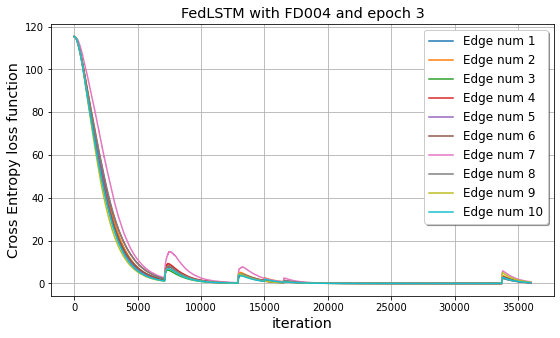

In [37]:
num_workers = 10
iteration_epoch = 3000
epoch = 3
fig, ax = plt.subplots()
fig.set_size_inches(9, 5)
cost_each_worker = np.zeros(shape=(num_workers, 4 * epoch *iteration_epoch))
for worker_i in range(num_workers):
    cost_each_worker[worker_i, :] = np.array(J[worker_i]).flatten()
    plt.plot(cost_each_worker[worker_i, :], label="Edge num " + str(worker_i+1))
plt.title("FedLSTM with FD004 and epoch 3", fontsize="x-large")
plt.ylabel("Cross Entropy loss function", fontsize="x-large")
plt.xlabel("iteration", fontsize="x-large")
plt.grid()
legened = plt.legend(shadow=True, fontsize='large')

dir_logdata_FD004_epoch_3: str = "H:\.1-Electrical_WorkSpace/Projects/Federated Learning on URL Estimation/Machin Learning/DML_Turbofan/Python/Notebook/Results/FedLSTM/FD004/Results/epoch_3/"    
plt.rcParams["savefig.directory"] = os.chdir(os.path.dirname(dir_logdata_FD004_epoch_3))
plt.savefig('J_FD004_Final_Cost_FedLSTM_itter_3000_alpha_004_epoch_03.eps', format='eps', dpi=1200, bbox_inches='tight')
plt.savefig('J_FD004_Final_Cost_FedLSTM_itter_3000_alpha_004_epoch_03.png', format='png', dpi=1200, bbox_inches='tight')

### Plot test models

C:\Users\alibei\AppData\Local\Temp/ipykernel_8068/2057827849.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig[i], ax[i] = plt.subplots()


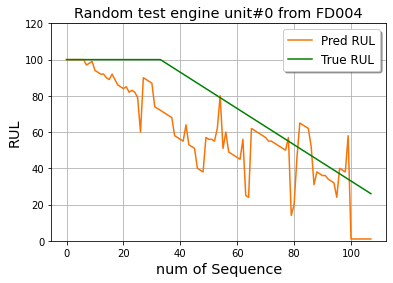

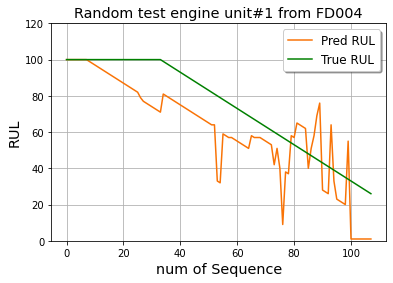

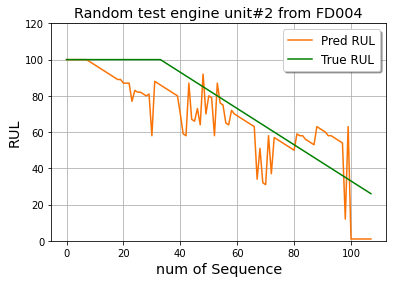

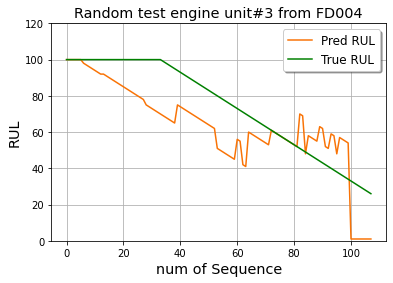

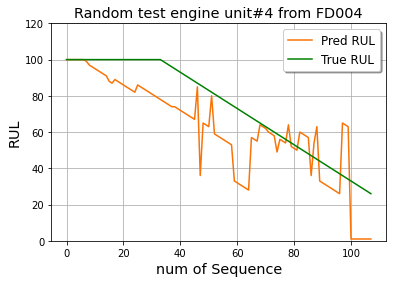

...

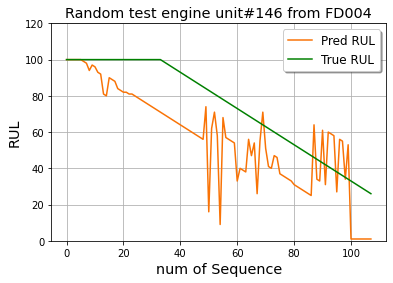

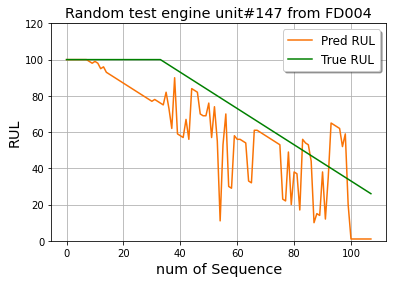

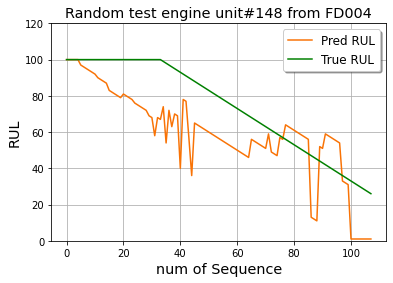

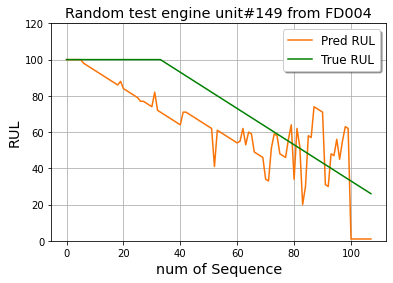

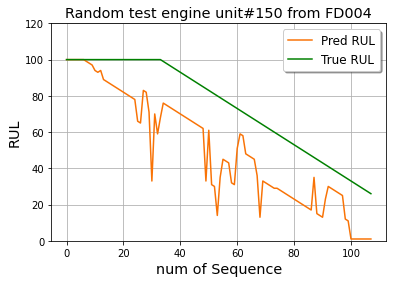

In [46]:
worker_test = LSTM()
fig={}
ax={}
for i in range(len(X_test)):
    Y_hat = worker_test.test_pred(X_test[i], array_params[0])
    fig[i], ax[i] = plt.subplots()
    ax[i].plot(Y_hat, label='Pred RUL', color='#F97306')
    ax[i].plot(Y_test[worker_i], label='True RUL', color='#008000')
    plt.title("Random test engine unit#" + str(i) + " from FD004", fontsize="x-large")
    plt.ylabel("RUL", fontsize="x-large")
    plt.ylim(0, 120)
    plt.xlabel("num of Sequence", fontsize="x-large")
    ax[i].grid()
    ax[i].legend(shadow=True, fontsize='large')
    #plt.rcParams["savefig.directory"] = os.chdir(os.path.dirname(dir_name_epoch_3))
    #plt.savefig("RUL_10Workers_Final_Cost_itter_3000_alpha_004_epoch_03"+str(worker_i)+".eps", format='eps', dpi=1200)
    #plt.savefig("RUL_10Workers_Final_Cost_itter_3000_alpha_004_epoch_03"+str(worker_i)+".png", format='png', dpi=1200)

In [47]:
# Save Specific figures
dir_name: str = "H:\.1-Electrical_WorkSpace/Projects/Federated Learning on URL Estimation/Machin Learning/DML_Turbofan/Python/Notebook/Results/FedLSTM/FD004/Results/epoch_3/"    
plt.rcParams["savefig.directory"] = os.chdir(os.path.dirname(dir_name))
fig[39].savefig("FD004 RUL prediction with FedLSTM and epoch 3 for machine number_" + str(39) + ".eps", format='eps', dpi=1200, bbox_inches='tight')
fig[39].savefig("FD004 RUL prediction with FedLSTM and epoch 3 for machine number_" + str(39) + ".png", format='png', dpi=1200, bbox_inches='tight')


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


### RMSE and SCORE

[35.51269298]


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


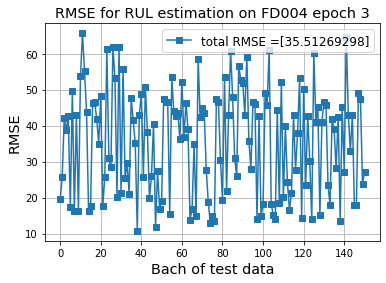

In [44]:
# RMSE and Scoring factor epoch 3
def rmse(predictions, targets):
    return np.sqrt(((predictions - targets) ** 2).mean())


RMSE = np.zeros(shape=(len(X_test),1))


for worker_i in range(len(X_test)):
    Y_hat = worker_test.test_pred(X_test[worker_i], array_params[0])
    RMSE[worker_i] = rmse(Y_hat, Y_test[worker_i])

fig, ax = plt.subplots()
plt.plot(RMSE, label='RMSE', marker = 's')
plt.title("RMSE for RUL estimation on FD004 epoch 3", fontsize="x-large")
plt.ylabel("RMSE", fontsize="x-large")
plt.xlabel("Bach of test data", fontsize="x-large")
plt.grid()

RMSE_epoch_3 = np.sum(RMSE, axis=0)/len(X_test)
labels = []
labels.append("total RMSE ="+str(RMSE_epoch_3))

plt.legend(labels, loc='best', fontsize='large')


print(RMSE_epoch_3)
dir_name: str = "H:\.1-Electrical_WorkSpace/Projects/Federated Learning on URL Estimation/Machin Learning/DML_Turbofan/Python/Notebook/Results/FedLSTM/FD004/Results/epoch_3/"    
plt.rcParams["savefig.directory"] = os.chdir(os.path.dirname(dir_name))
plt.savefig("RMSE for RUL estimation FedLSTM on test dataset FD004 epoch 3.eps", format='eps', dpi=1200, bbox_inches='tight')
plt.savefig("RMSE for RUL estimation FedLSTM on test dataset FD004 epoch 3.png", format='png', dpi=1200, bbox_inches='tight')

[-12.93354931 -60.98837911 -82.42977376 -87.47103729 -85.91632273
  -8.0906989  -87.77645429 115.92813865 -87.64810137 616.4131257
 -86.26707466 -92.63560901 -89.0582269  -83.25193601 271.52876341
  30.49452597 -86.70142738 741.78228608 -85.54086947 -80.46231035
 -86.92063864 814.58810424 -67.9318273  -86.75229132 -78.38802721
 -67.66639738 -88.3457789  -90.68223126  84.04843817 -83.14000283
 -38.36915066 -89.55079733 -50.65958848 -77.33715785 -69.40227811
 -90.36833085 -82.565438   -84.80104365 197.5712442  -86.63751688
 -85.39728731 -69.96011576 -87.17149566 -87.17459622 562.51402378
 -60.39967413 -84.35784356 159.59588817 -49.58695726 -23.57935712
  88.25598184 -89.43445554 -83.14587078 -91.31128995 405.59729513
 -85.50074567 -81.06970399 -85.41940089 -84.17095067 -86.02673922
 -85.60509307 -78.33027501 -87.26003007 -73.76851209 501.65735268
 347.42105384 -79.18524727 388.6978021  -85.90323507 -84.2134288
 -85.91762339 -83.03802315   0.97585054 703.29153508 -16.1429452
 236.88218241

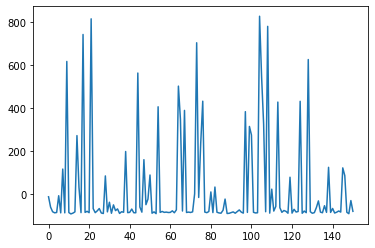

In [49]:
def each_score(predictions, targets):
    tmp = np.zeros(shape=(1, len(predictions)))
    for i in range(len(predictions)):
        Yi = predictions[i] - targets[i]
        if Yi >= 0:
            tmp[:, i] = (np.exp(Yi/10)-1)   
        else:
            tmp[:, i] = np.exp(Yi/13)-1
    return tmp
    
SCORE = np.zeros(shape=(len(X_test), X_test[0].shape[0]))

for worker_i in range(len(X_test)):
    Y_hat = worker_test.test_pred(X_test[worker_i], array_params[0])
    SCORE[worker_i, :] = each_score(Y_hat, Y_test[worker_i])
    
print(np.sum(SCORE, axis=1))
plt.plot(np.sum(SCORE, axis=1))
print("Final value for SCORE:",np.sum(SCORE)/len(X_test))

## Load Cost functions and Parameters

In [101]:
import numpy as np
import pickle
# from model import *

# Import libraries
from random import uniform
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

import time
import math
import sys
import random

dir_logdata_FD004_epoch_3: str = "H:\.1-Electrical_WorkSpace/Projects/Federated Learning on URL Estimation/Machin Learning/DML_Turbofan/Python/Notebook/Results/FedLSTM/FD004/LogData/epoch_3/ "    
# Load cost from a PKL file
a_file = open(dir_logdata_FD004_epoch_3 + "J_10Workers_Final_Cost_FedLSTM_itter_3000_alpha_004_epoch_03.pkl", "rb")
J = pickle.load(a_file)
a_file.close()

# Load params data from a PKL file
a_file = open(dir_logdata_FD004_epoch_3 + "array_params_10Workers_Final_Cost_FedLSTM_itter_3000_alpha_004_epoch_03.pkl", "rb")
array_params = pickle.load(a_file)
print(array_params)
a_file.close()

[{'Wf': array([[-0.18564977,  0.0322141 , -0.04818845, ..., -0.12048841,
         0.09804777,  0.05325   ],
       [-0.06109197,  0.09811411, -0.04168961, ...,  0.08114126,
         0.08047905,  0.05512676],
       [-0.12158022, -0.13627538, -0.17668155, ..., -0.20193493,
         0.20272957,  0.12999881],
       ...,
       [ 0.01255876,  0.16984161,  0.03624951, ..., -0.08108413,
         0.04121908,  0.00478767],
       [ 0.02036318,  0.06390896, -0.02934949, ...,  0.06846599,
         0.09238949,  0.08252651],
       [ 0.04791726,  0.01360442, -0.01159031, ...,  0.07645322,
         0.05202115,  0.05020851]]), 'bf': array([[1.05032015],
       [1.08373612],
       [1.08920687],
       [1.02828693],
       [1.0825476 ],
       [1.14573225],
       [1.04020056],
       [1.06803859],
       [1.07327751],
       [1.0113719 ],
       [1.0307025 ],
       [1.02641318],
       [1.07471422],
       [1.07047969],
       [1.10095669],
       [1.0111647 ],
       [1.06367949],
       [1.00765